In [1]:
# TODO
# FIX FIGURE: SPONTANEOUS SW WHEN KF IS INHIBITED ()
# Smaller in normal regime

In [8]:
import numpy as np
np.set_printoptions(suppress = True)
import reading_experimental_data
from matplotlib import pyplot as plt
import pickle
from copy import deepcopy
from scipy.signal import savgol_filter
import pandas as pd
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from sklearn.covariance import EllipticEnvelope as EE
import numpy.ma as ma
from sklearn import linear_model, datasets

In [5]:
# cut the signal to disregard tail

In [7]:
def find_spikes(data):
    inds_above_threshold = []
    for n in range(data.shape[-1]):
        if data[n] > -4.5:
            inds_above_threshold.append(n)
    spikes_start = []
    spikes_start.append(inds_above_threshold[0])
    spikes_end = []
    i = 1
    while i < len(inds_above_threshold):
        if (inds_above_threshold[i] - inds_above_threshold[i-1]) > 3:
            spikes_end.append(inds_above_threshold[i-1])
            spikes_start.append(inds_above_threshold[i])
            
        i = i + 1
    spikes_end.append(inds_above_threshold[i-1])
    return np.array(spikes_start), np.array(spikes_end)

stim  = pickle.load(open(f'../../data/sln_prc/2019-09-04_t1_1/100_ADC1.pkl','rb+'))
spikes_start, spikes_end = find_spikes(stim)


FileNotFoundError: [Errno 2] No such file or directory: '../data/sln_prc/2019-09-04_t1_1/100_ADC1.pkl'

In [4]:
def remove_spikes(rec, spikes_start, spikes_end):
    filtered_data = deepcopy(rec)
    for i in range(len(spikes_end)):
        t1 = spikes_start[i]-1
        t2 = spikes_end[i]+1
        filtered_data[t1:np.minimum(t2,rec.shape[-1])] = (filtered_data[t1] + filtered_data[t2-1])/2# + np.minimum(t2,rec.shape[-1]))/2
    return filtered_data

In [6]:
import scipy
import sys  
from scipy import signal
from scipy import pi
from scipy.io.wavfile import write
import matplotlib.pyplot as plt
import numpy as np    
from scipy.signal import butter, lfilter, freqz   


# ----- ----- ----- -----    
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y

In [7]:
#Putting all the preprocessing together

In [7]:
# list of files
import os
import re

folders_all = os.listdir('../../data')
folders = []
for i, folder in enumerate(folders_all):
    m = re.search("t[0-9]_1$", str(folder))
    if m is not None:
        folders.append(folder)

2019-08-22_t6_1


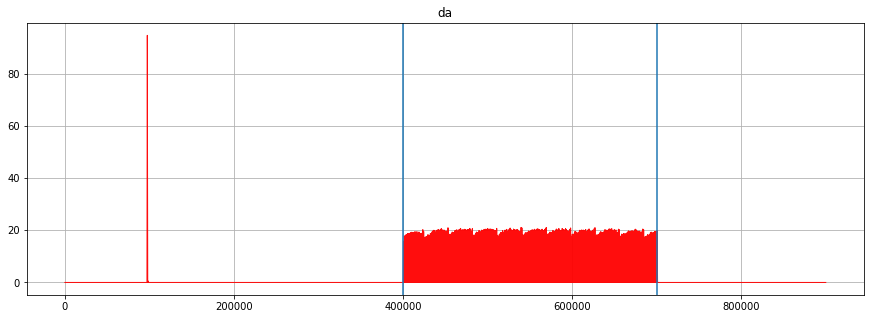

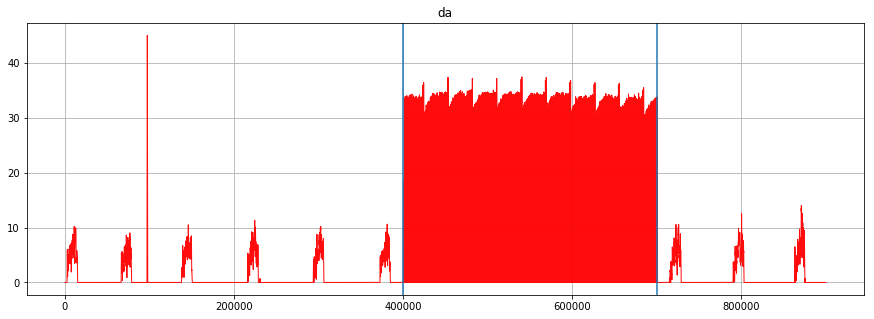

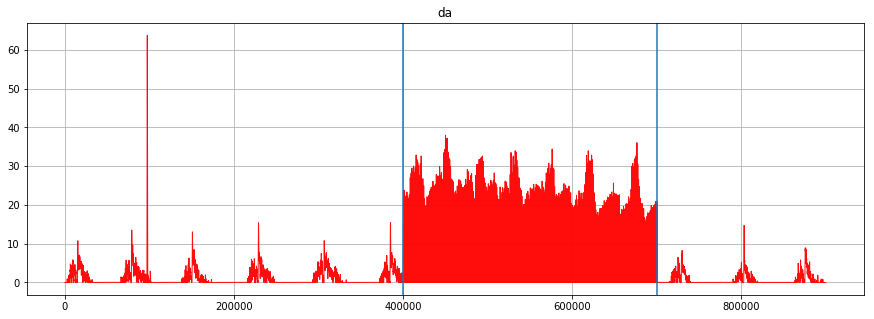

2019-09-04_t8_1


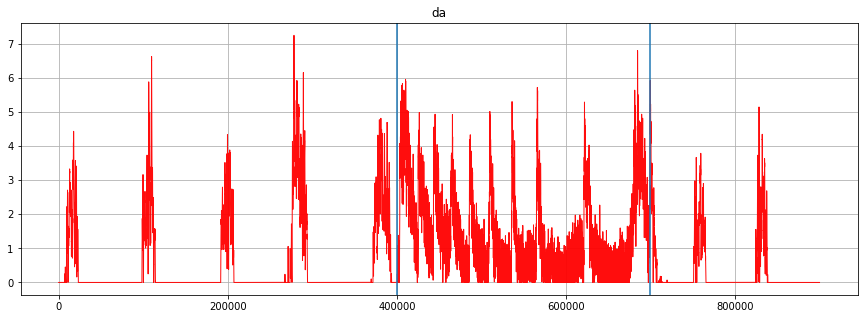

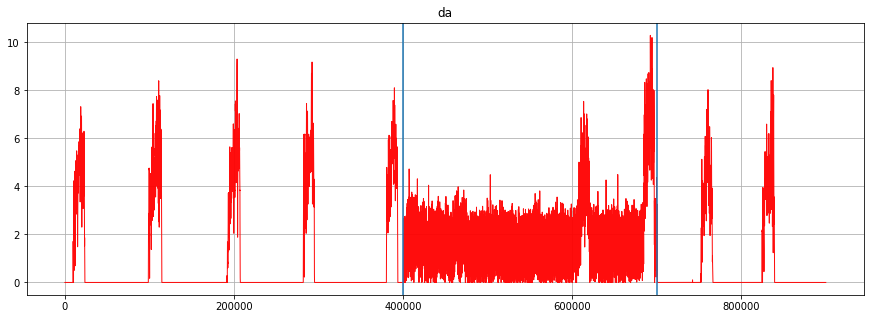

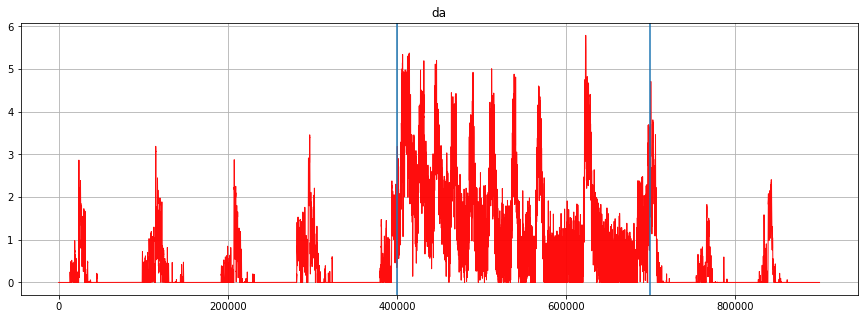

2019-08-22_t4_1


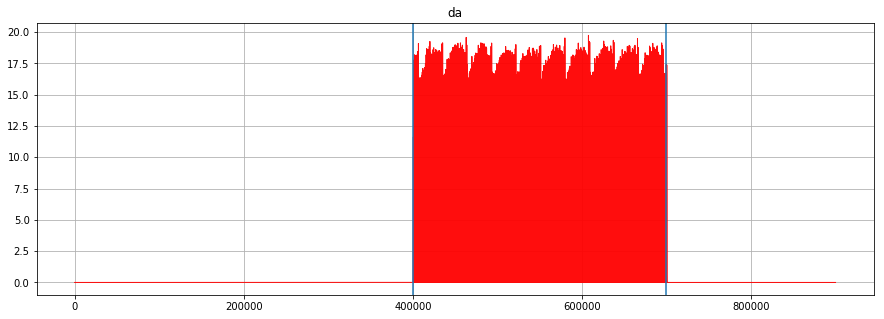

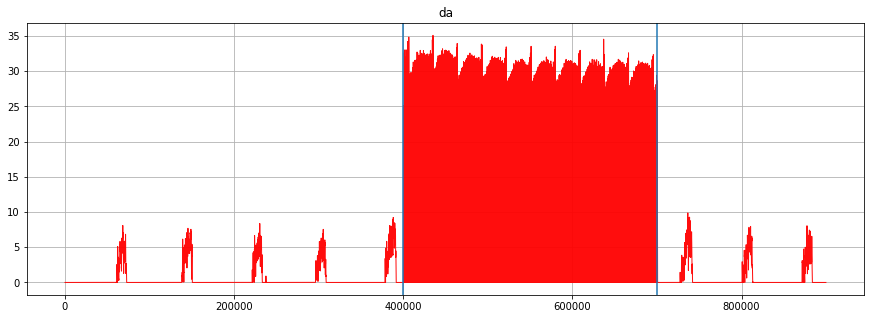

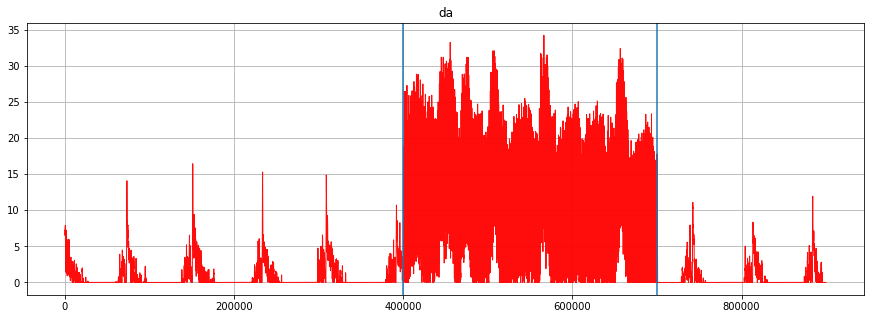

2019-09-05_t3_1


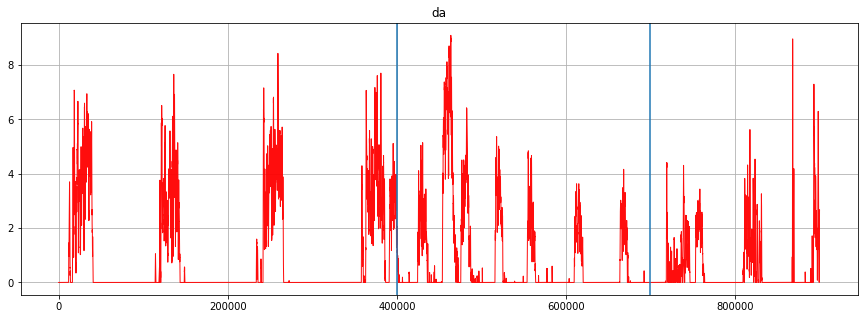

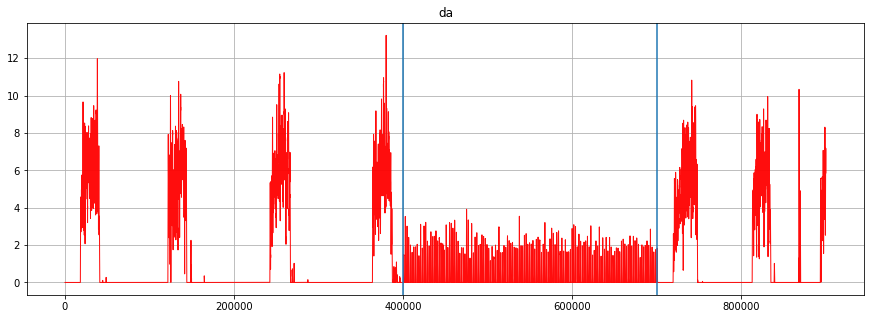

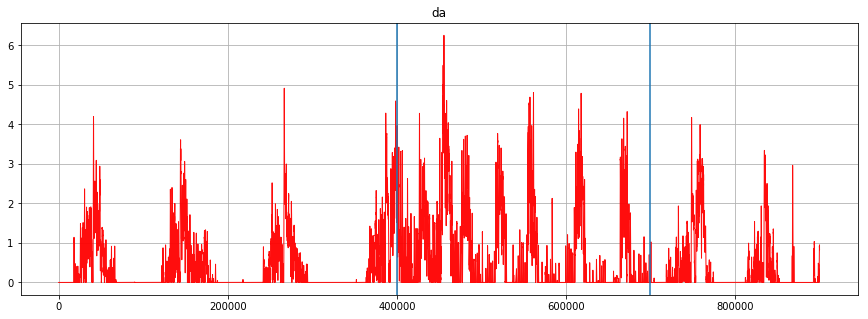

2019-08-22_t2_1


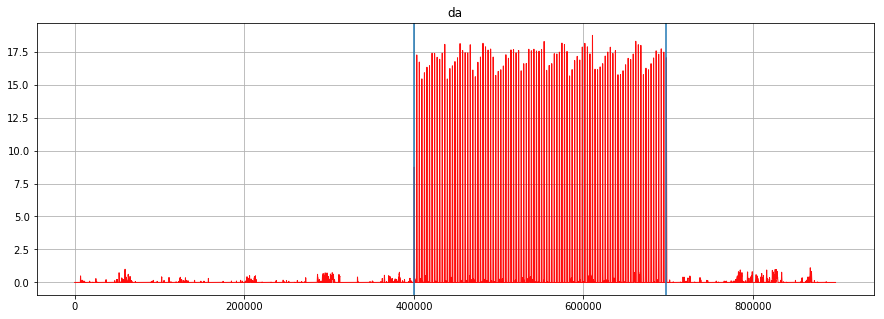

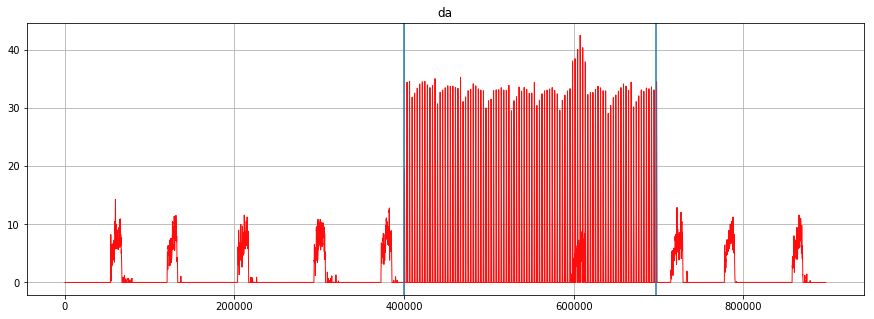

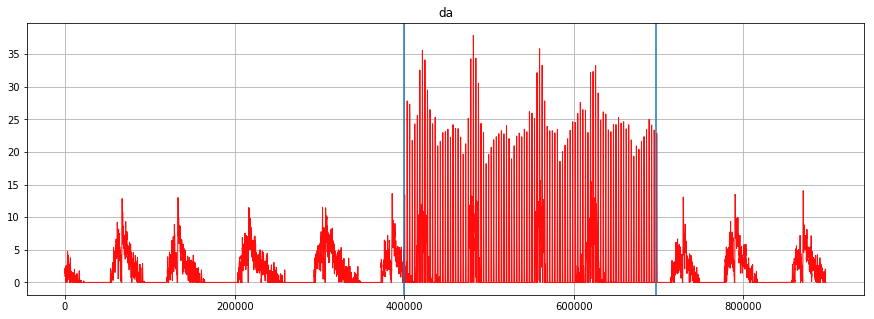

2019-09-05_t7_1


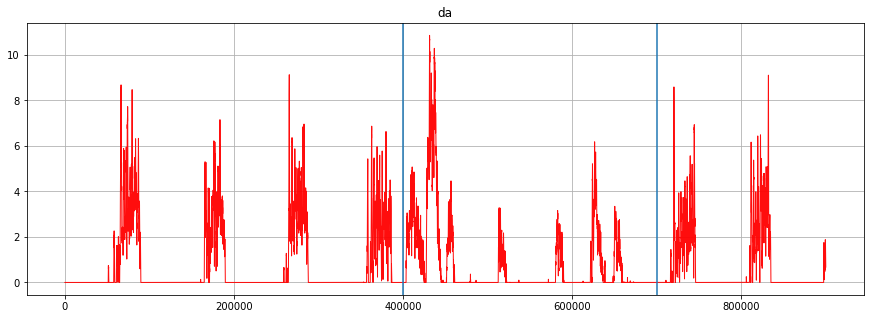

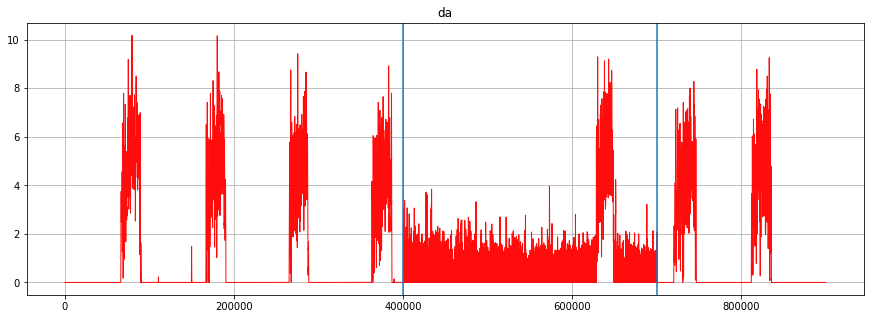

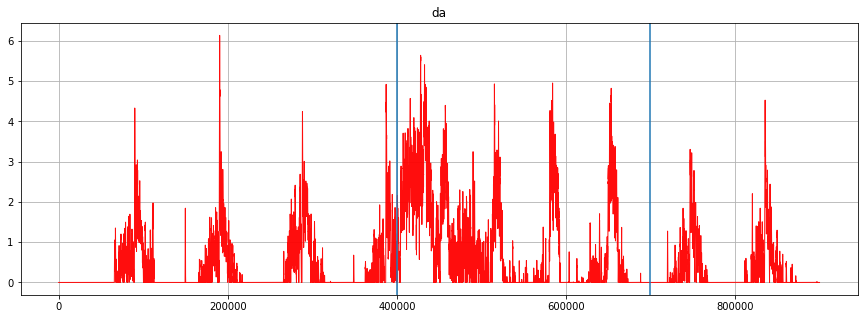

2019-09-04_t3_1


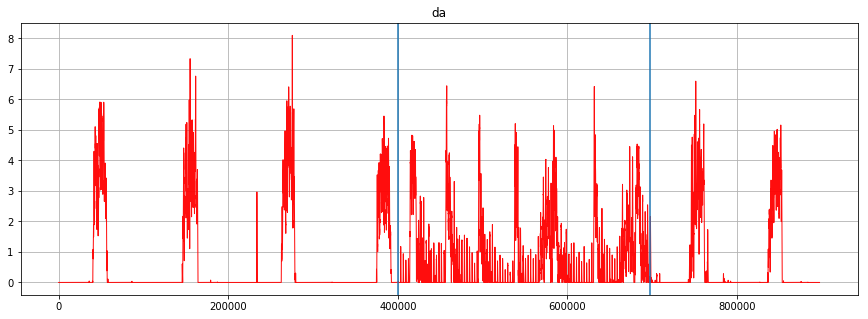

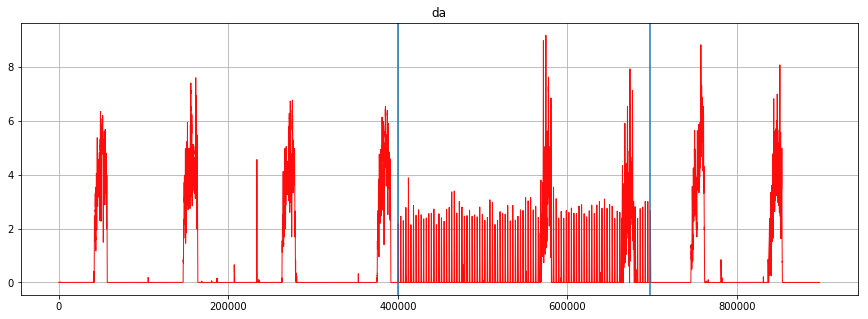

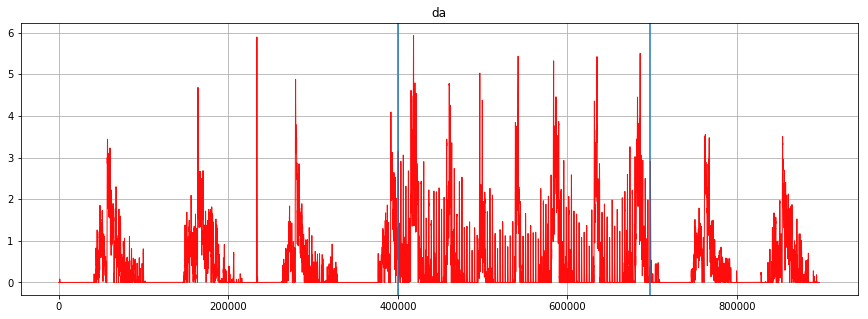

2019-09-03_t5_1


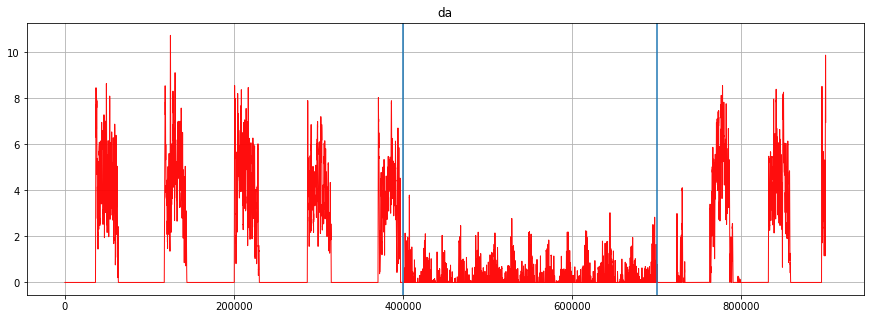

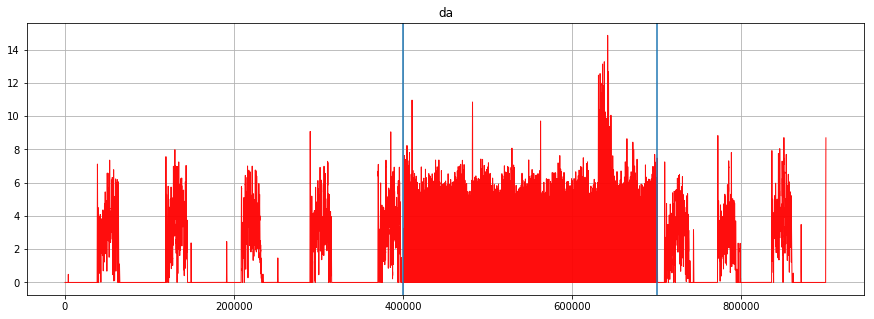

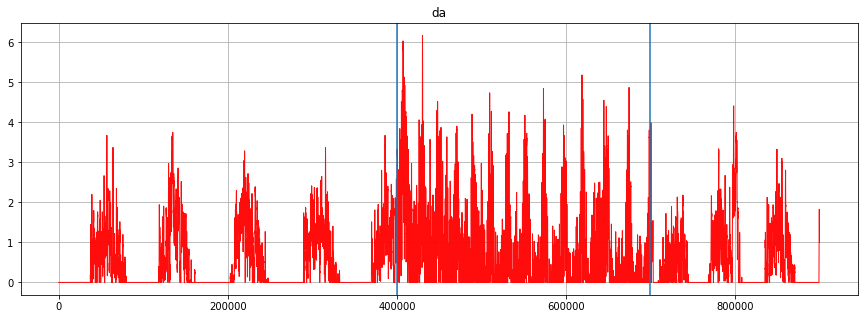

2019-09-05_t4_1


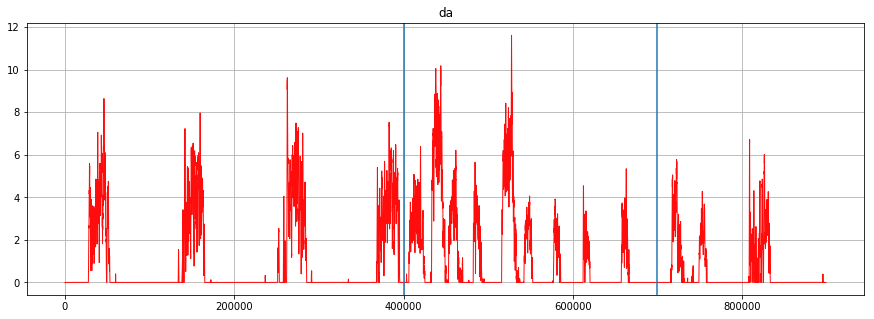

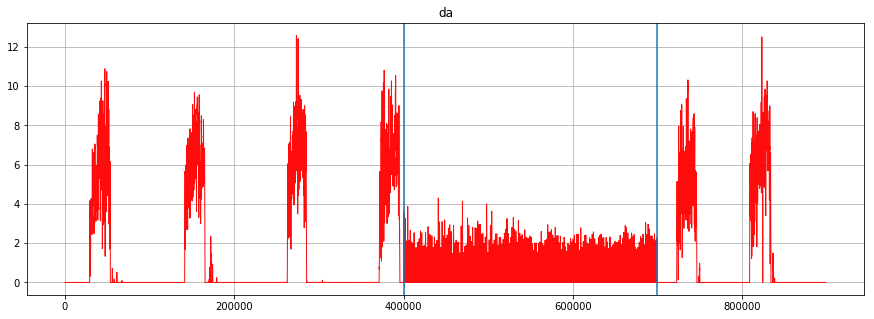

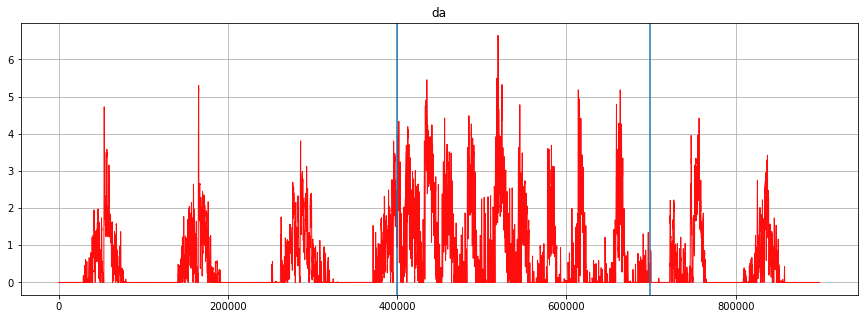

2019-09-04_t6_1


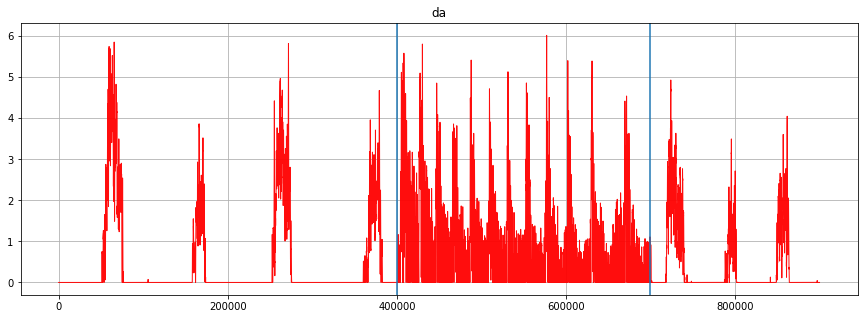

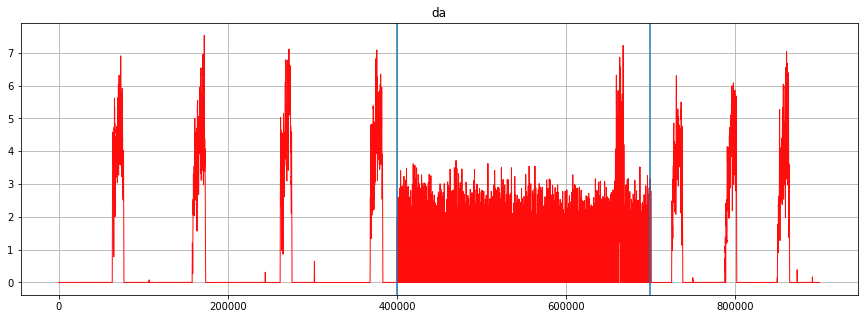

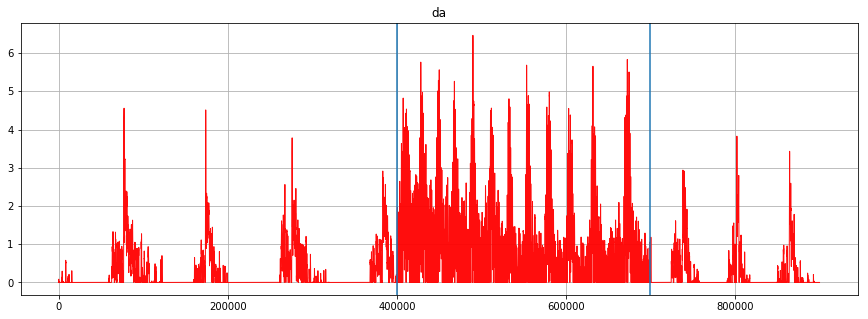

2019-09-04_t4_1


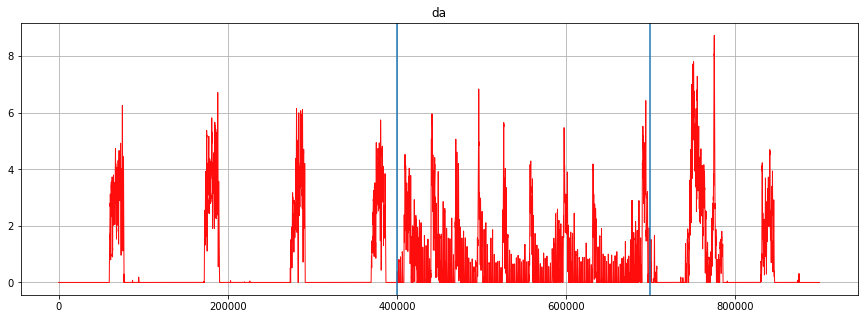

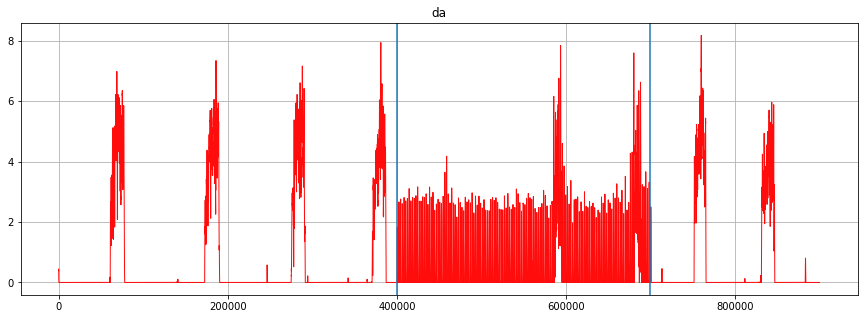

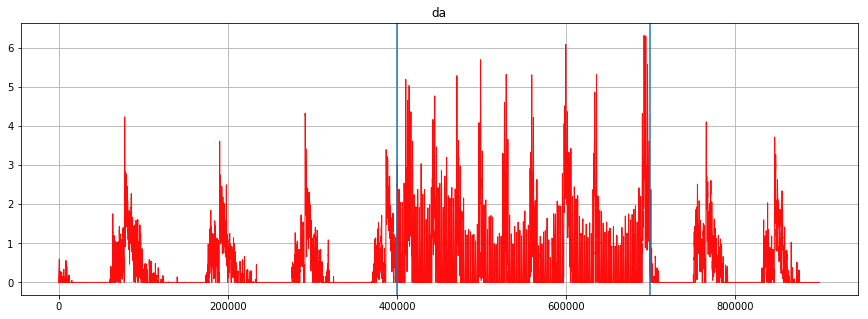

2019-09-05_t1_1


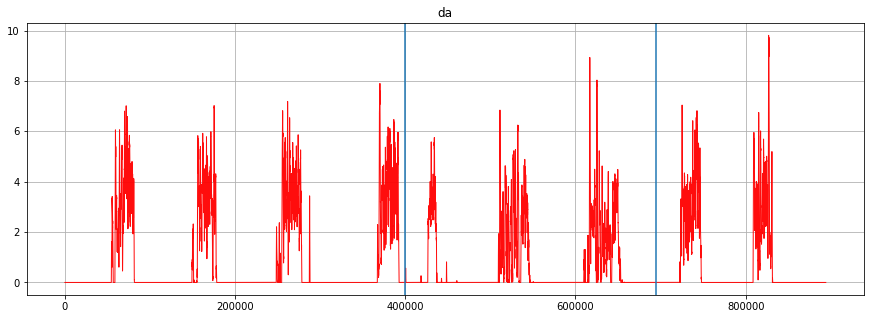

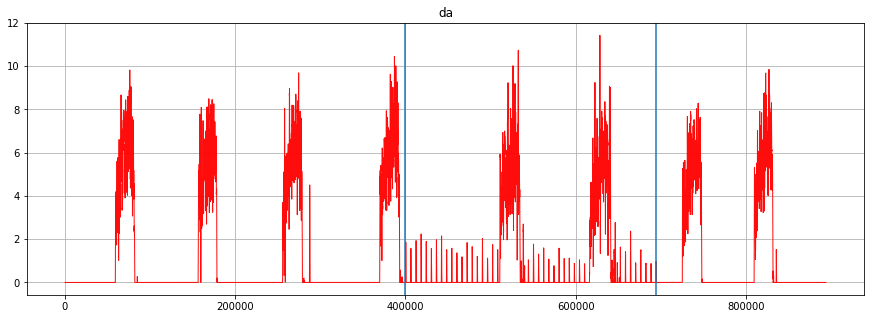

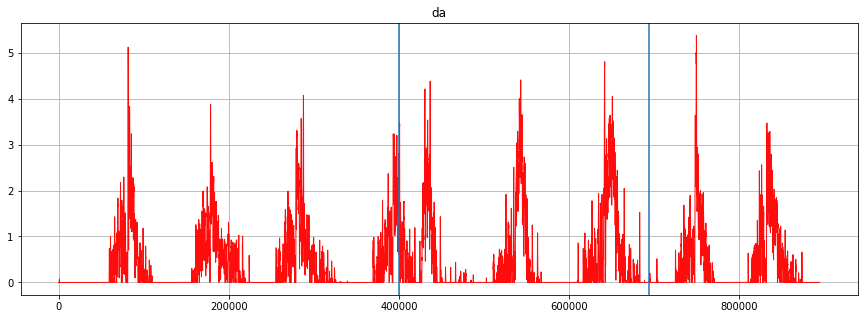

2019-09-05_t5_1


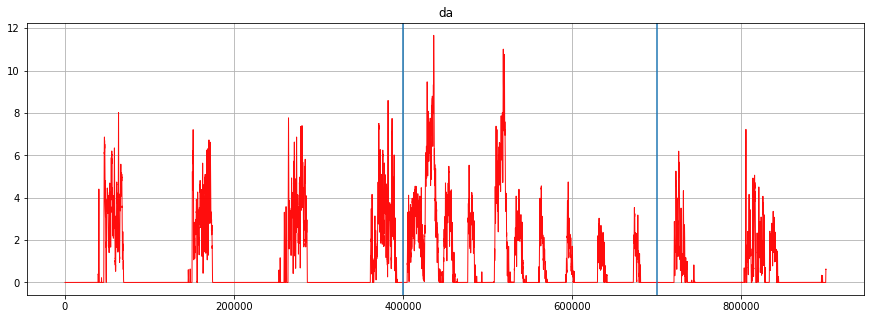

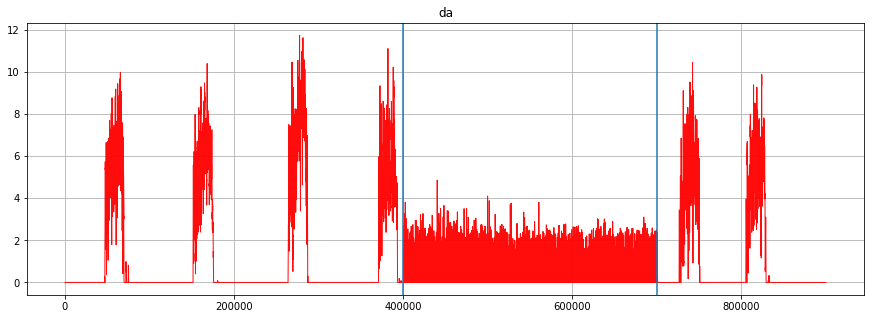

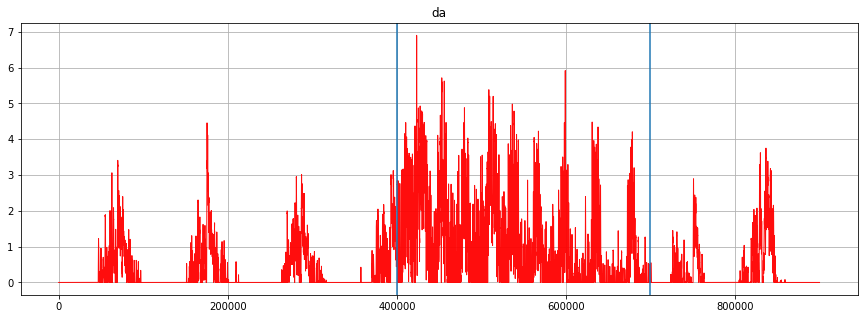

2019-09-05_t2_1


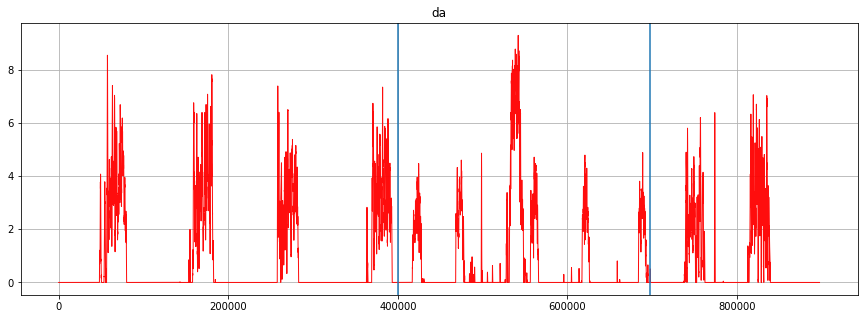

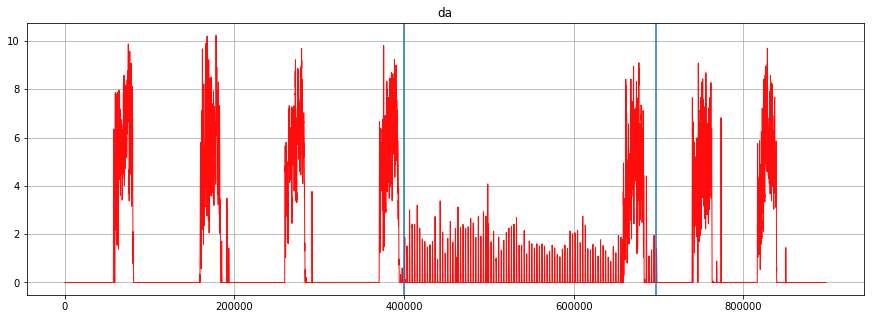

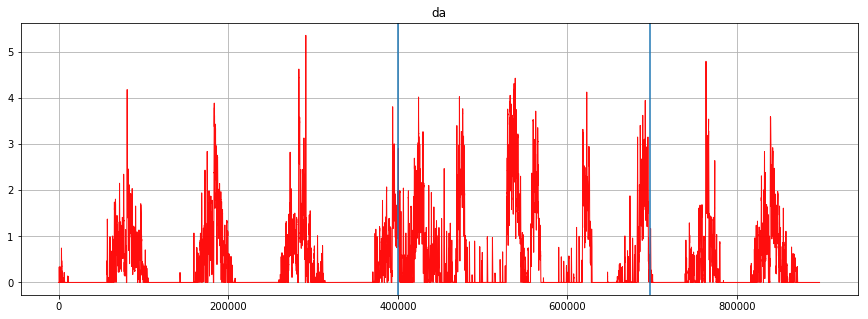

2019-09-05_t6_1


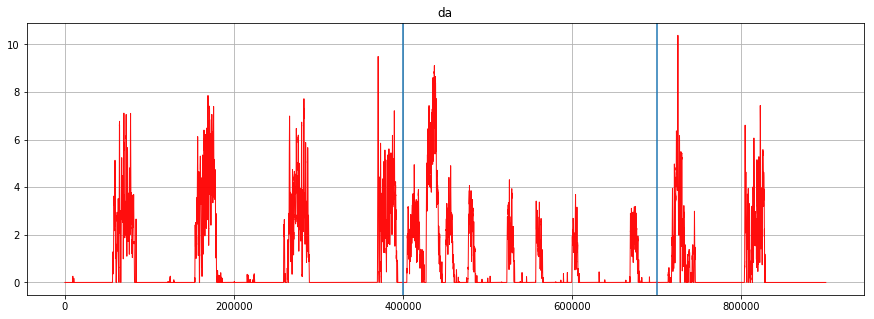

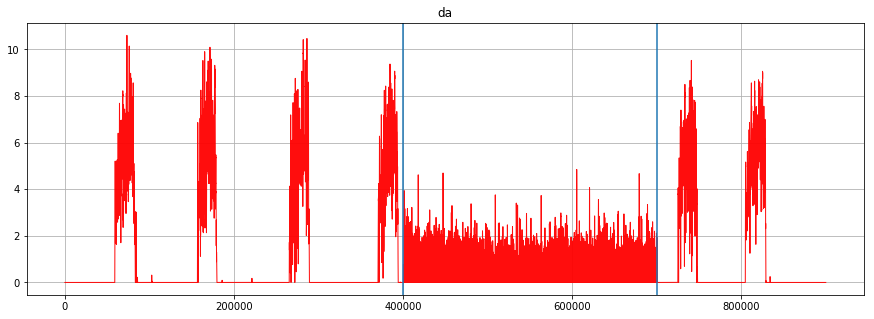

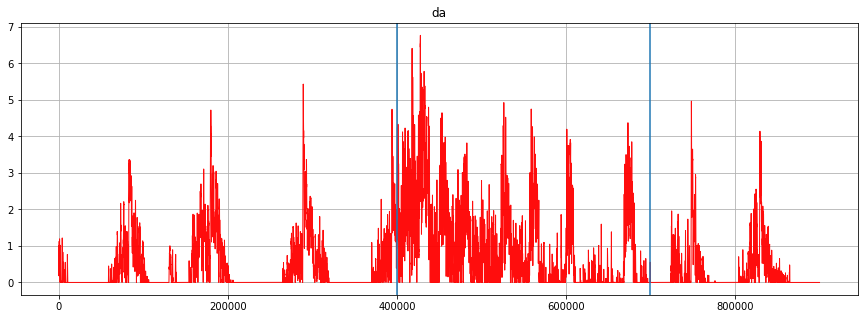

2019-09-03_t4_1


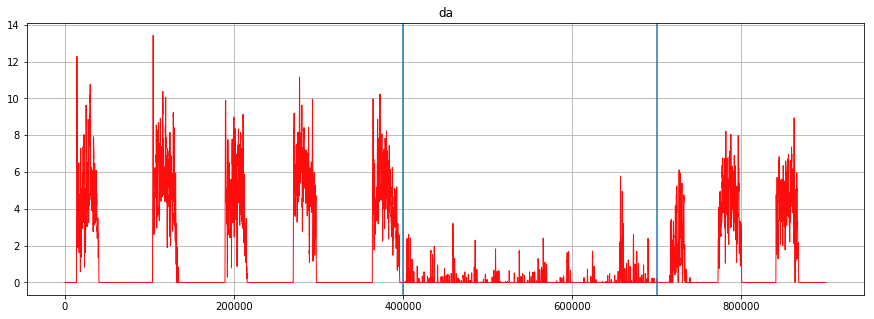

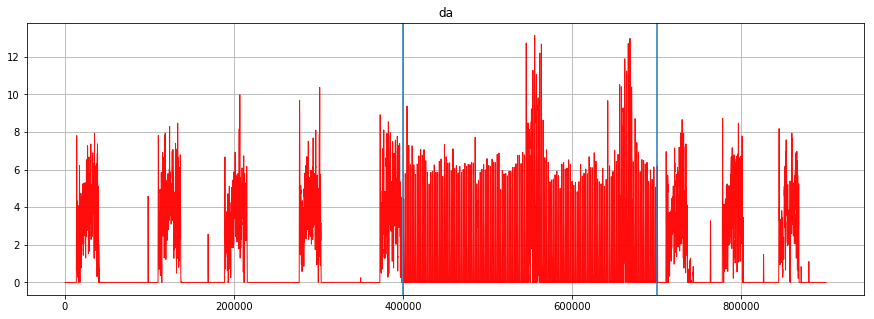

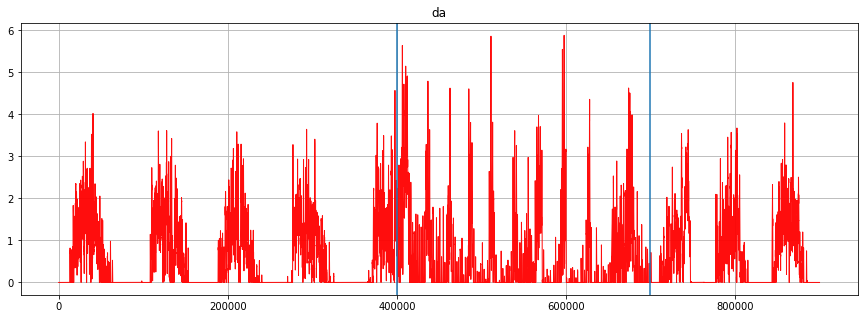

2019-09-03_t1_1


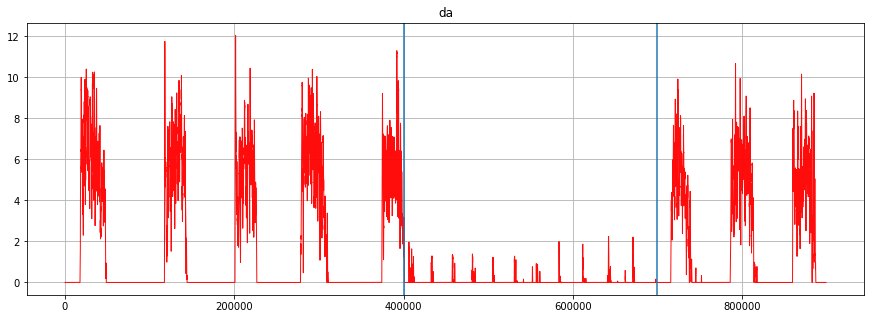

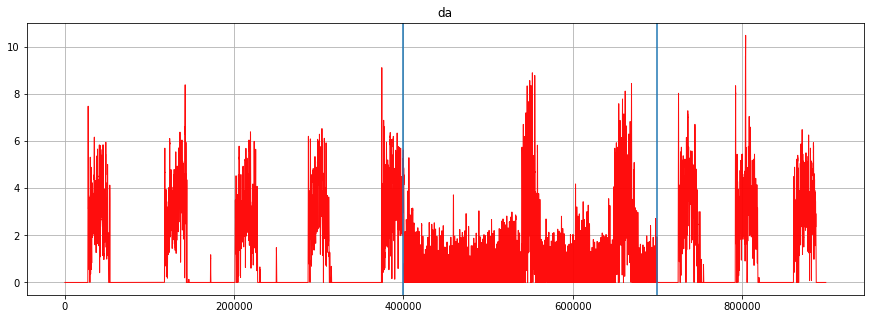

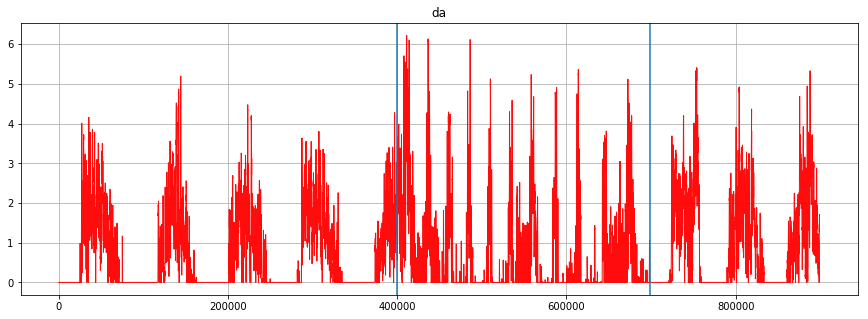

2019-08-22_t1_1


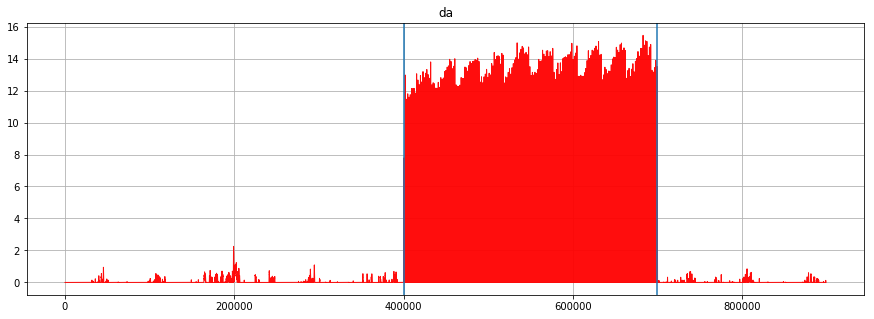

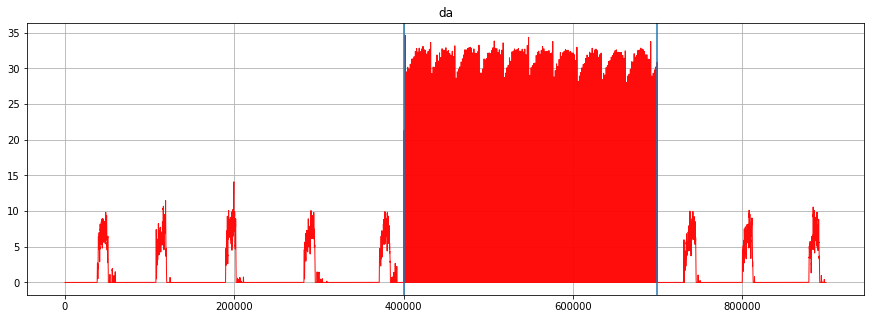

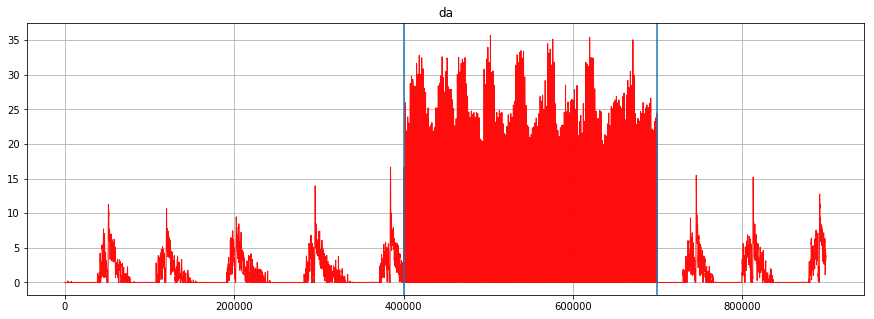

2019-08-22_t3_1


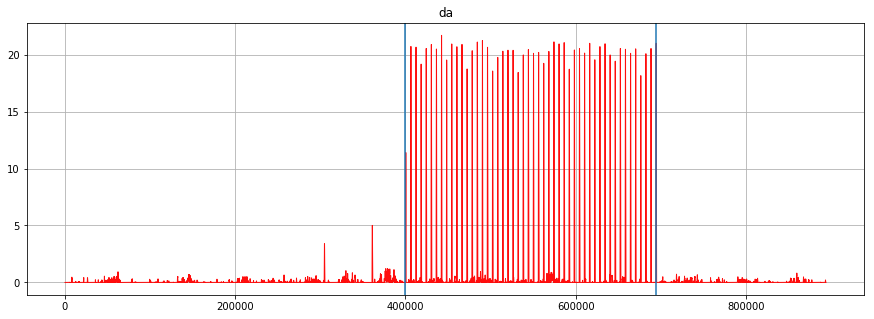

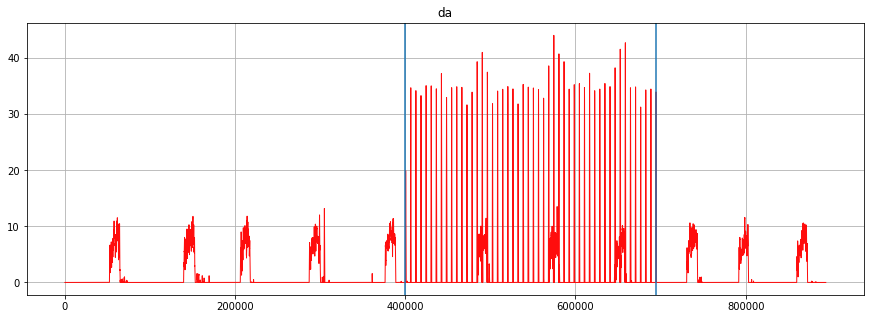

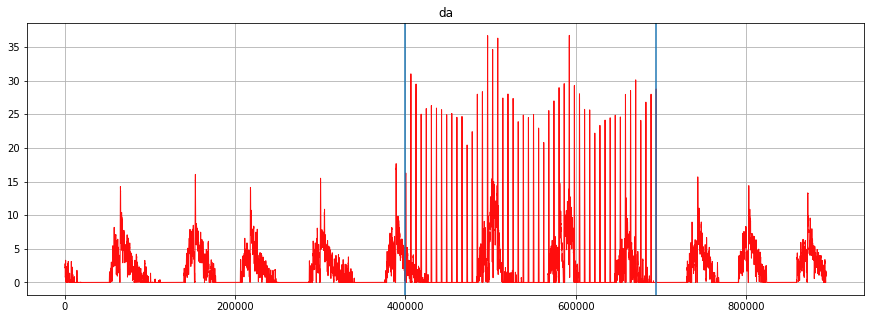

2019-08-22_t7_1


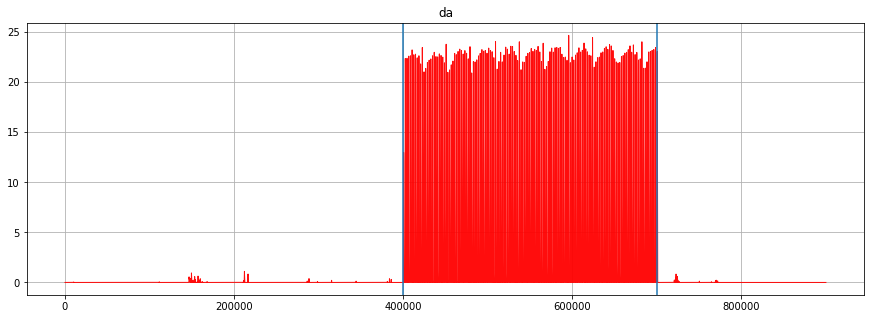

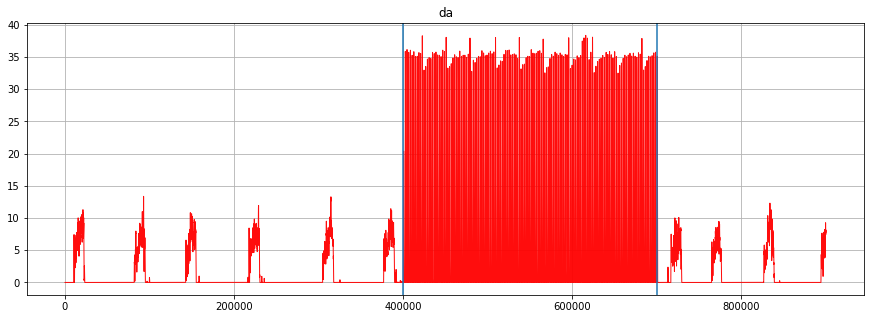

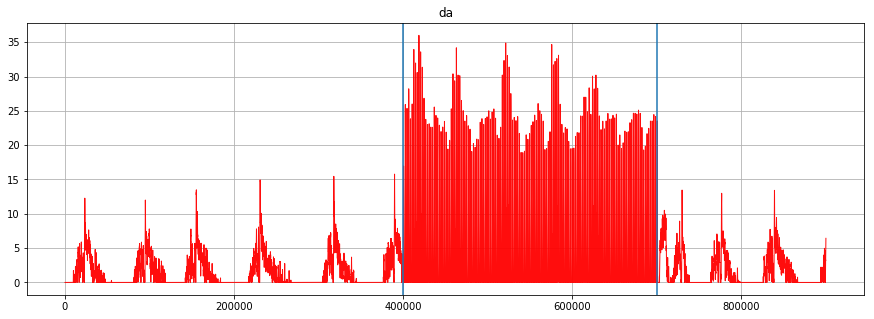

2019-09-03_t6_1


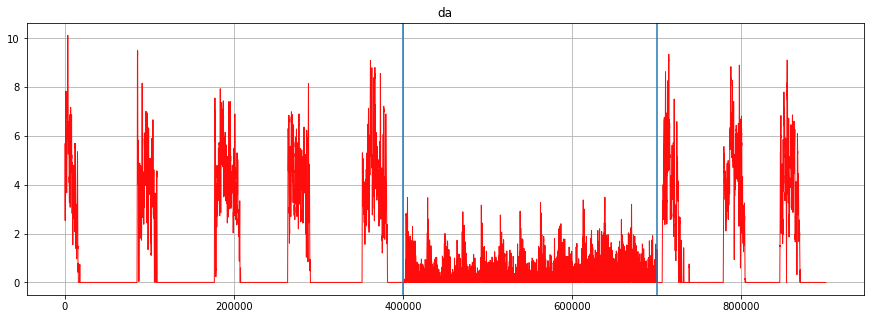

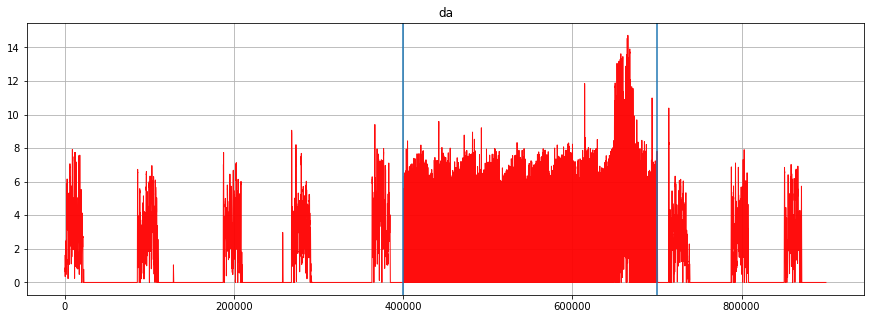

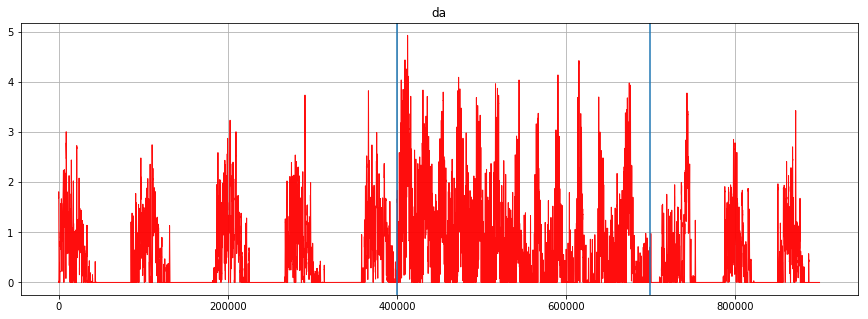

2019-09-04_t1_1


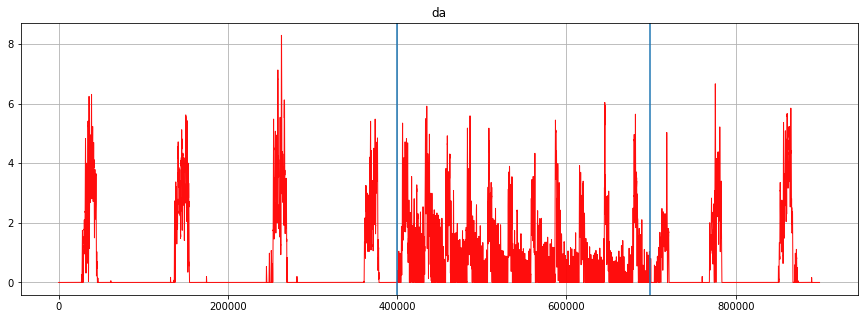

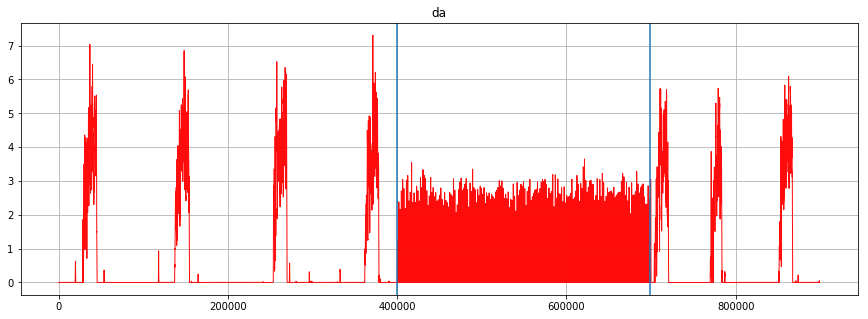

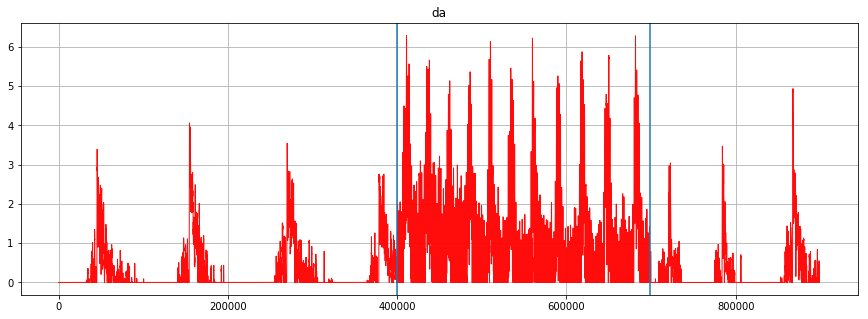

2019-09-04_t7_1


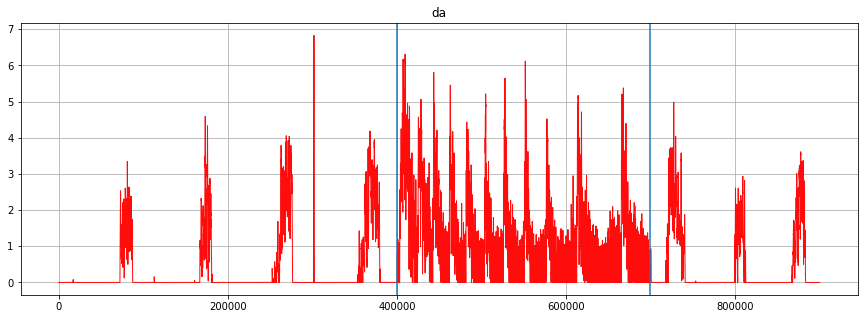

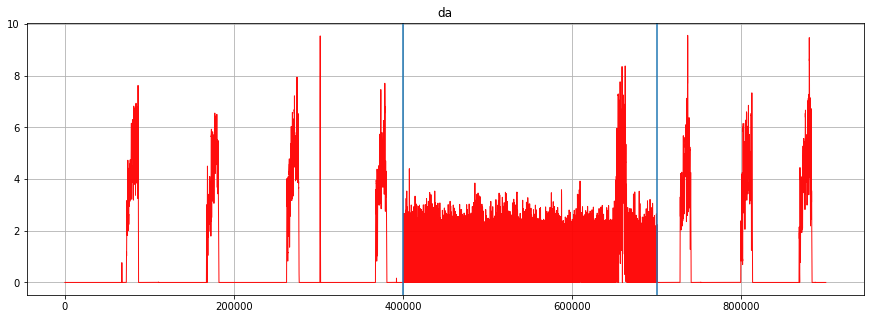

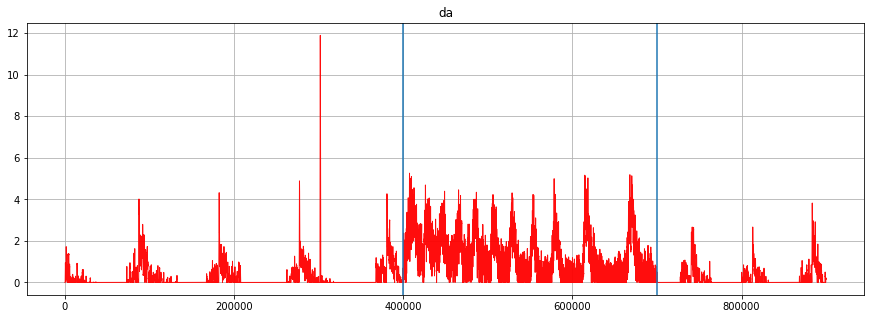

2019-08-22_t8_1


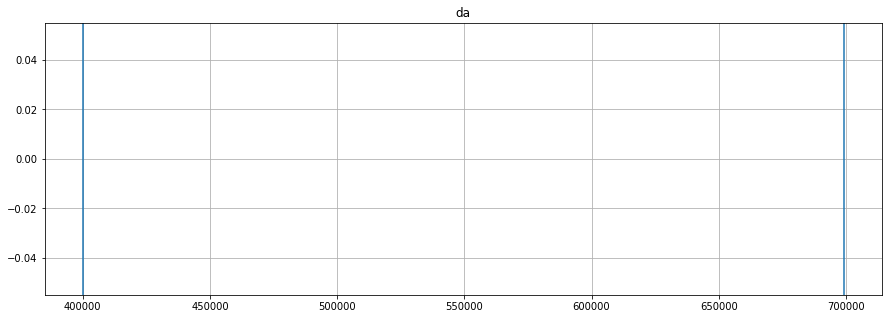

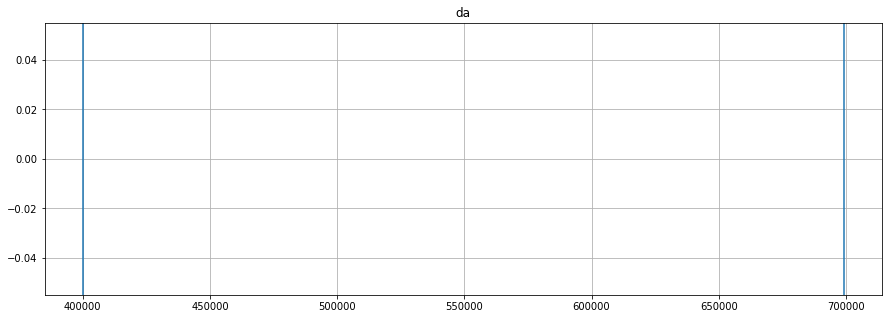

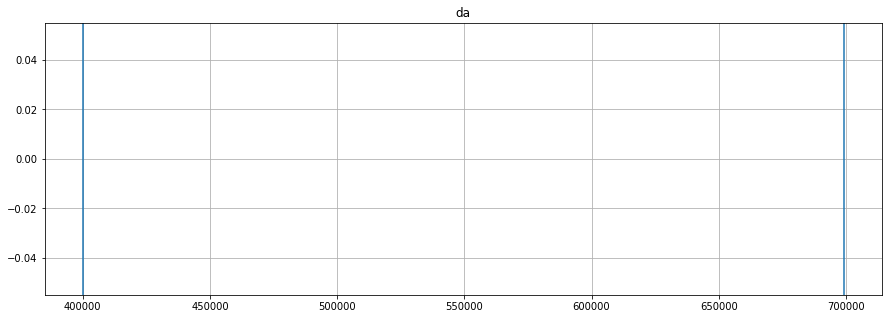

2019-09-03_t3_1


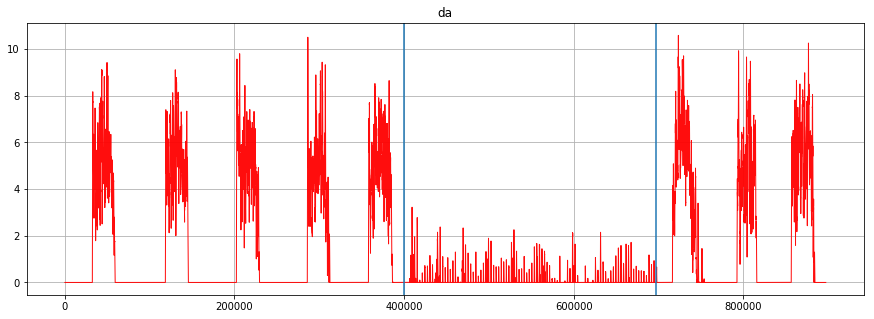

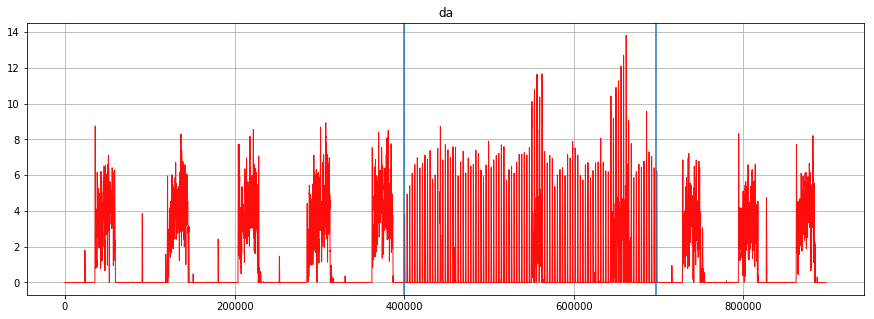

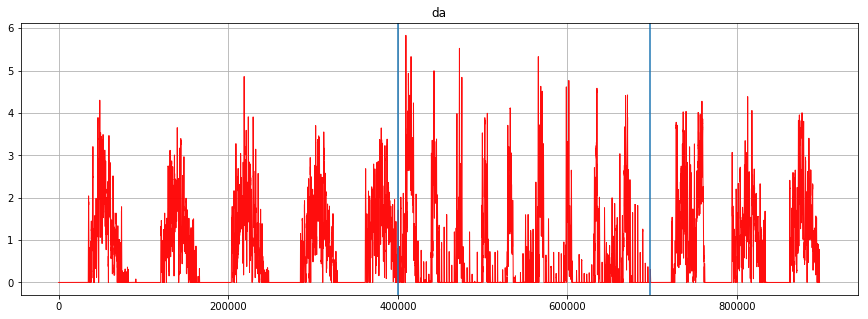

2019-09-04_t5_1


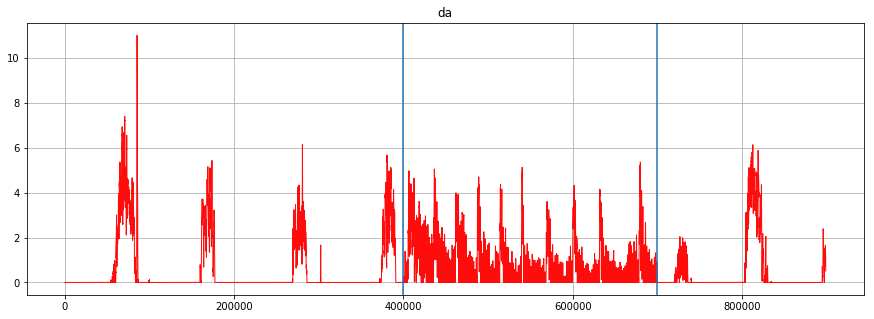

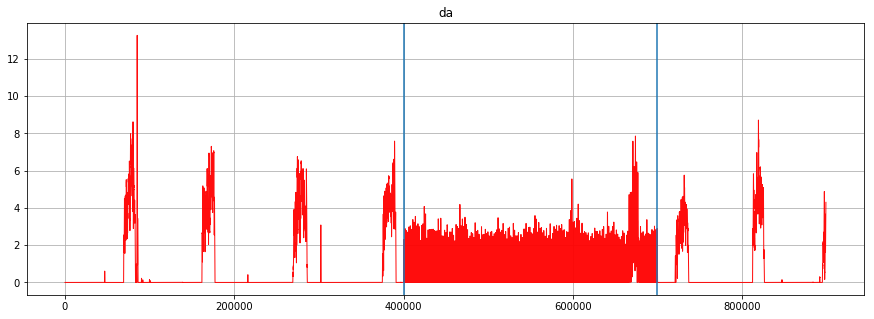

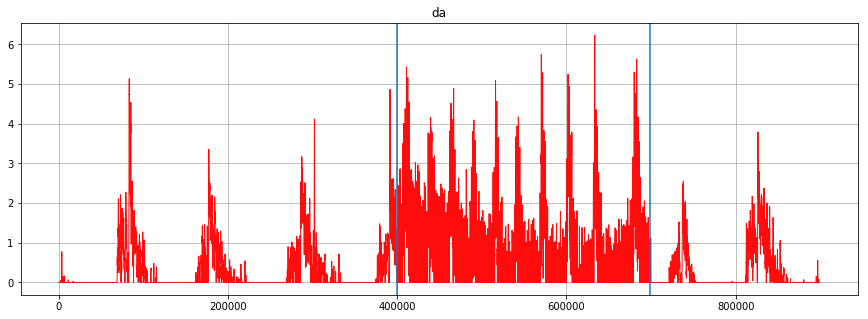

2019-09-04_t2_1


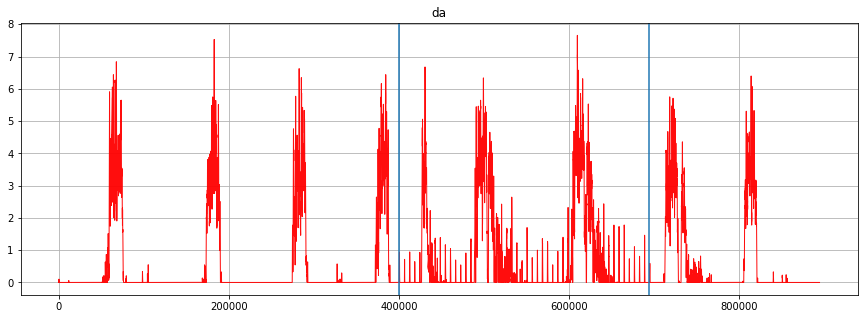

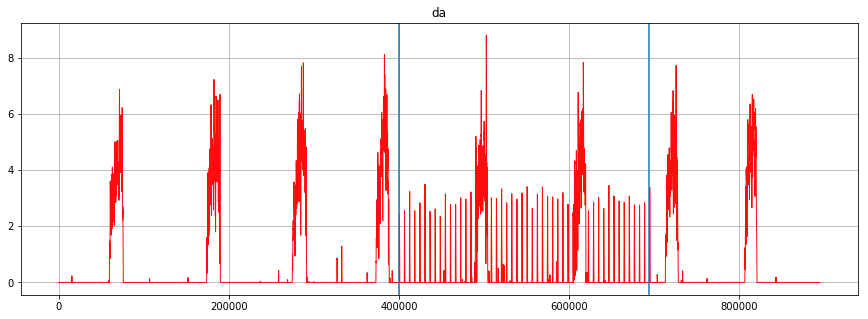

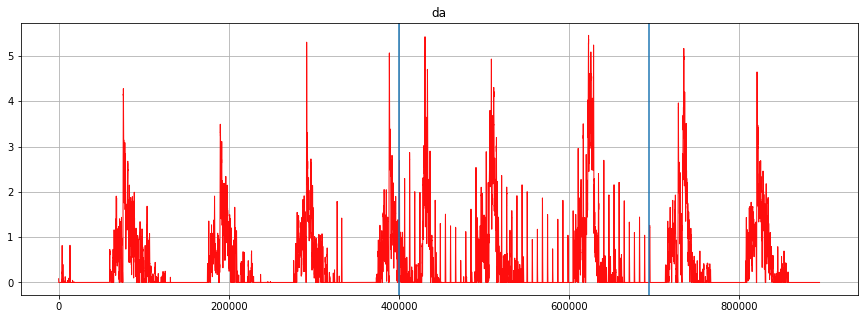

2019-09-03_t2_1


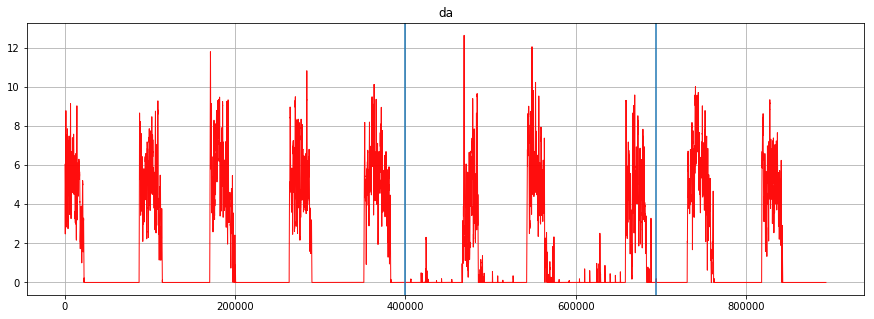

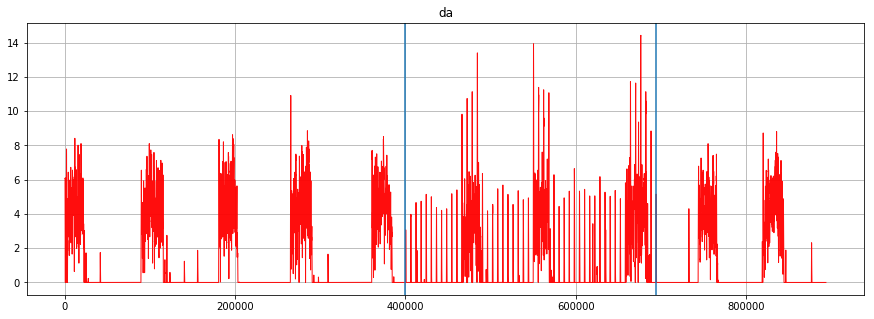

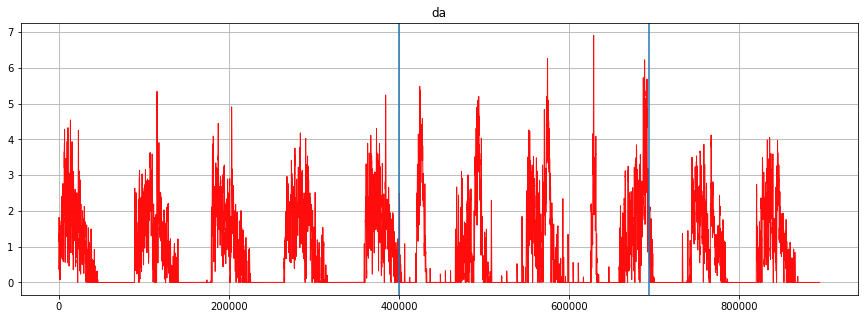

2019-08-22_t5_1


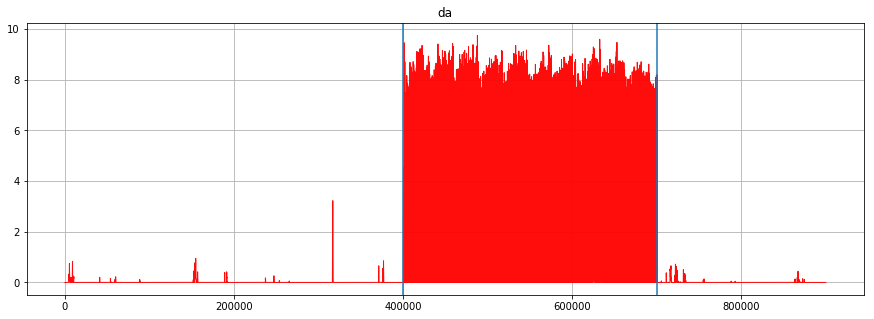

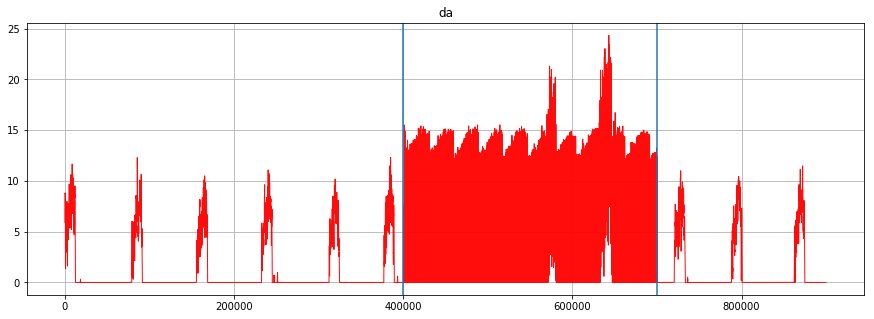

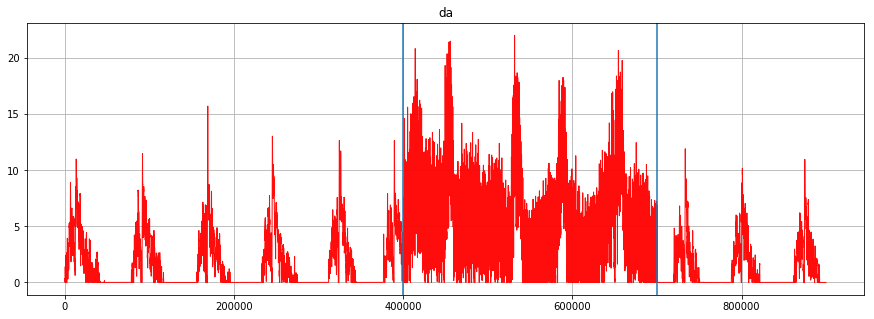

In [9]:
# first level processing
suffixes = ['CH5','CH10','CH15']
q = 0.95
n = 0.8
# folders = ['2019-09-04_t1_1']
u = 1000
conv_window = np.array([q**i for i in np.arange(1,u)[::-1]])/(np.sum(np.array([q**i for i in np.arange(1,u)])))
for folder in folders:
    print(folder)
    stim = pickle.load(open(f'../../data/{folder}/100_ADC1.pkl','rb+'))
    l = stim.shape[-1]
    stim = deepcopy(stim[:int(n*l)])
    spikes_start, spikes_end = find_spikes(stim)
    for suffix in suffixes:
        rec = pickle.load(open(f'../../data/{folder}/100_{suffix}.pkl','rb+'))[:int(n*l)]
        processed_signal = remove_spikes(rec, spikes_start, spikes_end)
        processed_signal = butter_highpass_filter(processed_signal, 300, 33000)
        processed_signal = np.convolve(np.abs(processed_signal), conv_window, 'same')
        processed_signal = savgol_filter(processed_signal, 1001,3)
        processed_signal = processed_signal - np.mean(processed_signal)
        processed_signal = np.maximum(0.0, processed_signal)
        data = deepcopy(dict())
        
        start = spikes_start[0] - 400000
        end = spikes_end[-1] + 200000
        data['stim_start'] = spikes_start[0] - start
        data['stim_end'] = spikes_end[-1] - start
        data['signal'] = processed_signal[start:end]
        
        fig = plt.figure(figsize = (15,5))
        plt.plot(data['signal'], 'r', linewidth = 1, alpha = 0.95)
        plt.axvline(data['stim_start'])
        plt.axvline(data['stim_end'])
        plt.title(f'da')
        plt.grid(True)
        plt.show()
        
        pickle.dump(data, open(f'../../data/{folder}/100_{suffix}_processed.pkl','wb+'))

In [10]:
# second level processing
suffixes = ['CH5','CH10','CH15']
wd = 3500
down_factor = 100
data_all = dict()
for folder in folders:
    print(folder)
    data_to_save = dict()
    for suffix in suffixes:
        data = pickle.load(open(f'../../data/{folder}/100_{suffix}_processed.pkl','rb+'))
        #downsample
        data['signal'] = pd.DataFrame(data['signal']).rolling(window=wd).mean().dropna().values.squeeze()
        data['signal'] = data['signal'][::down_factor]
        data['stim_start'] = int(data['stim_start']/down_factor)
        data['stim_end'] = int(data['stim_end']/down_factor)
        if suffix =='CH5':
            data_to_save['HNA'] = data['signal']
        elif suffix =='CH10':
            data_to_save['PNA'] = data['signal']
        elif suffix =='CH15':
            data_to_save['VNA'] = data['signal']
        data_to_save['stim_start'] = data['stim_start']
        data_to_save['stim_end'] = data['stim_end']
        data_all[folder[:-2]] = deepcopy(data_to_save)
pickle.dump(data_all, open(f'../../data/combined_data_processed.pkl','wb+'))

2019-08-22_t6_1
2019-09-04_t8_1
2019-08-22_t4_1
2019-09-05_t3_1
2019-08-22_t2_1
2019-09-05_t7_1
2019-09-04_t3_1
2019-09-03_t5_1
2019-09-05_t4_1
2019-09-04_t6_1
2019-09-04_t4_1
2019-09-05_t1_1
2019-09-05_t5_1
2019-09-05_t2_1
2019-09-05_t6_1
2019-09-03_t4_1
2019-09-03_t1_1
2019-08-22_t1_1
2019-08-22_t3_1
2019-08-22_t7_1
2019-09-03_t6_1
2019-09-04_t1_1
2019-09-04_t7_1
2019-08-22_t8_1
2019-09-03_t3_1
2019-09-04_t5_1
2019-09-04_t2_1
2019-09-03_t2_1
2019-08-22_t5_1


# Plotting nice figures

## Plotting nerve's activities

In [8]:
data = pickle.load(open(f'../../data/combined_data_processed.pkl','rb+'))

### without breakthroughs

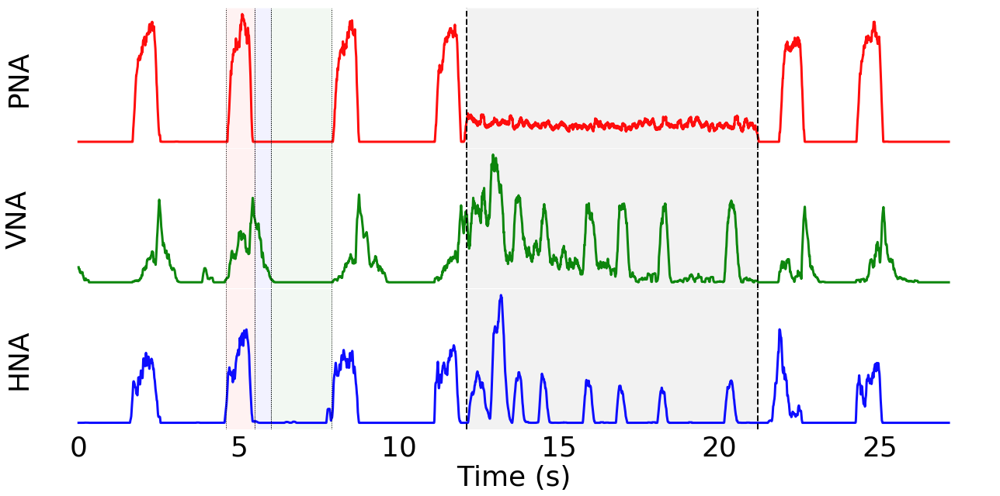

In [148]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize = (2*9,2*3*1.5))
# fig = plt.figure(figsize = (15,2.5))
# recordings : 2019-08-22, 2019-09-05, 2019-09-04, 2019-09-03, 
rec = '2019-09-05'
n_trial = 6
c = 1.0/330
x = np.arange(data[f'{rec}_t{n_trial}']['PNA'].shape[-1])*c
# ax1.text(9., 7, 'stimulation', fontsize=12)
ax1.plot(x, data[f'{rec}_t{n_trial}']['PNA'], 'r', linewidth = 3, alpha = 0.95)
ax1.axvline(data[f'{rec}_t{n_trial}']['stim_start']*c, c='k', linewidth = 2, linestyle = '--')
ax1.axvline(data[f'{rec}_t{n_trial}']['stim_end']*c, c='k', linewidth = 2, linestyle = '--')
ax1.axvspan(data[f'{rec}_t{n_trial}']['stim_start']*c, data[f'{rec}_t{n_trial}']['stim_end']*c, alpha=0.1, color='gray')
# ax1.title.set_text(f'Phrenic Nerve Activity')
# for tick in ax1.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax1.title.set_size(18)
# ax1.grid(True)
# ax1.axis(ymin=0,ymax=8.5)
# ax1.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax1.set_ylabel('PNA', fontsize=36)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax1.set_yticks([])

ax2.plot(x, data[f'{rec}_t{n_trial}']['VNA'], 'g', linewidth = 3, alpha = 0.95)
ax2.axvline(data[f'{rec}_t{n_trial}']['stim_start']*c, c='k', linewidth = 2, linestyle = '--')
ax2.axvline(data[f'{rec}_t{n_trial}']['stim_end']*c, c='k', linewidth = 2, linestyle = '--')
ax2.axvspan(data[f'{rec}_t{n_trial}']['stim_start']*c, data[f'{rec}_t{n_trial}']['stim_end']*c, alpha=0.1, color='gray')
# ax2.title.set_text(f'Vagus Nerve Activity')
# for tick in ax2.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax2.title.set_size(18)
# ax2.grid(True)
# ax2.axis(ymin=0,ymax=8.5)
# ax2.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax2.set_ylabel('VNA', fontsize=36)
ax2.xaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')
ax2.set_yticks([])

ax3.plot(x, data[f'{rec}_t{n_trial}']['HNA'], 'b', linewidth = 3, alpha = 0.95)
ax3.axvline(data[f'{rec}_t{n_trial}']['stim_start']*c, c='k', linewidth = 2, linestyle = '--')
ax3.axvline(data[f'{rec}_t{n_trial}']['stim_end']*c, c='k', linewidth = 2, linestyle = '--')
ax3.axvspan(data[f'{rec}_t{n_trial}']['stim_start']*c, data[f'{rec}_t{n_trial}']['stim_end']*c, alpha=0.1, color='gray')
# ax3.title.set_text(f'Hypoglossal Nerve Activity')
# for tick in ax3.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax3.title.set_size(18)
# ax3.grid(True)
# ax3.axis(ymin=0,ymax=8.5)
# ax3.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax3.set_ylabel('HNA', fontsize=36)
ax3.xaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax3.set_yticks([])


insp_start = 4.6
postinsp_start=5.5
lateinsp_start=6
insp_start2=7.9

for i in range(3):
    eval('ax' + str(i+1)).axvline(insp_start, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvline(postinsp_start, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvspan(insp_start, postinsp_start, alpha=0.05, color='red')

    eval('ax' + str(i+1)).axvline(postinsp_start, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvline(lateinsp_start, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvspan(postinsp_start, lateinsp_start, alpha=0.05, color='blue')

    eval('ax' + str(i+1)).axvline(lateinsp_start, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvline(insp_start2, c='k', linewidth = 1, linestyle = ':')
    eval('ax' + str(i+1)).axvspan(lateinsp_start, insp_start2, alpha=0.05, color='green')

plt.xticks(fontsize = 36)
plt.xlabel('Time (s)', fontsize=36)
plt.rc('axes',edgecolor='white')
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

## Plotting traces of neural activities

## Activities of nerves

In [8]:
t1 = 30000
t2 = t1 + 10000

In [9]:
# import sys
# sys.path.append('../../src')
# from model import *
# import json

# file = open("../rCPG_swCPG.json", "rb+")
# params = json.load(file)
# b = np.array(params["b"])
# c = np.array(params["c"])

# labels = ["PreI","EarlyI", "PostI", "LateE", "RampI", "Relay", "Sw1", "Sw2", "Sw3", "KF","Motor_HN", "Motor_PN", "Motor_VN","KF_inh", "Sw_inh"]
# stoptime = 80000
# amp = 500

# stoptime = 80000
# signals, t = model(b, c, vectorfield, t1, t2, amp, stoptime)

# signals_data = pd.DataFrame(np.vstack([signals,t]).T)
# signals_data.columns = ["PreI","EarlyI", "PostI", "LateE", "RampI", "Relay", "Sw1", "Sw2", "Sw3", "KF","Motor_HN", "Motor_PN", "Motor_VN","KF_inh", "Sw_inh", 't']

# pickle.dump(signals_data, open('numerical_traces_inhKF.pkl', 'wb+')) #numerical_traces_norm

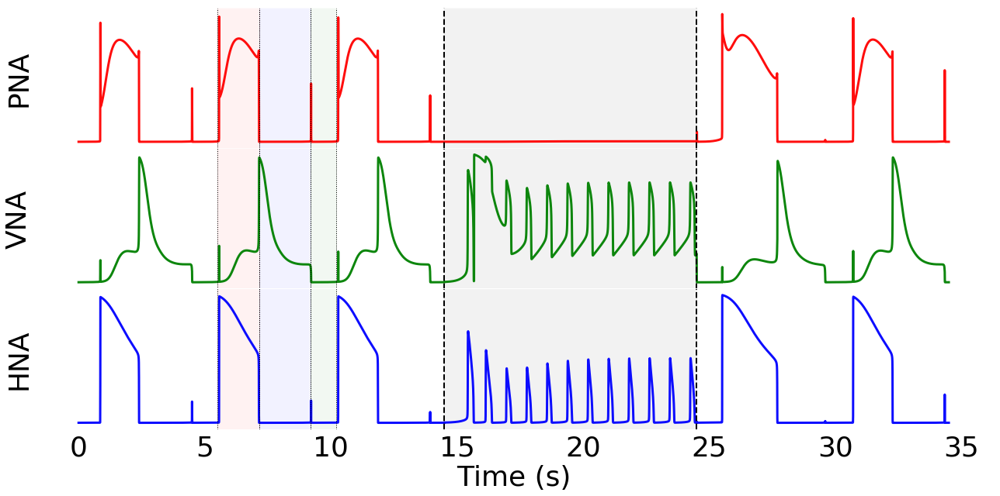

In [11]:
name = 'numerical_traces_normal.pkl'
signals_data = pickle.load(open(name, 'rb+'))
c = signals_data['t'][1]

insp_start = 5.5
postinsp_start=7.15
lateinsp_start=9.18
insp_start2=10.2
    
if 'normal' in name: 
    #normal swallowing
    start = int(15500/c)
    stop = int(50000/c)
elif 'inhKF' in name:
    # inhibited KF
    start = int(12000/c)
    stop = int(54000/c)
elif 'inhNTS' in name:
    # #inhibited NTS
    start = int(14000/c)
    stop = int(51000/c)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize = (9*2,2*3*1.5))

x = np.arange(signals_data[f'Motor_PN'][start:stop].shape[-1])*c
ax1.plot(np.array(x)/1000, signals_data[f'Motor_PN'][start:stop], 'r', linewidth = 3, alpha = 0.95)
ax1.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax1.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax1.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
    
# ax1.title.set_text(f'Phrenic Nerve Activity')
# for tick in ax1.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax1.title.set_size(18)
# ax1.grid(True)
# ax1.axis(ymin=0,ymax=8.5)
# ax1.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax1.set_ylabel('PNA', fontsize=36)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_ticks_position('none')
ax1.set_yticks([])

ax2.plot(np.array(x)/1000, signals_data[f'Motor_VN'][start:stop], 'g', linewidth = 3, alpha = 0.95)
ax2.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax2.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax2.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
# ax2.title.set_text(f'Vagus Nerve Activity')
# for tick in ax2.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax2.title.set_size(18)
# ax2.grid(True)
# # ax2.axis(ymin=0,ymax=8.5)
# ax2.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
# ax2.set_yticklabels([0, 0, None, 1])
ax2.set_ylabel('VNA', fontsize=36)
ax2.xaxis.set_ticks_position('none')
ax2.yaxis.set_ticks_position('none')
ax2.set_yticks([])

ax3.plot(np.array(x)/1000, signals_data[f'Motor_HN'][start:stop], 'b', linewidth = 3, alpha = 0.95)
ax3.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax3.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax3.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
# ax3.title.set_text(f'Hypoglossal Nerve Activity')
# for tick in ax3.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
# ax3.title.set_size(18)
# ax3.grid(True)
# ax3.axis(ymin=0,ymax=8.5)
# ax3.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax3.set_ylabel('HNA', fontsize=36)
ax3.xaxis.set_ticks_position('none')
ax3.yaxis.set_ticks_position('none')
ax3.set_yticks([])

plt.xticks(fontsize = 36)
plt.xlabel('Time (s)', fontsize=36)
plt.rc('axes',edgecolor='white')


for i in range(3):
    if 'normal' in name:
        eval('ax' + str(i+1)).axvline(insp_start, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvline(postinsp_start, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvspan(insp_start, postinsp_start, alpha=0.05, color='red')

        eval('ax' + str(i+1)).axvline(postinsp_start, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvline(lateinsp_start, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvspan(postinsp_start, lateinsp_start, alpha=0.05, color='blue')

        eval('ax' + str(i+1)).axvline(lateinsp_start, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvline(insp_start2, c='k', linewidth = 1, linestyle = ':')
        eval('ax' + str(i+1)).axvspan(lateinsp_start, insp_start2, alpha=0.05, color='green')
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

### traces of neural activities

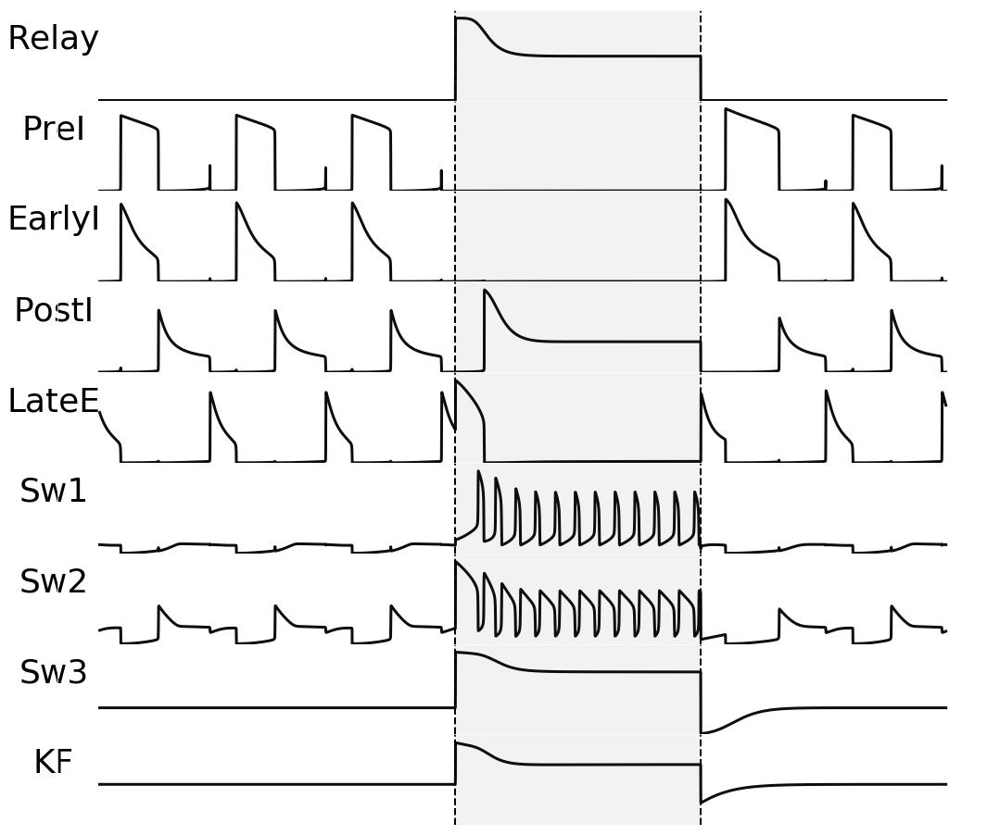

In [13]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
name = 'numerical_traces_normal.pkl'
signals_data = pickle.load(open(name, 'rb+'))
# c = signals_data['t'][1]
# start = int(12000/c)
# stop = int(35000/c)

fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9) = plt.subplots(9, 1, sharex=True, figsize = (2*9,2*9*0.9))
# fig = plt.figure(figsize = (15,2.5))
# labels = ["PreI","EarlyI", "PostI", "AugE", "RampI",
#           "Relay", "NTS1", "NTS2", "NTS3", "KF","Motor_HN",
#           "Motor_PN", "Motor_VN","KF_inh", "NTS_inh", 't']

x = np.arange(signals_data[f'PreI'][start:stop].shape[-1])*c/1000

ax1.plot(x, signals_data[f'Relay'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax1.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax1.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax1.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax1.set_ylabel('Relay', fontsize=36, rotation=0)
# for tick in ax1.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax1.title.set_size(14)
ax1.set_xticklabels([])
ax1.set_yticklabels([])
# ax1.grid(True)
ax1.axis(ymin=0,ymax=1.1 * np.max(signals_data[f'Relay'][start:stop]))
# ax1.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax2.plot(x, signals_data[f'PreI'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax2.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax2.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax2.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
# ax1.title.set_text(f'PreI Activity')
# for tick in ax2.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax2.title.set_size(14)
ax2.set_xticklabels([])
ax2.set_yticklabels([])
# ax2.grid(True)
ax2.axis(ymin=0,ymax=1.1 * np.max(signals_data[f'PreI'][start:stop]))
ax2.set_ylabel('PreI', fontsize=36, rotation=0)
# ax2.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax3.plot(x, signals_data[f'EarlyI'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax3.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax3.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax3.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
# ax2.title.set_text(f'EarlyI Activity')
# for tick in ax3.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax3.title.set_size(14)
ax3.set_xticklabels([])
ax3.set_yticklabels([])
# ax3.grid(True)
ax3.axis(ymin=0,ymax=1.1 * np.max(signals_data[f'EarlyI'][start:stop]))
ax3.set_ylabel('EarlyI', fontsize=36, rotation=0)
# ax3.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax4.plot(x, signals_data[f'PostI'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax4.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax4.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax4.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax4.set_ylabel('PostI', fontsize=36, rotation=0)
# for tick in ax4.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax4.title.set_size(14)
ax4.set_xticklabels([])
ax4.set_yticklabels([])
# ax4.grid(True)
ax4.axis(ymin=0,ymax=1.1 * np.max(signals_data[f'PostI'][start:stop]))
# ax4.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax5.plot(x, signals_data[f'LateE'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax5.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax5.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax5.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax5.set_ylabel('LateE', fontsize=36, rotation=0)
# for tick in ax5.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax5.title.set_size(14)
ax5.set_xticklabels([])
ax5.set_yticklabels([])
# ax5.grid(True)
ax5.axis(ymin=0, ymax=1.1 * np.max(signals_data[f'LateE'][start:stop])) # ymax=0.025) #
ax5.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

if 'inhNTS' in name:
    f = 5
else:
    f=1.1

ax6.plot(x, signals_data[f'Sw1'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax6.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax6.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax6.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax6.set_ylabel('Sw1', fontsize=36, rotation=0)
# for tick in ax6.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax6.title.set_size(14)
ax6.set_xticklabels([])
ax6.set_yticklabels([])
# ax6.grid(True)
ax6.axis(ymin=0,ymax= f*np.max(signals_data[f'Sw1'][start:stop]))
ax6.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax7.plot(x, signals_data[f'Sw2'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax7.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax7.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax7.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax7.set_ylabel('Sw2', fontsize=36, rotation=0)
# for tick in ax7.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax7.title.set_size(14)
ax7.set_xticklabels([])
ax7.set_yticklabels([])
# ax7.grid(True)
ax7.axis(ymin=0,ymax=f*np.max(signals_data[f'Sw2'][start:stop]))
# ax7.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax8.plot(x, signals_data[f'Sw3'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax8.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax8.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax8.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax8.set_ylabel('Sw3', fontsize=36, rotation=0)
# for tick in ax8.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax8.title.set_size(14)
ax8.set_xticklabels([])
ax8.set_yticklabels([])
# ax8.grid(True)
ax8.axis(ymin=0,ymax= 1.1*np.max(signals_data[f'Sw3'][start:stop]))
# ax8.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)

ax9.plot(x, signals_data[f'KF'][start:stop], 'k', linewidth = 3, alpha = 0.95)
ax9.axvline((t1-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax9.axvline((t2-start*c)/1000, c='k', linewidth = 2, linestyle = '--')
ax9.axvspan((t1-start*c)/1000, (t2-start*c)/1000, alpha=0.1, color='gray')
ax9.set_ylabel('KF', fontsize=36, rotation=0)
# for tick in ax9.yaxis.get_major_ticks():
#     tick.label.set_fontsize(18) 
ax9.title.set_size(14)
# ax9.grid(True)
ax9.axis(ymin=0,ymax=1.1 * np.max(signals_data[f'KF'][start:stop]))
# ax9.axis('off')
# ax9.tick_params(direction='out', length=6, width=2, colors='k', grid_alpha=1)
ax9.set_xticklabels([])
ax9.set_yticklabels([])
plt.xticks([])
plt.yticks([])
# plt.tight_layout()
# plt.xticks(fontsize = 18)
# plt.xlabel('t, s', fontsize=22)
plt.subplots_adjust(wspace=0, hspace=0)
plt.rc('axes',edgecolor='white')
ax1.set_yticks([])
ax2.set_yticks([])
ax3.set_yticks([])
ax4.set_yticks([])
ax5.set_yticks([])
ax6.set_yticks([])
ax7.set_yticks([])
ax8.set_yticks([])
ax9.set_yticks([])
# bar = AnchoredSizeBar(ax9.transData, size = 2.5, label='2.5 s', loc = 5, frameon=False, fill_bar=True, size_vertical=0.05)
# ax9.add_artist(bar)
plt.show()

In [197]:
import sys
sys.path.append('../../src')
from model import *
import json

file = open("../rCPG_swCPG.json", "rb+")
params = json.load(file)
b = np.array(params["b"])
c = np.array(params["c"])

labels = ["PreI","EarlyI", "PostI", "LateE", "RampI", "Relay", "Sw1", "Sw2", "Sw3", "KF","Motor_HN", "Motor_PN", "Motor_VN","KF_inh", "Sw_inh"]
stoptime = 150000
amp = 0
t1 = 29000
t2 = t1 + 9000
stoptime = 150000
signals, t = model(b, c, vectorfield, t1, t2, amp, stoptime)

signals_data = pd.DataFrame(np.vstack([signals,t]).T)
signals_data.columns = ["PreI","EarlyI", "PostI", "LateE", "RampI", "Relay", "Sw1", "Sw2", "Sw3", "KF","Motor_HN", "Motor_PN", "Motor_VN","KF_inh", "Sw_inh", 't']

In [198]:
# find period
from sklearn.cluster import KMeans
# import hdbscan
def find_period(chunk):
    #finds the full respiratory period not multiplied by dt
    autocorr = np.correlate(chunk,chunk,mode='full')
    tmp = savgol_filter(autocorr[autocorr.shape[-1]//2:],151,3)
    peaks_preliminary = find_peaks(tmp)[0]
    peaks = [0]
    for peak_candidate in peaks_preliminary:
        if (peak_candidate - peaks[-1]) > 400 and (tmp[peak_candidate] > 400):
            peaks.append(peak_candidate)
            
    peaks = np.array(peaks)
    
    Ts = peaks[1:] - peaks[:-1]
    T = np.mean(Ts)
    std_T = np.std(Ts)
    if len(peaks) > 1:
        return T, std_T
    else:
        return None, None

def num_derivative(signal):
    return signal - np.append(0, signal[:-1])

def find_T(signals_data):
    #finds Ti and Te1, Te2 with standard deviations
    dt = signals_data['t'][1]
    preI_rec = np.array(signals_data['PreI'][2000:])
    lateE_rec = np.array(signals_data['LateE'][2000:])
    postI_rec = np.array(signals_data['PostI'][2000:])
    
    fig1 = plt.figure(figsize = (20,2))
    plt.plot(np.array(signals_data['t'][2000:]), preI_rec)
    plt.show()
    fig2 = plt.figure(figsize = (20,2))
    plt.plot(np.array(signals_data['t'][2000:]), lateE_rec)
    plt.show()
    fig2 = plt.figure(figsize = (20,2))
    plt.plot(np.array(signals_data['t'][2000:]), postI_rec)
    plt.show()
    
    preI_change = np.abs(num_derivative(preI_rec))
    lateE_change = np.abs(num_derivative(lateE_rec))
    postI_change = np.abs(num_derivative(postI_rec))
    
    preI_change_inds = []
    for i in range(preI_change.shape[-1]):
        if preI_change[i] > 0.4:
            preI_change_inds.append(i)
    lateE_change_inds = []
    for i in range(lateE_change.shape[-1]):
        if lateE_change[i] > 0.1:
            lateE_change_inds.append(i)
    postI_change_inds = []
    for i in range(postI_change.shape[-1]):
        if postI_change[i] > 0.1:
            postI_change_inds.append(i)
            
    preI_change_times = np.array(preI_change_inds)*dt
    lateE_change_times = np.array(lateE_change_inds)*dt
    postI_change_times = np.array(postI_change_inds)*dt

    
    preI_periods = preI_change_times[1:] - preI_change_times[:-1]
    preI_periods = preI_periods[1:-1]
    periods_tmp = []
    for i in range(preI_periods.shape[-1]):
        if preI_periods[i] > 100:
            periods_tmp.append(preI_periods[i])
    periods_tmp = np.array(periods_tmp)
    cl = KMeans(n_clusters=2)
    cl.fit(periods_tmp.reshape(-1,1))
    centres = cl.cluster_centers_.flatten()
    true_periods = [[], []]
    for i in range(periods_tmp.shape[-1]):
        if np.abs(periods_tmp[i] - centres[0]) > 150 and np.abs(periods_tmp[i] - centres[1]) > 150:
            pass
        else:
            if np.abs(periods_tmp[i] - centres[0]) < 150:
                true_periods[0].append(periods_tmp[i])
            elif np.abs(periods_tmp[i] - centres[1]) < 150:
                true_periods[1].append(periods_tmp[i])
    
    print(f'PreI periods: {np.mean(true_periods[0])} +- {np.std(true_periods[0])}, {np.mean(true_periods[1])} +- {np.std(true_periods[1])}')
            
    lateE_periods = lateE_change_times[1:] - lateE_change_times[:-1]
    lateE_periods = lateE_periods[1:-1]
    periods_tmp = []
    for i in range(lateE_periods.shape[-1]):
        if lateE_periods[i] > 50:
            periods_tmp.append(lateE_periods[i])
    periods_tmp = np.array(periods_tmp)
    cl = KMeans(n_clusters=2)
    cl.fit(periods_tmp.reshape(-1,1))
    centres = cl.cluster_centers_.flatten()
    true_periods = [[], []]
    for i in range(periods_tmp.shape[-1]):
        if np.abs(periods_tmp[i] - centres[0]) > 250 and np.abs(periods_tmp[i] - centres[1]) > 250:
            pass
        else:
            if np.abs(periods_tmp[i] - centres[0]) < 250:
                true_periods[0].append(periods_tmp[i])
            elif np.abs(periods_tmp[i] - centres[1]) < 250:
                true_periods[1].append(periods_tmp[i])
    
    print(f'LateE periods: {np.mean(true_periods[0])} +- {np.std(true_periods[0])}, {np.mean(true_periods[1])} +- {np.std(true_periods[1])}')
    
    postI_periods = postI_change_times[1:] - postI_change_times[:-1]
    postI_periods = postI_periods[1:-1]
    periods_tmp = []
    for i in range(postI_periods.shape[-1]):
        if postI_periods[i] > 300:
            periods_tmp.append(postI_periods[i])
    periods_tmp = np.array(periods_tmp)
    cl = KMeans(n_clusters=2)
    cl.fit(periods_tmp.reshape(-1,1))
    centres = cl.cluster_centers_.flatten()
    true_periods = [[], []]
    for i in range(periods_tmp.shape[-1]):
        if np.abs(periods_tmp[i] - centres[0]) > 300 and np.abs(periods_tmp[i] - centres[1]) > 300:
            pass
        else:
            if np.abs(periods_tmp[i] - centres[0]) < 300:
                true_periods[0].append(periods_tmp[i])
            elif np.abs(periods_tmp[i] - centres[1]) < 300:
                true_periods[1].append(periods_tmp[i])
    
    print(f'PostI periods: {np.mean(true_periods[0])} +- {np.std(true_periods[0])}, {np.mean(true_periods[1])} +- {np.std(true_periods[1])}')


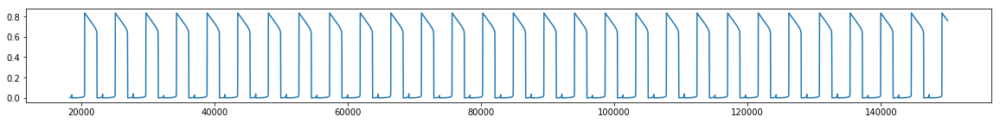

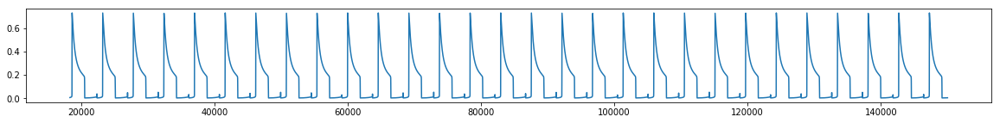

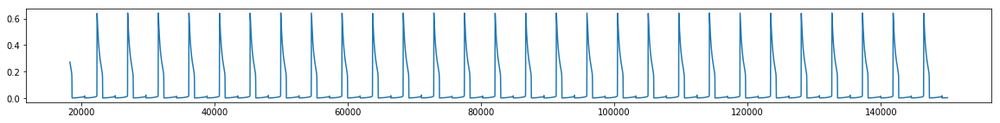

PreI periods: nan +- nan, nan +- nan
LateE periods: 4587.0719648416025 +- 3.4432913682396087e-12, nan +- nan
PostI periods: 842.3365683940673 +- 3.899523848157183e-12, 3753.8912287126896 +- 1.8189894035458565e-12


/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid 

In [199]:
find_T(signals_data)

In [200]:
### T_tot, std_T_tot = find_period(signals_data['PreI'])
T_tot = dt*T_tot
std_T_tot = std_T_tot * dt
print(f'total period and std: {T_tot} +- {std_T_tot}')



total period and std: 43168.84699834216 +- 67.70825206999668


## Plotting Swallows and breakthroughs

In [15]:
data_numerical = pickle.load(open(f'../../src/features_var_amp_5.pkl','rb+'))

In [16]:
print(data_numerical.keys())

sw_avg_num = np.mean(data_numerical['num_swallows_s'], axis = -1)
sw_std_num = np.std(data_numerical['num_swallows_s'], axis = -1)

br_avg_num = np.mean(data_numerical['num_breakthroughs_PreI_s'], axis = -1)
br_std_num = np.std(data_numerical['num_breakthroughs_PreI_s'], axis = -1)

amps = np.array(data_numerical['amps'])

dict_keys(['amps', 'start_times', 'periods', 'period_stds', 'rough_periods', 'num_swallows_s', 'num_breakthroughs_AugE_s', 'num_breakthroughs_PreI_s'])


Text(0.5, 1.0, 'Swallows')

<Figure size 1440x360 with 0 Axes>

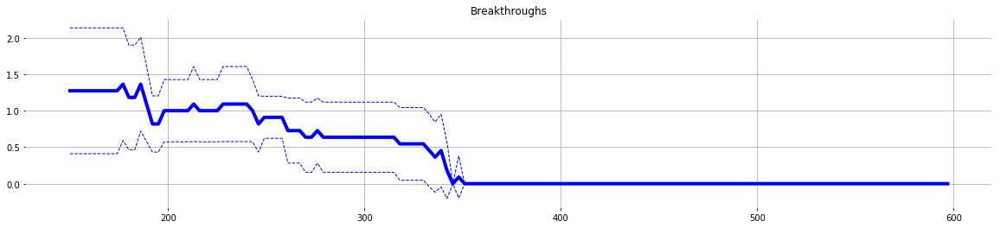

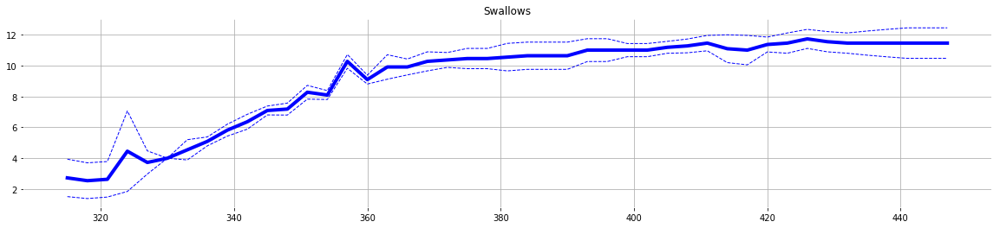

In [17]:
fig = plt.figure(figsize = (20,5))
start = 55
end = -50

# start = 0
# end = -1

x_ = amps[start:end]
a = (50.0 - 5.0)/(x_[-1]-x_[0])
b = 50 - a*x_[-1]
x__ = a*x_ + b
sw_avg_num_ = sw_avg_num[start:end]
sw_std_num_ = sw_std_num[start:end]

br_avg_num_ = br_avg_num[start:end]
br_std_num_ = br_std_num[start:end]

# fig1 = plt.figure(figsize = (20,4))
# plt.plot(amps, br_avg_num, linewidth = 4, color = 'b')
# plt.plot(amps, br_avg_num + br_std_num, linewidth = 1, color = 'b', linestyle='--')
# plt.plot(amps, br_avg_num - br_std_num, linewidth = 1, color = 'b', linestyle='--')
# plt.grid(True)
# plt.title('Breakthroughs')

# fig2 = plt.figure(figsize = (20,4))
# plt.plot(amps, sw_avg_num, linewidth = 4, color = 'b')
# plt.plot(amps, sw_avg_num + sw_std_num, linewidth = 1, color = 'b', linestyle='--')
# plt.plot(amps, sw_avg_num - sw_std_num, linewidth = 1, color = 'b', linestyle='--')
# plt.grid(True)
# plt.title('Swallows')

fig1 = plt.figure(figsize = (20,4))
plt.plot(amps, br_avg_num, linewidth = 4, color = 'b')
plt.plot(amps, br_avg_num + br_std_num, linewidth = 1, color = 'b', linestyle='--')
plt.plot(amps, br_avg_num - br_std_num, linewidth = 1, color = 'b', linestyle='--')
plt.grid(True)
plt.title('Breakthroughs')

fig2 = plt.figure(figsize = (20,4))
plt.plot(x_, sw_avg_num_, linewidth = 4, color = 'b')
plt.plot(x_, sw_avg_num_ + sw_std_num_, linewidth = 1, color = 'b', linestyle='--')
plt.plot(x_, sw_avg_num_ - sw_std_num_, linewidth = 1, color = 'b', linestyle='--')
plt.grid(True)
plt.title('Swallows')

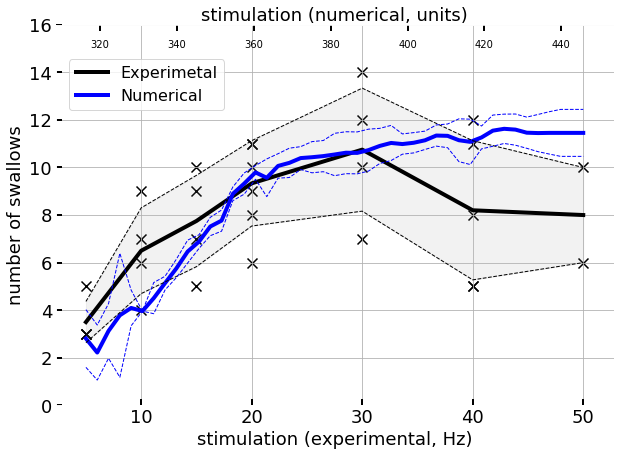

In [18]:
#plotting breakthroughs and swallows depending on frequency of the stimulation

#2019-08-22
data1 = {'trial' : [1, 2, 3, 4, 5, 6, 7, 8],
            'Hz' : [20, 10, 5, 40, 40, 30, 15, 20],
            'Sw' : [8, 4, 3, 5, 5, 7, 5, 6],
            'Br' : [0, 1, 3, 0, 2, 0, 1, 0]}
df1 = pd.DataFrame(data1)

#2019-09-05
data2 = {'trial' : [1, 2, 3, 4, 5, 6, 7],
            'Hz' : [5, 10, 15, 20, 30, 40, 50],
            'Sw' : [3, 6, 7, 9, 10, 8, 6],
            'Br' : [2, 1, 0, 0, 0,  0, 1]}
df2 = pd.DataFrame(data2)

#2019-09-04
data3 = {'trial' : [1, 2, 3, 4, 5, 6, 7, 8],
            'Hz' : [20, 5, 10, 15, 20, 30, 40, 50],
            'Sw' : [11, 3, 7, 9, 10, 12, 11, 10],
            'Br' : [0 , 2, 2, 2, 1, 1, 1, 2]}
df3 = pd.DataFrame(data3)

#2019-09-03
data4 = {'trial' : [1, 2, 3, 4, 5, 6],
            'Hz' : [20, 5, 10, 15, 30, 40],
            'Sw' : [11, 5, 9, 10, 14, 12],
            'Br' : [2, 3, 2, 2, 1, 1]}
df4 = pd.DataFrame(data4)

x = [5, 10, 15, 20, 30, 40, 50]
sw = [[3, 3, 3, 5], [4, 6, 7, 9], [5, 7, 9, 10], [8, 6, 10, 11, 10, 11], [7, 10, 12, 14], [5, 5, 8, 11, 12], [6, 10]]
br = [[2, 2, 3, 3], [1, 1, 2, 2], [0, 1, 2, 2], [0, 0, 0, 1, 2], [0, 0, 1, 1], [0, 0, 1, 1, 2], [1, 2]]
sw_avg = np.array([np.mean(np.array(sw[i])) for i in range(len(sw))])
br_avg = np.array([np.mean(np.array(br[i])) for i in range(len(br))])
sw_std = np.array([np.std(np.array(sw[i])) for i in range(len(sw))])
br_std = np.array([np.std(np.array(br[i])) for i in range(len(br))])

fig = plt.figure(figsize = (10,7))

ax1 = fig.add_subplot(111)
ax2 = ax1.twiny()

# ax1.set_title('Dependence of number of swallows on stimulation', pad = 15, fontsize = 24)
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(18) 

for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(18) 
    
ax1.scatter(np.hstack([df1['Hz']]), df1['Sw'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df2['Hz']]), df2['Sw'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df3['Hz']]), df3['Sw'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df4['Hz']]), df4['Sw'], c = 'k', marker = 'x', s = 100)
ax1.plot(x, sw_avg, linewidth = 4, color = 'k', label = 'Experimental')
ax1.plot(x__, savgol_filter(sw_avg_num_, 5,3), linewidth = 4, color = 'b', label = 'Numerical')
ax1.plot(x, sw_avg + sw_std, linewidth = 1, color = 'k', linestyle='--')
ax1.plot(x, sw_avg - sw_std, linewidth = 1, color = 'k', linestyle='--')


ax1.plot(x__, savgol_filter(sw_avg_num_, 5,3) + sw_std_num_, linewidth = 1, color = 'b', linestyle='--')
ax1.plot(x__, savgol_filter(sw_avg_num_, 5,3) - sw_std_num_, linewidth = 1, color = 'b', linestyle='--')

ax1.fill_between(x, sw_avg - sw_std, sw_avg + sw_std, color='gray', alpha = 0.1)
ax1.set_xlabel('stimulation (experimental, Hz)', fontsize = 18)
ax1.set_ylabel('number of swallows', fontsize = 18)
ax1.grid(True)
ax1.axis(ymin=0, ymax=16)
ax1.tick_params(direction='in', length=6, width=2, colors='k', grid_alpha=1)

ax1.legend(['Experimetal', 'Numerical'], fontsize = 16, bbox_to_anchor=(0.01, 1.0, 1.0, -0.07))

ax2.plot((x-b)/a, np.zeros(len(x)), alpha = 0) # Create a dummy plot
ax2.set_xlabel('stimulation (numerical, units)', fontsize = 18)#, labelpad=-15)
ax2.tick_params(direction='in', length=6, width=2, colors='k', grid_alpha=1, pad=-25)
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(18) 
ax1.set_frame_on(True)
plt.rc('axes',edgecolor='black')
plt.show()

# fig = plt.figure(figsize = (20,5))
# plt.title('Breakthroughs', fontsize = 36)
# plt.scatter(np.hstack([df1['Hz']]), df1['Br'], c = 'r', marker = 'x', s = 400)
# plt.scatter(np.hstack([df2['Hz']]), df2['Br'], c = 'g', marker = 'o', s = 400)
# plt.scatter(np.hstack([df3['Hz']]), df3['Br'], c = 'b', marker = 'v', s = 400)
# plt.scatter(np.hstack([df4['Hz']]), df4['Br'], c = 'k', marker = '+', s = 400)
# plt.plot(x, br_avg, linewidth = 4, color = 'k')
# plt.plot(x, br_avg + br_std, linewidth = 1, color = 'k', linestyle='--')
# plt.plot(x, br_avg - br_std, linewidth = 1, color = 'k', linestyle='--')

# plt.plot(x__, savgol_filter(br_avg_num_, 5,3), linewidth = 4, color = 'b')
# plt.plot(x__, savgol_filter(br_avg_num_, 5,3) + br_std_num_, linewidth = 1, color = 'b', linestyle='--')
# plt.plot(x__, savgol_filter(br_avg_num_, 5,3) - br_std_num_, linewidth = 1, color = 'b', linestyle='--')

# plt.xlabel('Hz', fontsize = 20)
# plt.fill_between(x, br_avg - br_std, br_avg + br_std, color='gray', alpha = 0.1)
# plt.grid(True)
# plt.show()

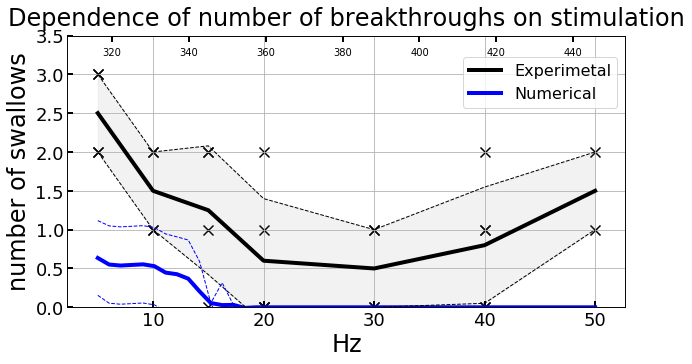

In [19]:
fig = plt.figure(figsize = (10,5))

ax1 = fig.add_subplot(111)
ax2 = ax1.twiny()

ax1.set_title('Dependence of number of breakthroughs on stimulation', pad = 10, fontsize = 24)
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(18) 

for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(18) 
    
ax1.scatter(np.hstack([df1['Hz']]), df1['Br'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df2['Hz']]), df2['Br'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df3['Hz']]), df3['Br'], c = 'k', marker = 'x', s = 100)
ax1.scatter(np.hstack([df4['Hz']]), df4['Br'], c = 'k', marker = 'x', s = 100)
ax1.plot(x, br_avg, linewidth = 4, color = 'k', label = 'Experimental')
ax1.plot(x__, savgol_filter(br_avg_num_, 5,3), linewidth = 4, color = 'b', label = 'Numerical')
ax1.plot(x, br_avg + br_std, linewidth = 1, color = 'k', linestyle='--')
ax1.plot(x, br_avg - br_std, linewidth = 1, color = 'k', linestyle='--')


ax1.plot(x__, savgol_filter(br_avg_num_, 5,3) + br_std_num_, linewidth = 1, color = 'b', linestyle='--')
ax1.plot(x__, savgol_filter(br_avg_num_, 5,3) - br_std_num_, linewidth = 1, color = 'b', linestyle='--')

ax1.fill_between(x, br_avg - br_std, br_avg + br_std, color='gray', alpha = 0.1)
ax1.set_xlabel('Hz', fontsize = 24)
ax1.set_ylabel('number of swallows', fontsize = 24)
ax1.grid(True)
ax1.axis(ymin=0, ymax=3.5)
ax1.tick_params(direction='in', length=6, width=2, colors='k', grid_alpha=1)

ax1.legend(['Experimetal', 'Numerical'], fontsize = 16, bbox_to_anchor=(0.0, 1.0, 1.0, -0.05))

ax2.plot((x-b)/a, np.zeros(len(x)), alpha = 0) # Create a dummy plot
ax2.tick_params(direction='in', length=6, width=2, colors='k', grid_alpha=1, pad=-22)
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(18) 
    
plt.show()

# Preprocessing PRC files

In [14]:
# list of files
import os
import re

folders_all = os.listdir('../../data/sln_prc_preprocessed/')
folders = []
for i, folder in enumerate(folders_all):
    m = re.search("prc$", str(folder))
    if m is not None:
        folders.append(folder)

In [15]:
folders

['2019-08-22_16-18-36_prc',
 '2019-09-05_12-26-14_prc',
 '2019-09-04_17-49-02_prc',
 '2019-09-03_15-01-54_prc']

In [19]:
# first level processing
suffixes = ['CH5','CH10','CH15']
q = 0.95
n = 0.8
u = 1001
conv_window = np.array([q**i for i in np.arange(1,u)[::-1]])/(np.sum(np.array([q**i for i in np.arange(1,u)])))
for folder in folders:
    print(folder)
    stim = pickle.load(open(f'../../data/sln_prc_preprocessed/{folder}/100_ADC1.pkl','rb+'))
    l = stim.shape[-1]
    stim = deepcopy(stim[:int(n*l)])
    spikes_start, spikes_end = find_spikes(stim)
    for suffix in suffixes:
        rec = pickle.load(open(f'../../data/sln_prc_preprocessed/{folder}/100_{suffix}.pkl','rb+'))[:int(n*l)]
        processed_signal = remove_spikes(rec, spikes_start, spikes_end)
        processed_signal = butter_highpass_filter(processed_signal, 300, 33000)
        processed_signal = np.convolve(np.abs(processed_signal), conv_window, 'full')
        processed_signal = savgol_filter(processed_signal, 1001,3)
        processed_signal = processed_signal - np.mean(processed_signal)
        processed_signal = np.maximum(0.0, processed_signal)
        data = deepcopy(dict())
        
        data['stims_starts'] = spikes_start
        data['signal'] = processed_signal
        
#         fig = plt.figure(figsize = (15,5))
#         plt.plot(data['signal'], 'r', linewidth = 1, alpha = 0.95)
#         plt.title(f'da')
#         plt.grid(True)
#         plt.show()
        
        pickle.dump(data, open(f'../../data/sln_prc_preprocessed/{folder}/100_{suffix}_prc_processed.pkl','wb+'))

2019-08-22_16-18-36_prc


IndexError: list index out of range

In [33]:
# second level processing
suffixes = ['CH5','CH10','CH15']
wd = 3500
down_factor = 100
data_all = dict()
for folder in folders[:-1]:
    print(folder)
    data_to_save = dict()
    for suffix in suffixes:
        data = pickle.load(open(f'../../data/{folder}/100_{suffix}_prc_processed.pkl','rb+'))
        #downsample
        data['signal'] = pd.DataFrame(data['signal']).rolling(window=wd).mean().dropna().values.squeeze()
        data['signal'] = data['signal'][::down_factor]
        data['stims_starts'] = np.round(data['stims_starts']/down_factor, 0)
        if suffix =='CH5':
            data_to_save['HNA'] = data['signal']
        elif suffix =='CH10':
            data_to_save['PNA'] = data['signal']
        elif suffix =='CH15':
            data_to_save['VNA'] = data['signal']
        
        stims_clustered = [0]
        #cluster them and save again:
        for i in range(len(data['stims_starts'])):
            if ((np.abs(data['stims_starts'][i] - stims_clustered[-1])) > 100):
                stims_clustered.append(data['stims_starts'][i])
        
        data_to_save['stims_starts'] = stims_clustered
        data_all[folder[:-2]] = deepcopy(data_to_save)
pickle.dump(data_all, open(f'../../data/combined_data_prc_processed.pkl','wb+'))

2019-08-22_prc_1
2019-09-04_prc_1
2019-09-03_prc_1
2019-09-05_prc_1


In [20]:
data = pickle.load(open(f'../../data/sln_prc_preprocessed/combined_data_prc_processed.pkl','rb+'))

In [22]:
print(data.keys())

dict_keys(['2019-08-22_16-18-36_p', '2019-09-05_12-26-14_p', '2019-09-04_17-49-02_p'])


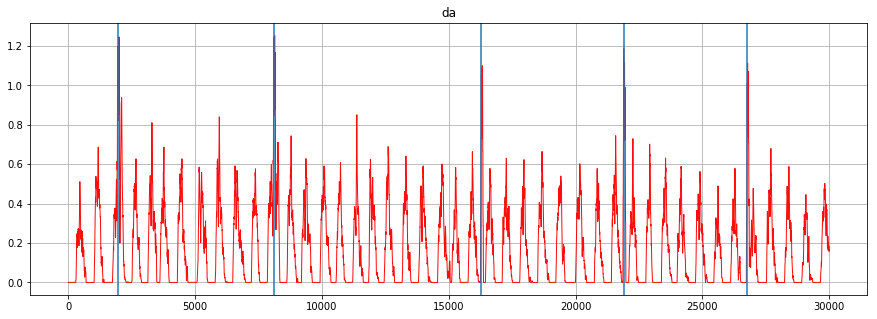

In [23]:
fig = plt.figure(figsize = (15,5))
start = 200000
end = 230000
plt.plot(data['2019-08-22_16-18-36_p']['VNA'][start:end], 'r', linewidth = 1, alpha = 0.95)
stims = data['2019-08-22_16-18-36_p']['stims_starts']
for i in range(len(stims)):
    if stims[i] < end and stims[i] > start:
        plt.axvline(stims[i]-start)
plt.title(f'da')
plt.grid(True)
plt.show()

In [25]:
# cut prc into arrays of 2 breaths after previous stim ending up by two breaths:
# in each chunk determine the period by autocorellation

In [140]:
#determine period:

# start = 200000
# end = 210000
# stims_starts = data['2019-08-22_prc']['stims_starts']
# chunk = data['2019-08-22_prc']['VNA'][int(stims_starts[0]):int(stims_starts[1])]


def find_period(chunk):
    autocorr = np.correlate(chunk,chunk,mode='full')
    tmp = savgol_filter(autocorr[autocorr.shape[-1]//2:],151,3)
    peaks_preliminary = find_peaks(tmp)[0]
    peaks = [0]
    for peak_candidate in peaks_preliminary:
        if (peak_candidate - peaks[-1]) > 400 and (tmp[peak_candidate] > 400):
            peaks.append(peak_candidate)
            
    peaks = np.array(peaks)
    fig = plt.figure(figsize = (15,5))
    plt.plot(autocorr[autocorr.shape[-1]//2:], 'r', linewidth = 1, alpha = 0.95)
    for i in range(len(peaks)):
        plt.axvline(peaks[i])
    plt.title(f'da')
    plt.grid(True)
    plt.show()
    
    Ts = peaks[1:] - peaks[:-1]
    T = np.mean(Ts)
    std_T = np.std(Ts)
    if len(peaks) > 1:
        return T, std_T
    else:
        return None, None
    

def get_insp_phases(chunk):
    signal = chunk['PNA']
    stim = chunk['stim']
    insp = None
    insp_end = []
    insp_start = []
    i = 0
    w = 100
    while i < signal.shape[-1] - w:
        if np.mean(signal[i:i+w])> 0.5:
            insp = True
        else:
            insp = False
            
        if (insp == False) and (np.mean(signal[i+1:i+w+1]) > 0.5):
            if np.abs(i - stim) < 20:
                pass
            else:
                insp_start.append(i + 0.8*w)
        if (insp == True) and (np.mean(signal[i+1:i+w+1]) < 0.5):
            if np.abs(i - stim) < 20:
                pass
            else:
                insp_end.append(i + 0.2*w)
        i = i+1
    
    return insp_start, insp_end
    
T, std_T = find_period(chunk)
print(T, std_T)

ValueError: object of too small depth for desired array

2019-08-22_prc
chunk number 0


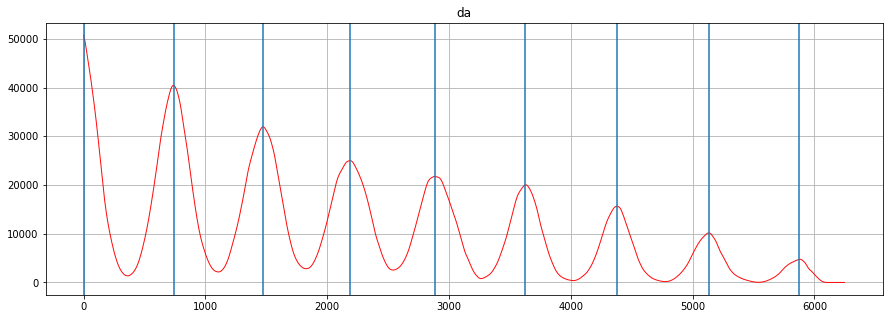

chunk number 1


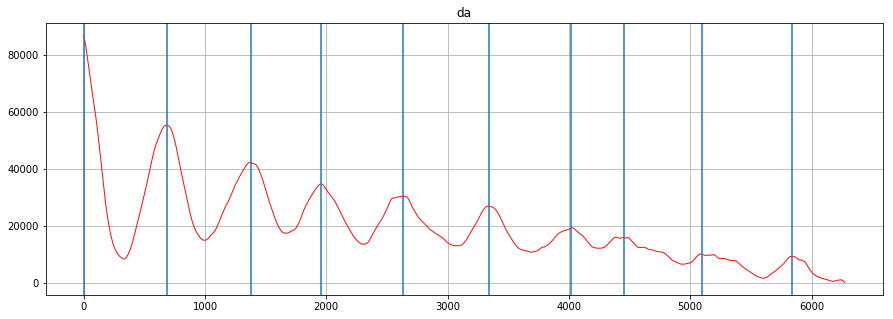

chunk number 2


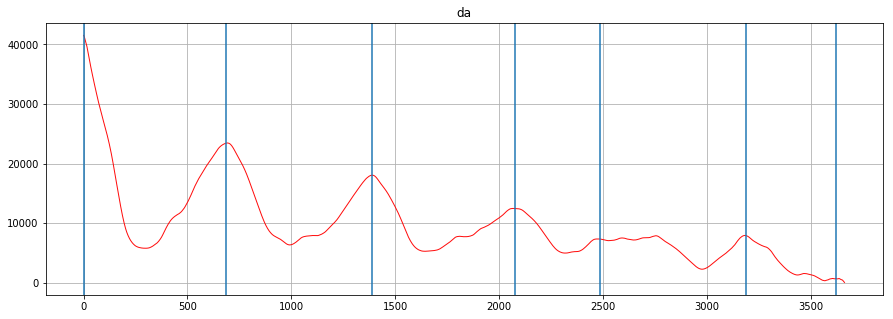

chunk number 3


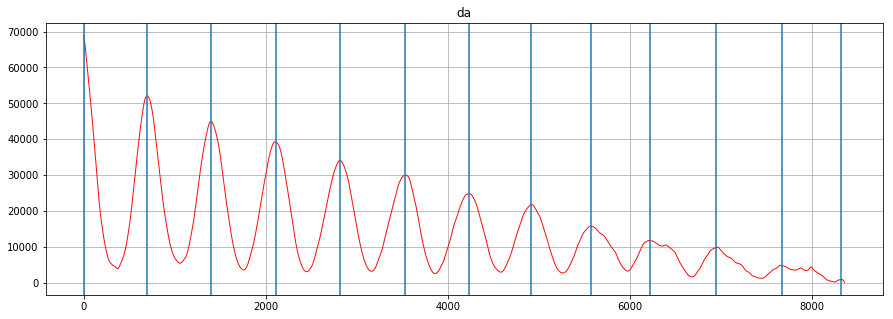

chunk number 4


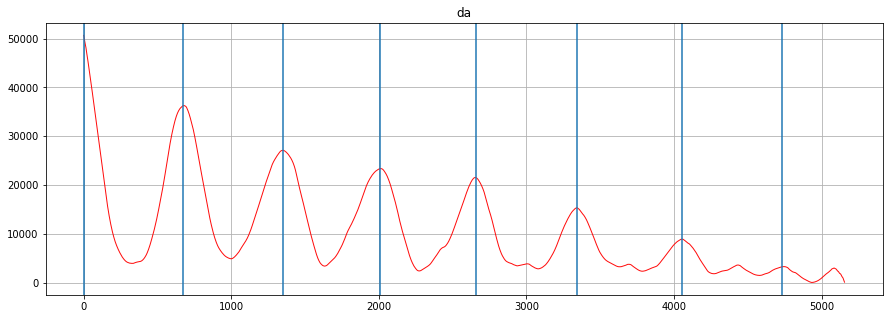

chunk number 5


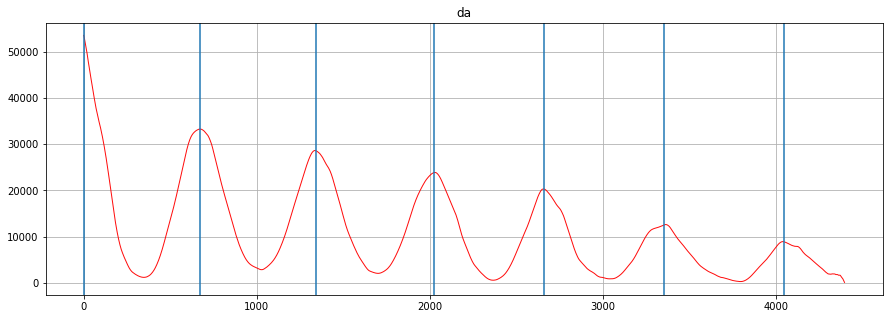

chunk number 6


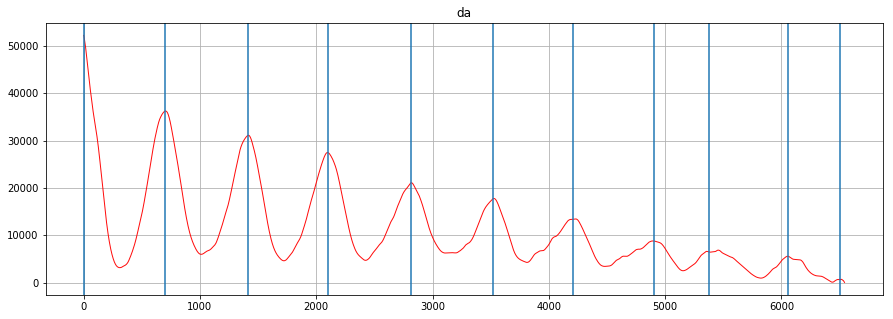

chunk number 7


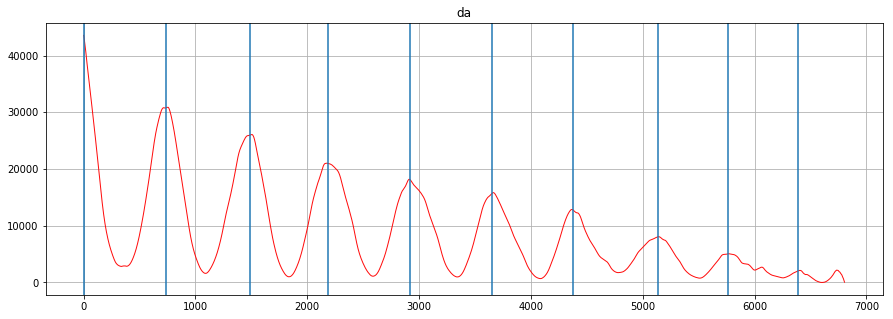

chunk number 8


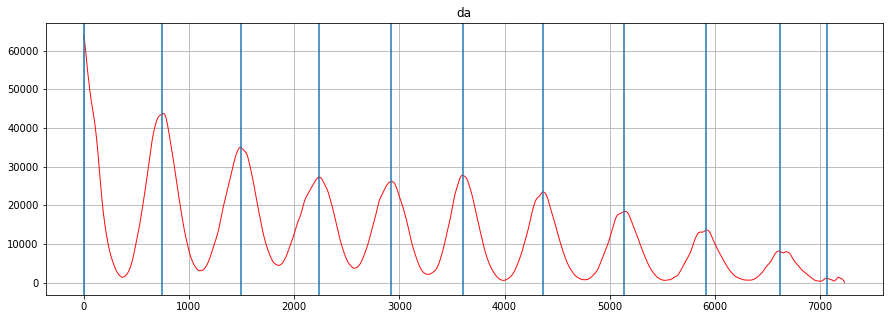

chunk number 9


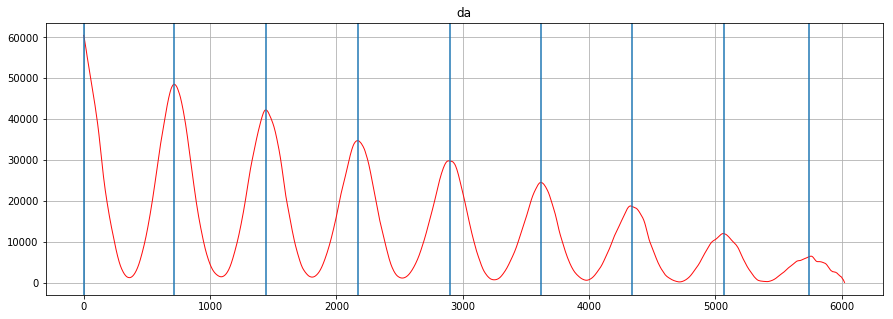

chunk number 10


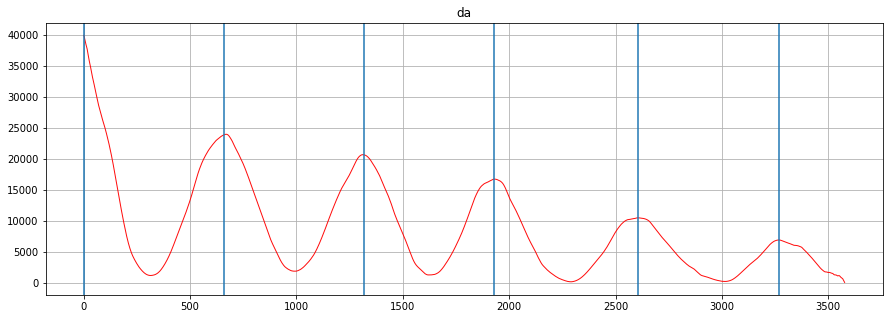

chunk number 11


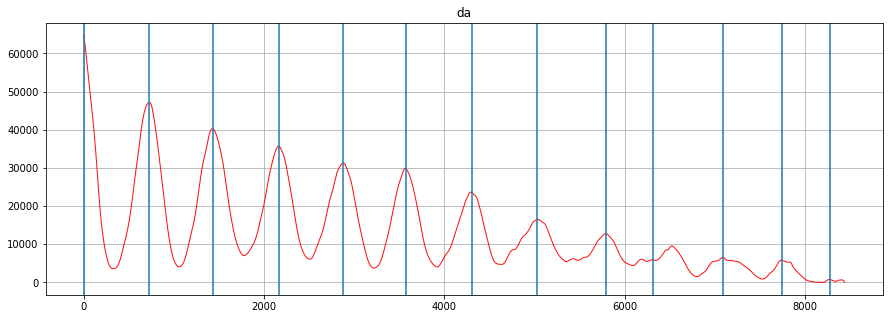

chunk number 12


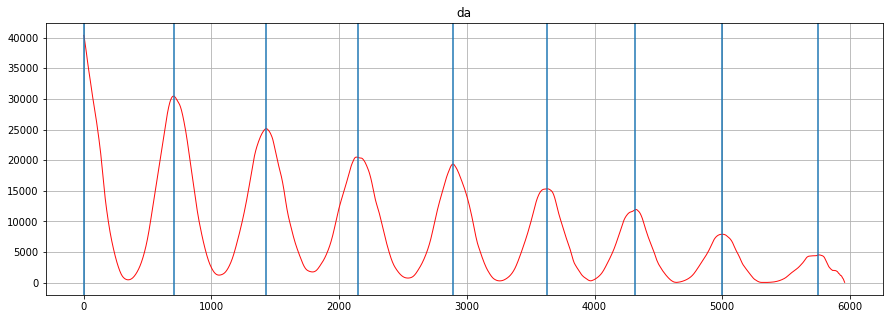

chunk number 13


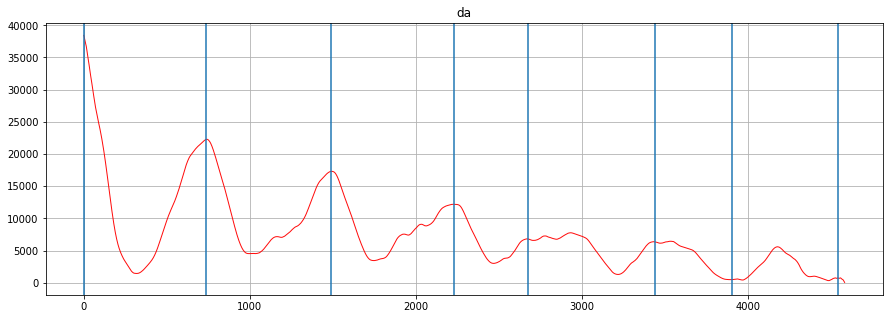

chunk number 14


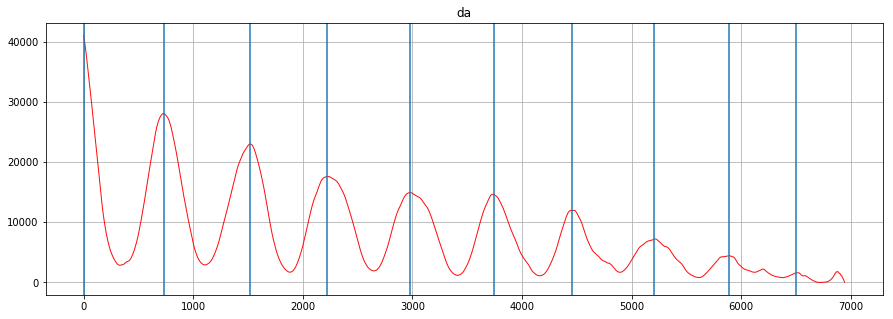

chunk number 15


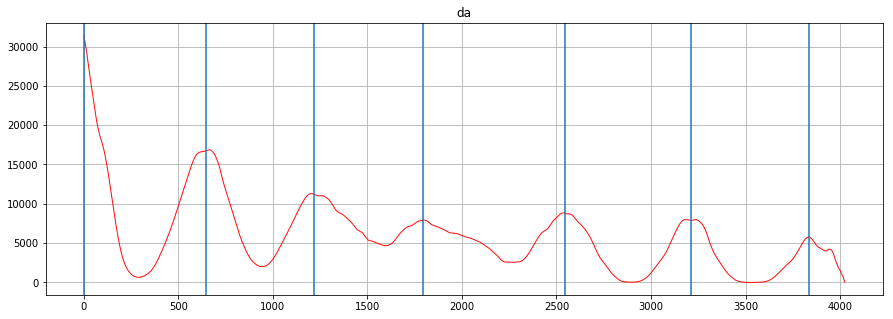

chunk number 16


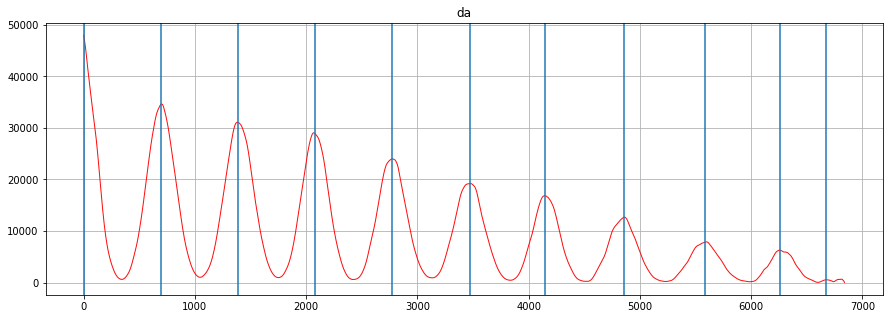

chunk number 17


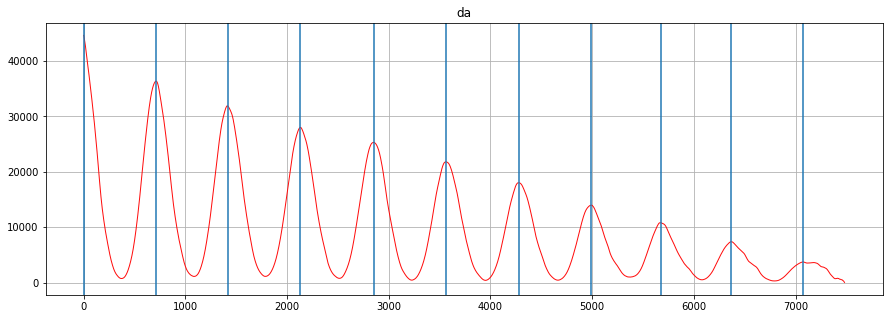

chunk number 18


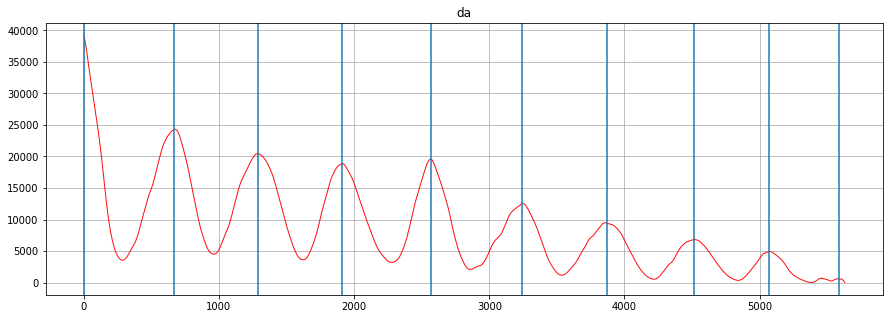

chunk number 19


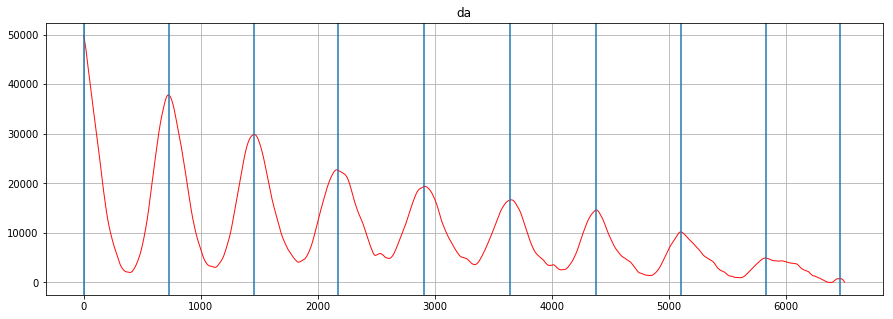

chunk number 20


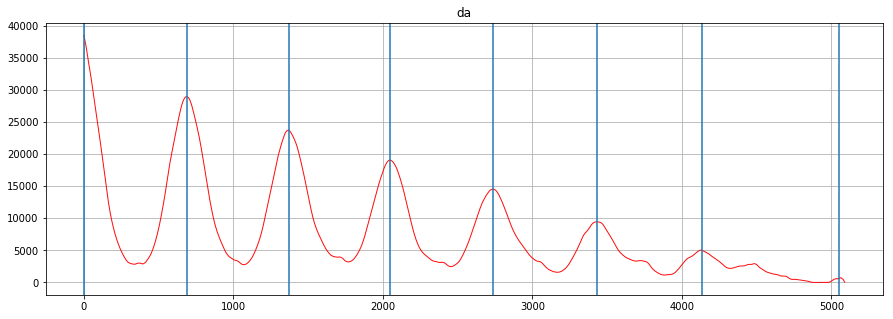

chunk number 21


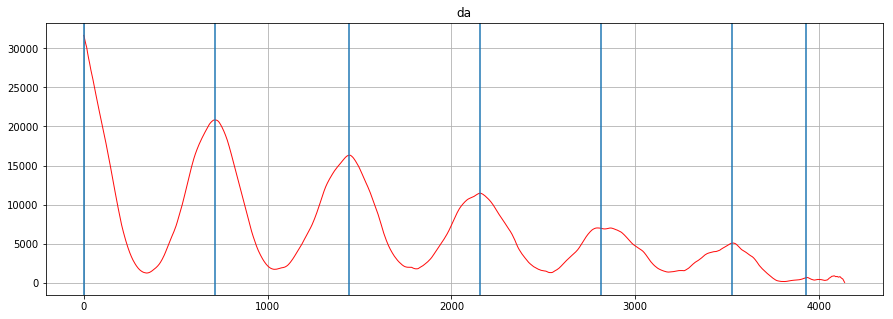

chunk number 22


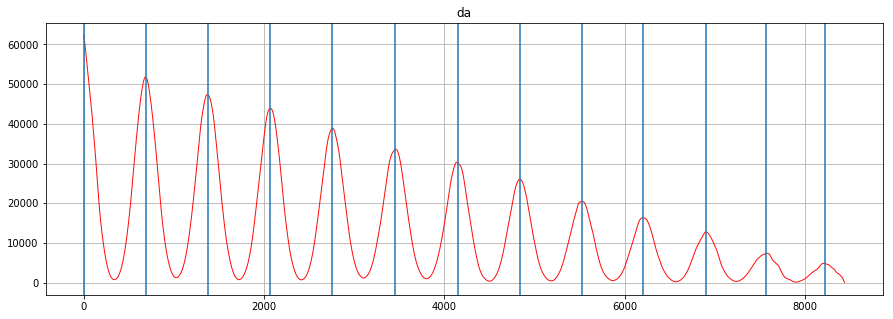

chunk number 23


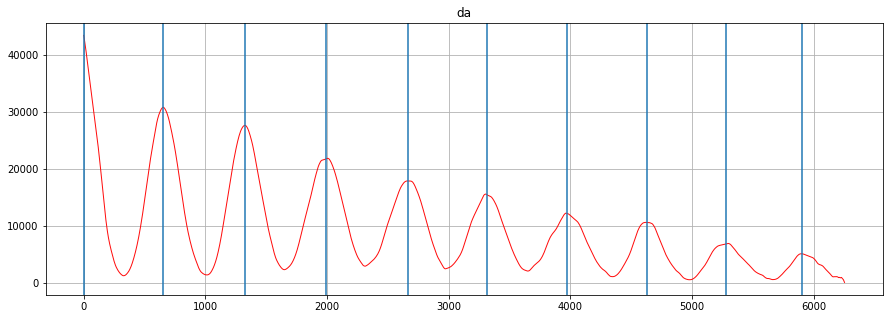

chunk number 24


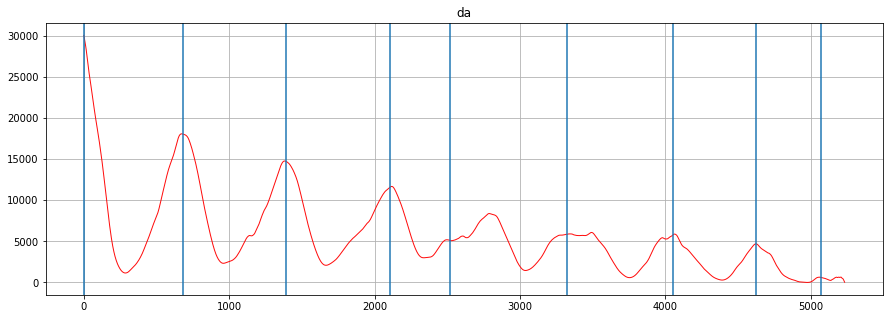

chunk number 25


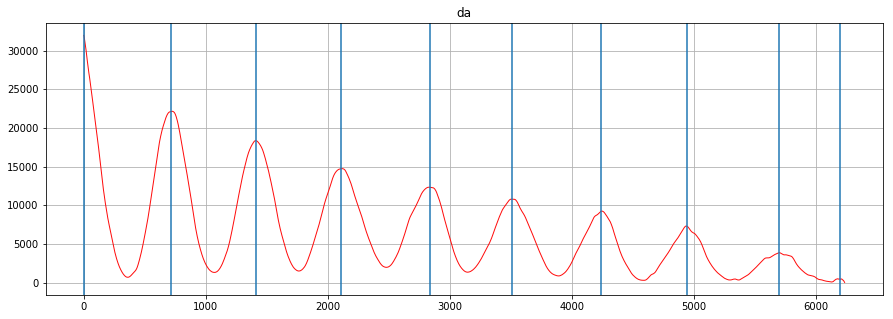

chunk number 26


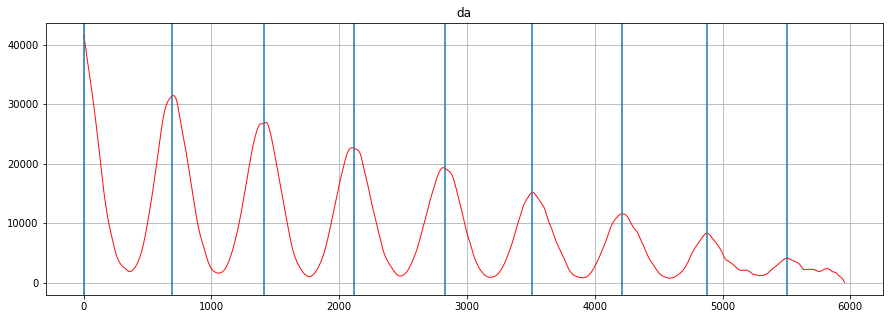

chunk number 27


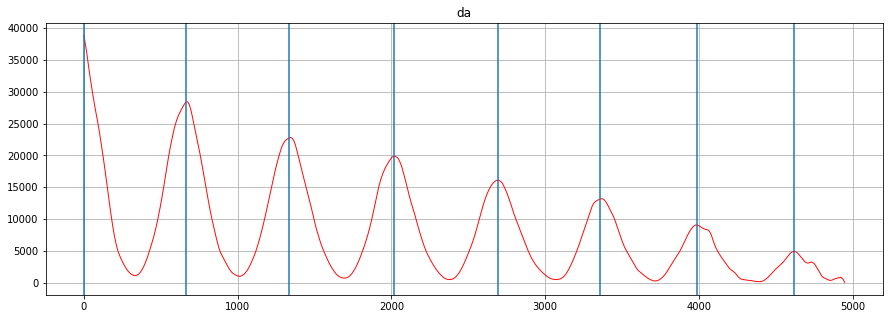

chunk number 28


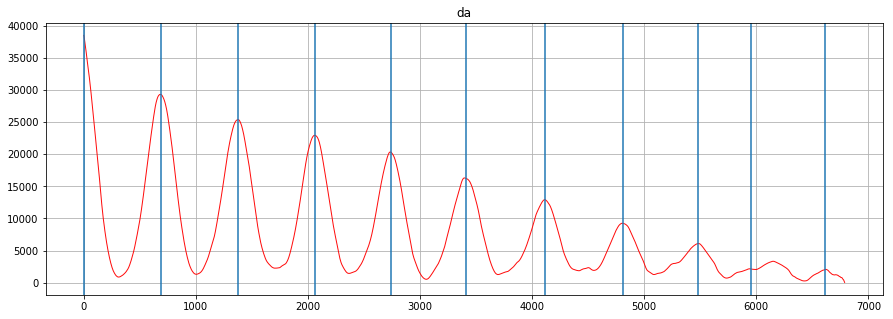

chunk number 29


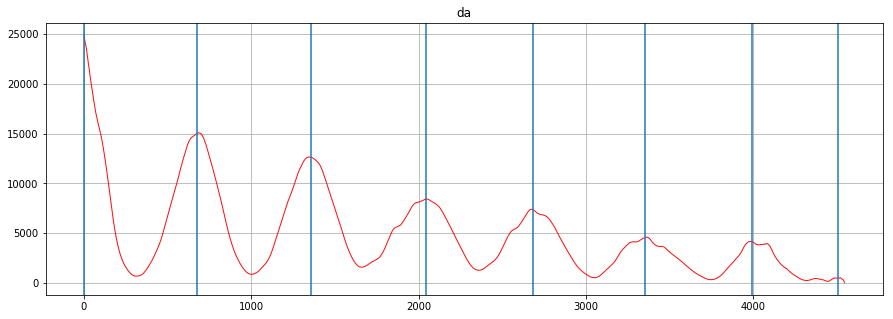

chunk number 30


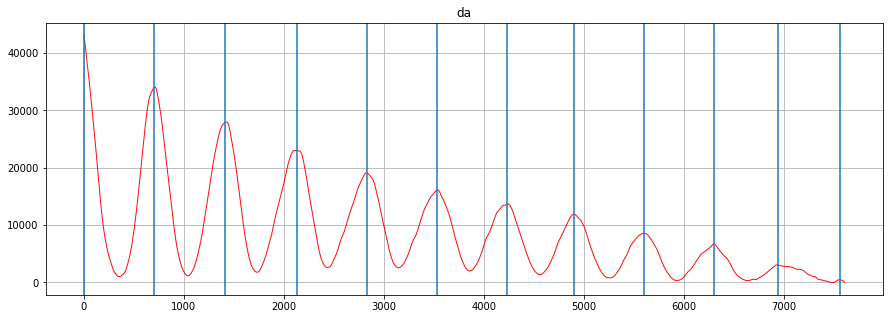

chunk number 31


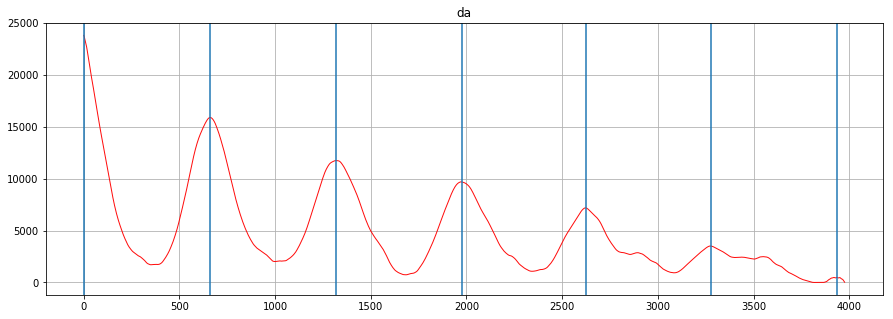

chunk number 32


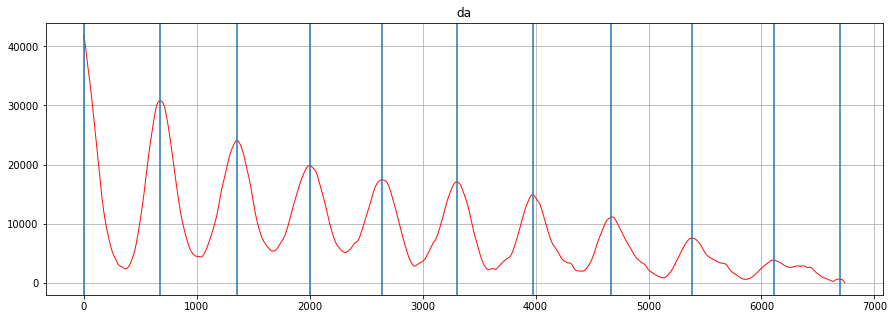

chunk number 33


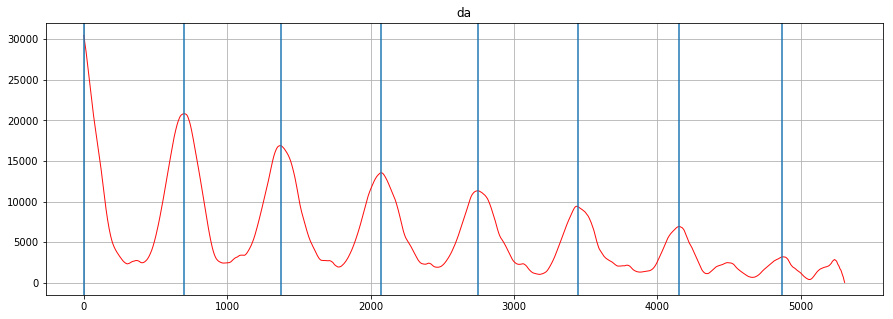

chunk number 34


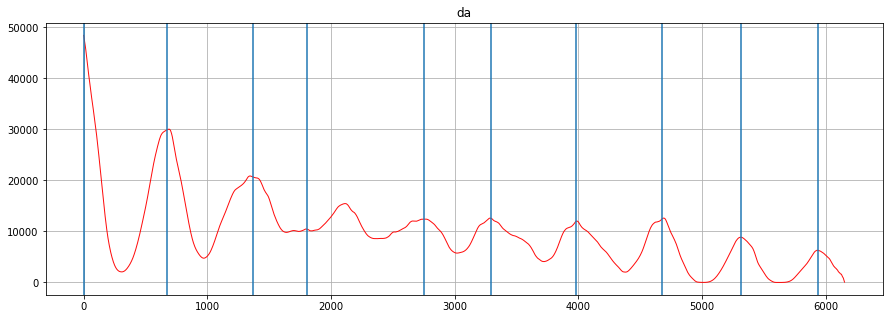

chunk number 35


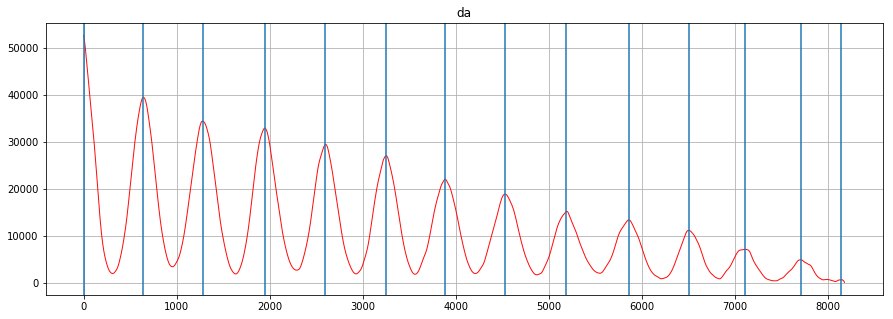

chunk number 36


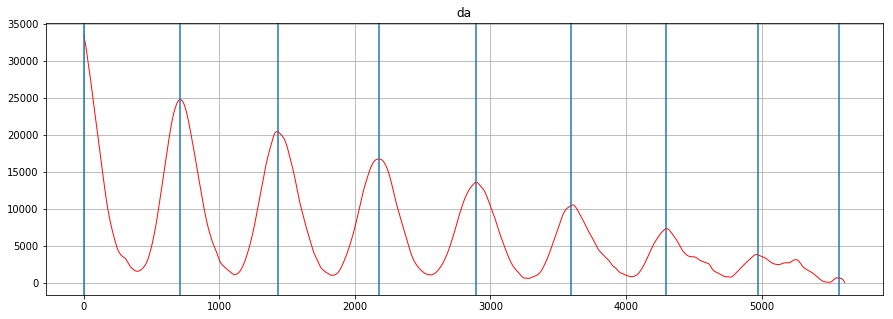

chunk number 37


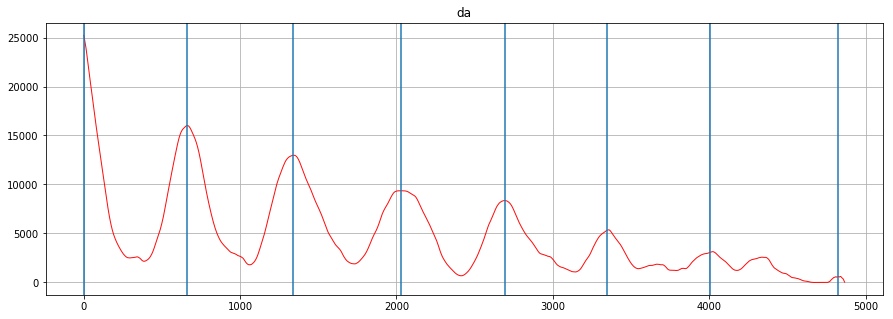

chunk number 38


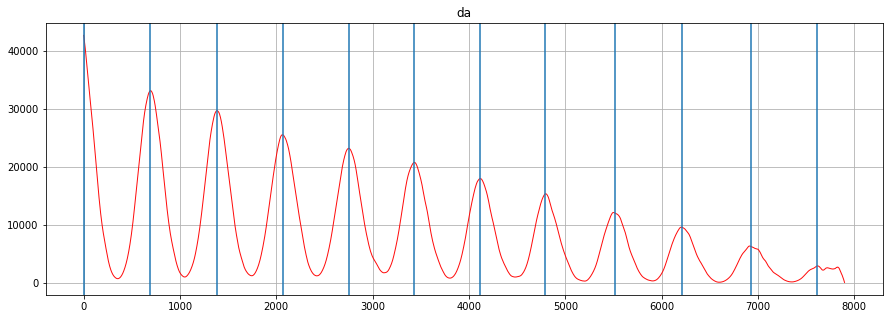

chunk number 39


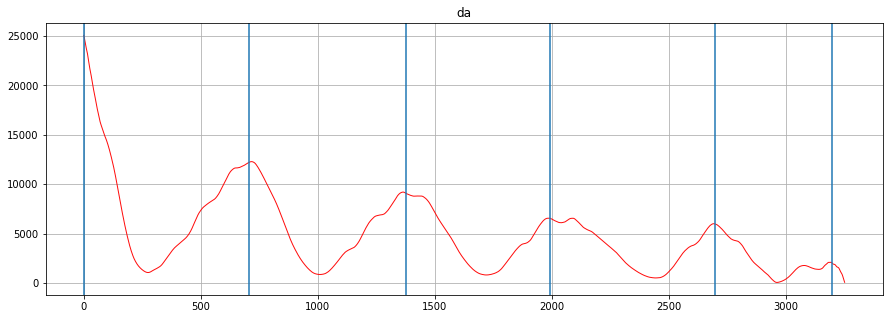

chunk number 40


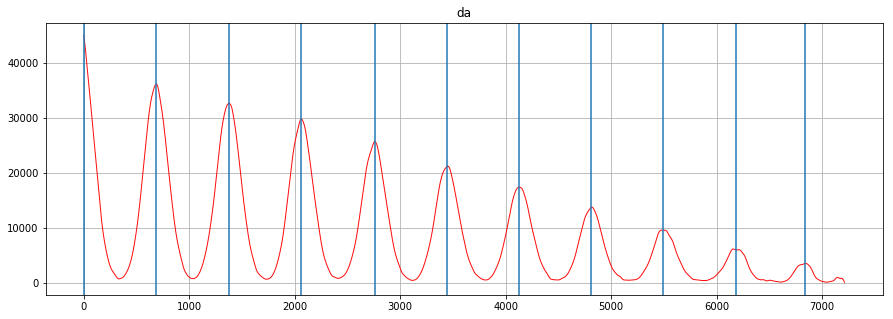

chunk number 41


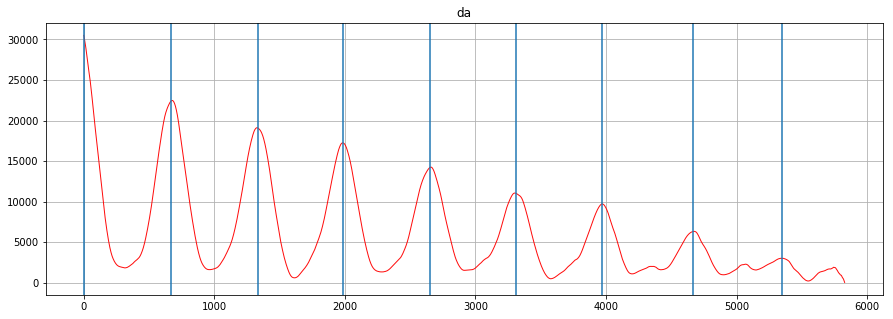

chunk number 42


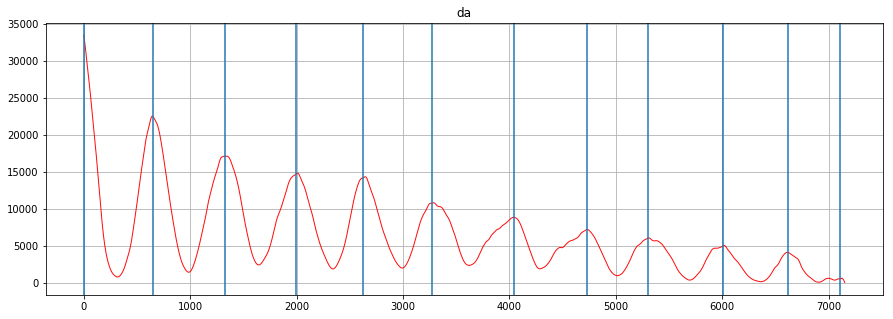

chunk number 43


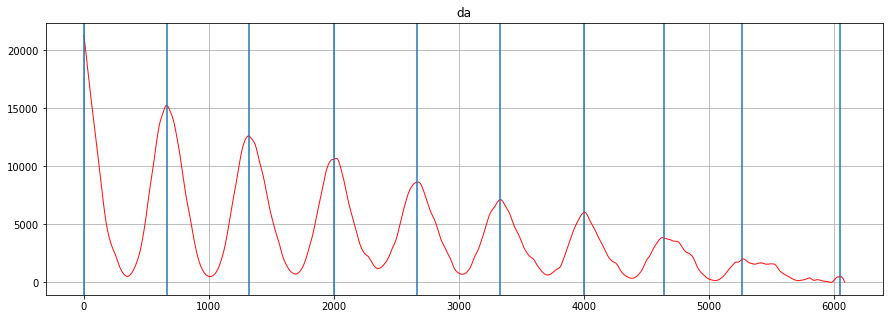

chunk number 44


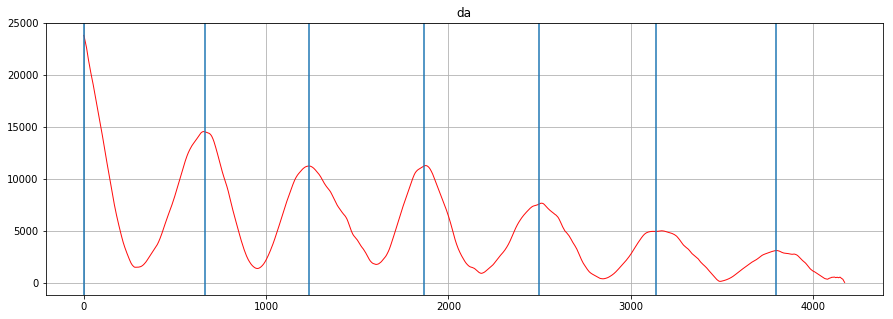

chunk number 45


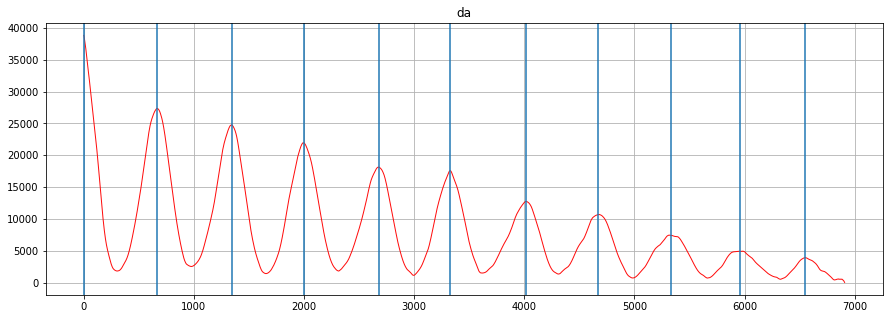

chunk number 46


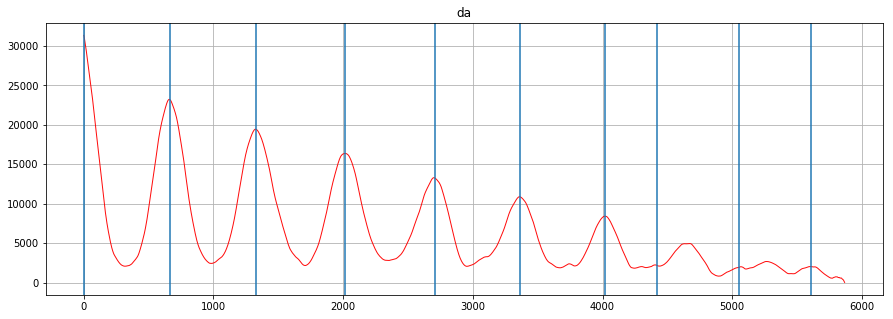

chunk number 47


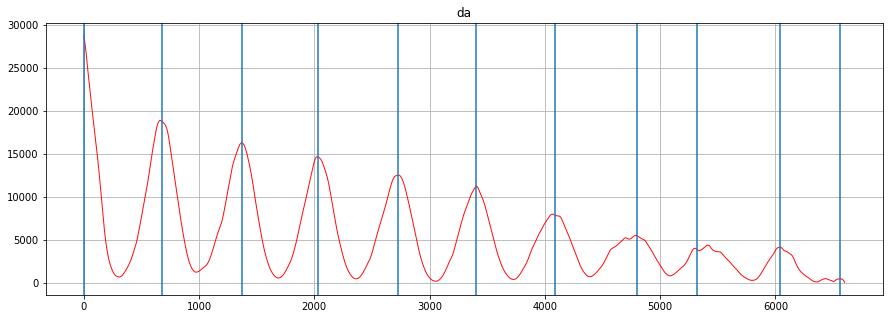

chunk number 48


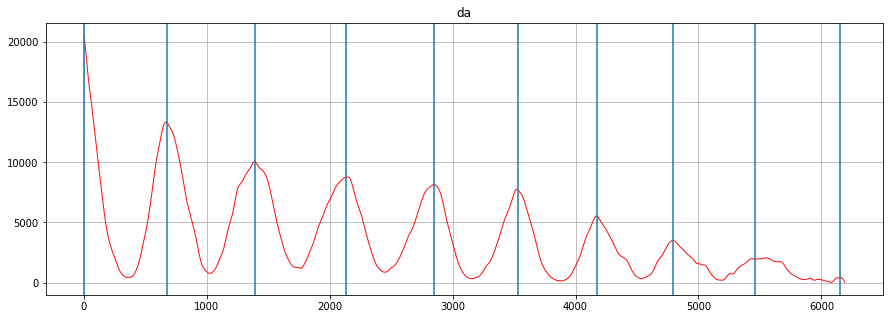

chunk number 49


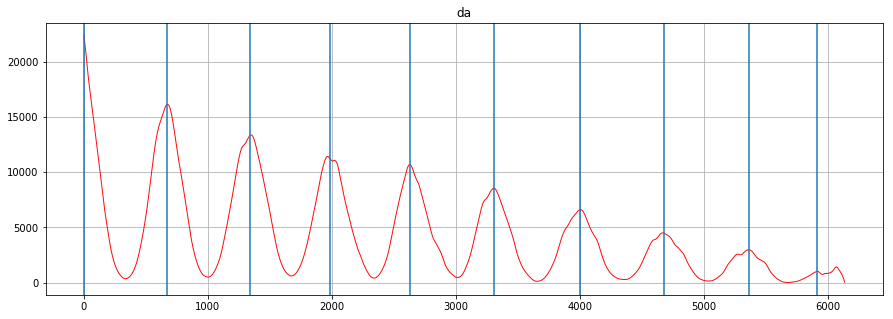

chunk number 50


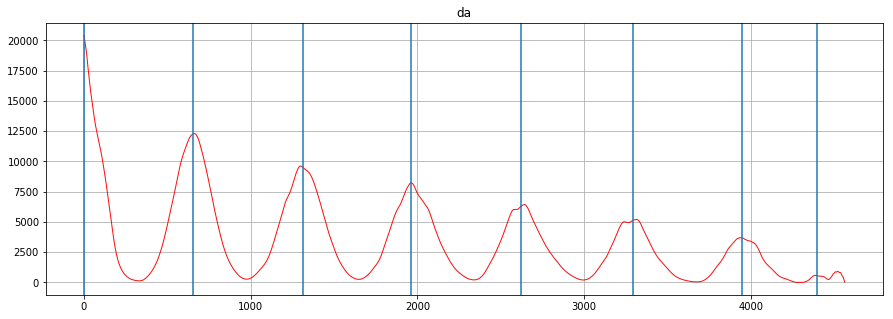

chunk number 51


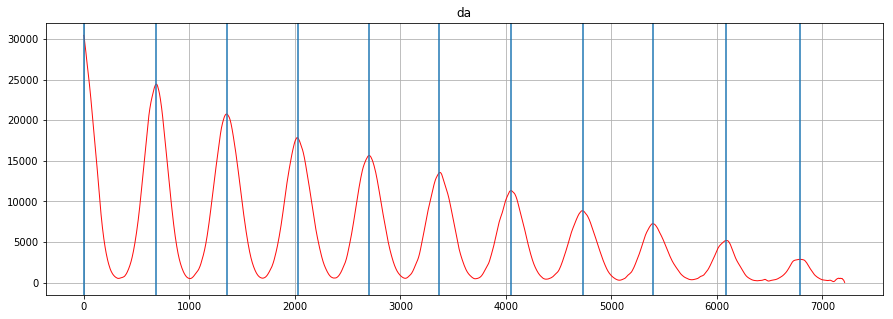

chunk number 52


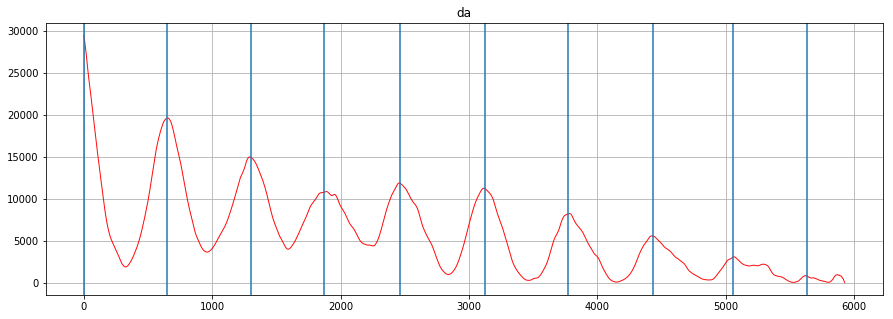

chunk number 53


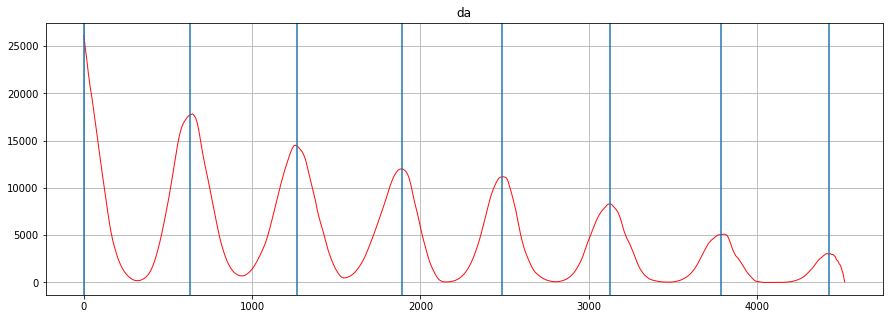

chunk number 54


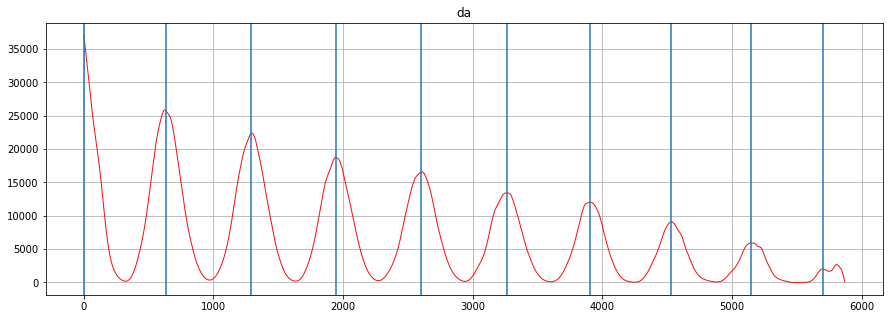

chunk number 55


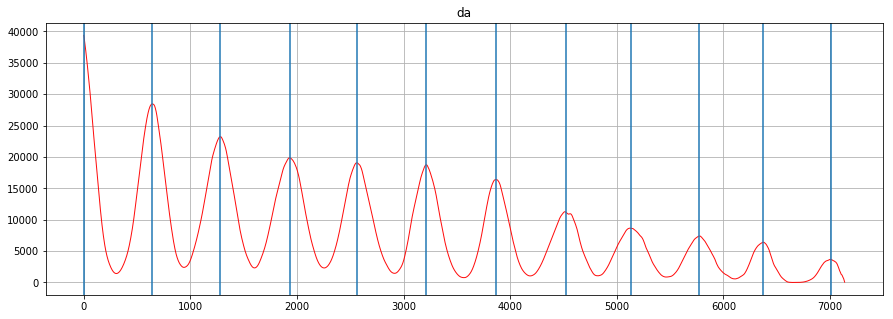

chunk number 56


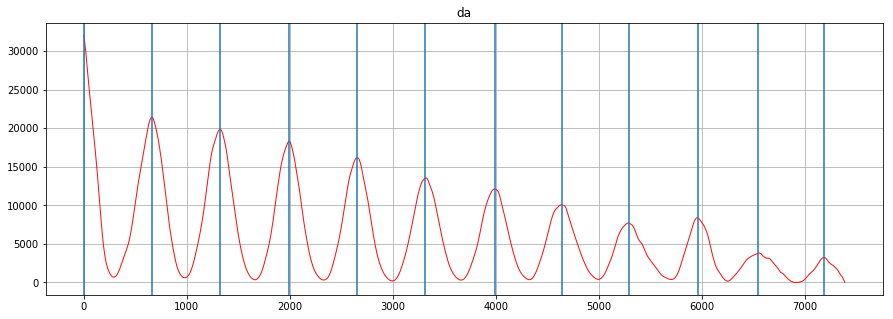

chunk number 57


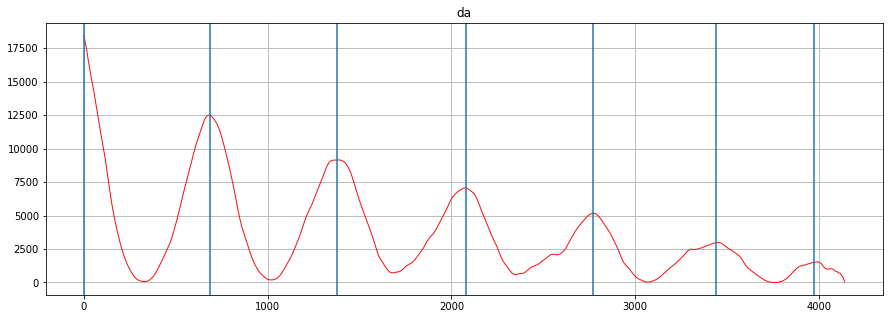

chunk number 58


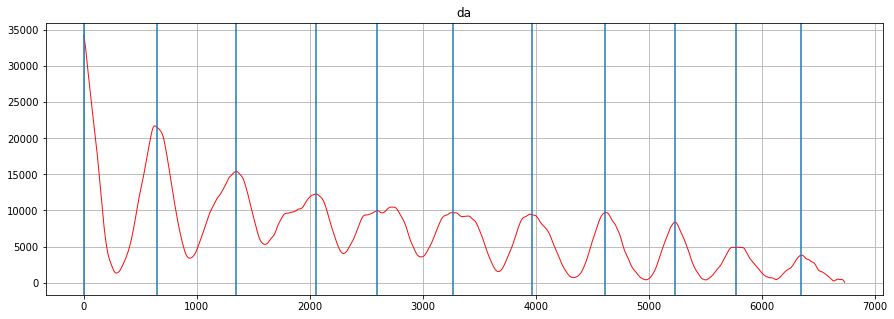

chunk number 59


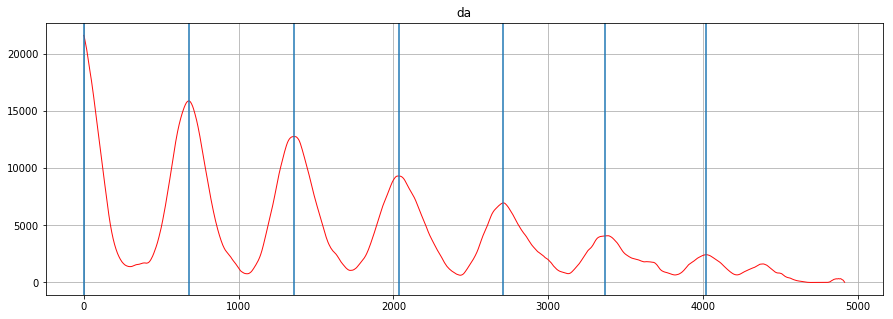

chunk number 60


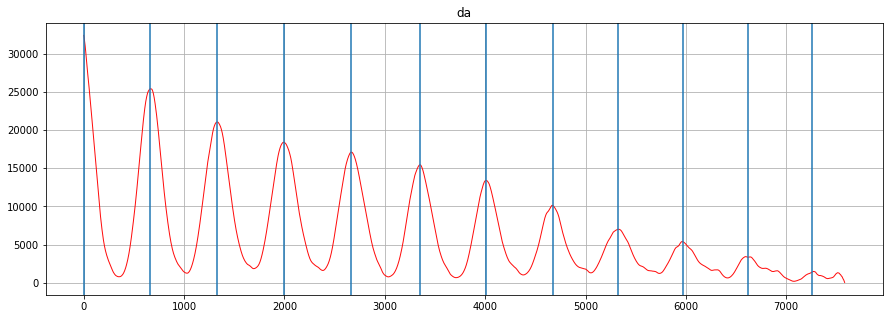

chunk number 61


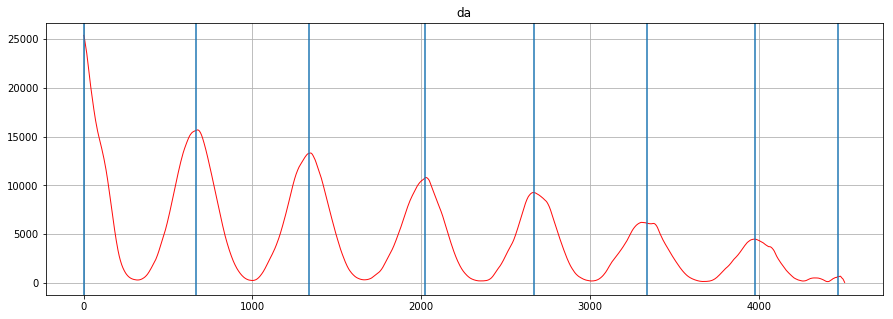

chunk number 62


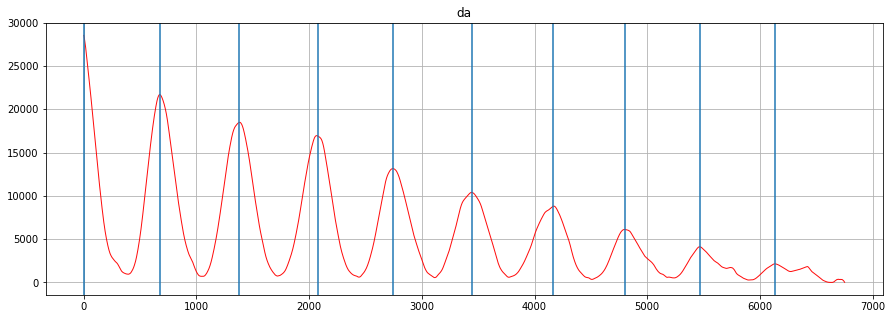

chunk number 63


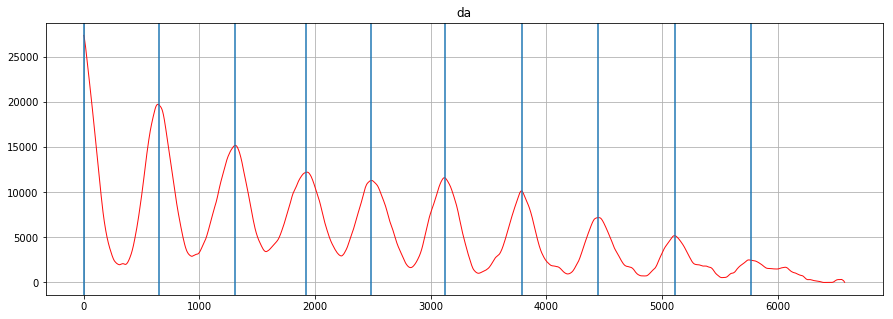

chunk number 64


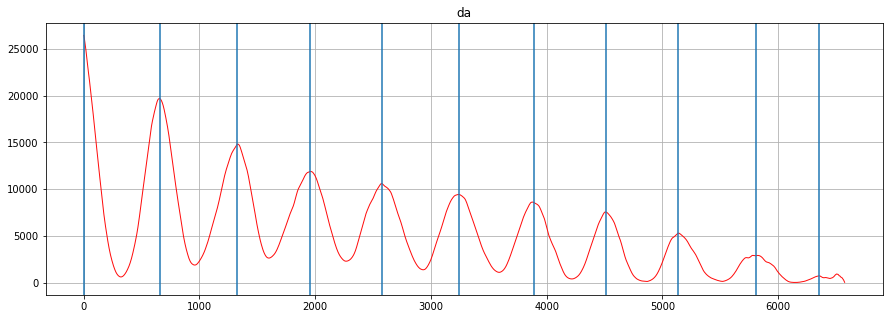

chunk number 65


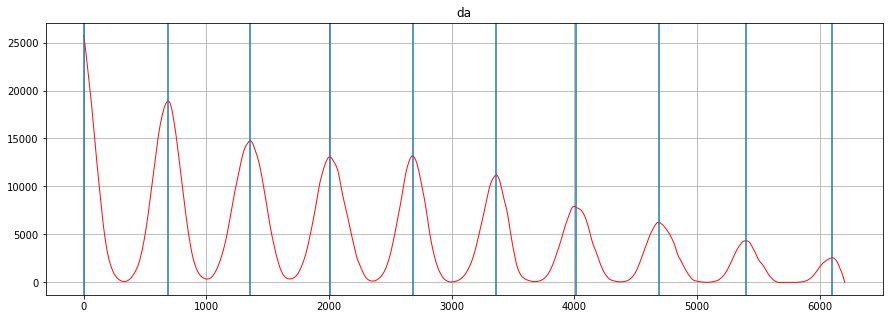

chunk number 66


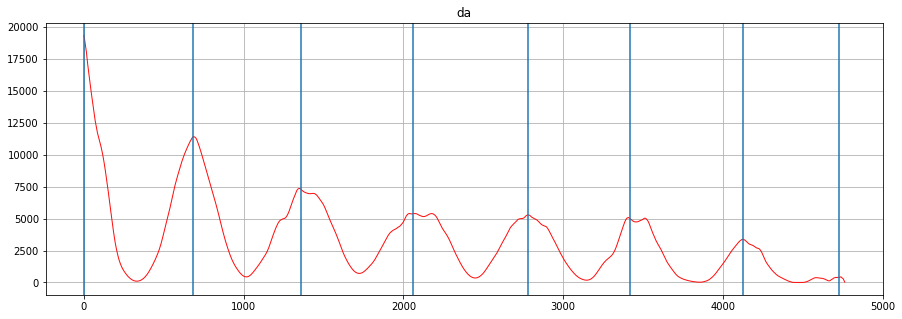

chunk number 67


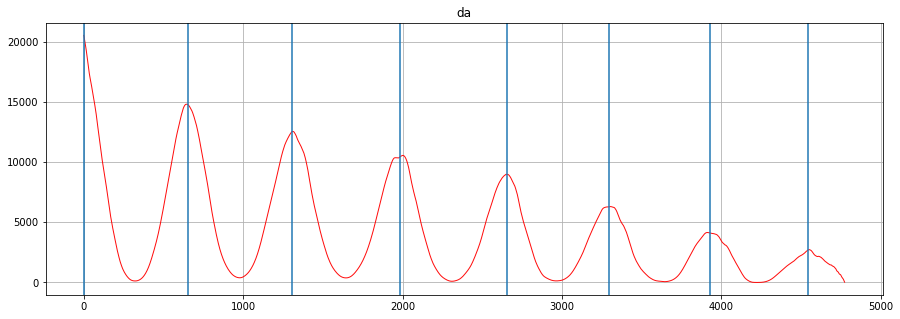

chunk number 68


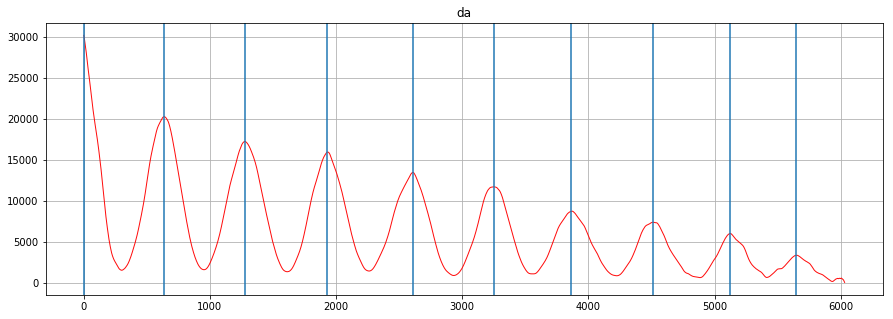

chunk number 69


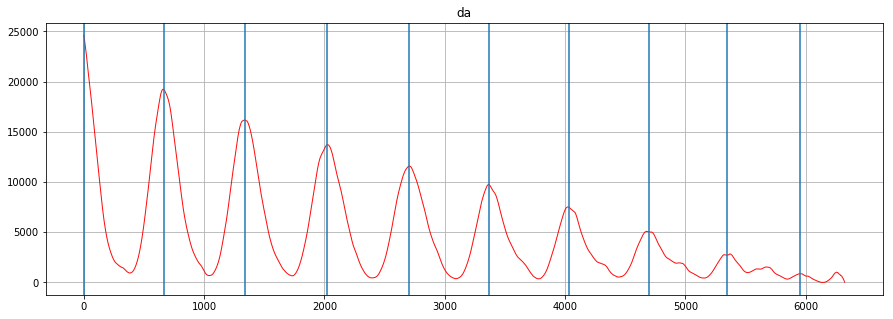

chunk number 70


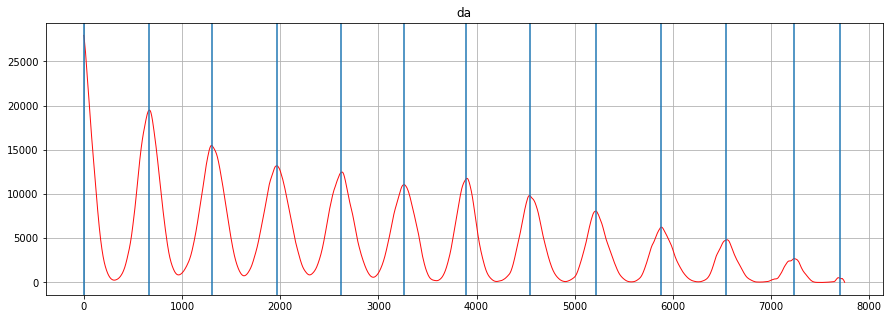

chunk number 71


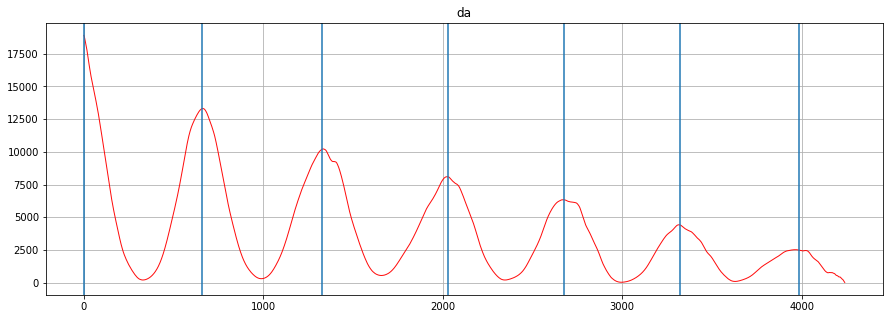

chunk number 72


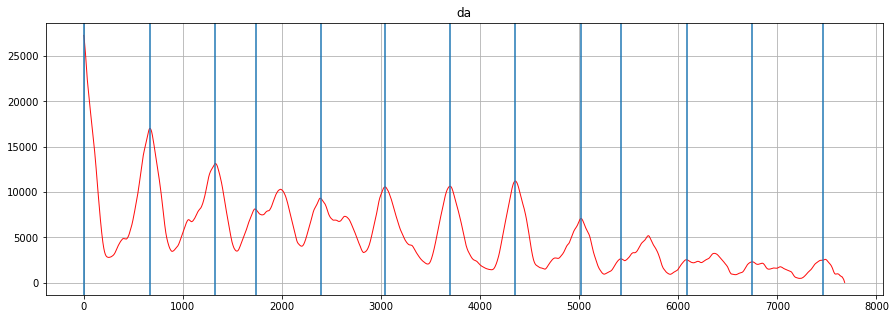

chunk number 73


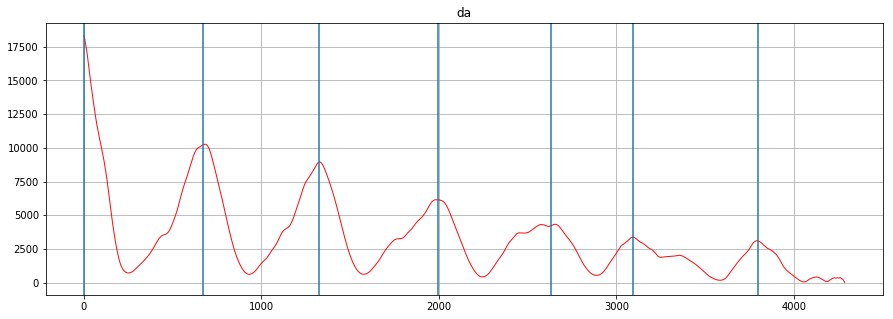

chunk number 74


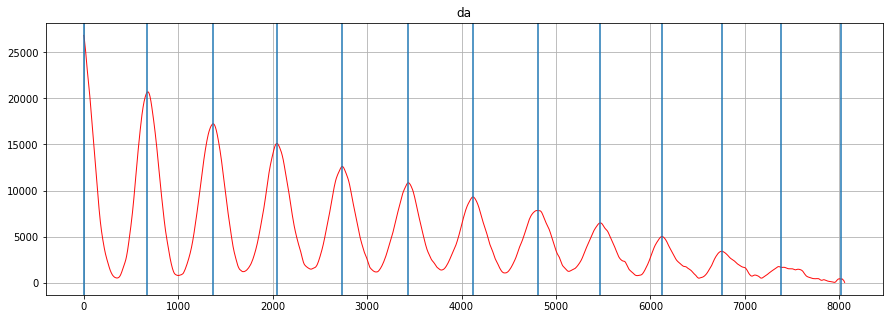

chunk number 75


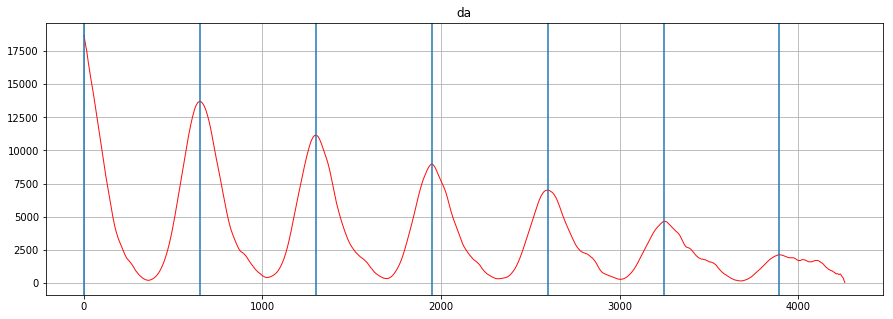

chunk number 76


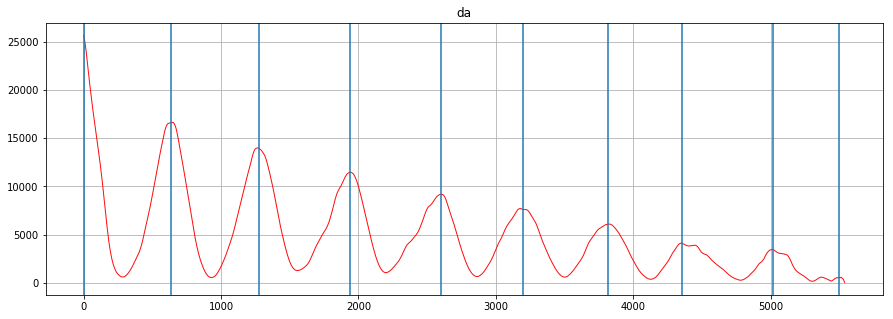

chunk number 77


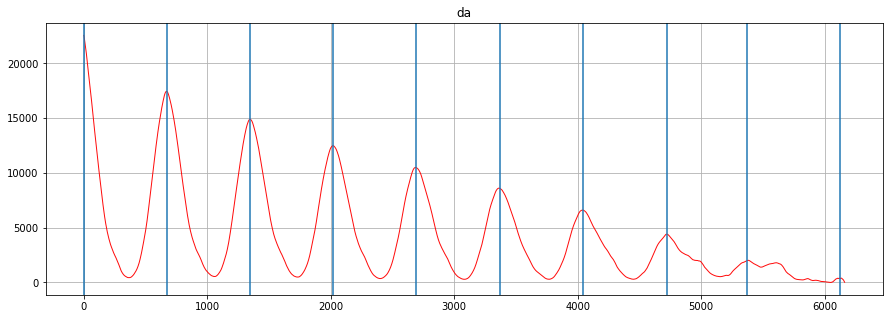

chunk number 78


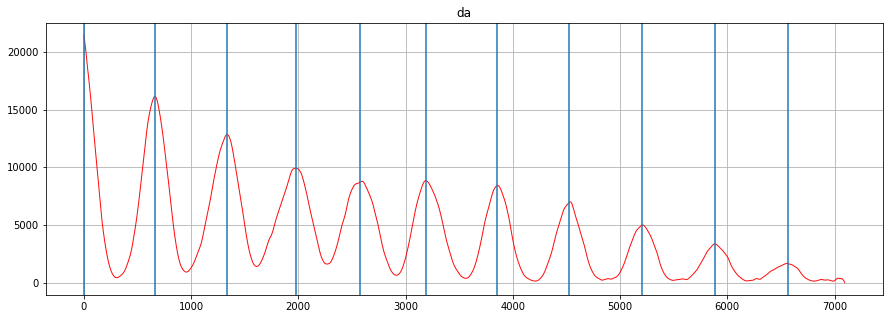

chunk number 79


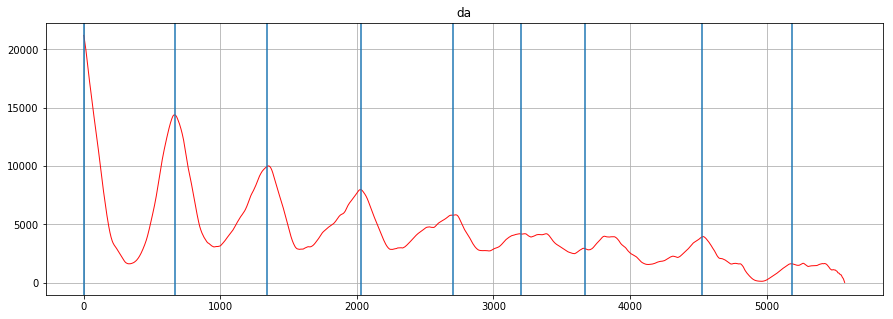

chunk number 80


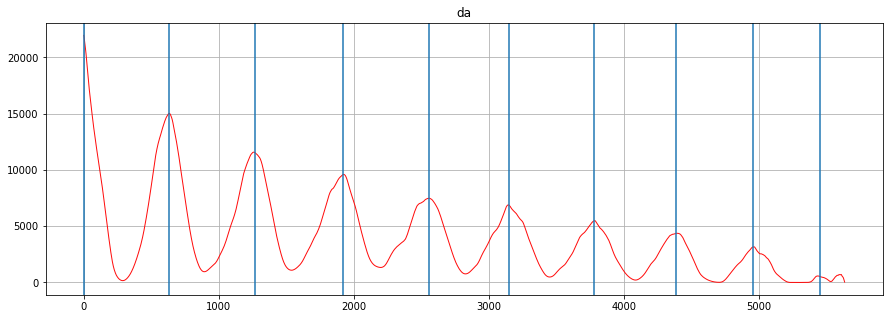

chunk number 81


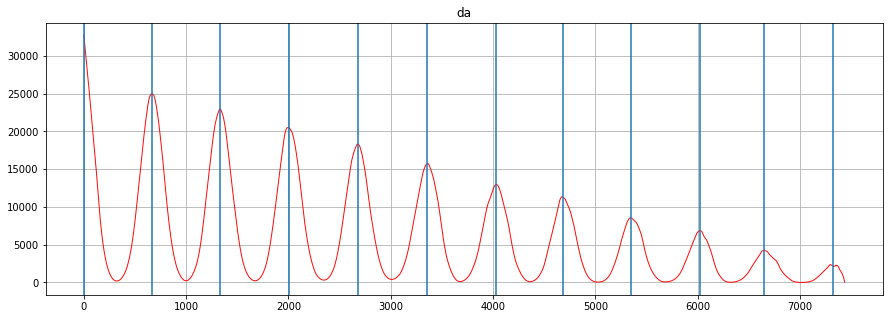

chunk number 82


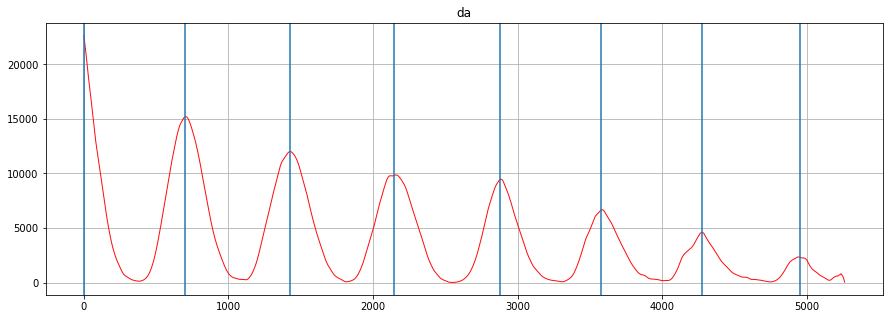

chunk number 83


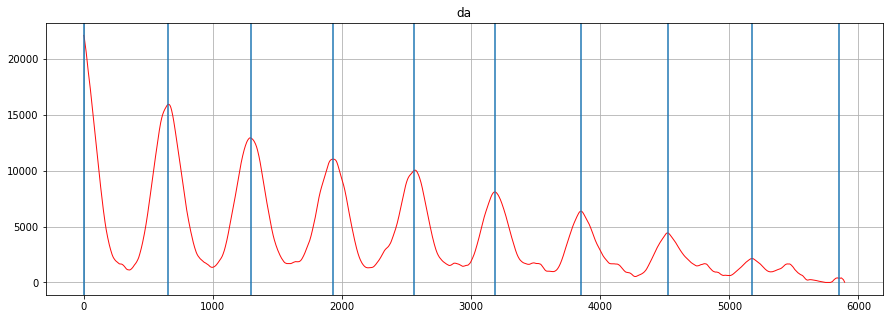

chunk number 84


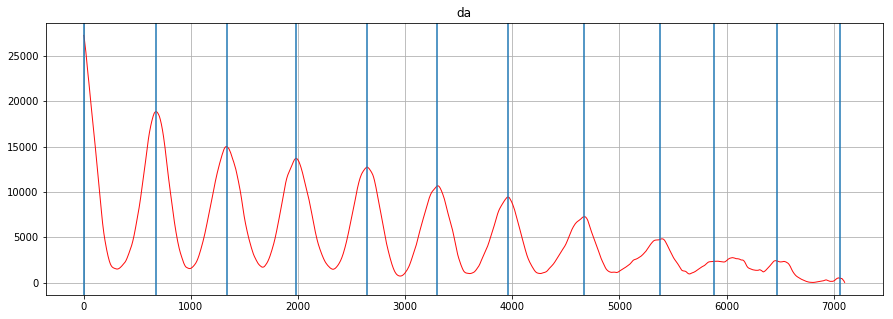

chunk number 85


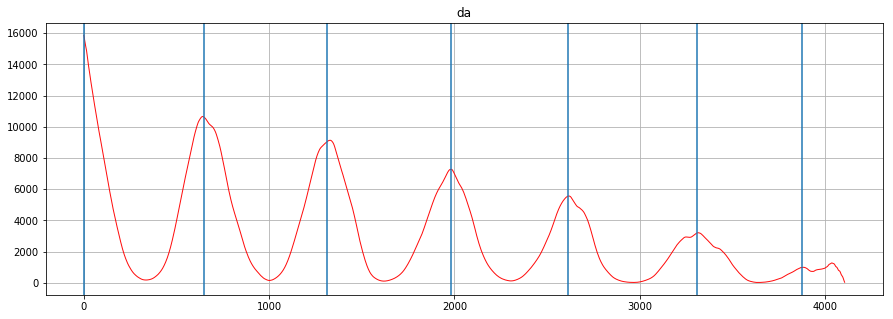

chunk number 86


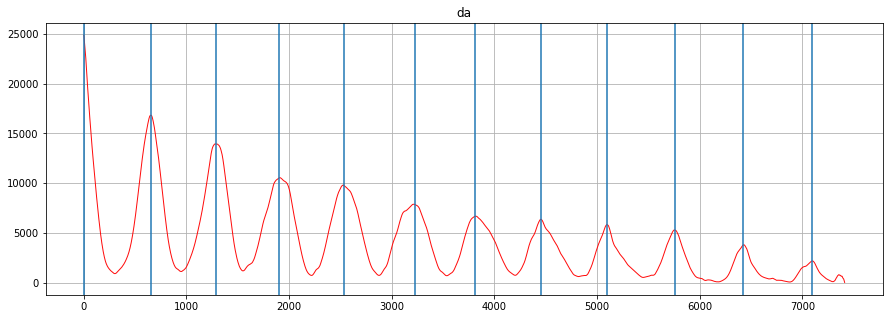

chunk number 87


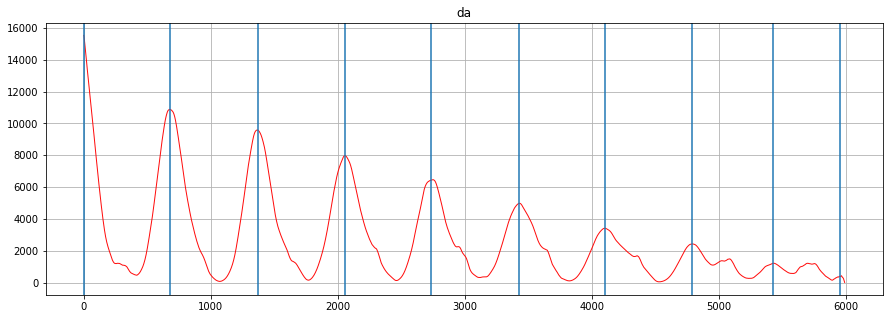

chunk number 88


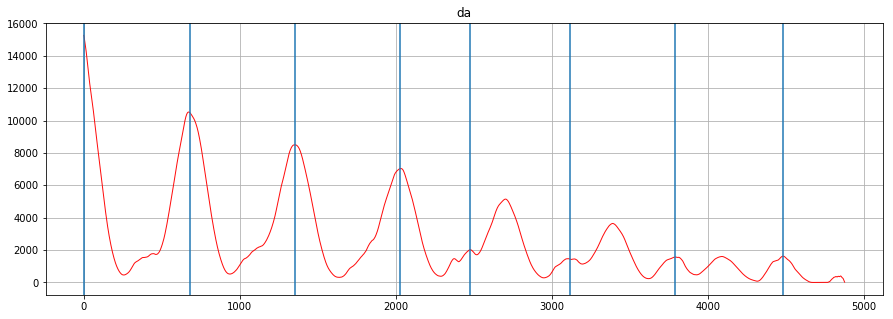

2019-09-04_prc
chunk number 0


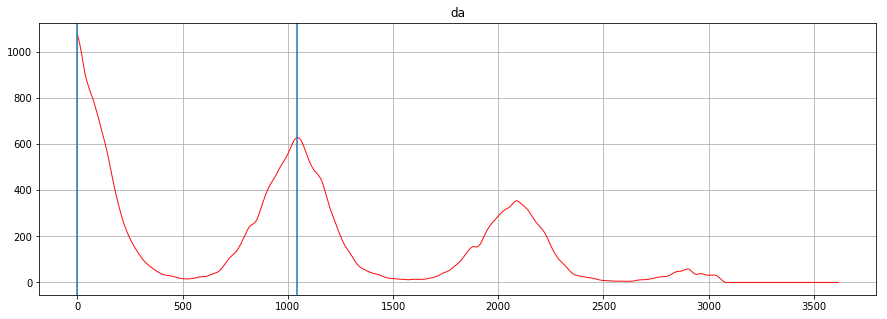

chunk number 1


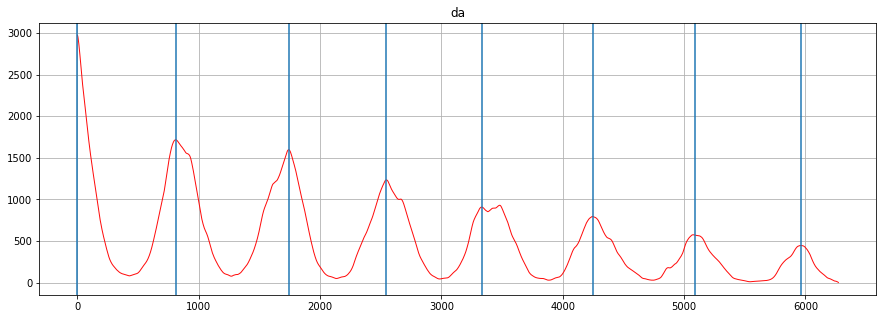

chunk number 2


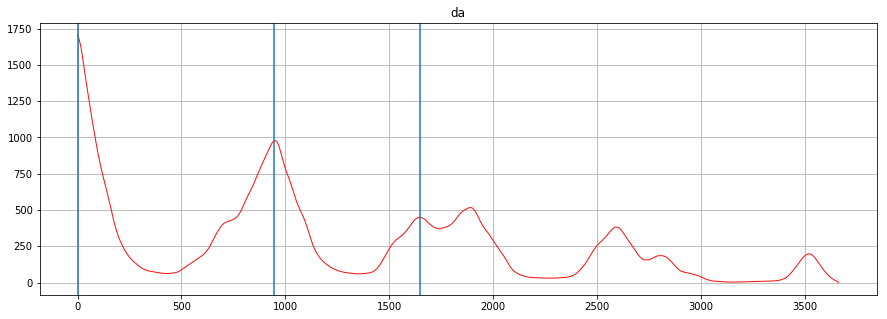

chunk number 3


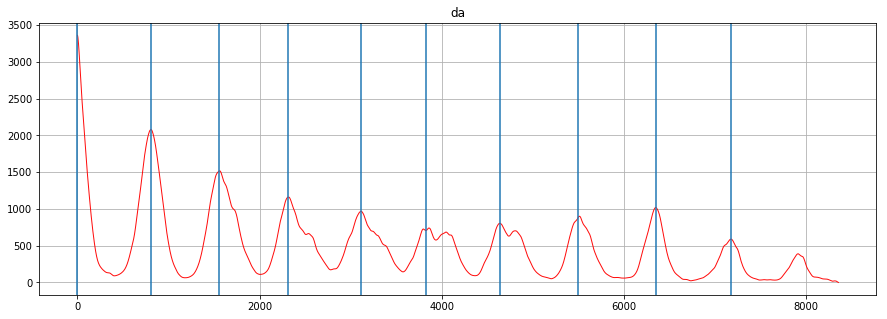

chunk number 4


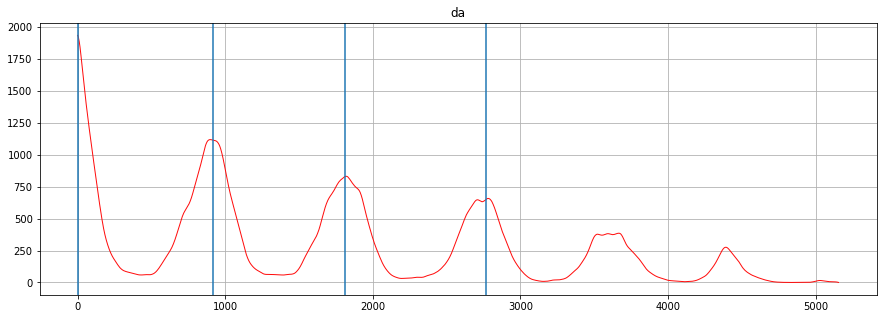

chunk number 5


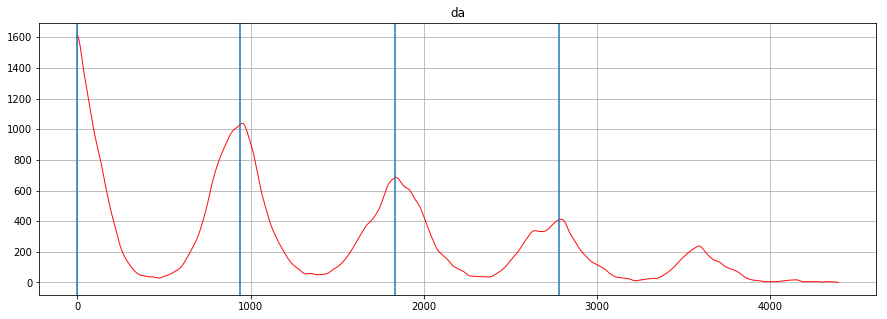

chunk number 6


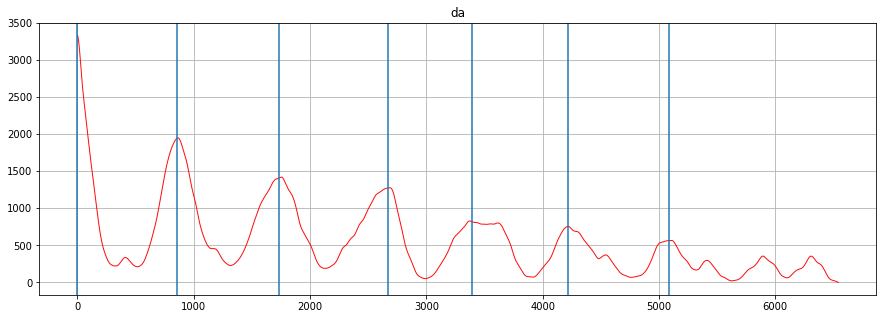

chunk number 7


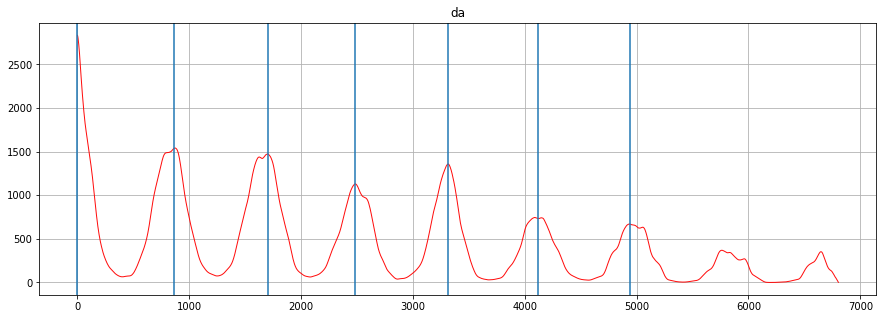

chunk number 8


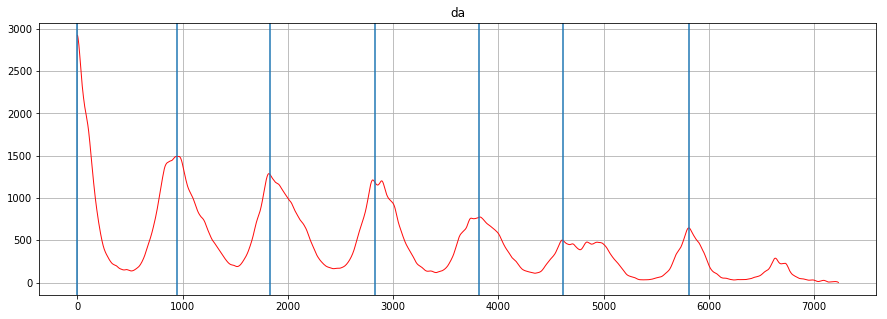

chunk number 9


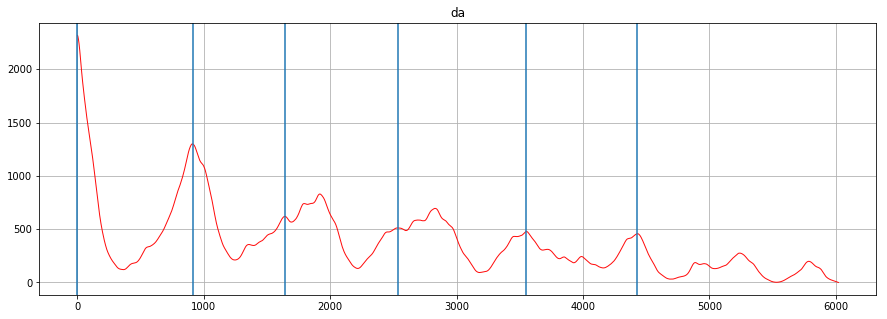

chunk number 10


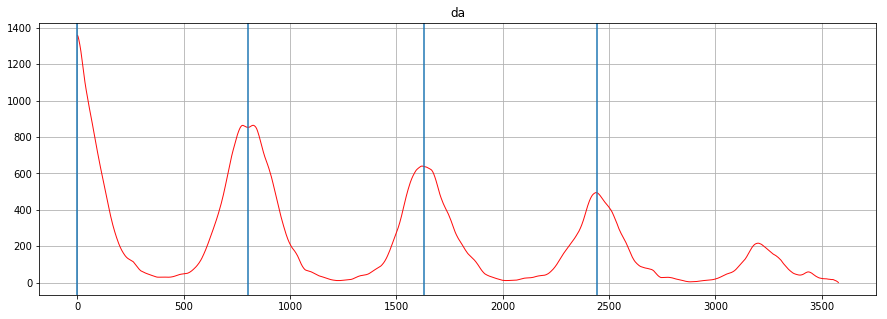

chunk number 11


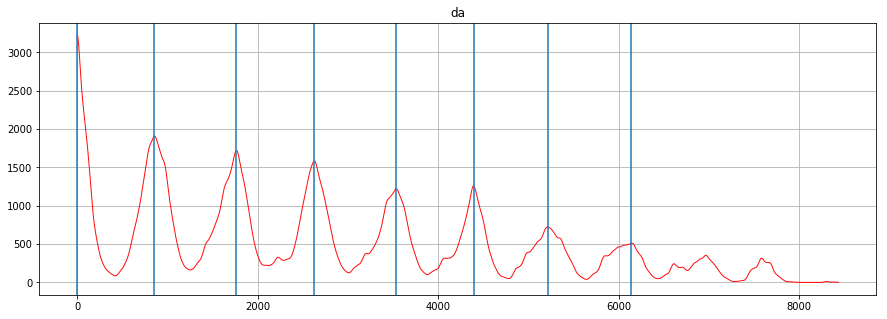

chunk number 12


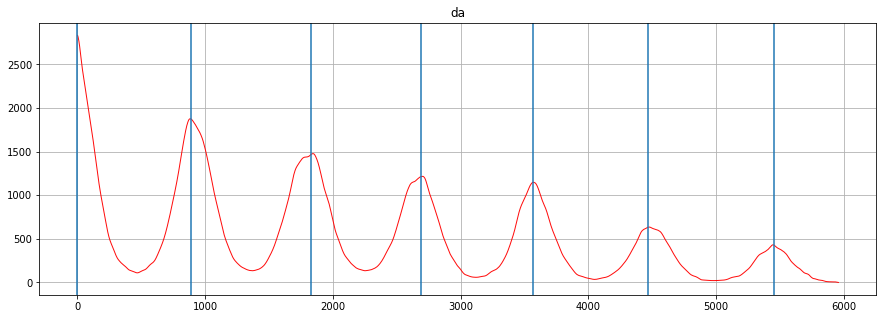

chunk number 13


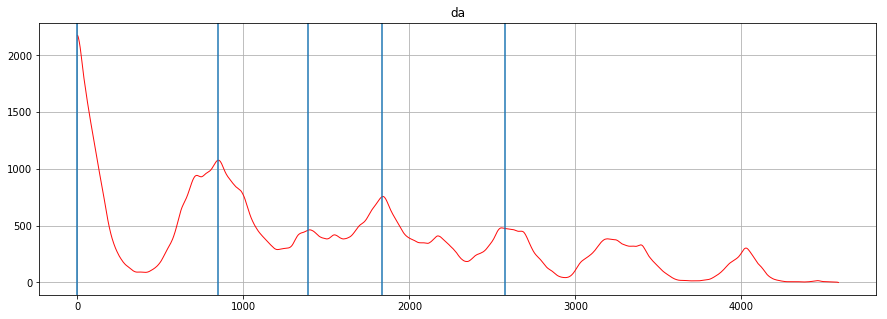

chunk number 14


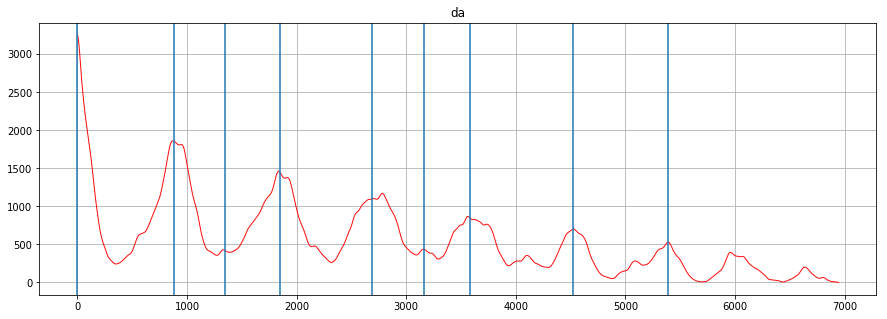

chunk number 15


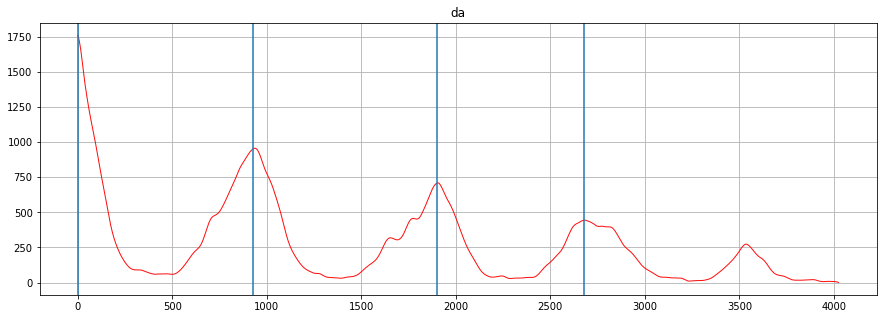

chunk number 16


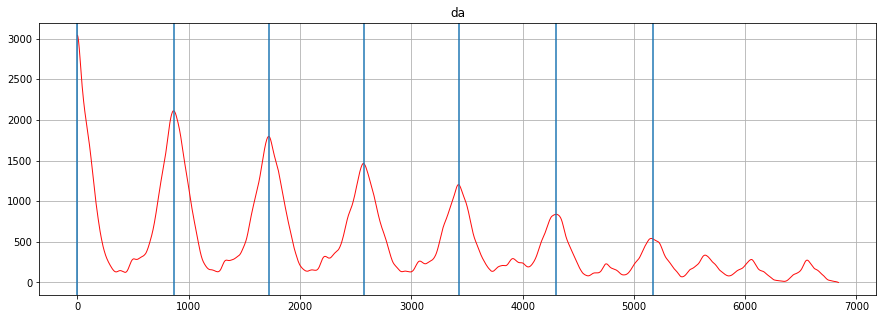

chunk number 17


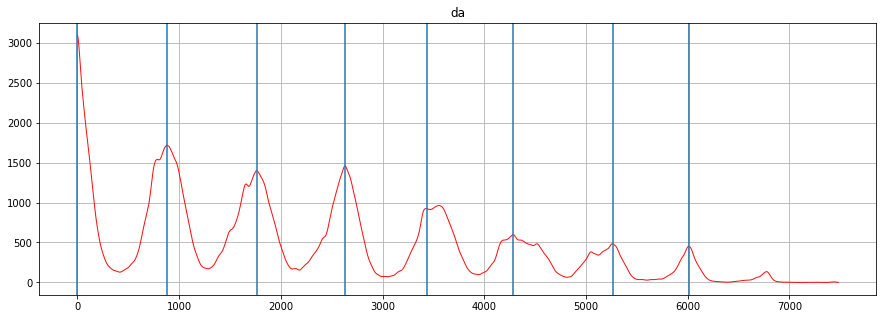

chunk number 18


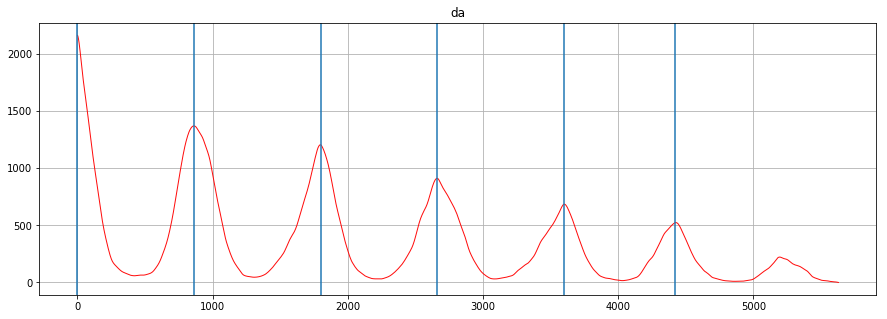

chunk number 19


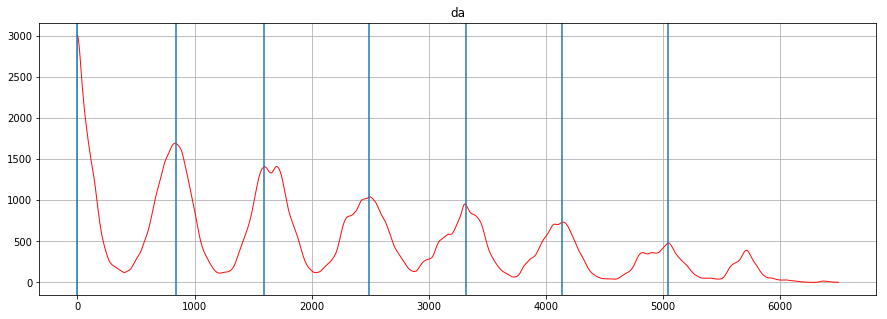

chunk number 20


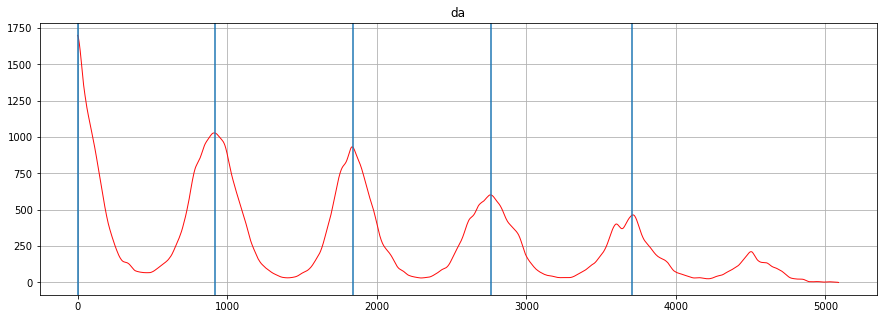

chunk number 21


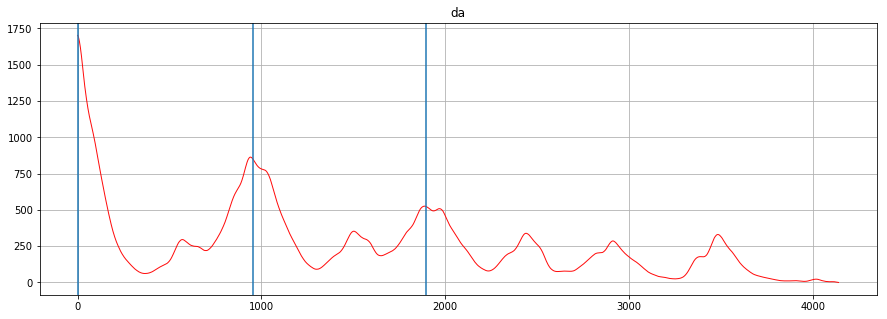

chunk number 22


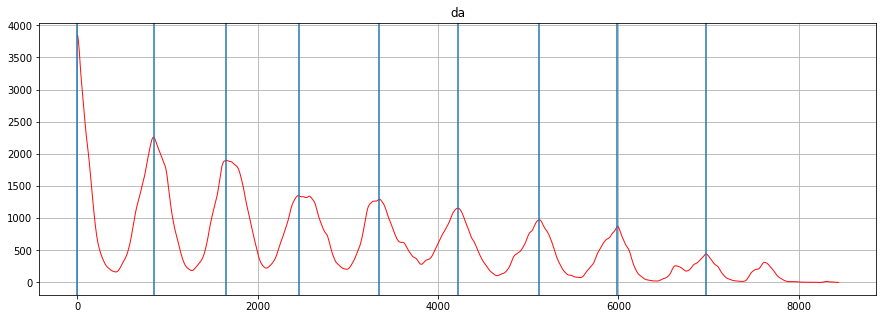

chunk number 23


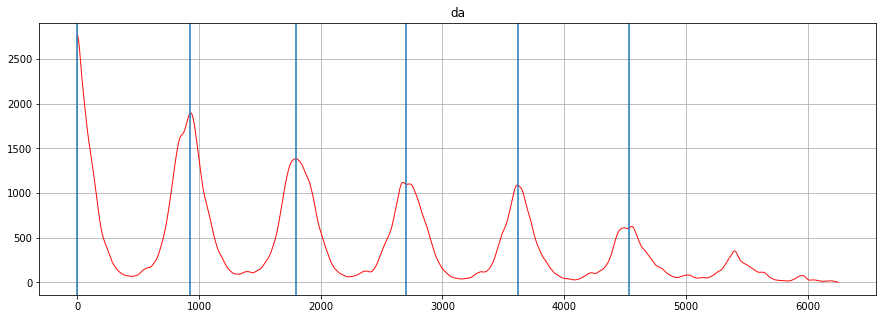

chunk number 24


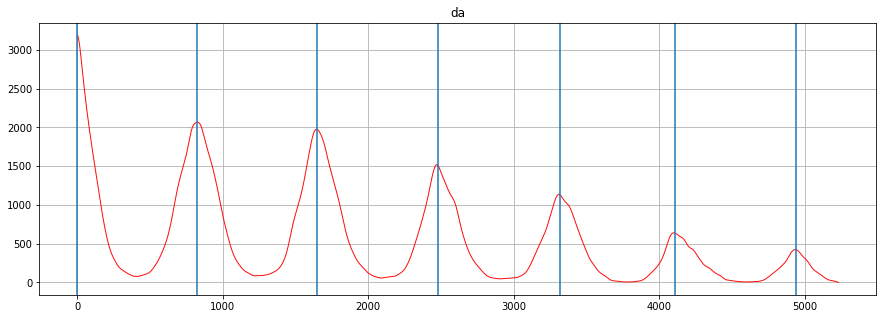

chunk number 25


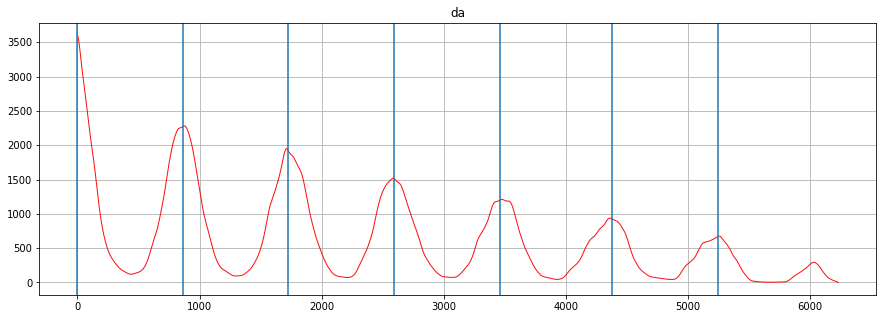

chunk number 26


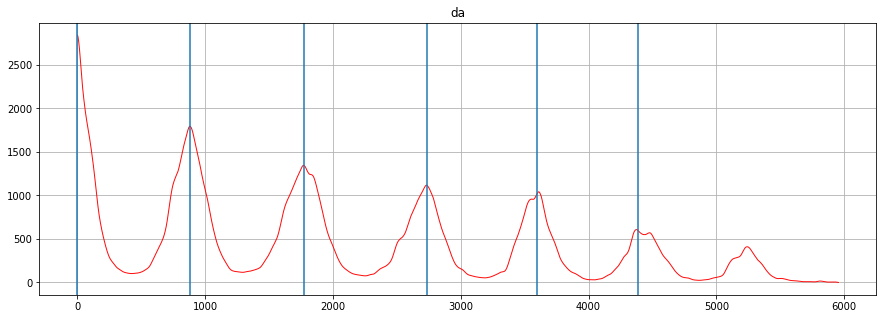

chunk number 27


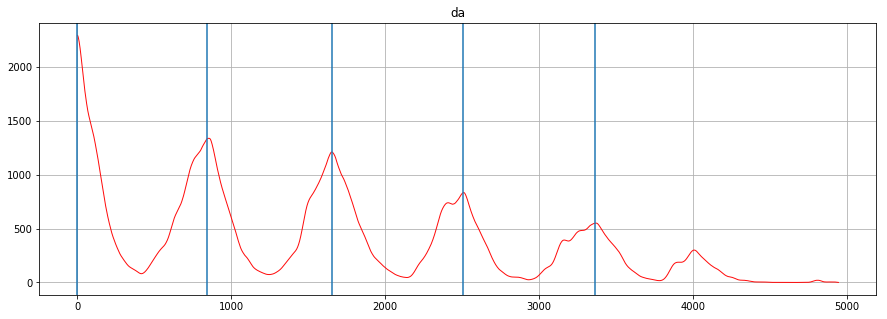

chunk number 28


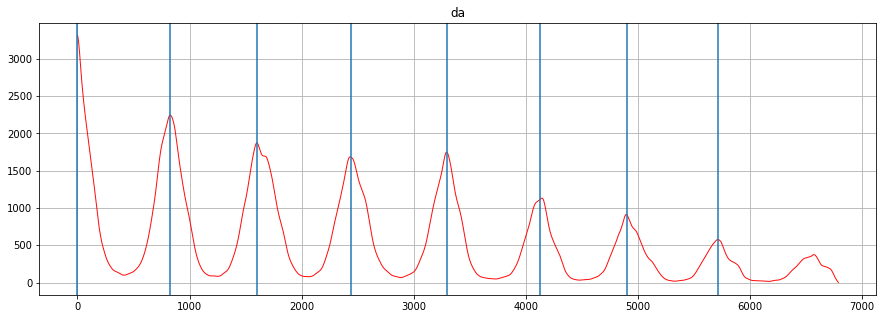

chunk number 29


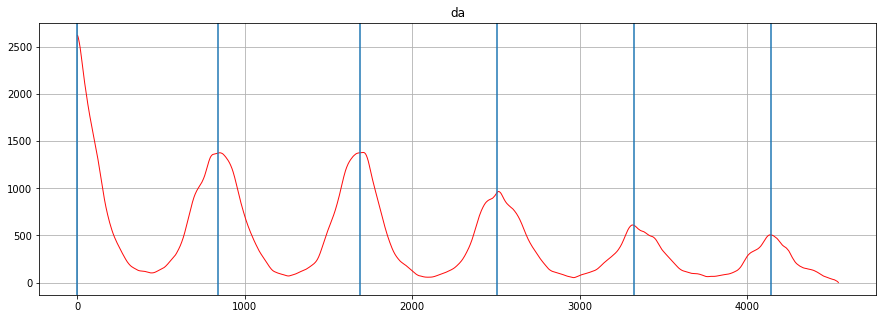

chunk number 30


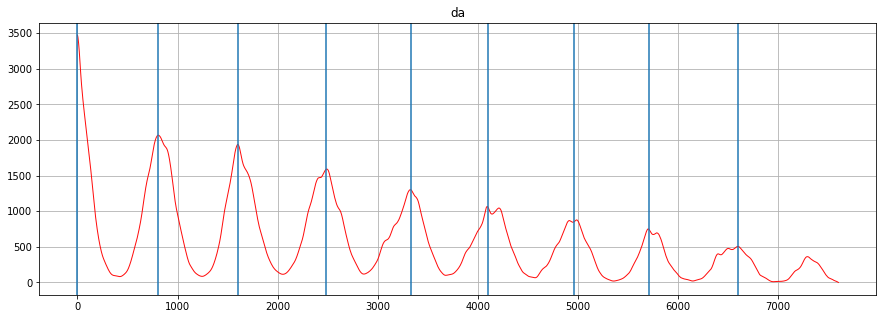

chunk number 31


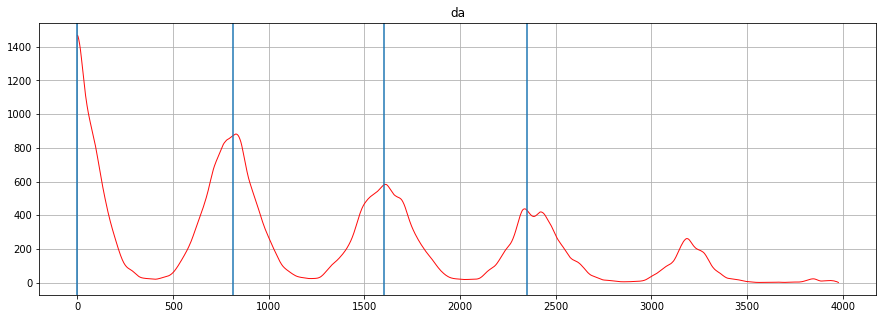

chunk number 32


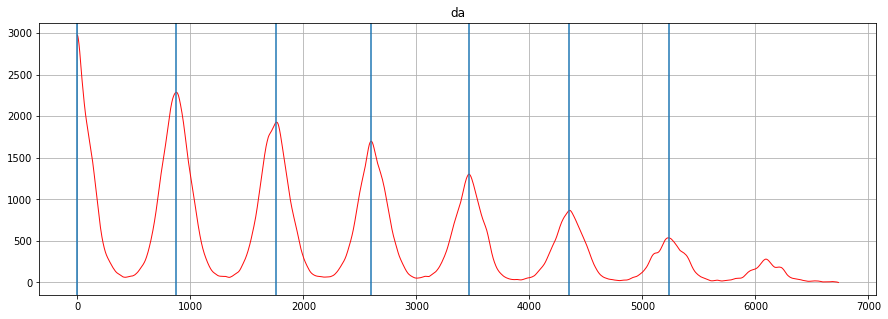

chunk number 33


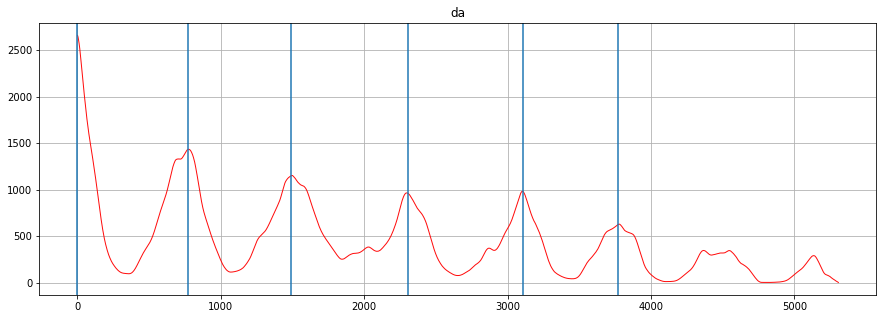

chunk number 34


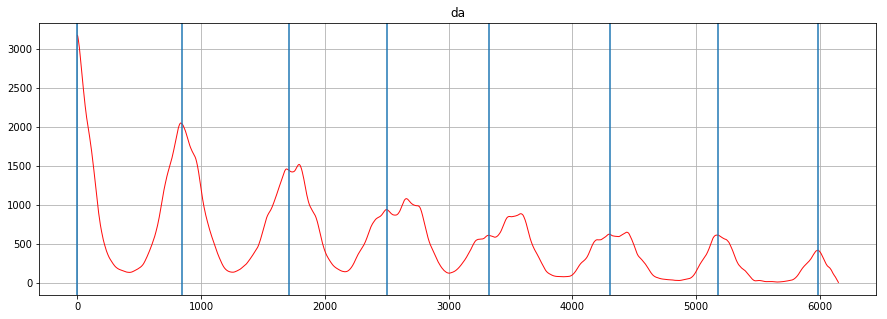

chunk number 35


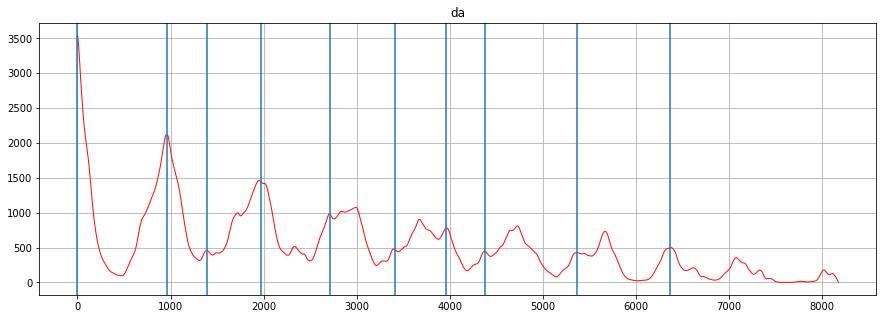

chunk number 36


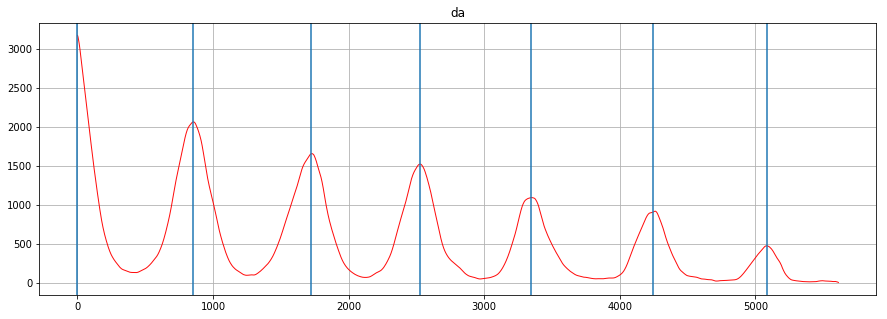

chunk number 37


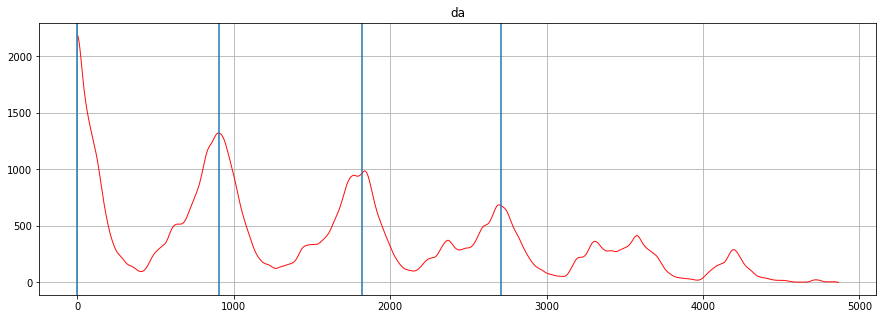

chunk number 38


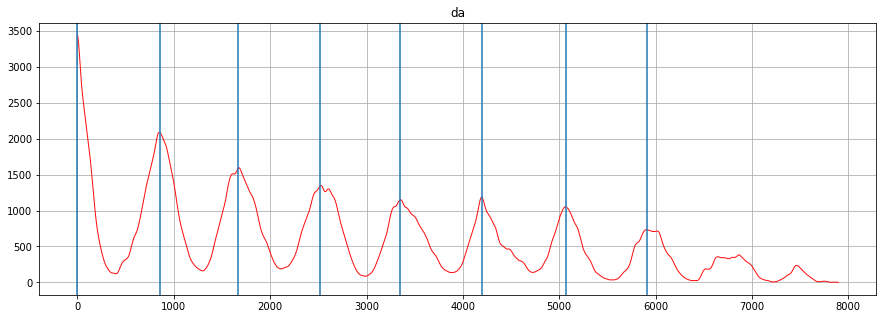

chunk number 39


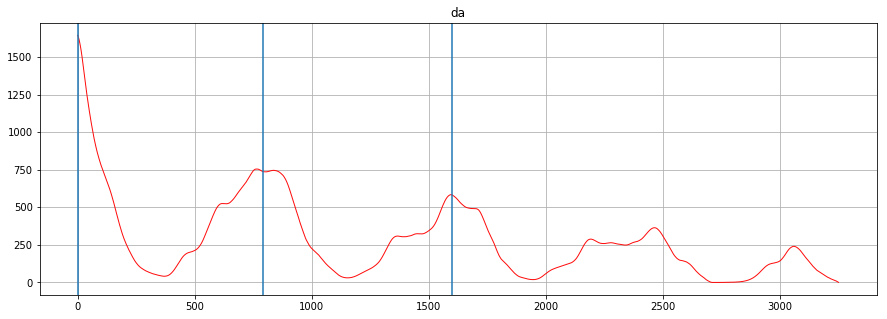

chunk number 40


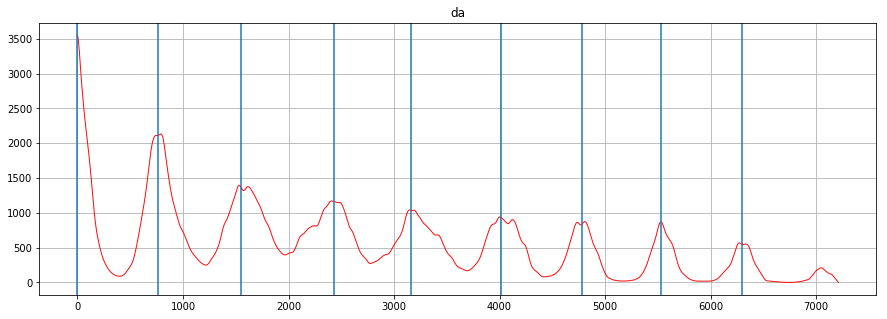

chunk number 41


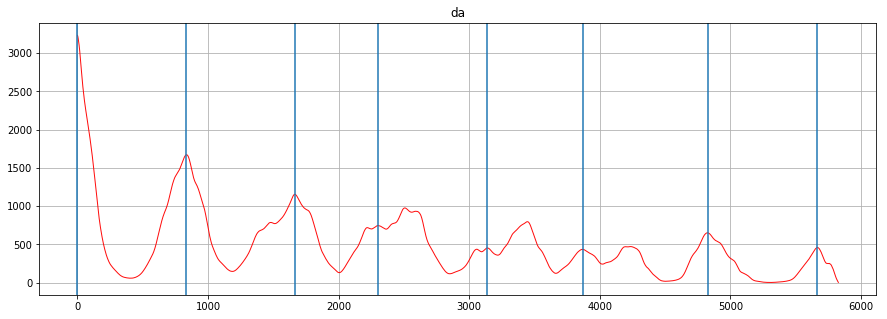

chunk number 42


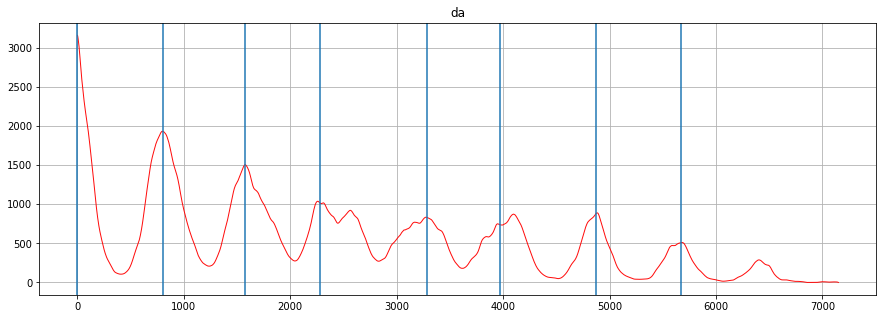

chunk number 43


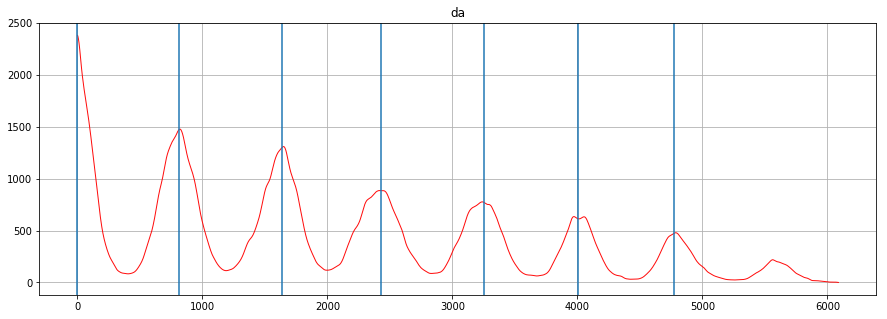

chunk number 44


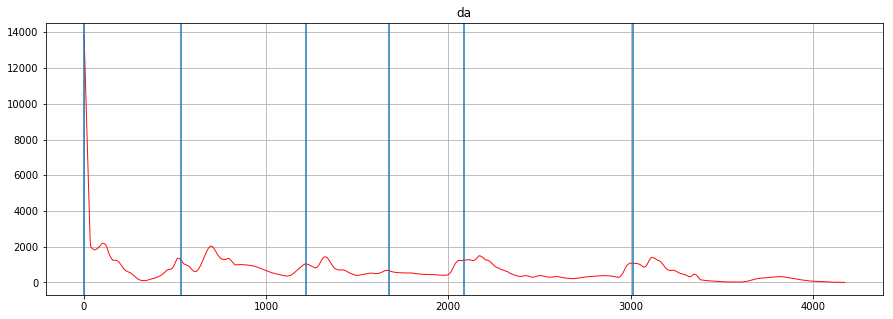

chunk number 45


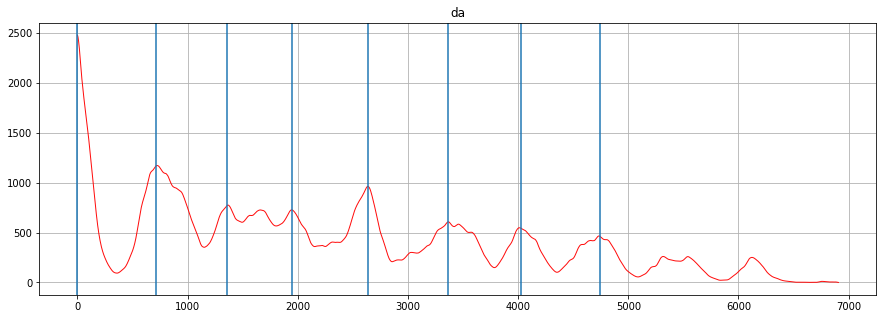

chunk number 46


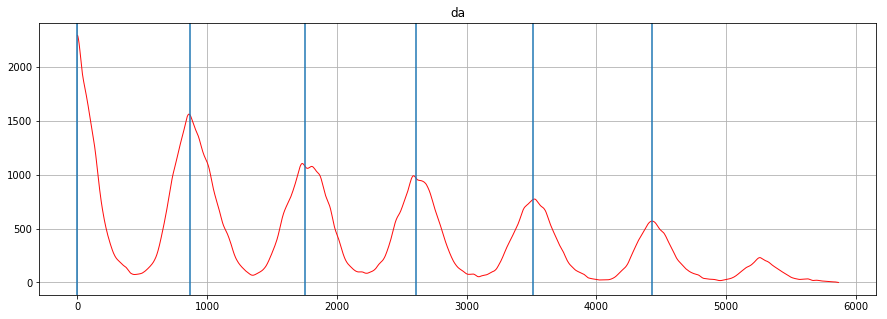

chunk number 47


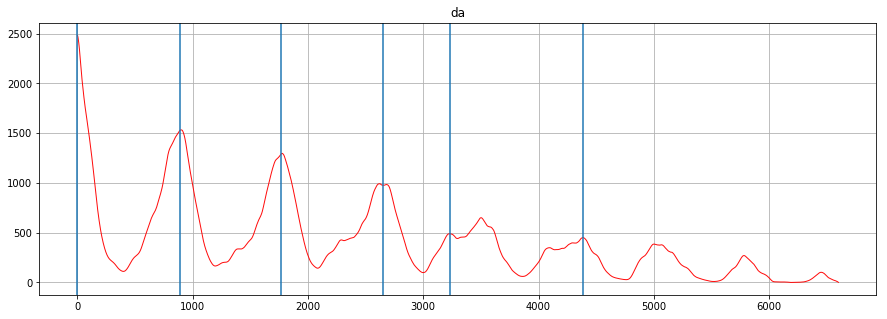

chunk number 48


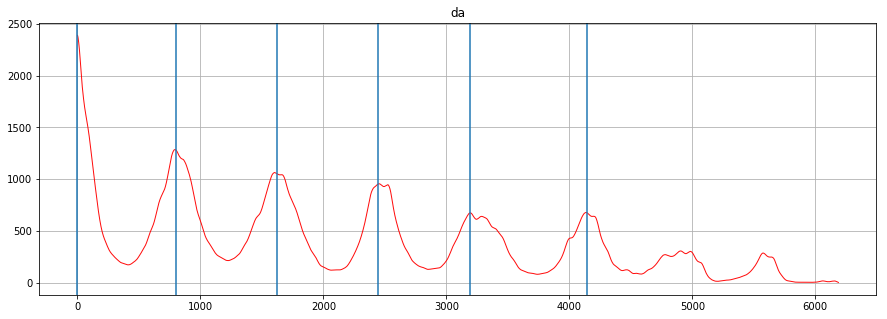

chunk number 49


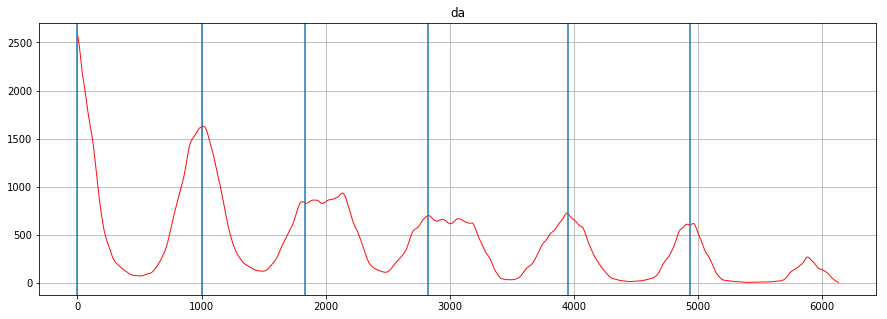

chunk number 50


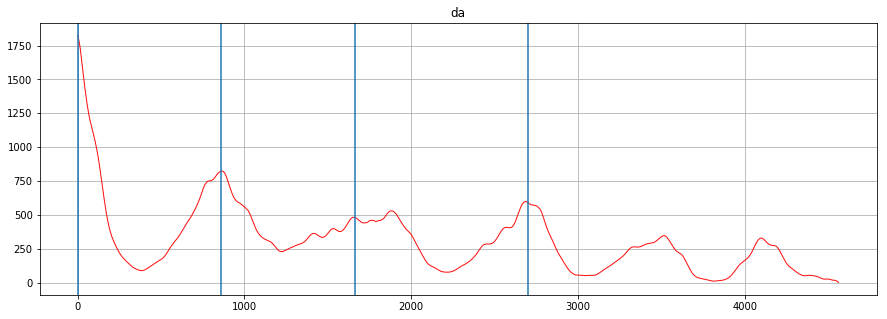

chunk number 51


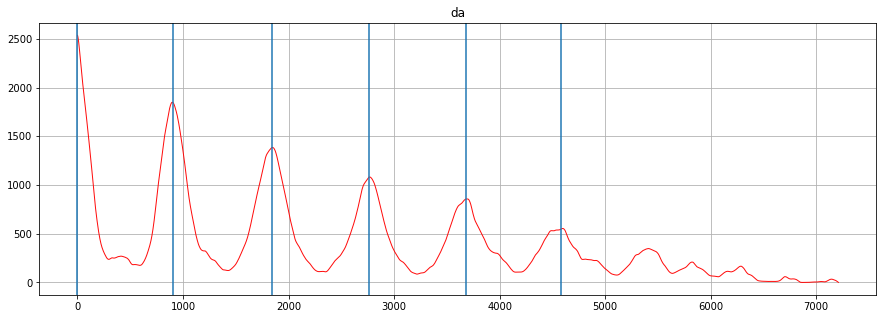

chunk number 52


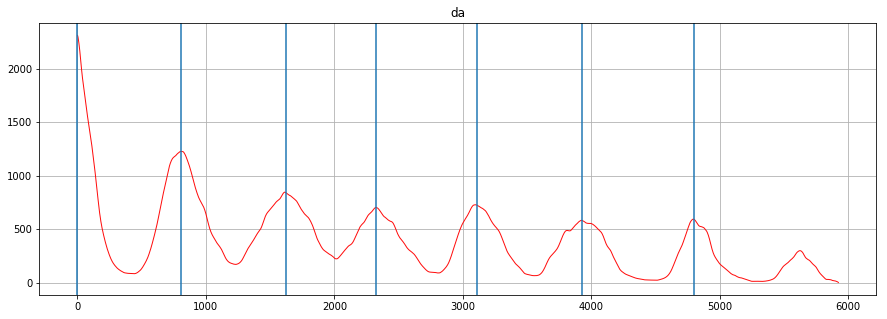

chunk number 53


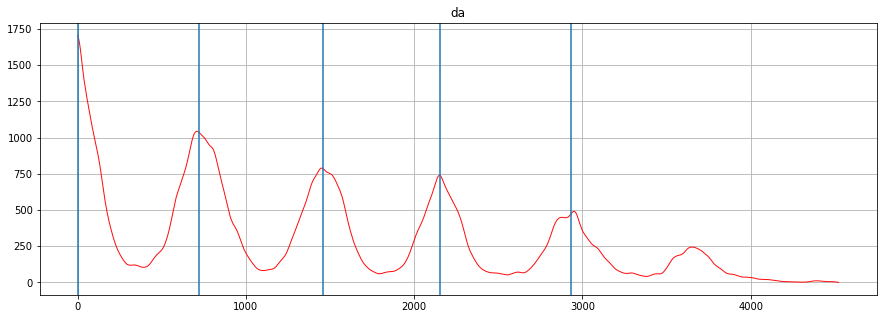

chunk number 54


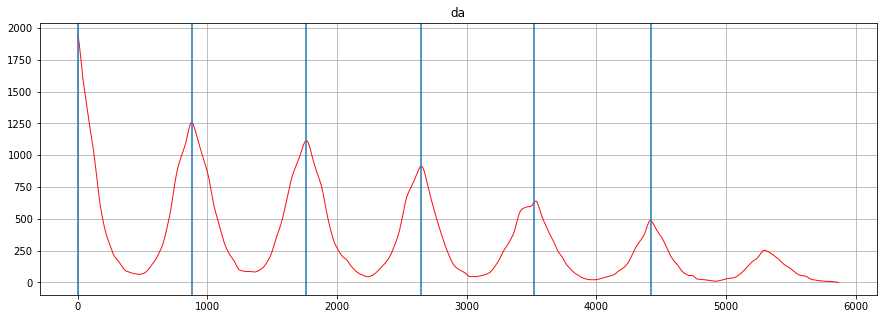

chunk number 55


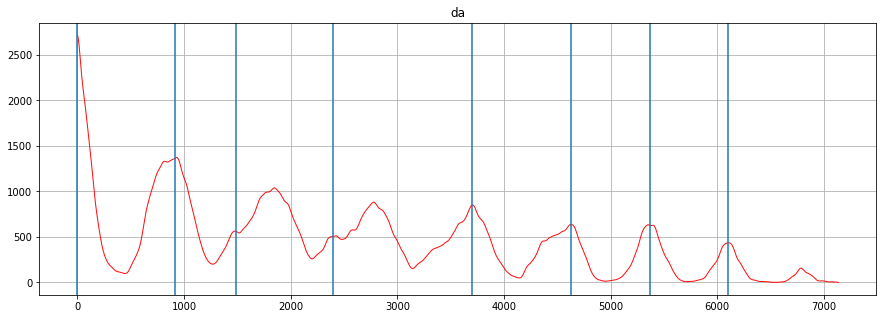

chunk number 56


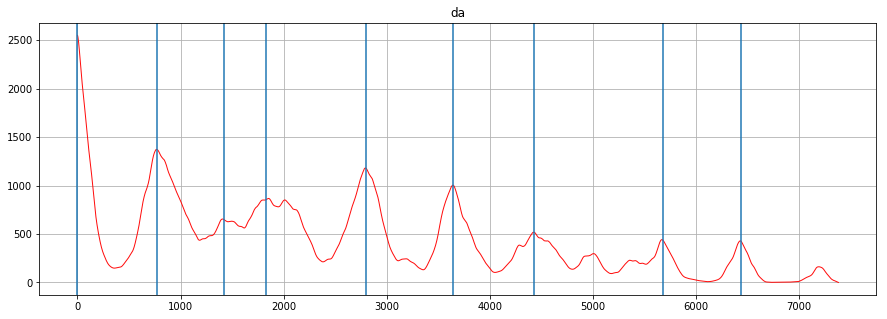

chunk number 57


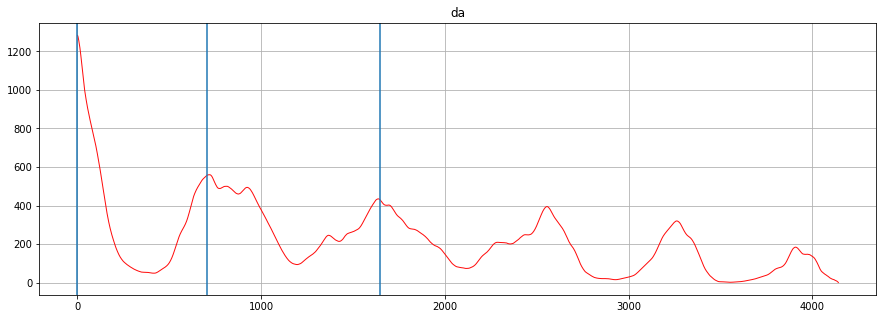

chunk number 58


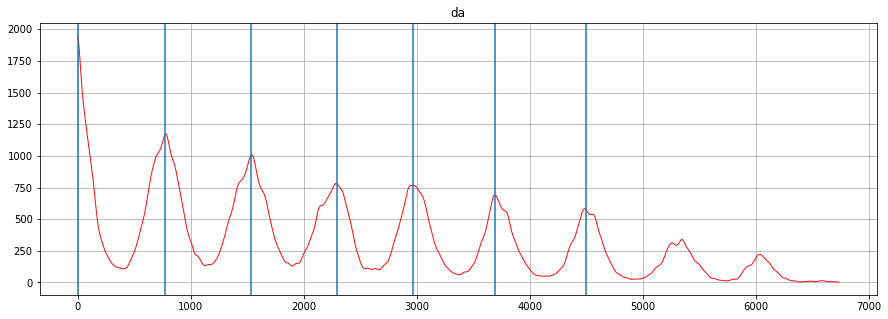

chunk number 59


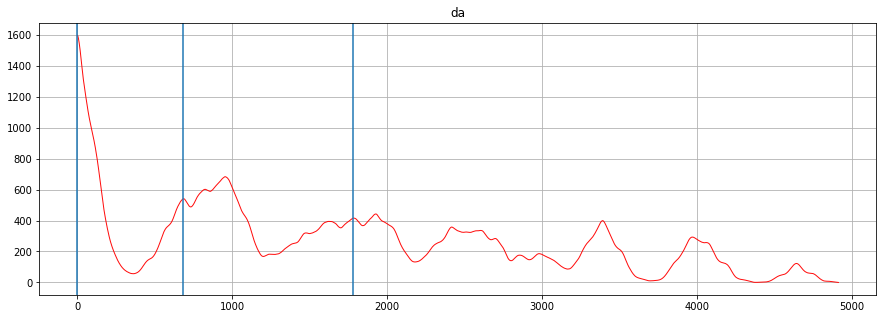

chunk number 60


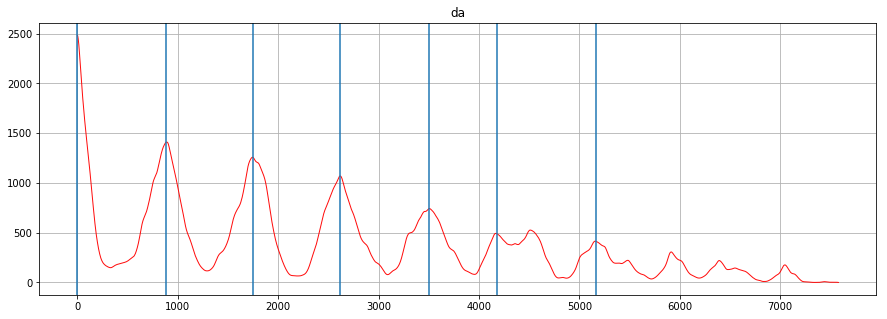

chunk number 61


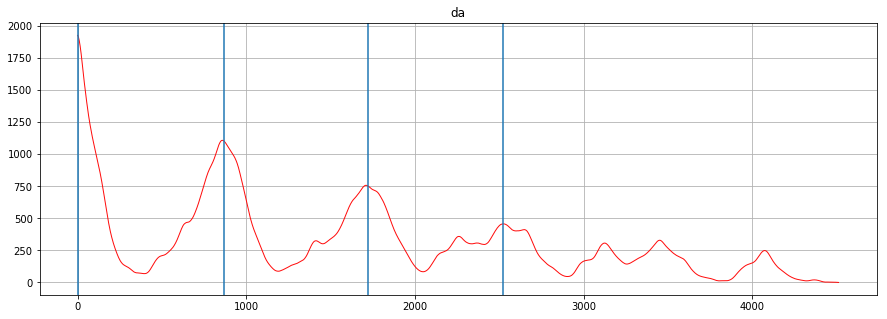

chunk number 62


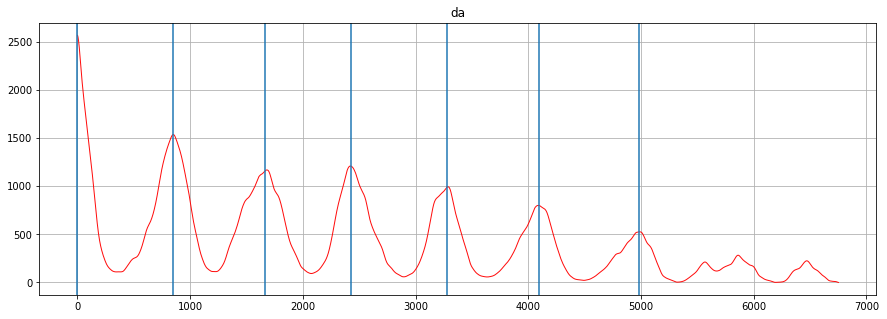

chunk number 63


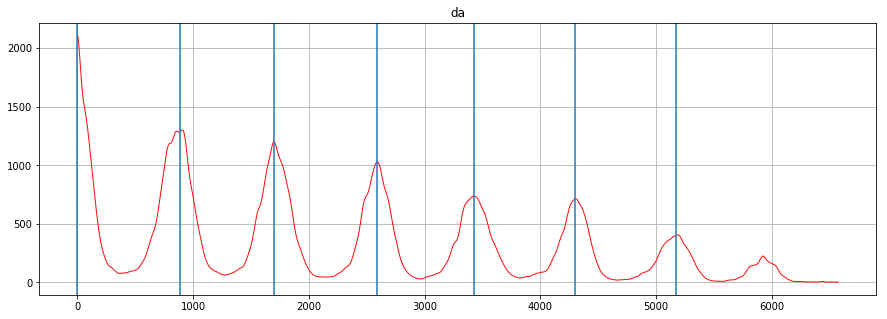

chunk number 64


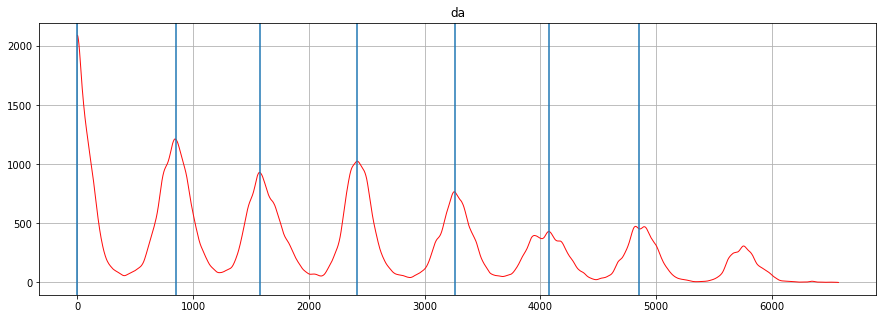

chunk number 65


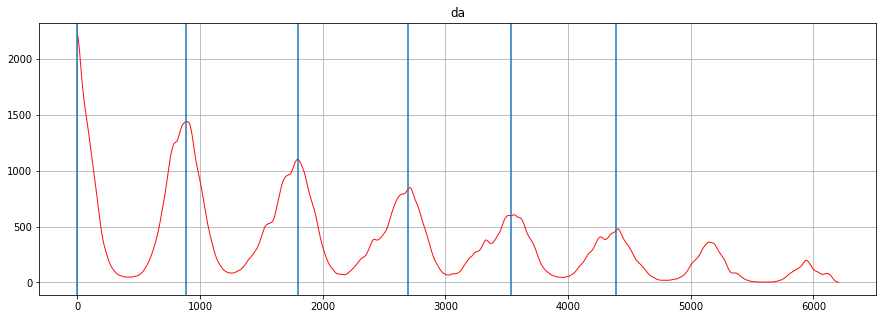

chunk number 66


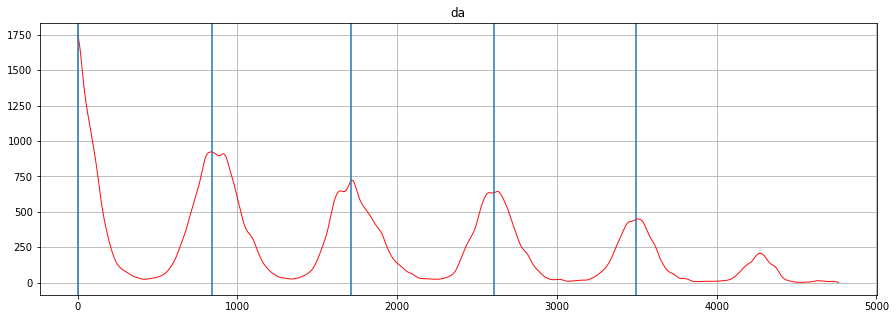

chunk number 67


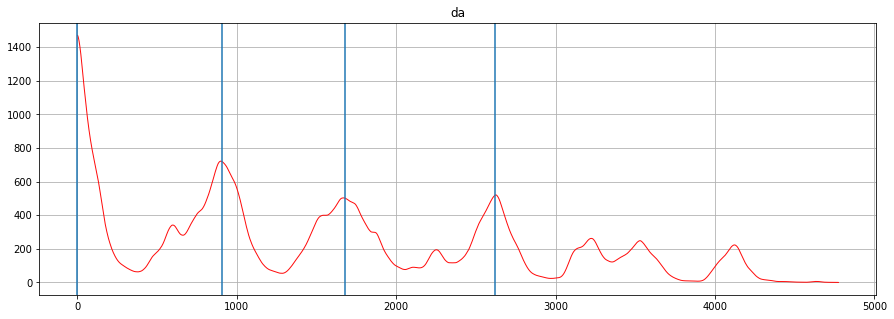

chunk number 68


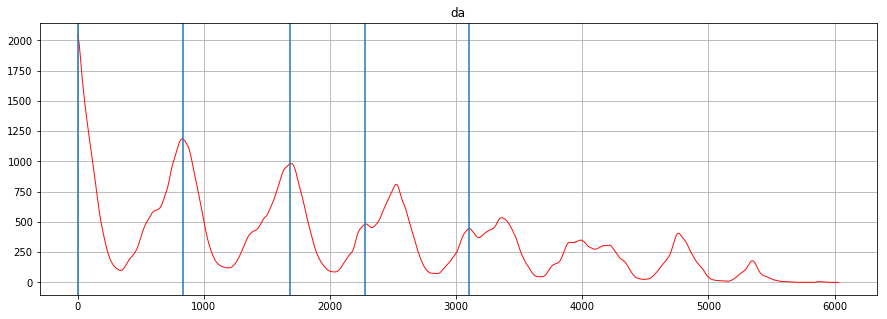

chunk number 69


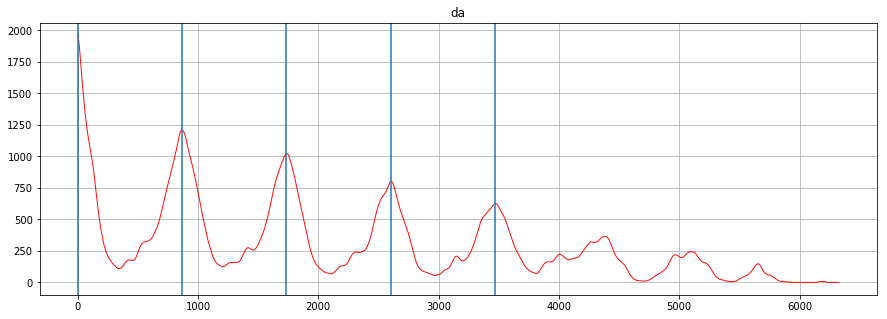

chunk number 70


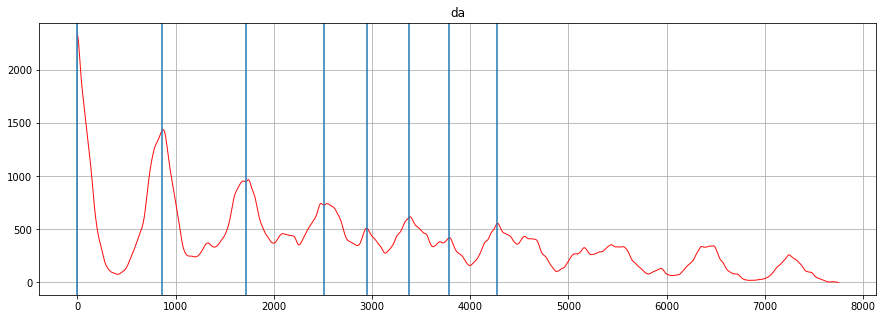

chunk number 71


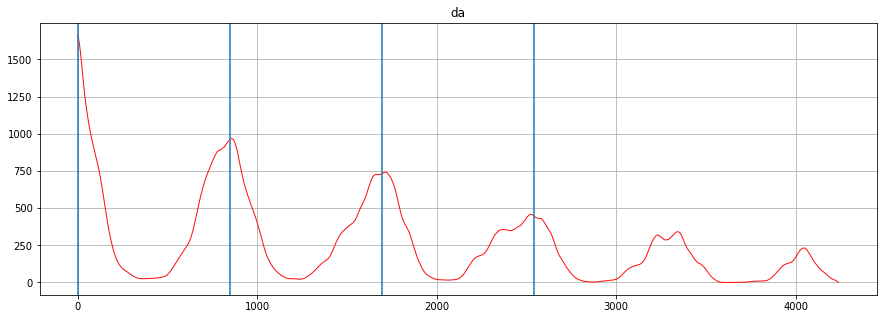

chunk number 72


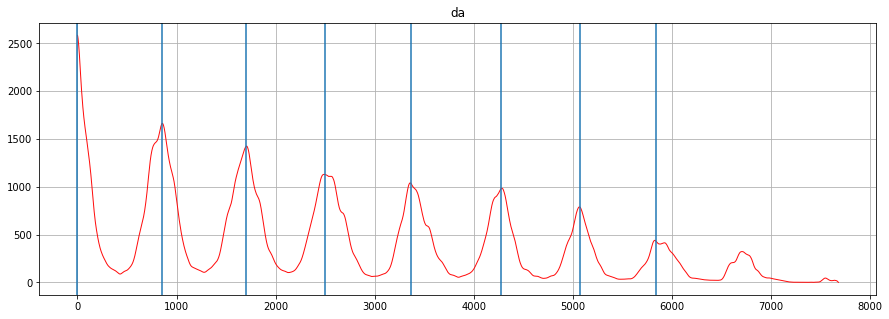

chunk number 73


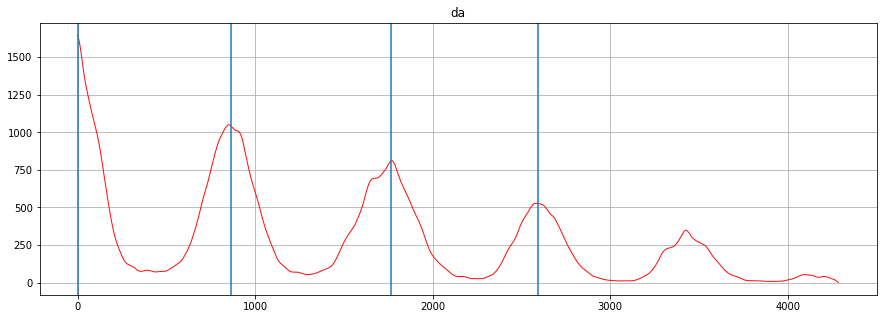

chunk number 74


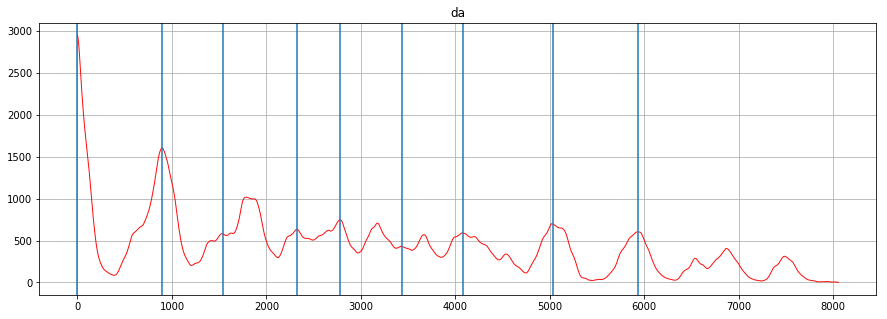

chunk number 75


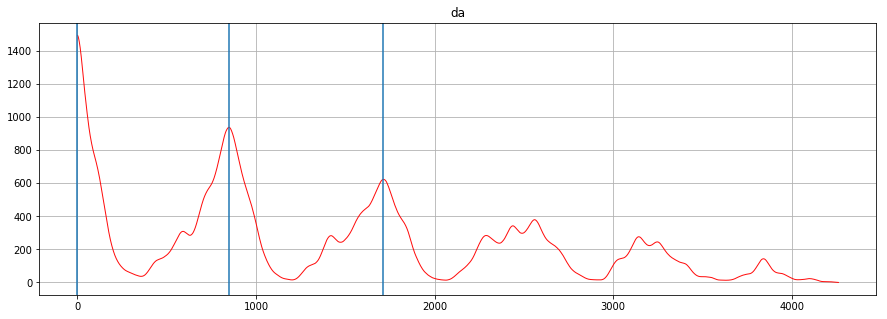

chunk number 76


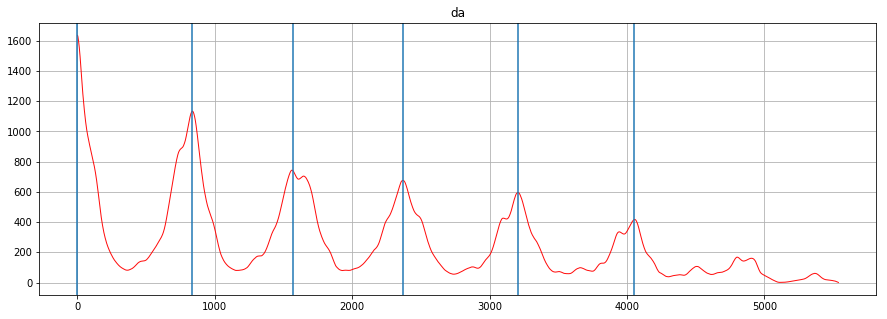

chunk number 77


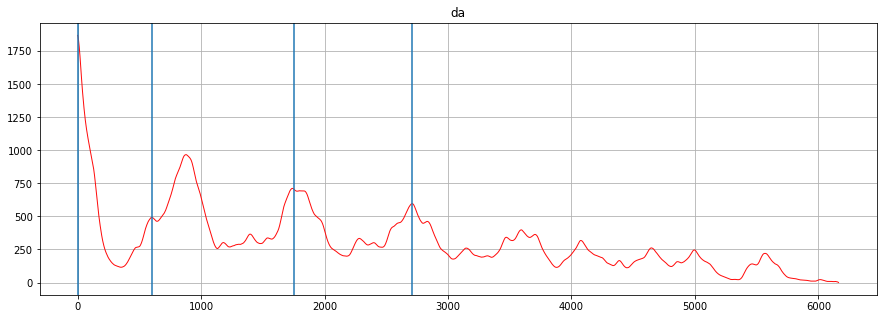

chunk number 78


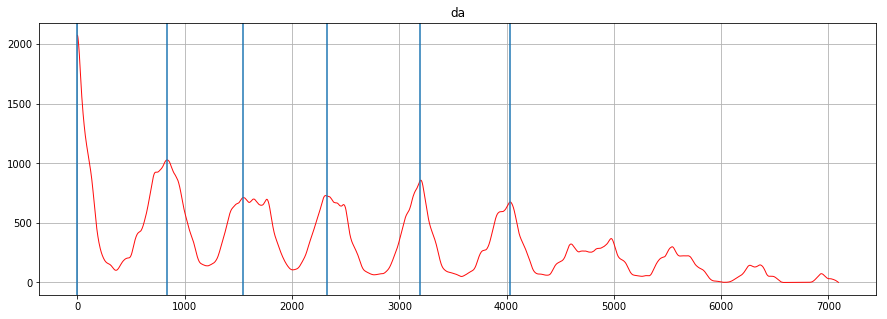

chunk number 79


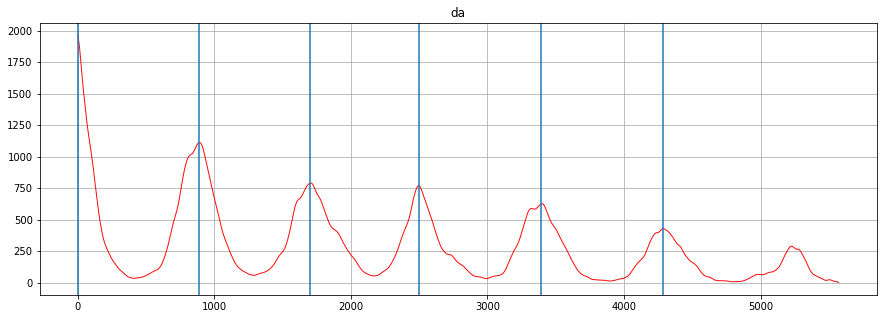

chunk number 80


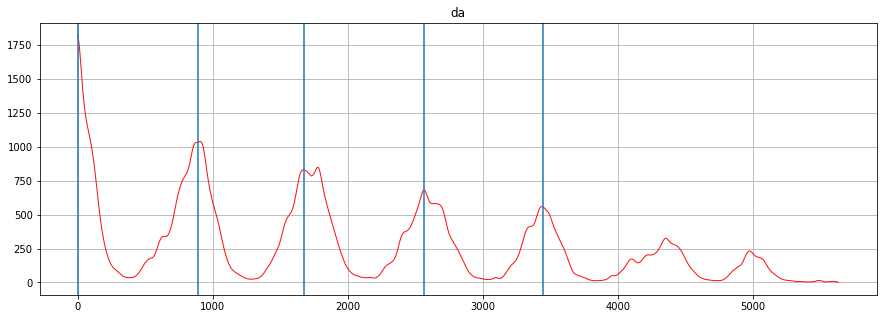

chunk number 81


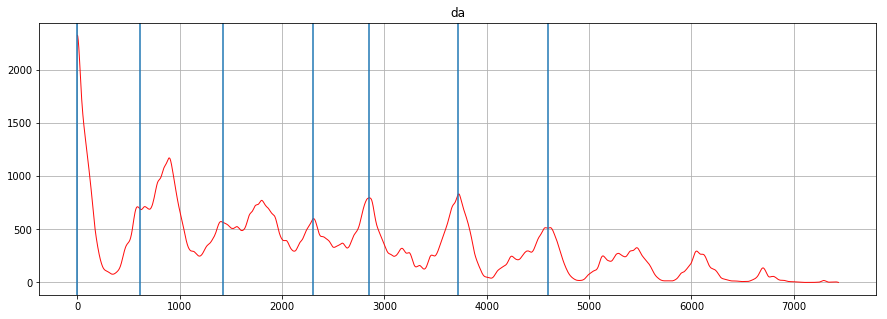

chunk number 82


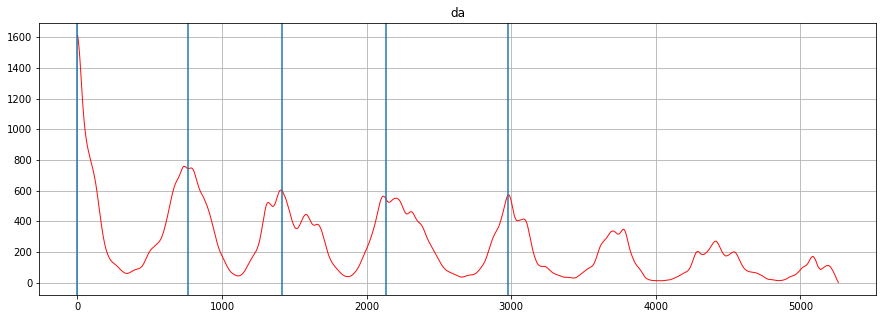

chunk number 83


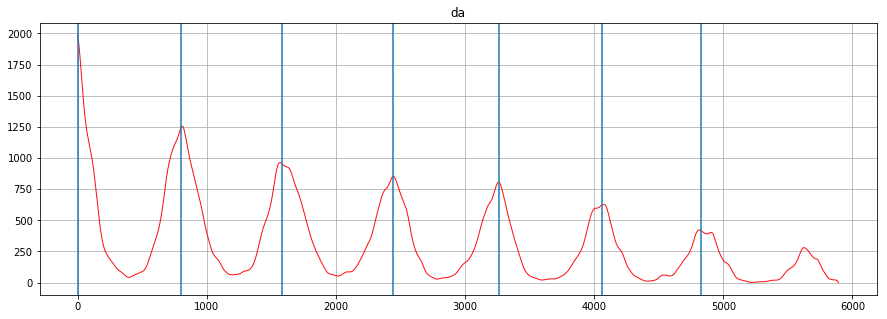

chunk number 84


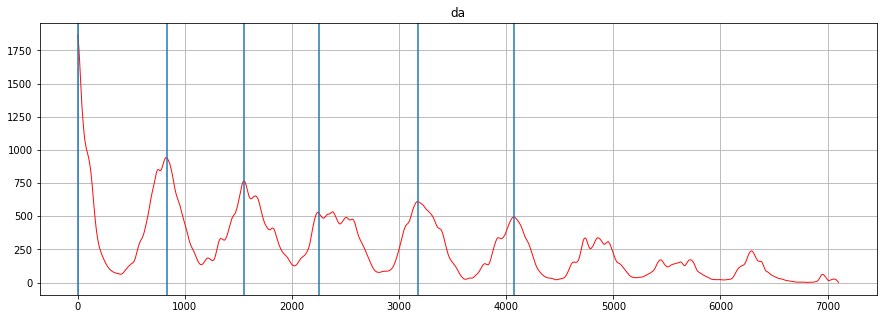

chunk number 85


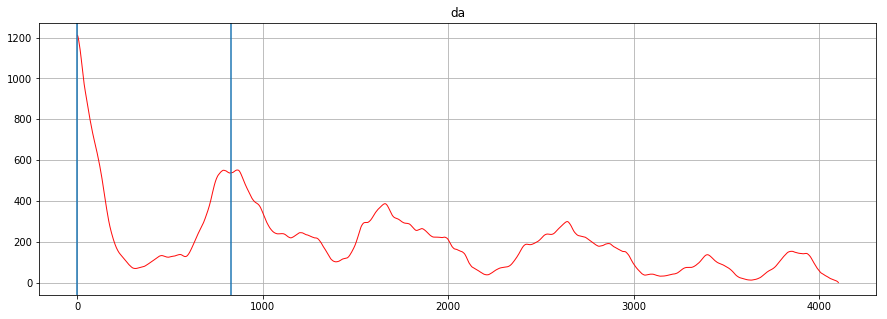

chunk number 86


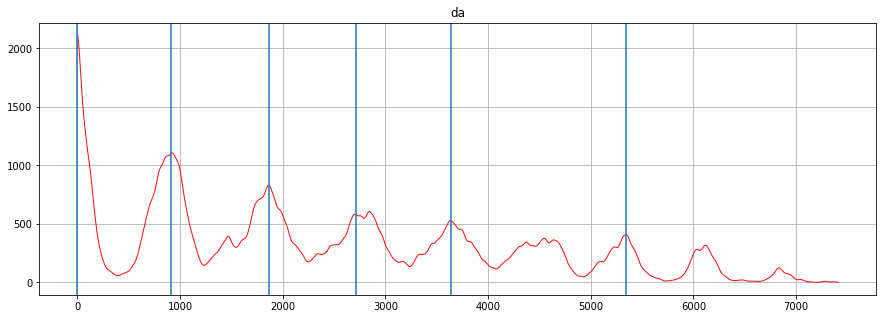

chunk number 87


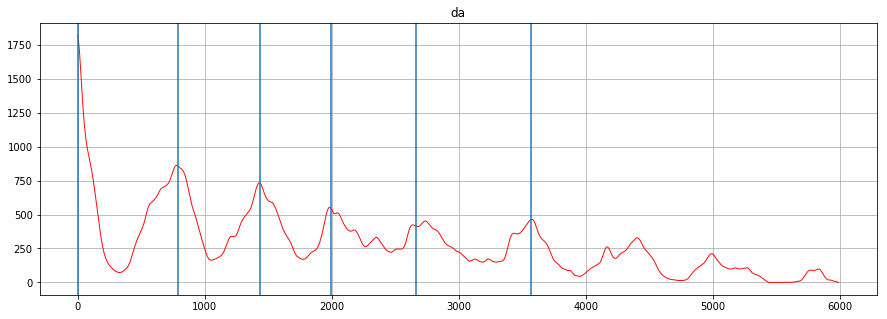

chunk number 88


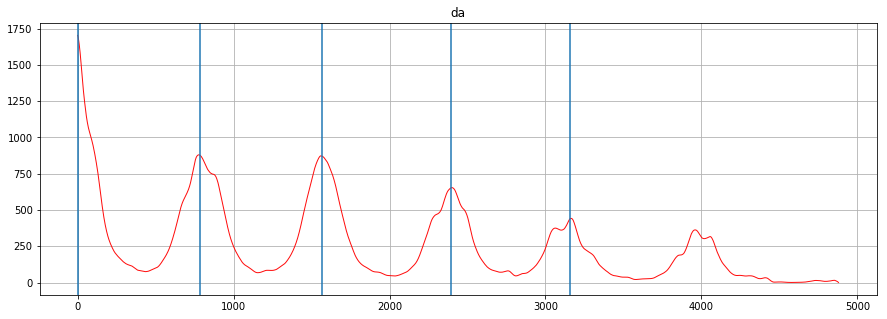

chunk number 89


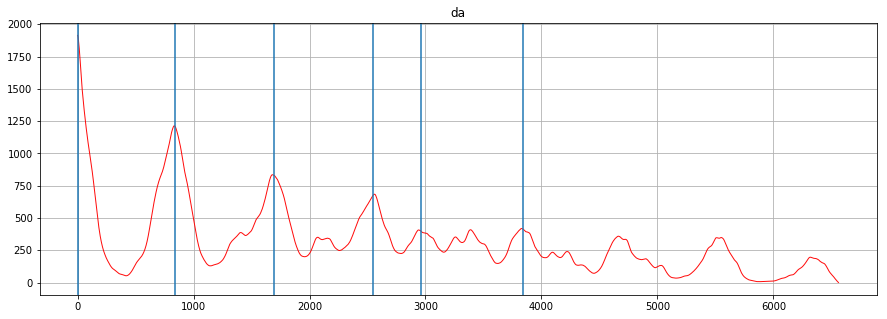

chunk number 90


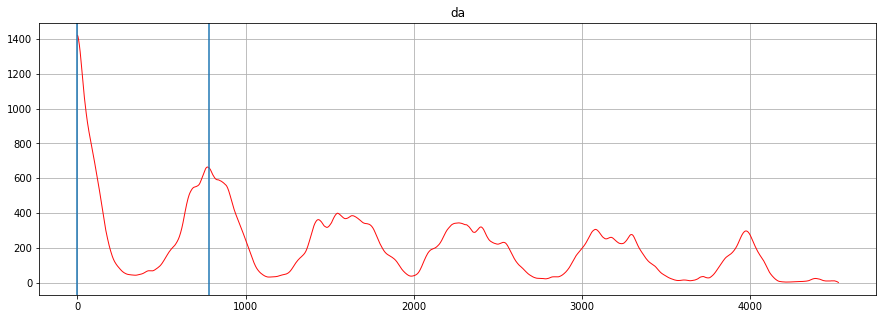

chunk number 91


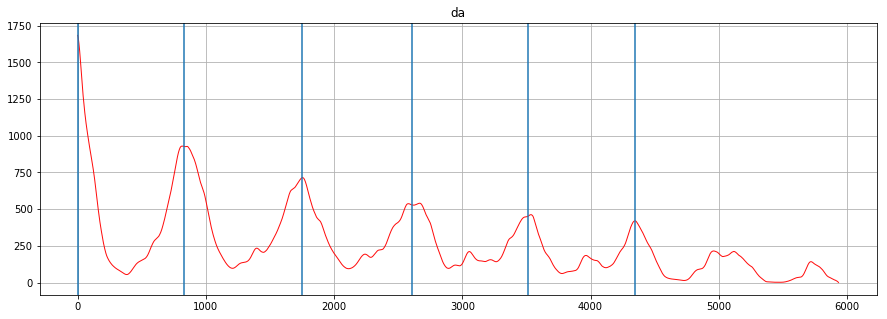

chunk number 92


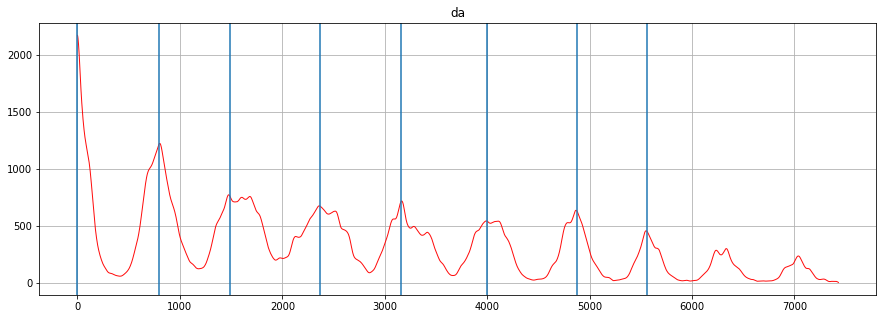

chunk number 93


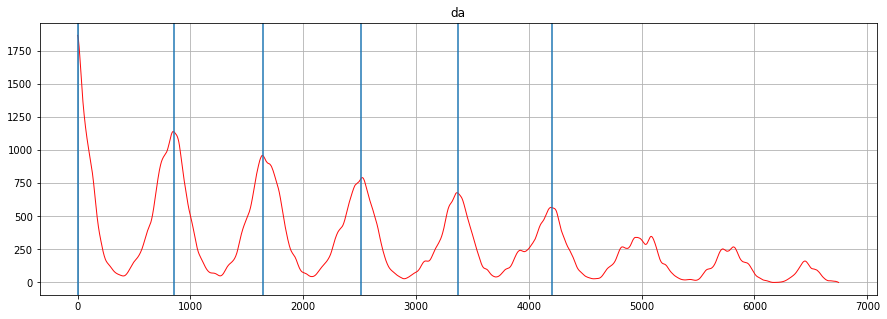

chunk number 94


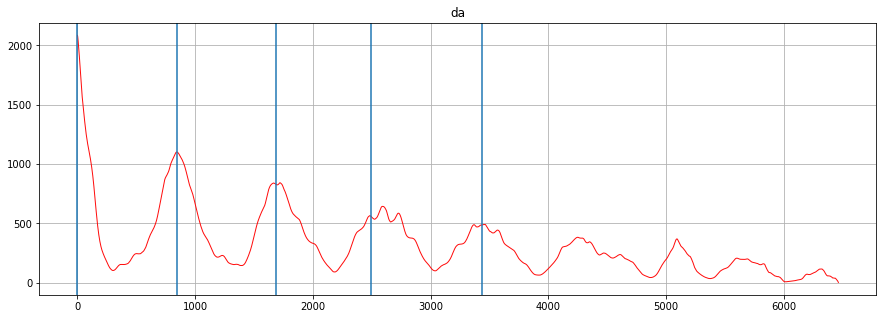

chunk number 95


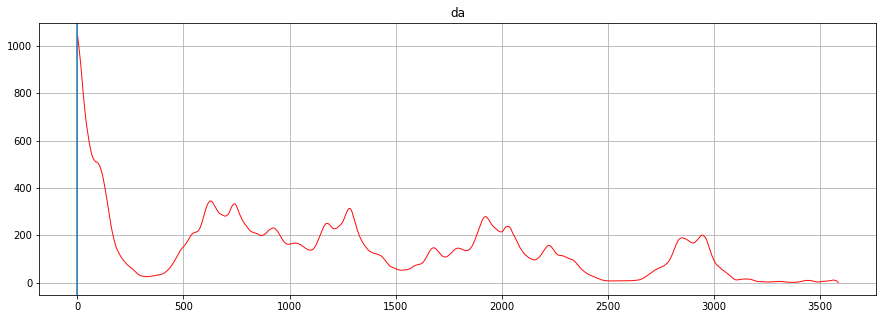

chunk number 96


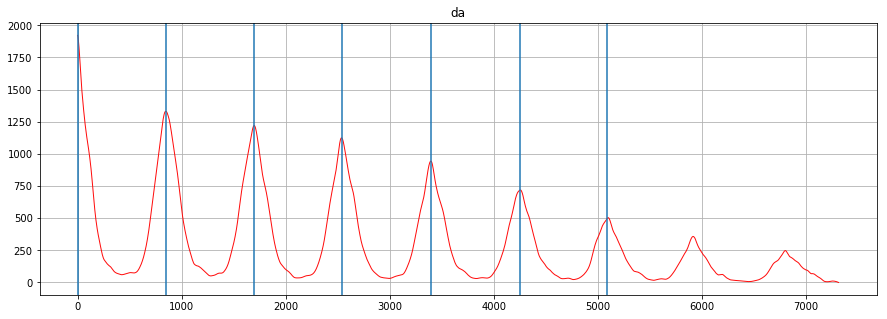

chunk number 97


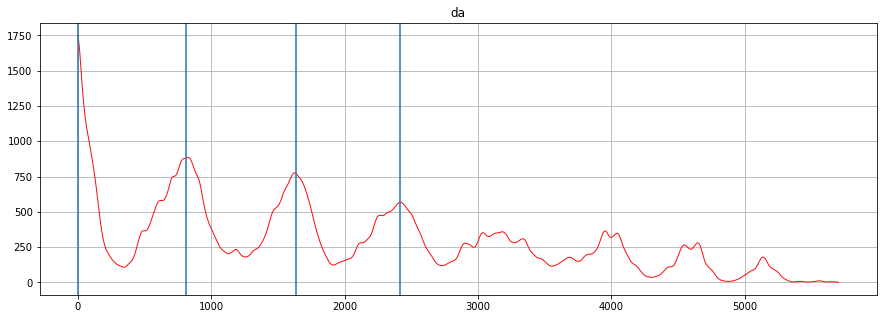

chunk number 98


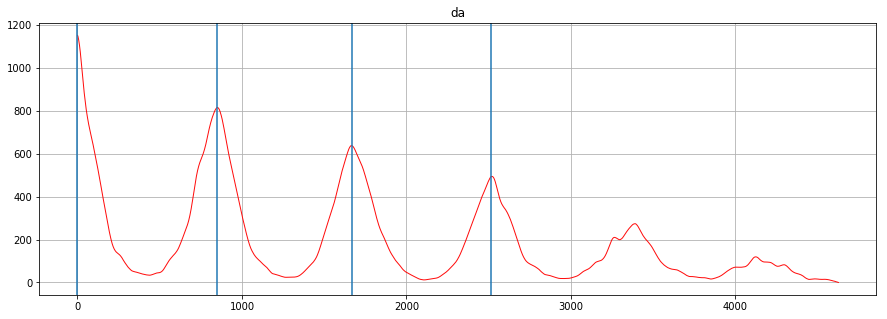

chunk number 99


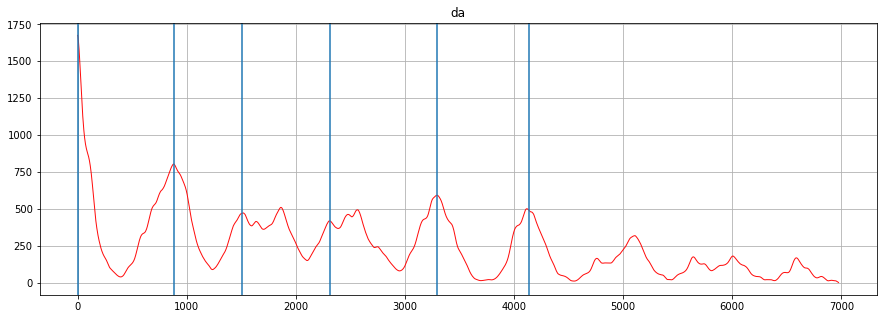

2019-09-03_prc
chunk number 0


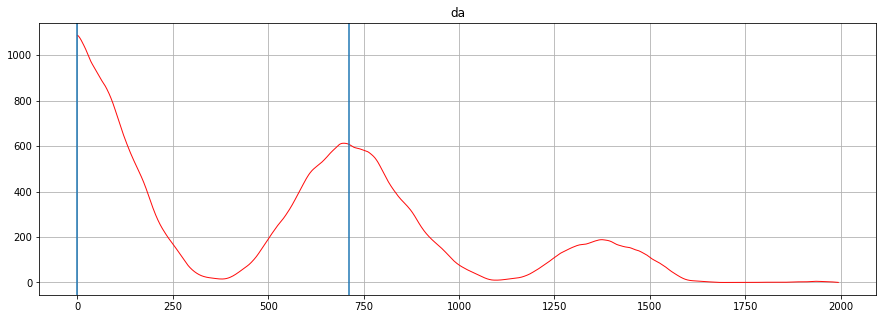

chunk number 1


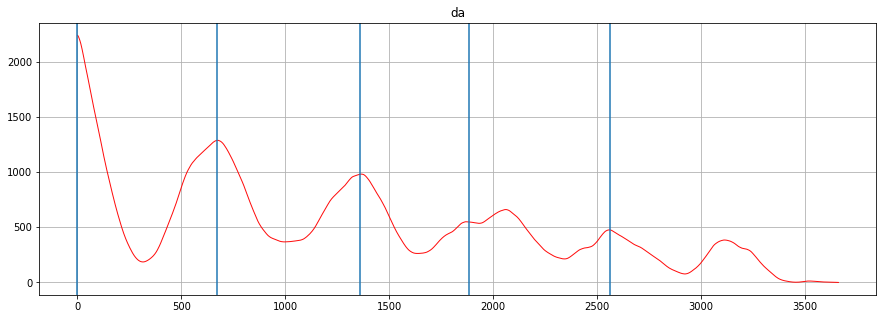

chunk number 2


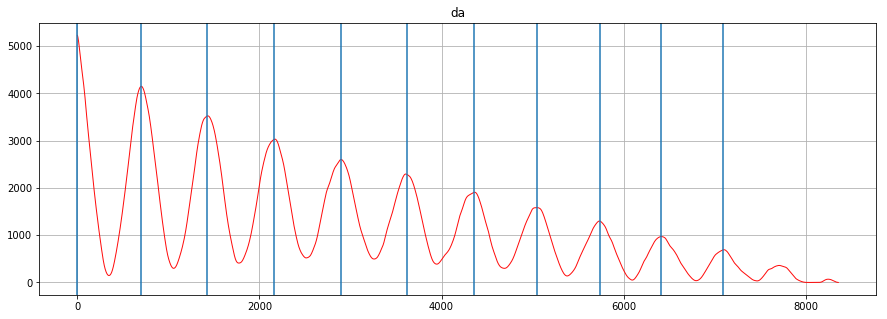

chunk number 3


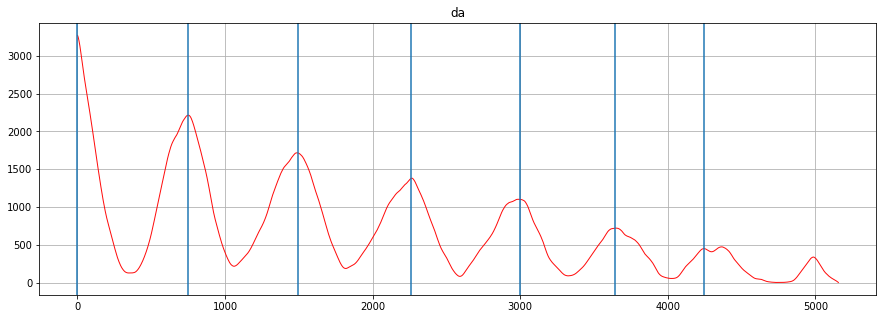

chunk number 4


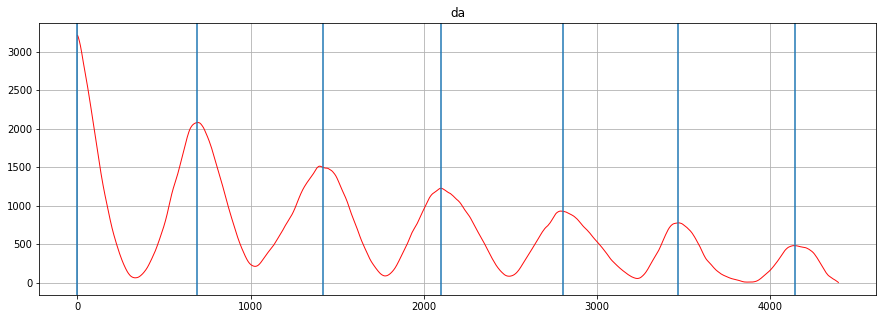

chunk number 5


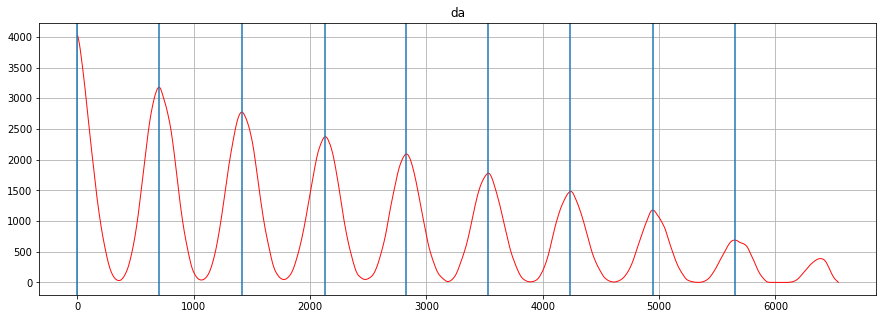

chunk number 6


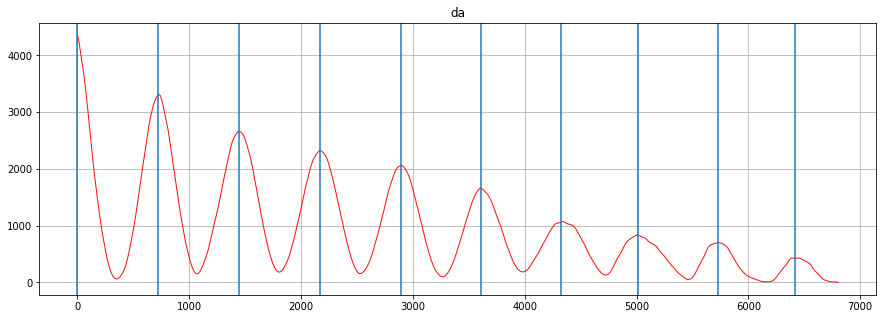

chunk number 7


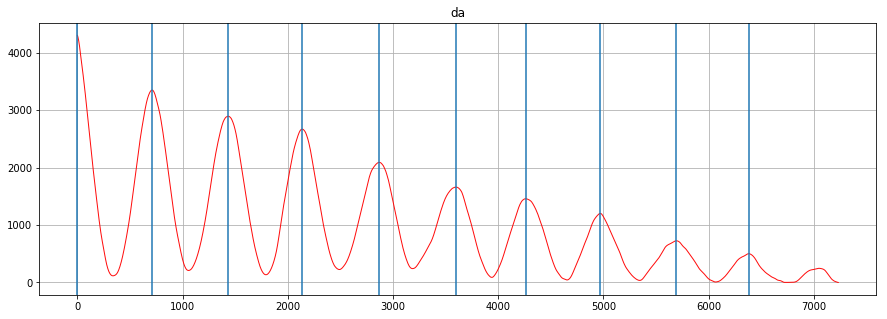

chunk number 8


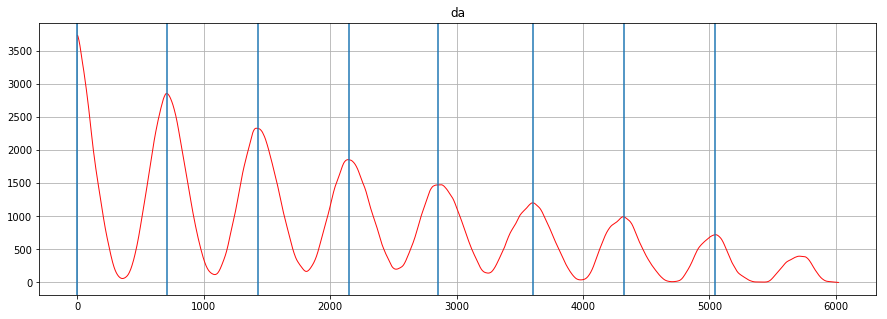

chunk number 9


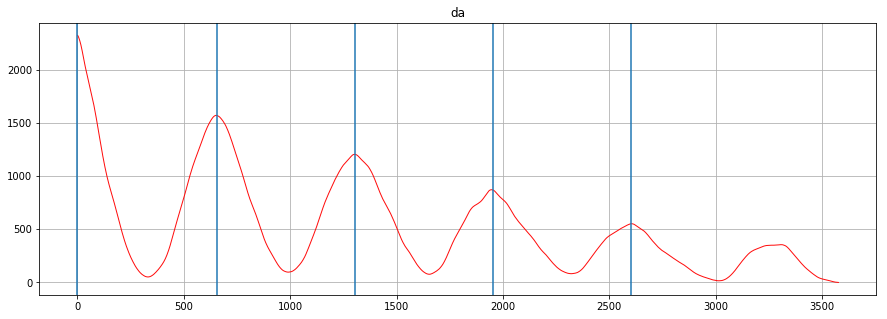

chunk number 10


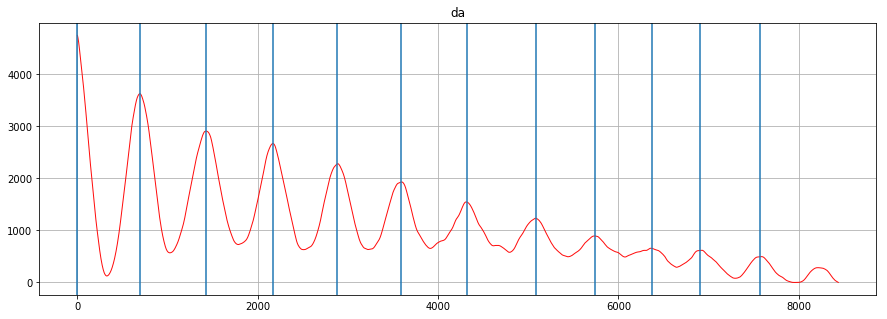

chunk number 11


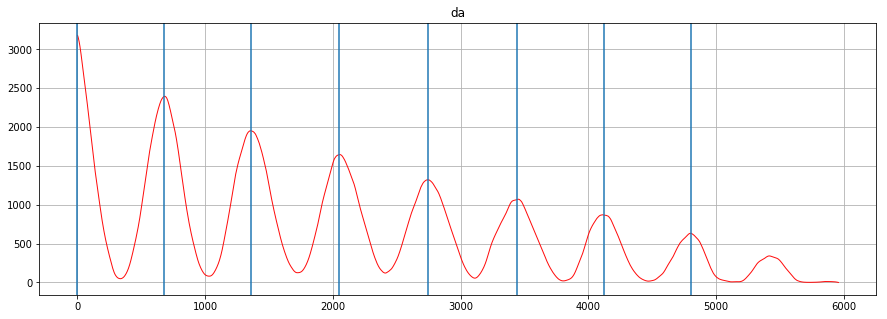

chunk number 12


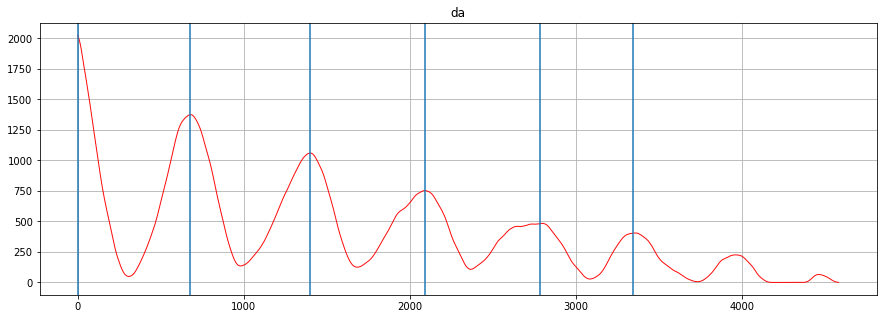

chunk number 13


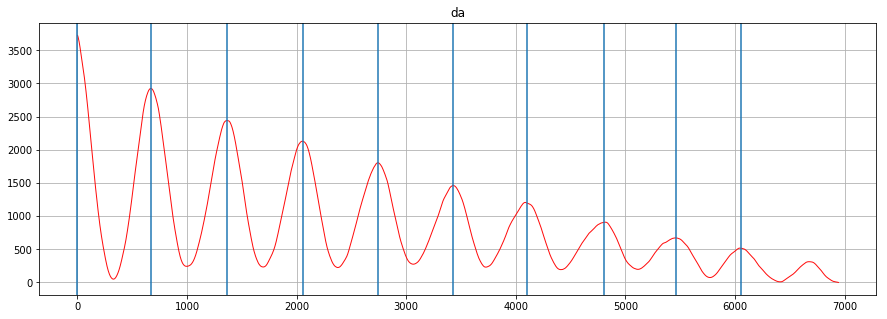

chunk number 14


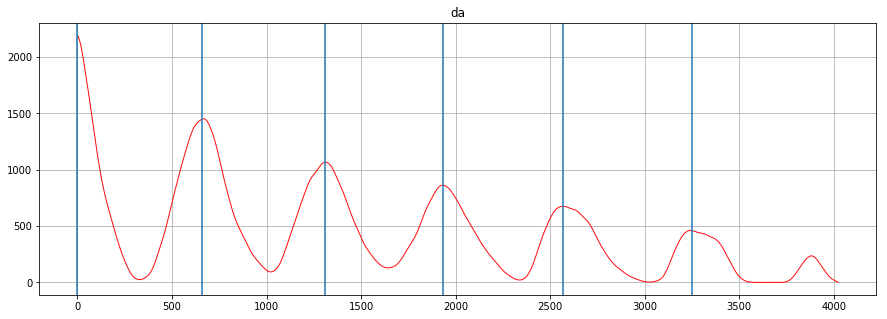

chunk number 15


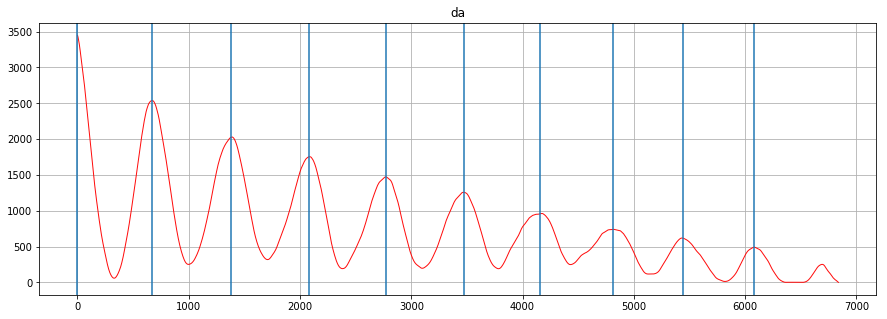

chunk number 16


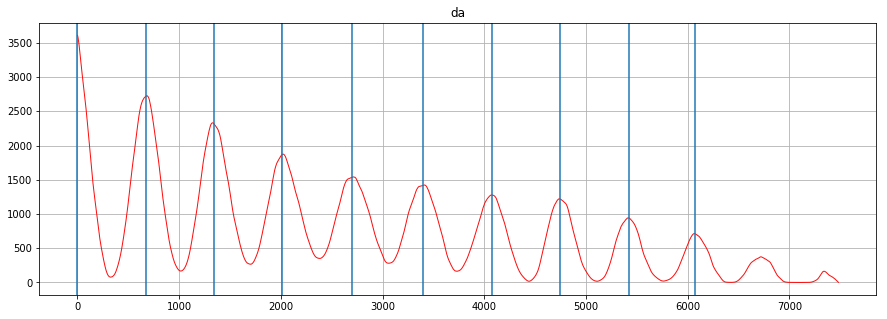

chunk number 17


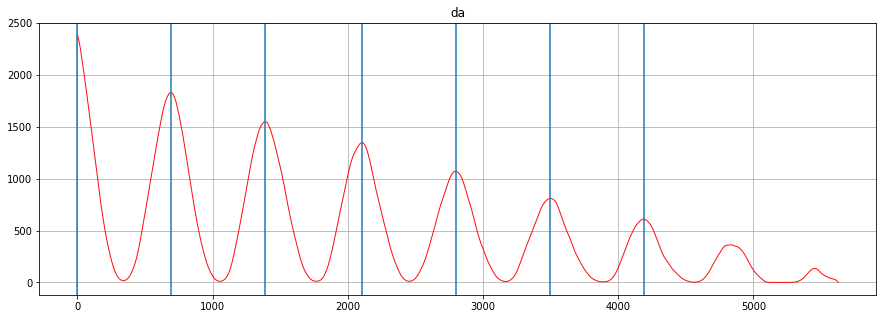

chunk number 18


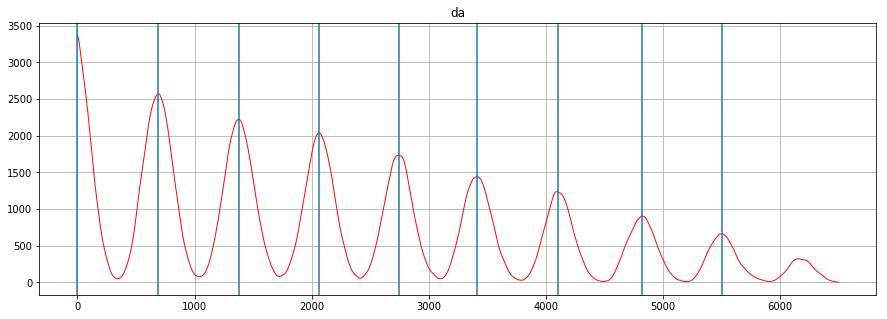

chunk number 19


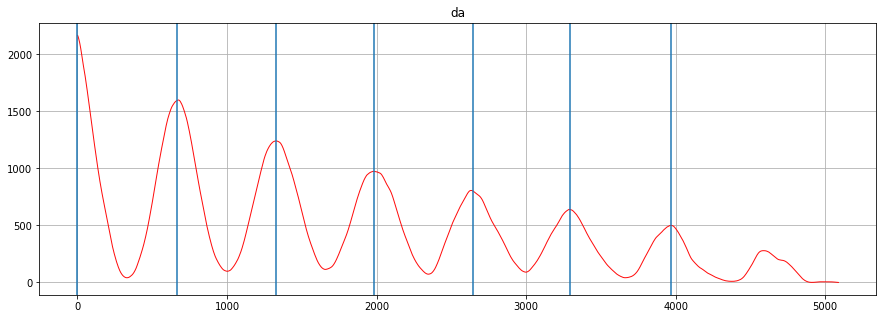

chunk number 20


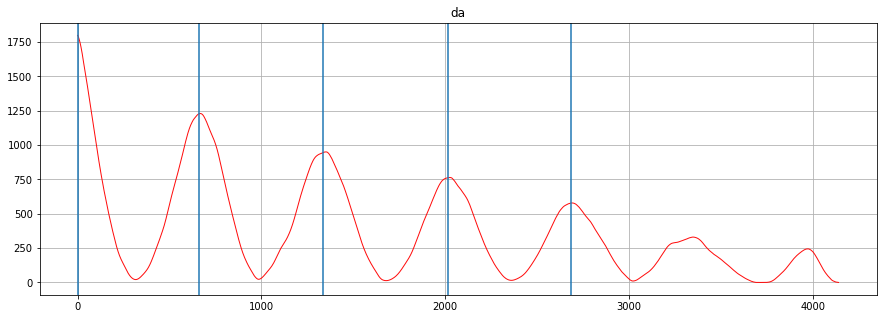

chunk number 21


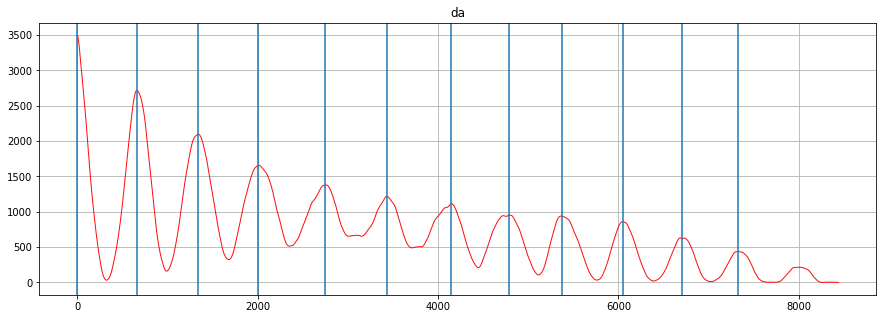

chunk number 22


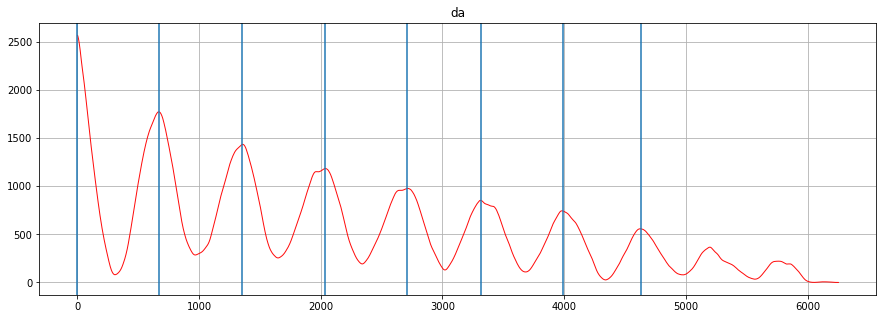

chunk number 23


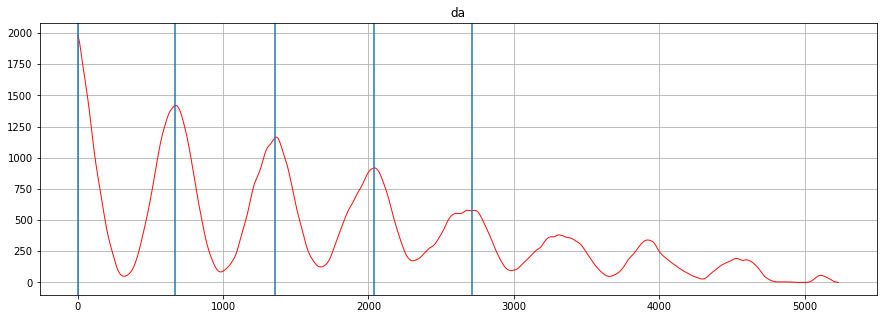

chunk number 24


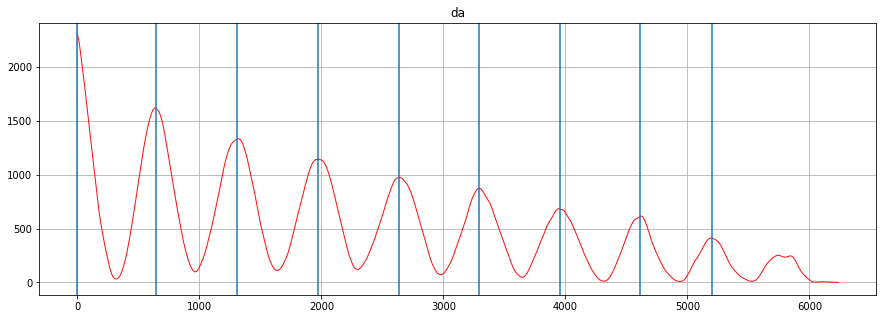

chunk number 25


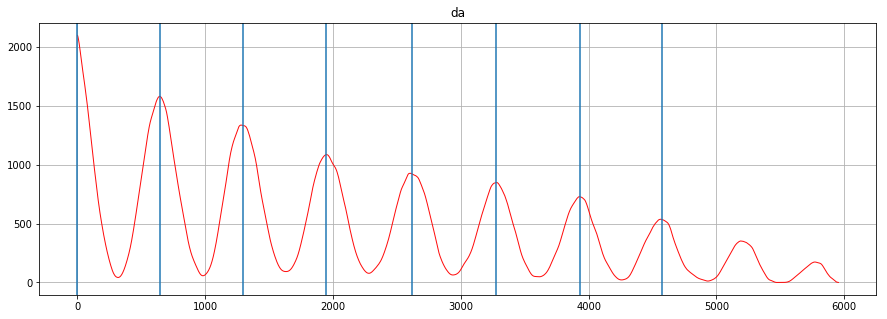

chunk number 26


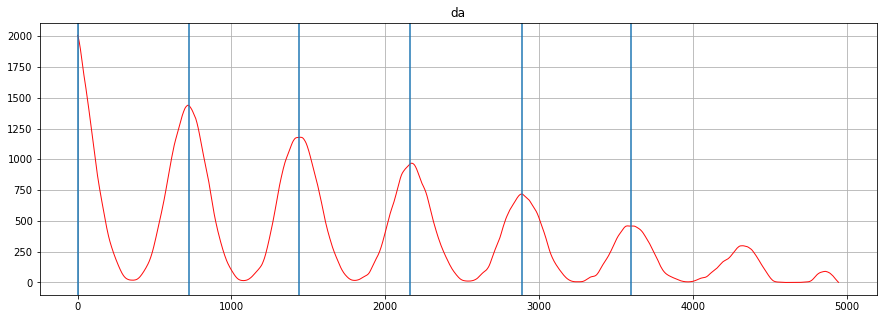

chunk number 27


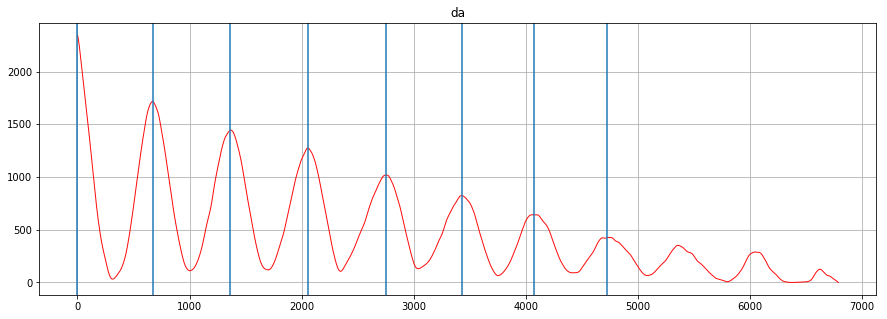

chunk number 28


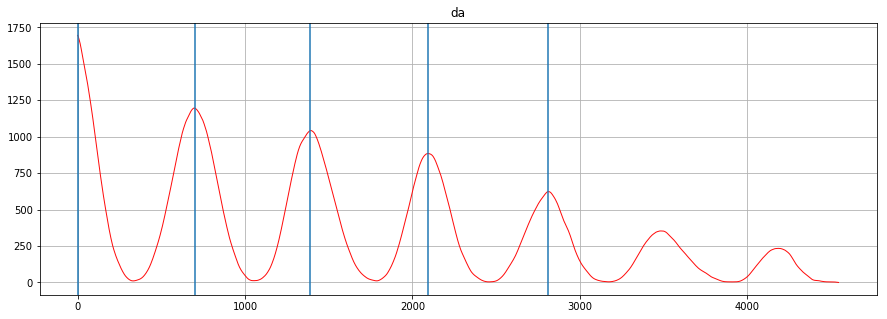

chunk number 29


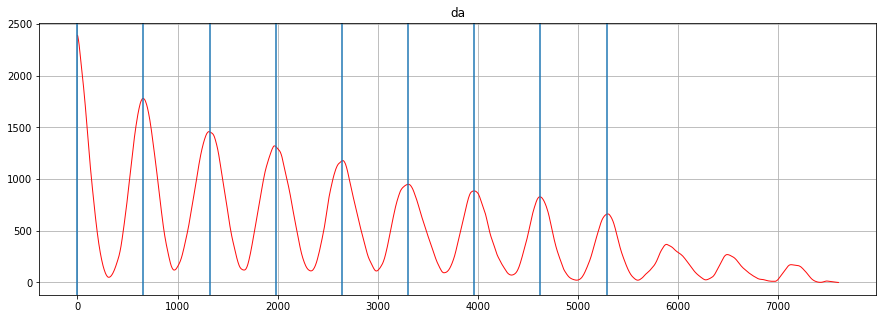

chunk number 30


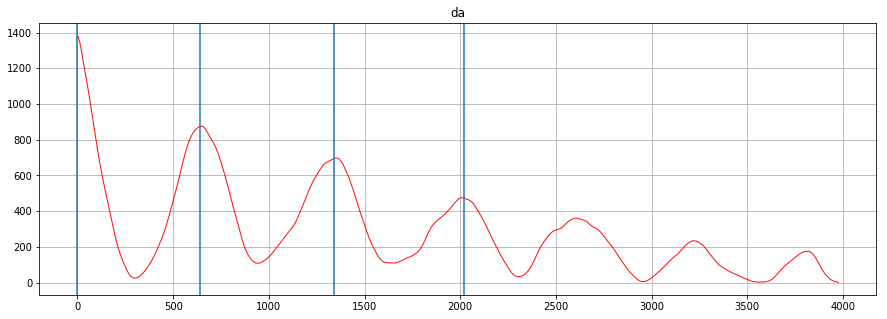

chunk number 31


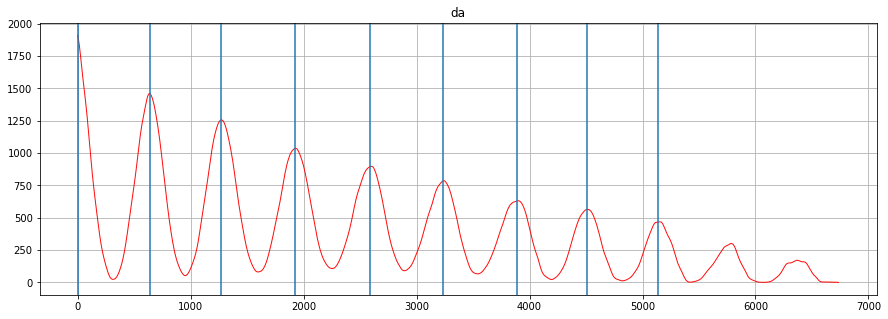

chunk number 32


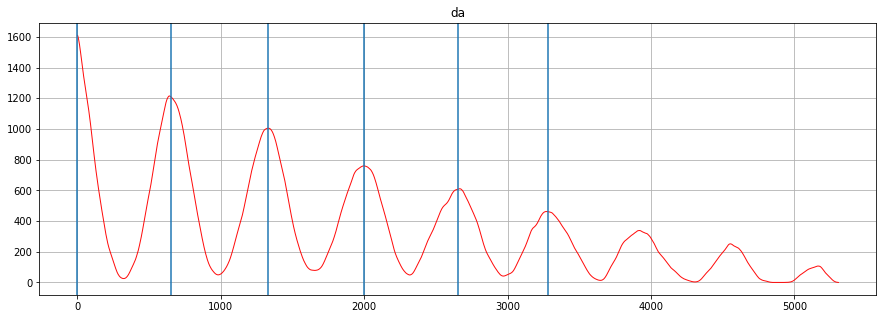

chunk number 33


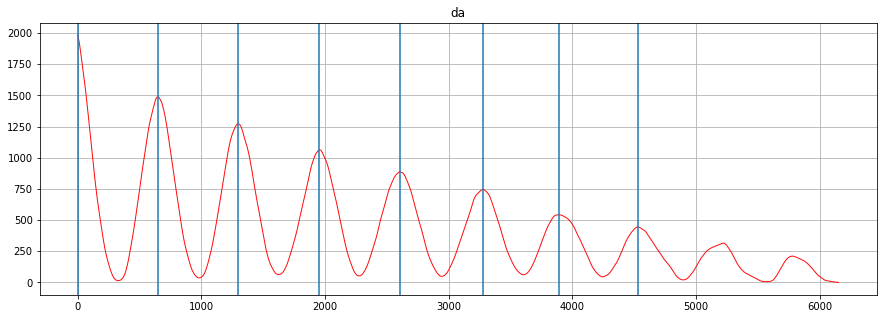

chunk number 34


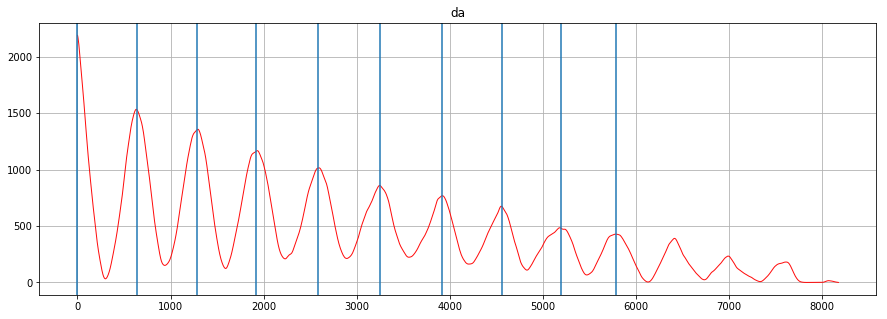

chunk number 35


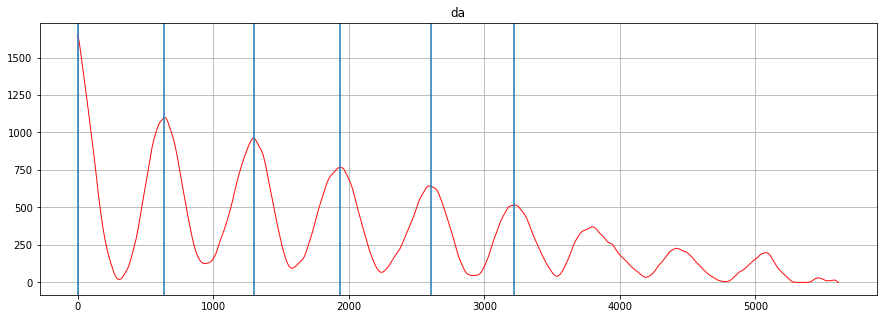

chunk number 36


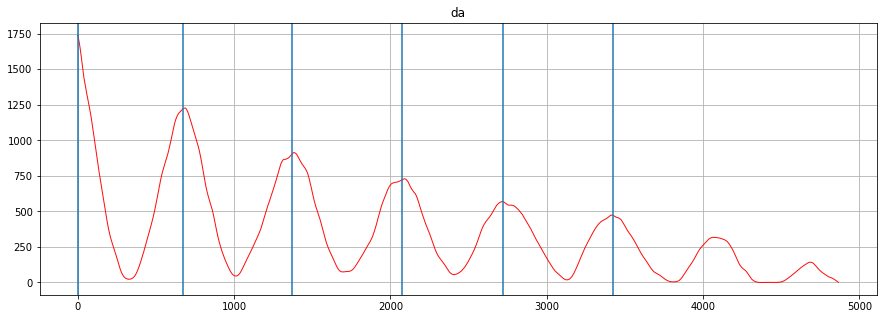

chunk number 37


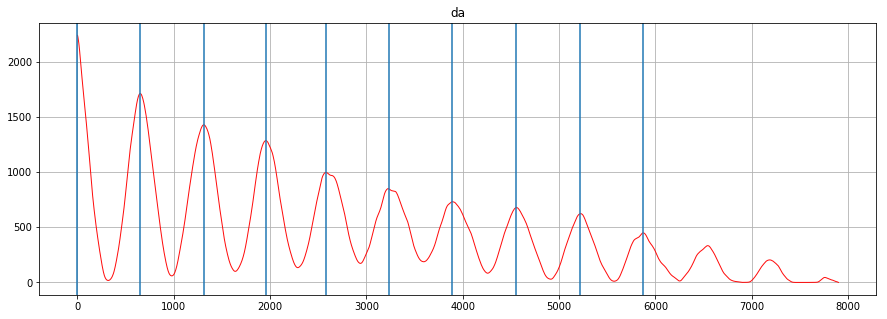

chunk number 38


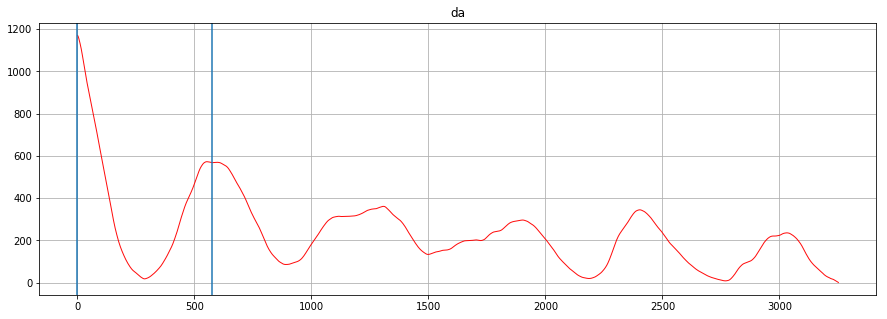

chunk number 39


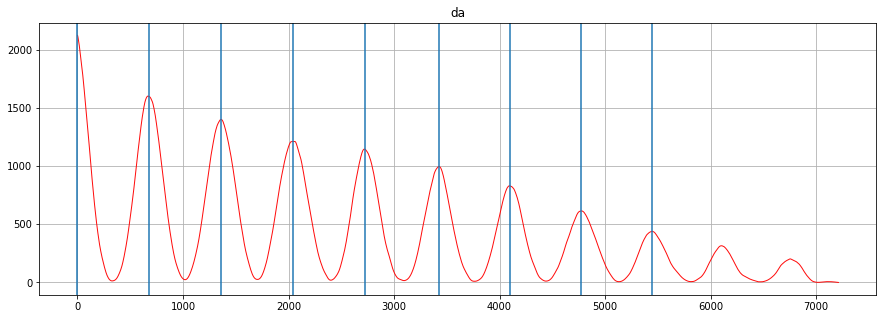

chunk number 40


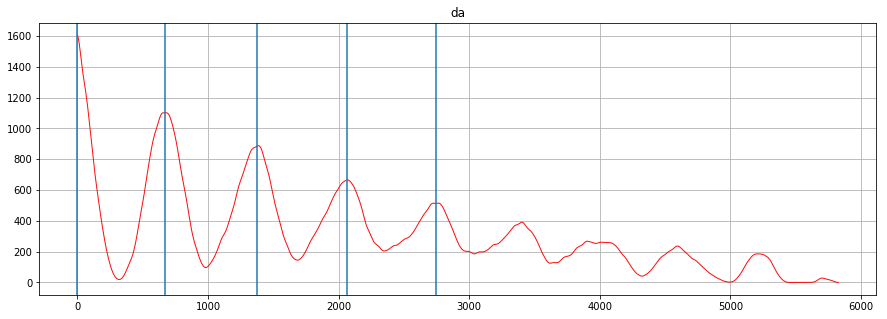

chunk number 41


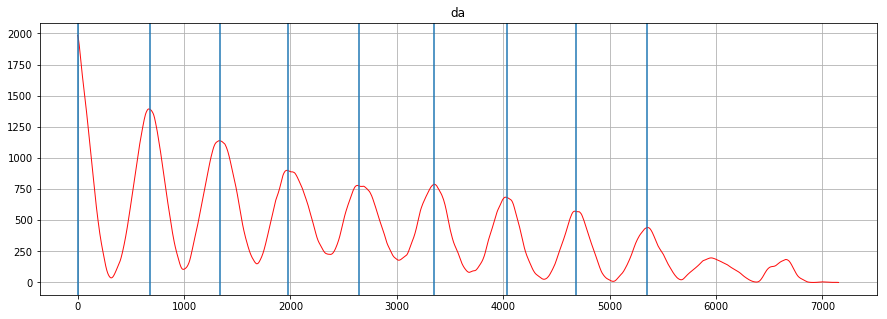

chunk number 42


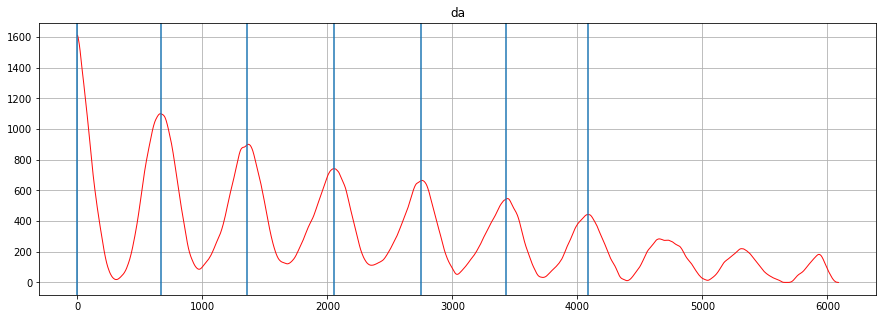

chunk number 43


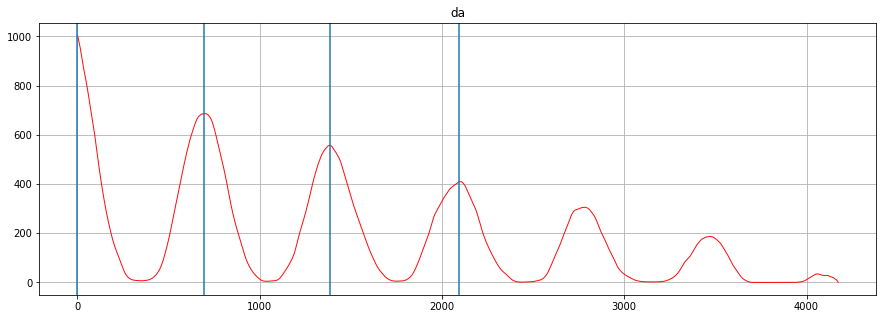

chunk number 44


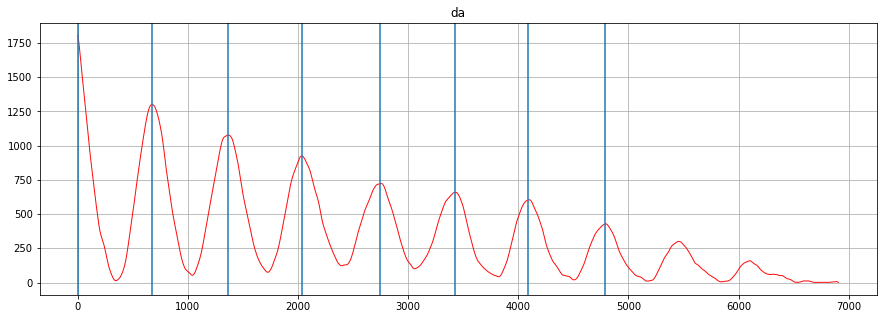

chunk number 45


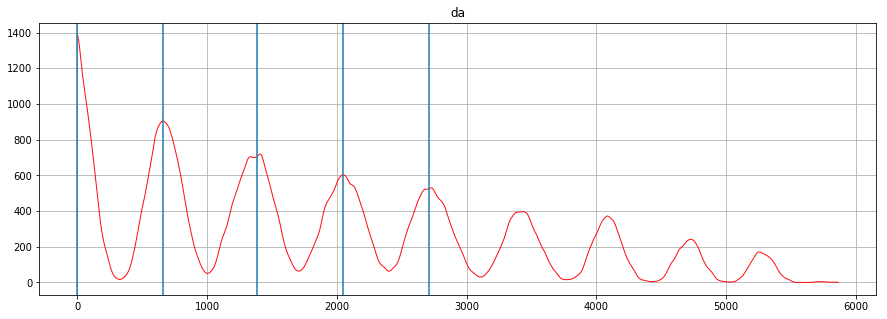

chunk number 46


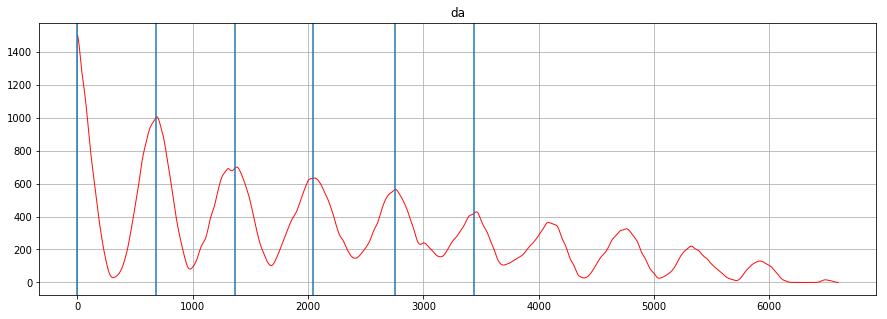

chunk number 47


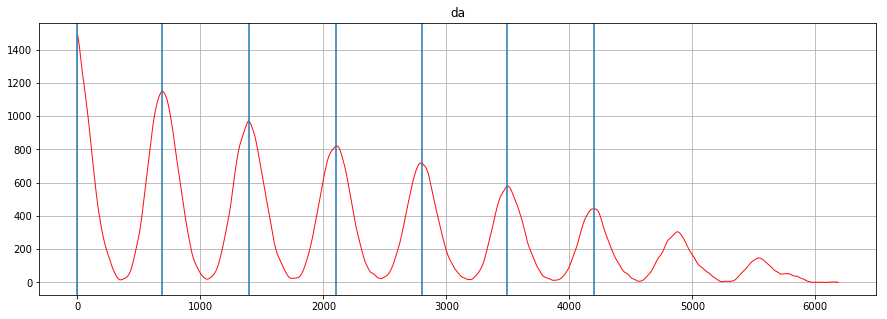

chunk number 48


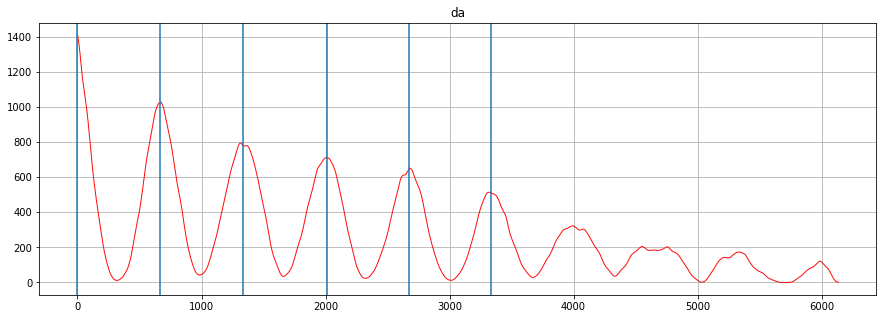

chunk number 49


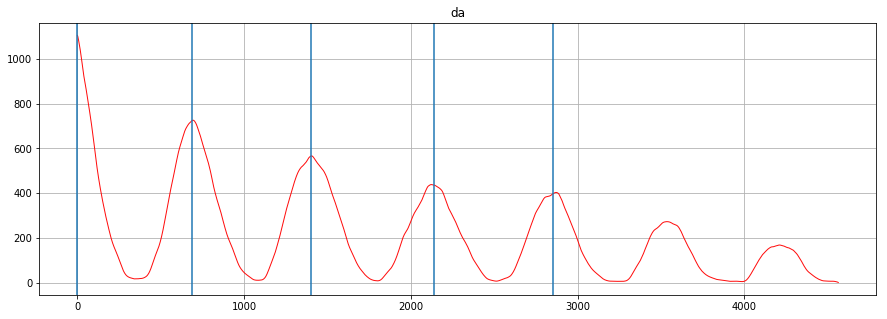

chunk number 50


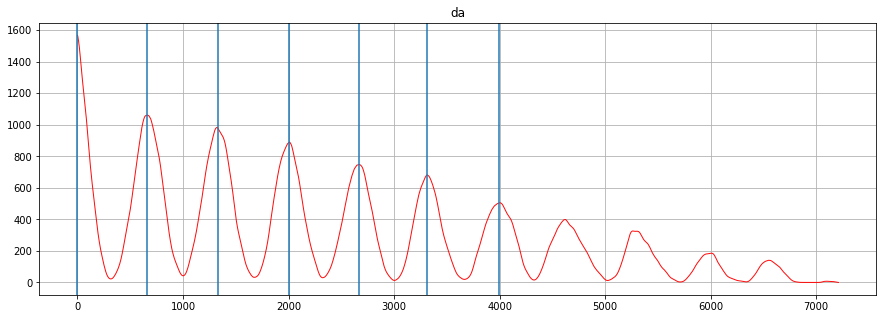

chunk number 51


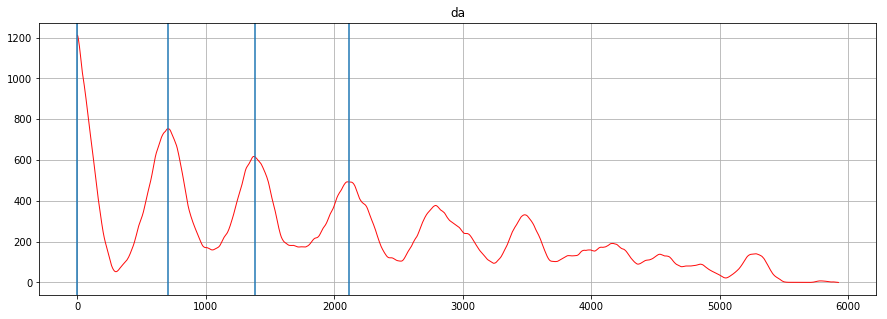

chunk number 52


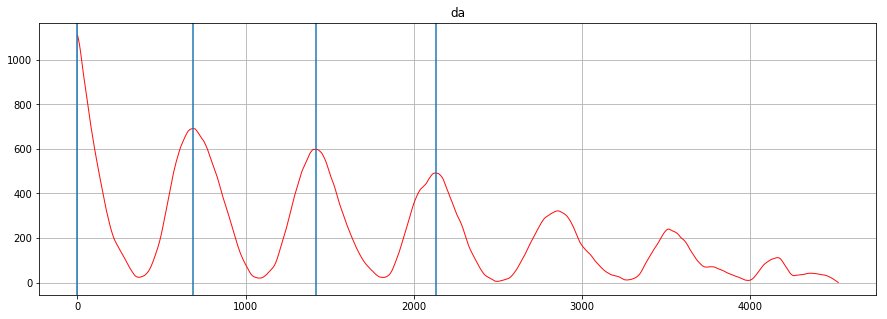

chunk number 53


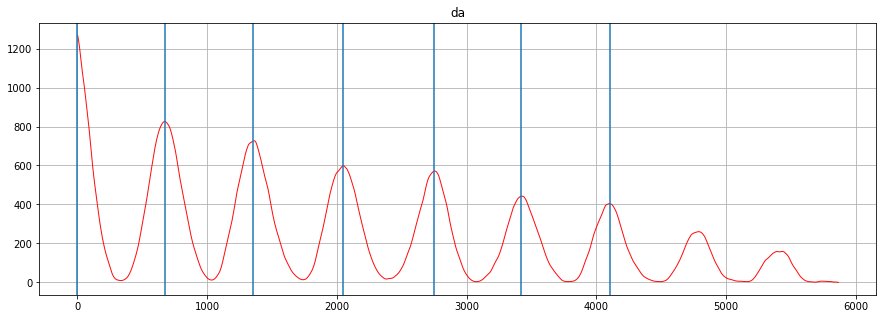

chunk number 54


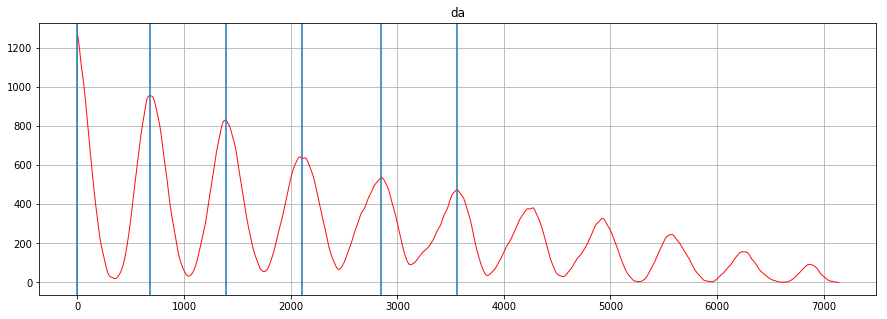

chunk number 55


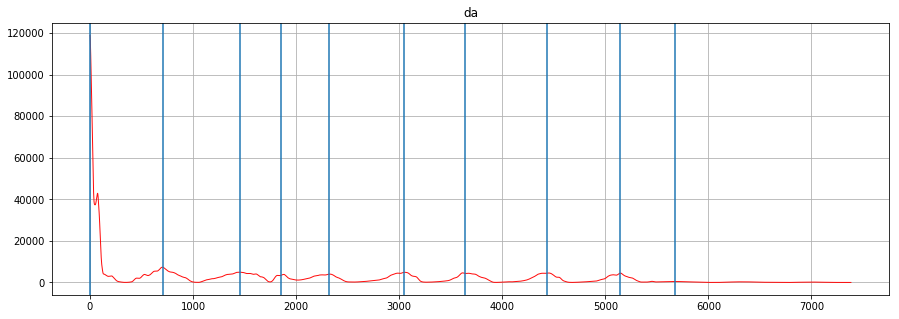

chunk number 56


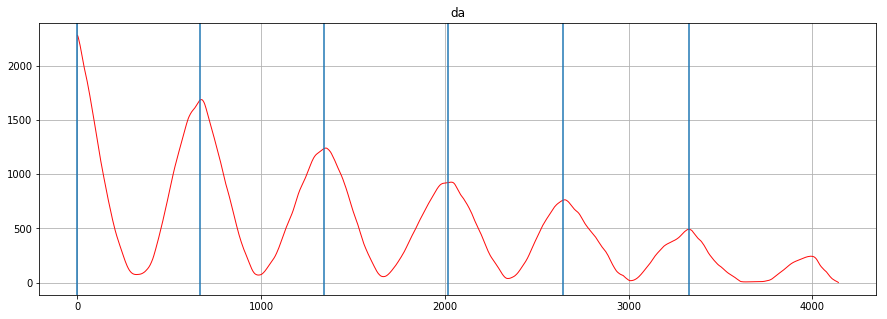

chunk number 57


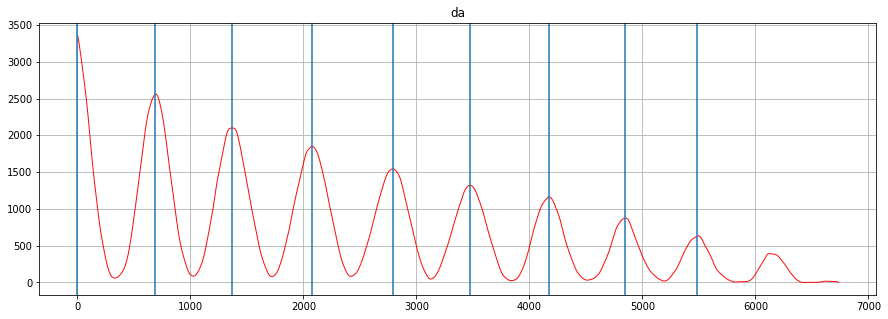

chunk number 58


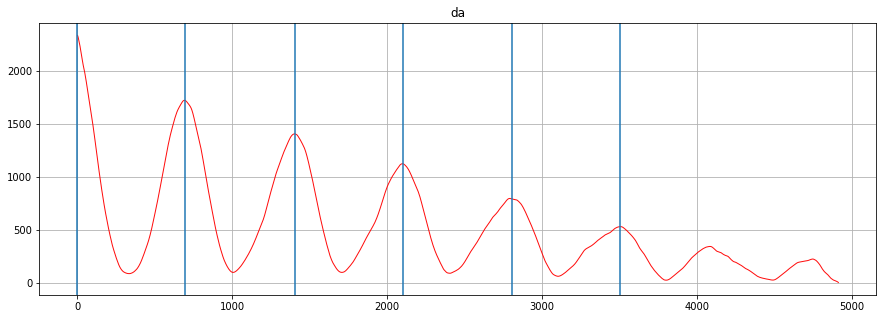

chunk number 59


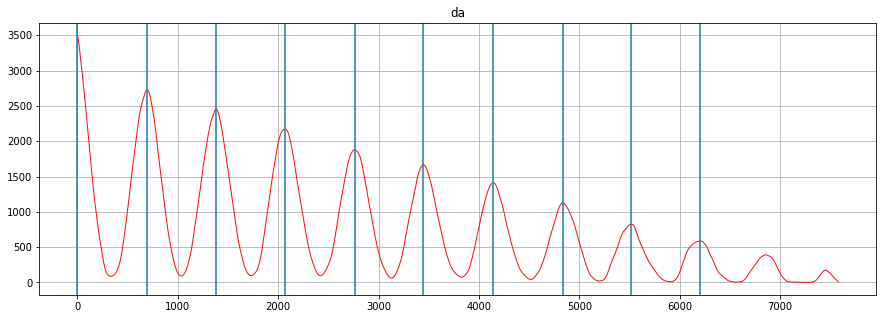

chunk number 60


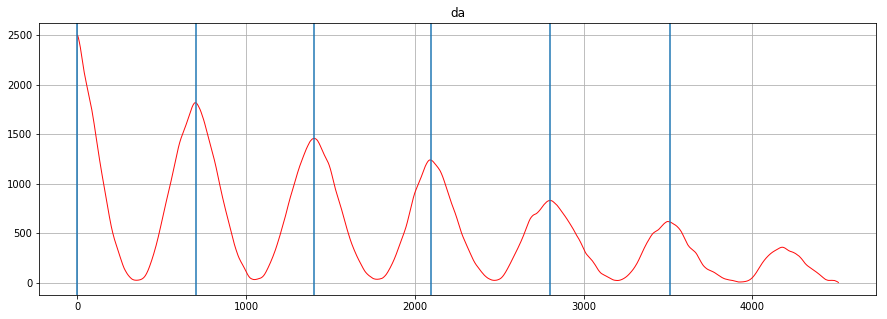

chunk number 61


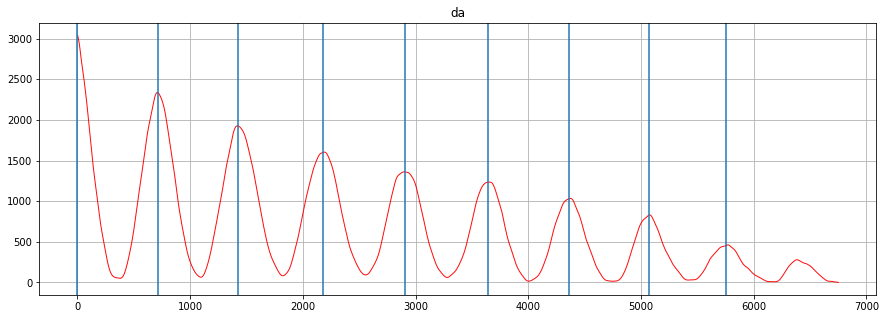

chunk number 62


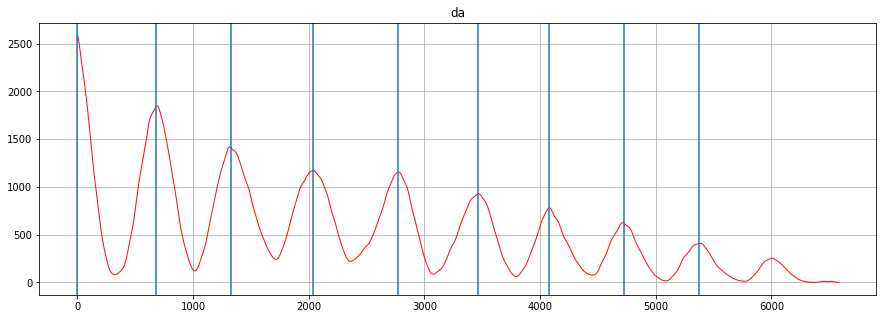

chunk number 63


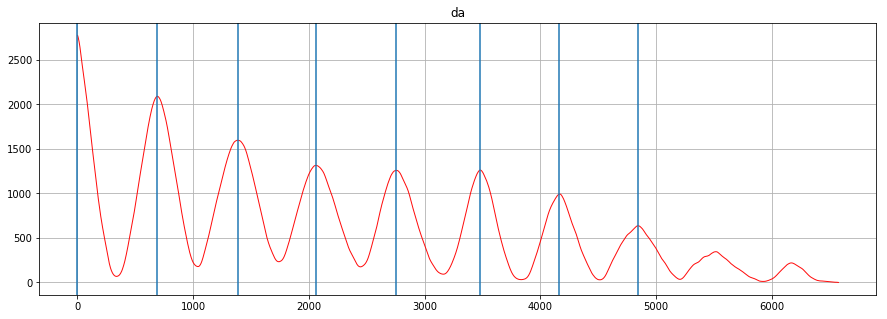

chunk number 64


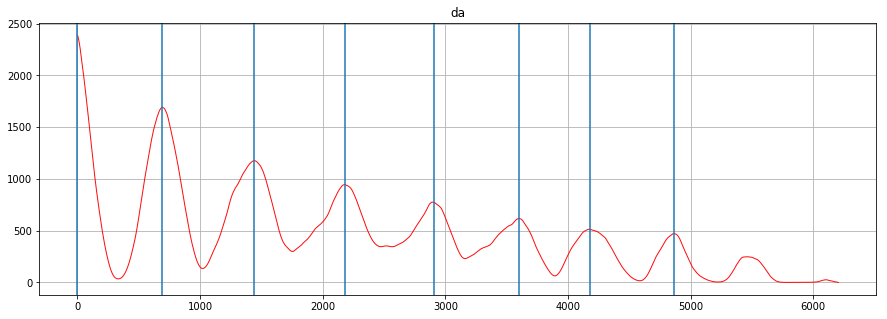

chunk number 65


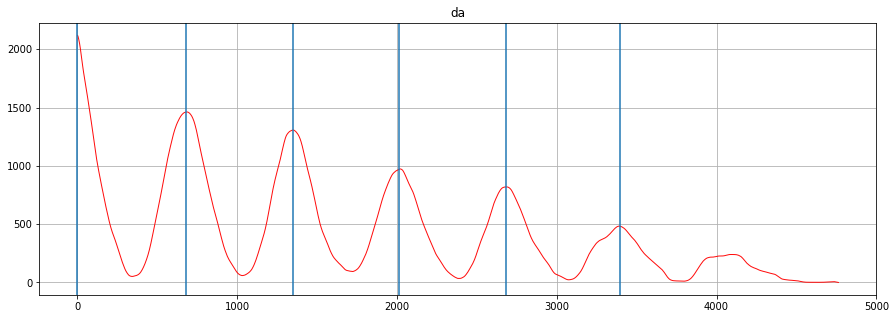

chunk number 66


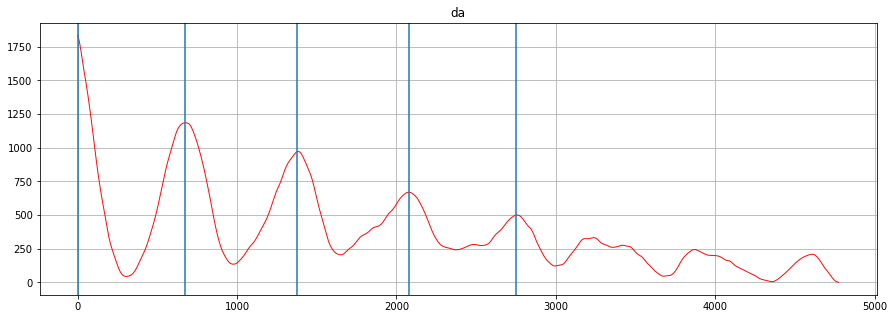

chunk number 67


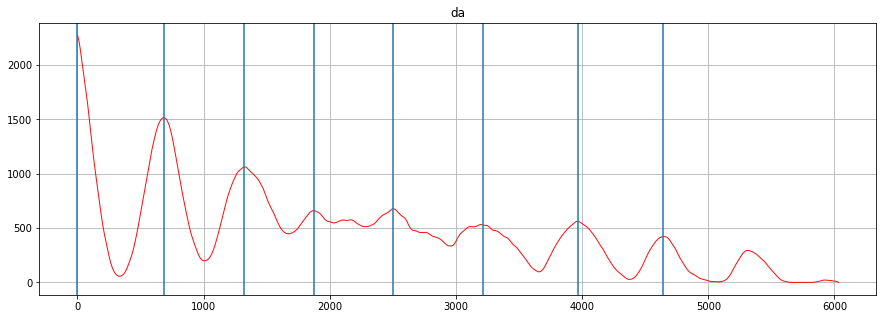

chunk number 68


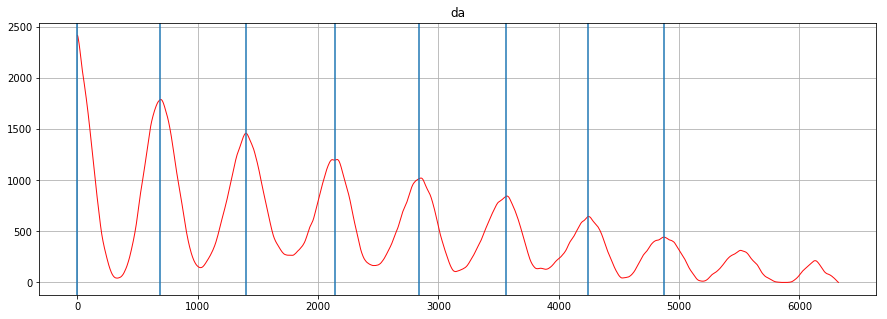

chunk number 69


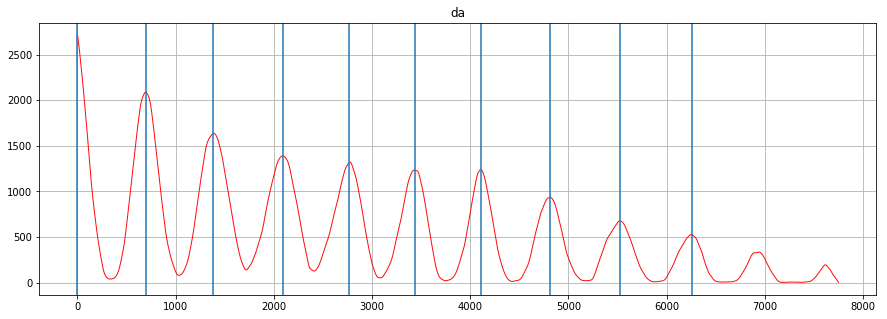

chunk number 70


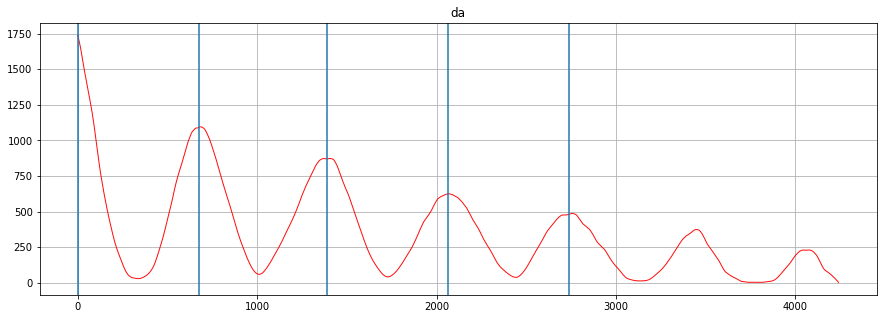

chunk number 71


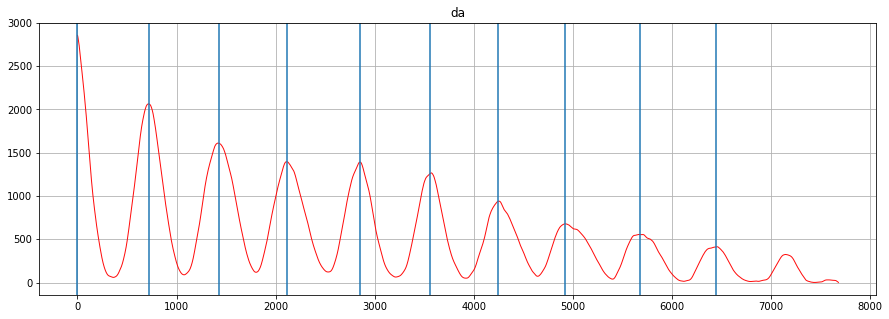

chunk number 72


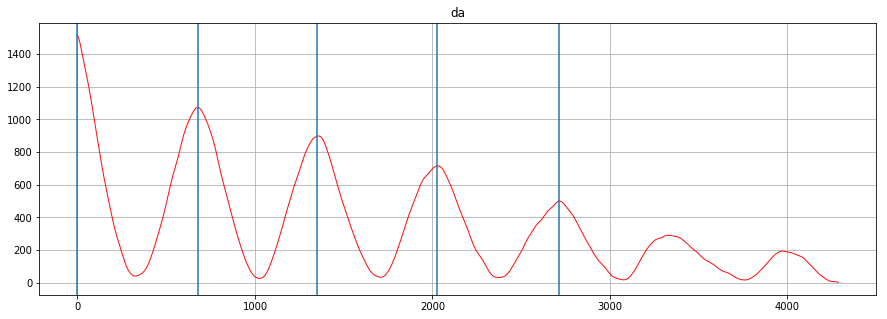

chunk number 73


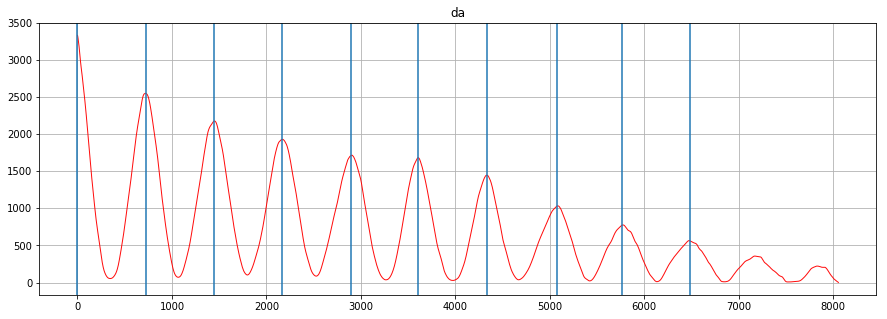

chunk number 74


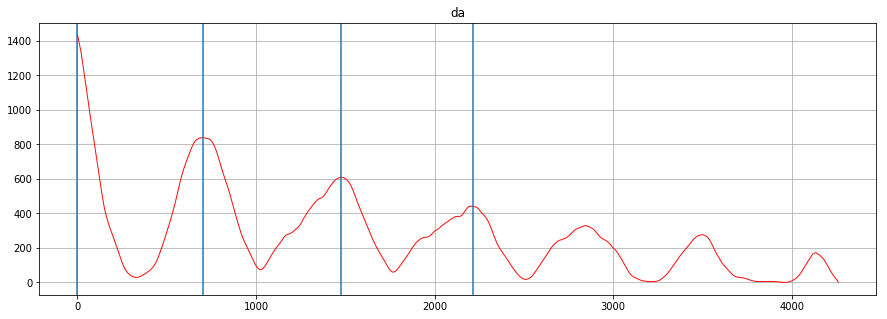

chunk number 75


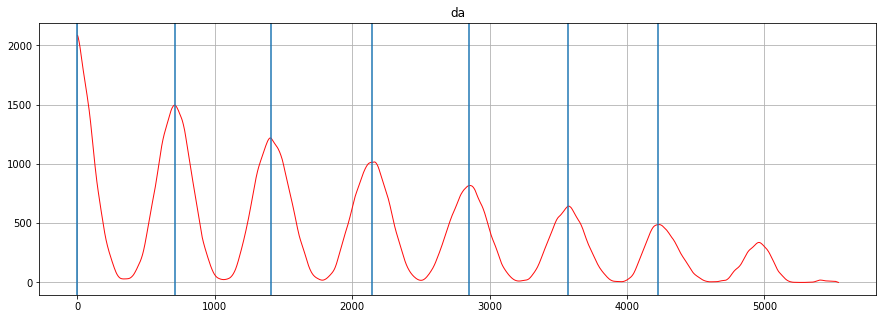

chunk number 76


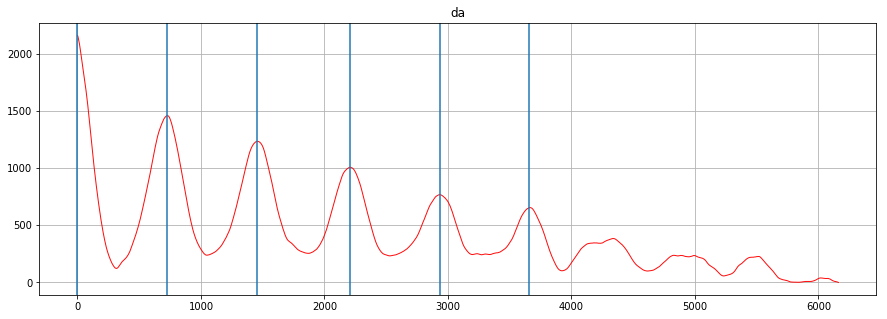

chunk number 77


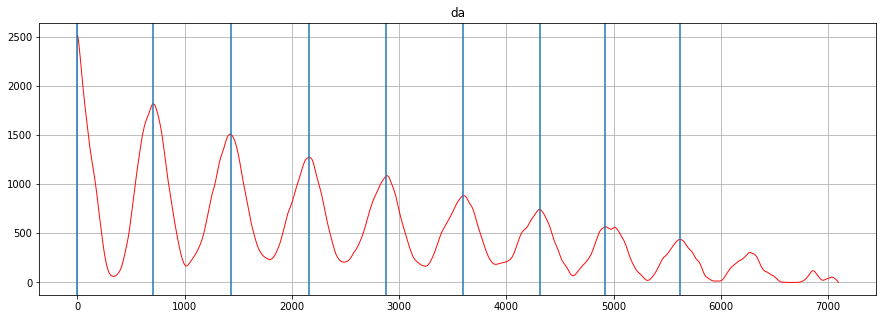

chunk number 78


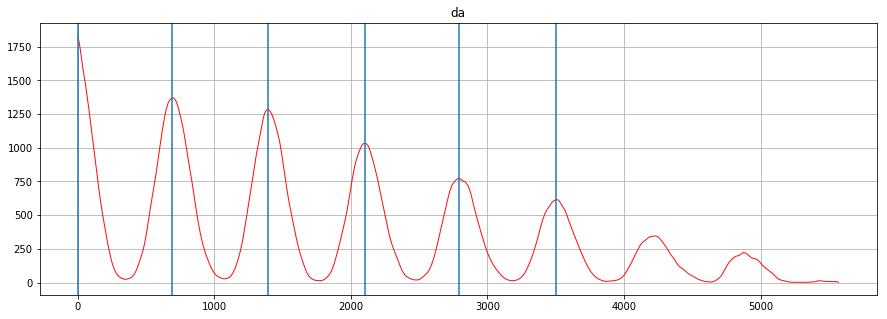

chunk number 79


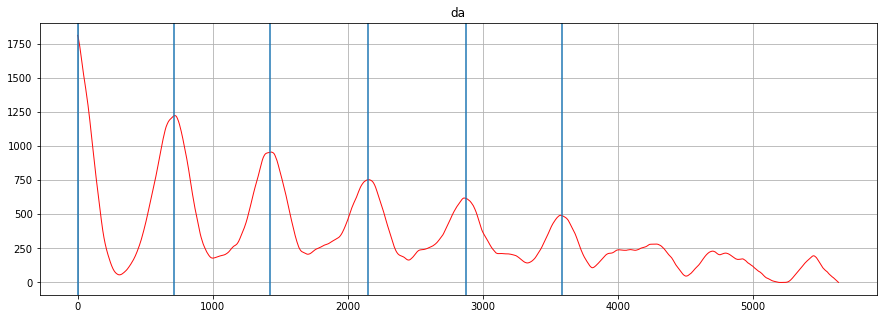

chunk number 80


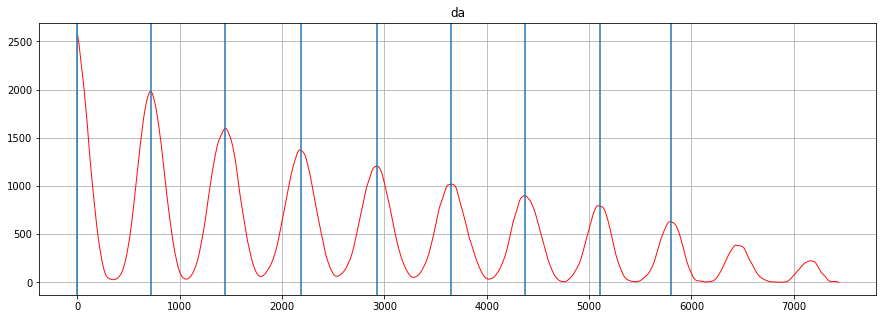

2019-09-05_prc
chunk number 0


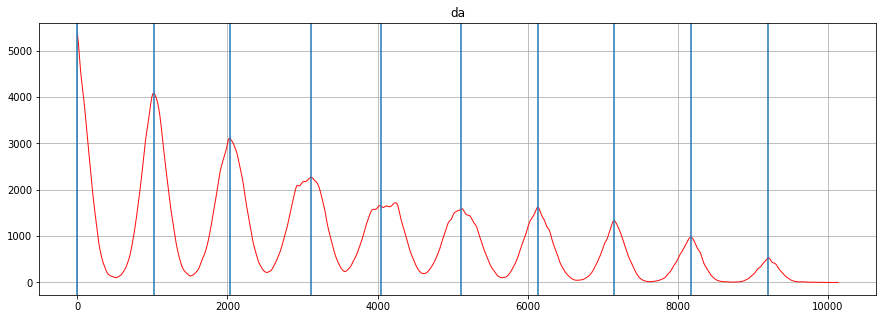

chunk number 1


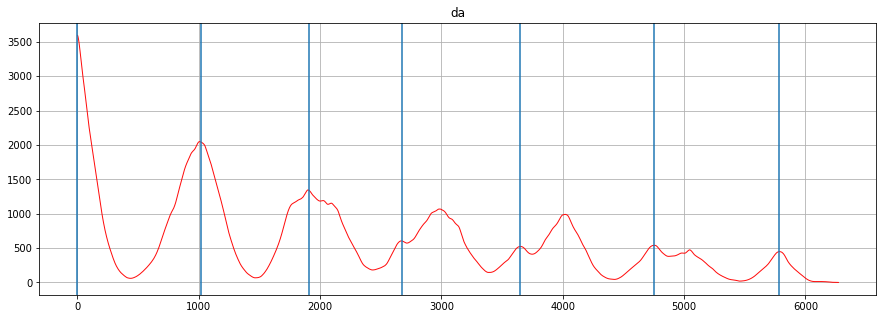

chunk number 2


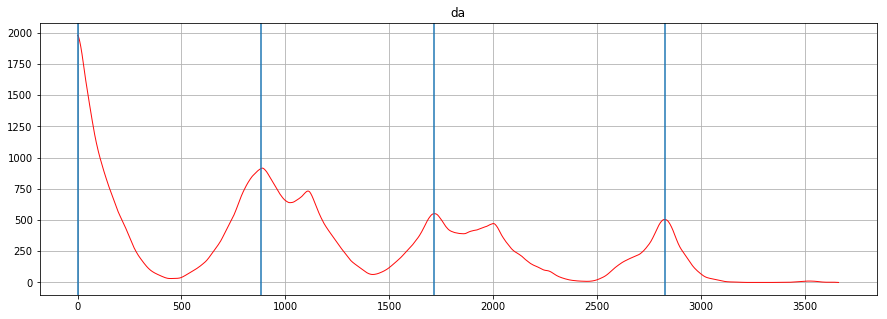

chunk number 3


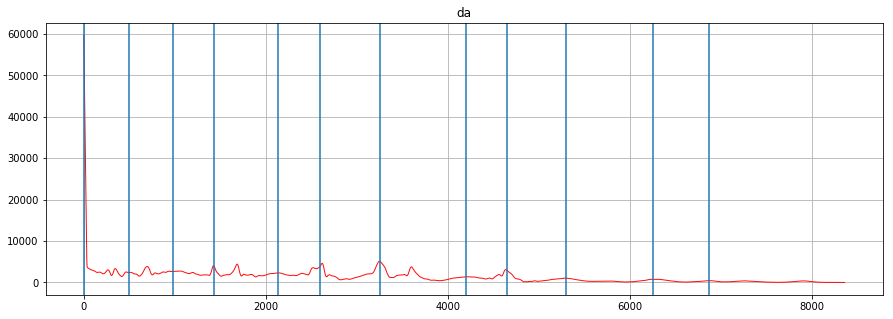

chunk number 4


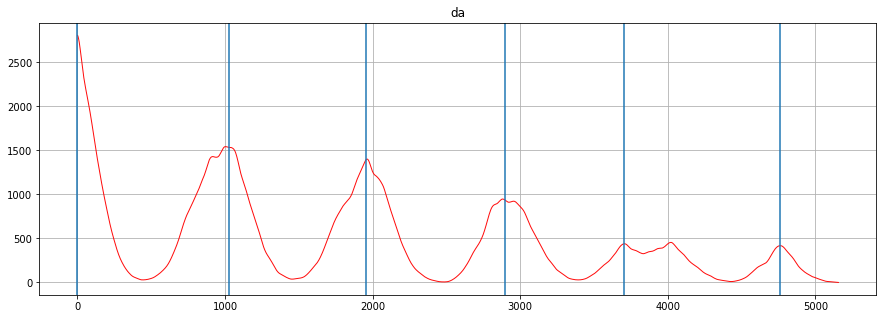

chunk number 5


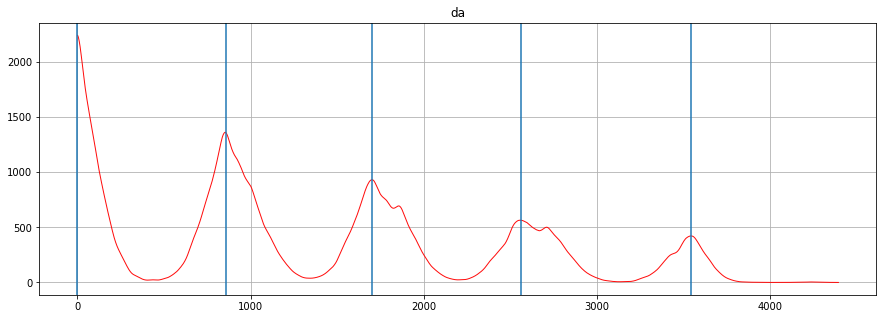

chunk number 6


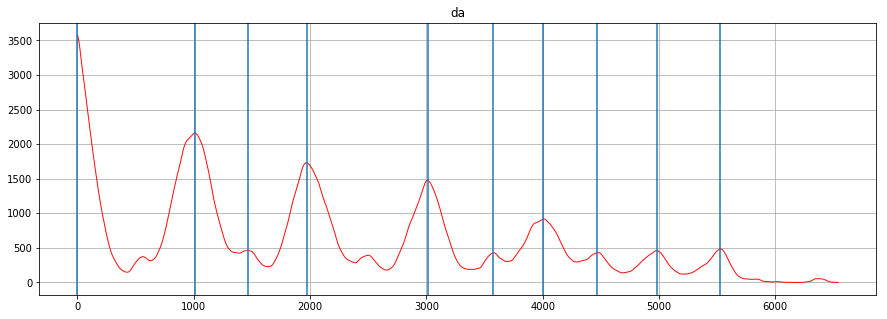

chunk number 7


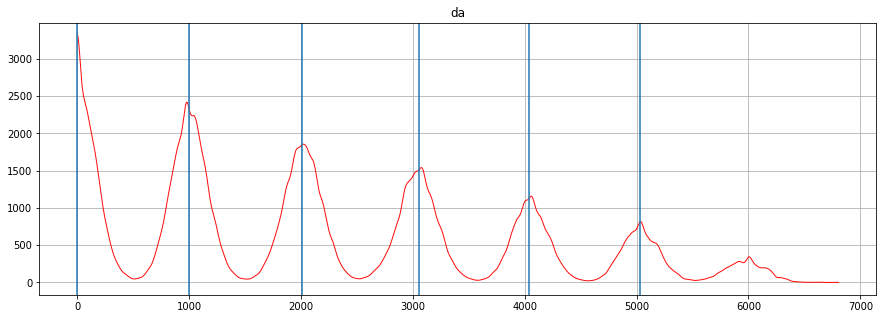

chunk number 8


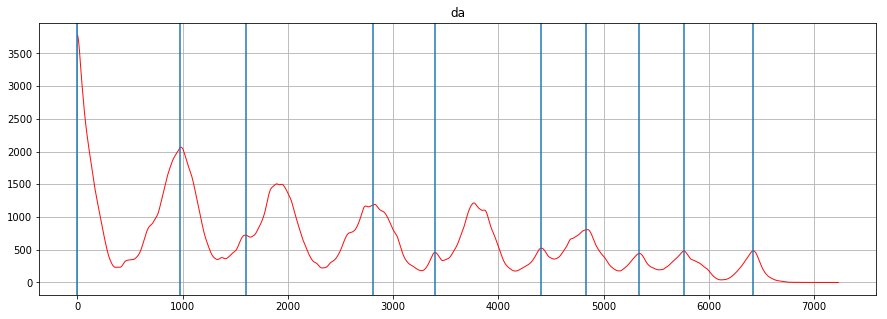

chunk number 9


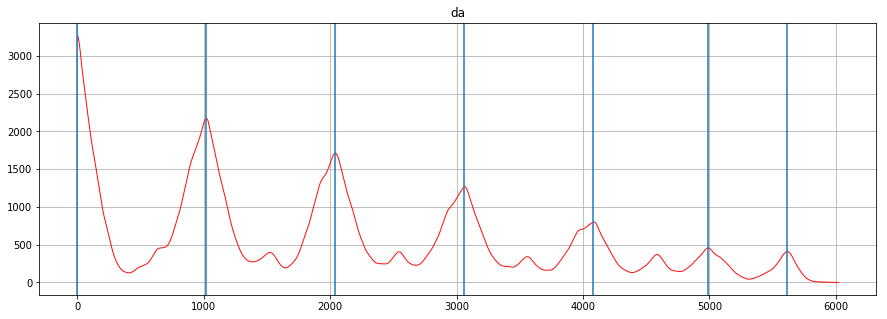

chunk number 10


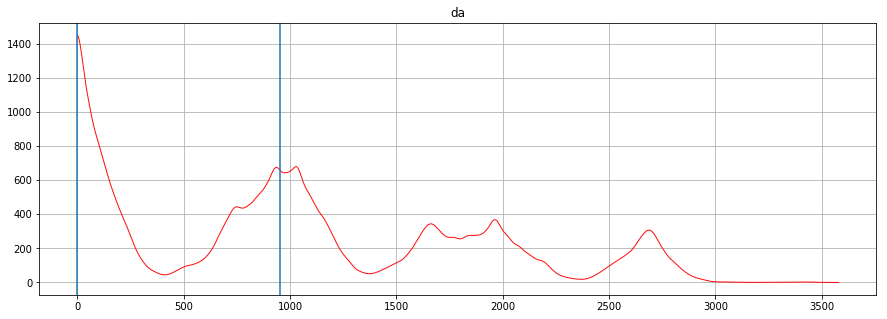

chunk number 11


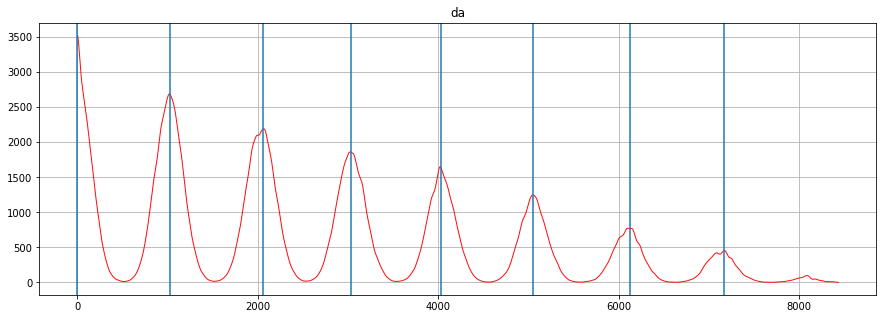

chunk number 12


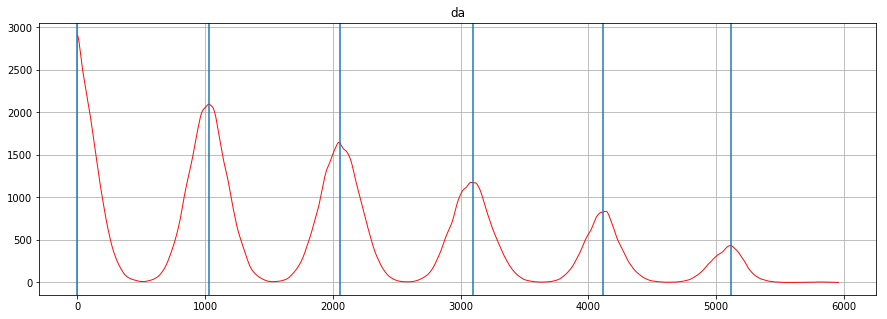

chunk number 13


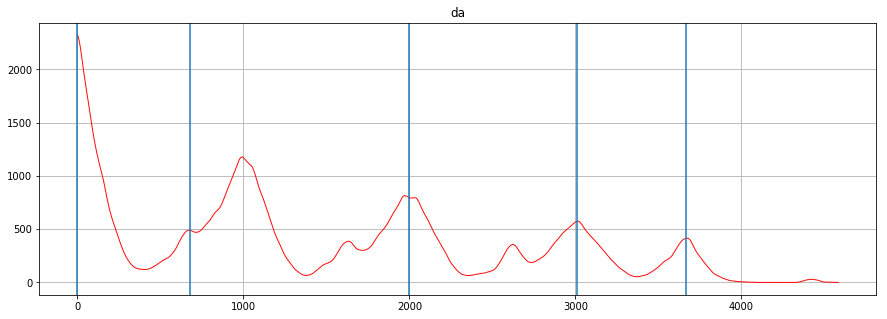

chunk number 14


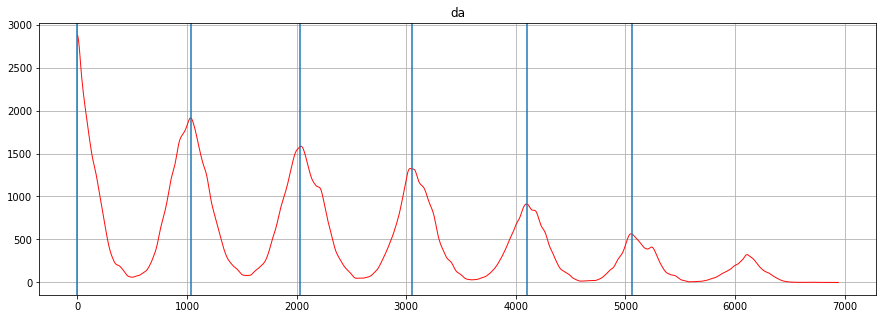

chunk number 15


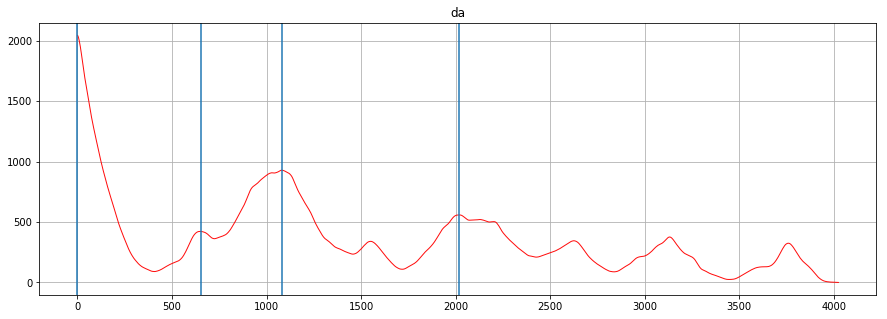

chunk number 16


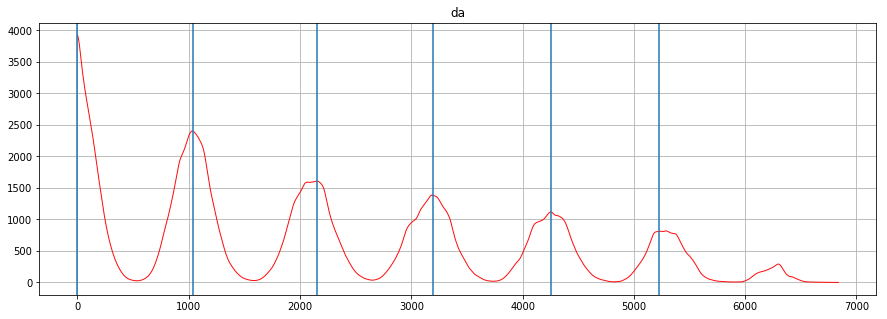

chunk number 17


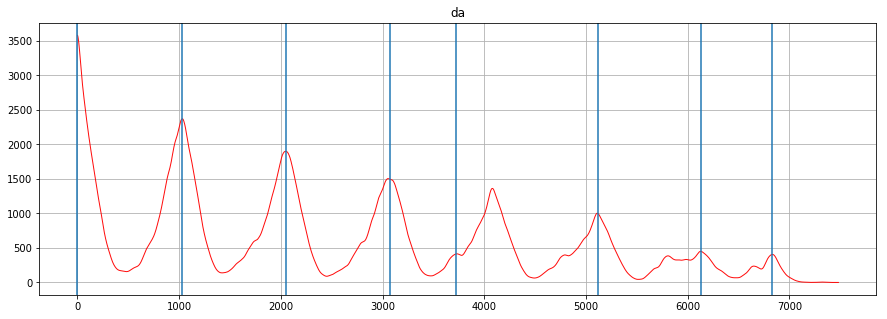

chunk number 18


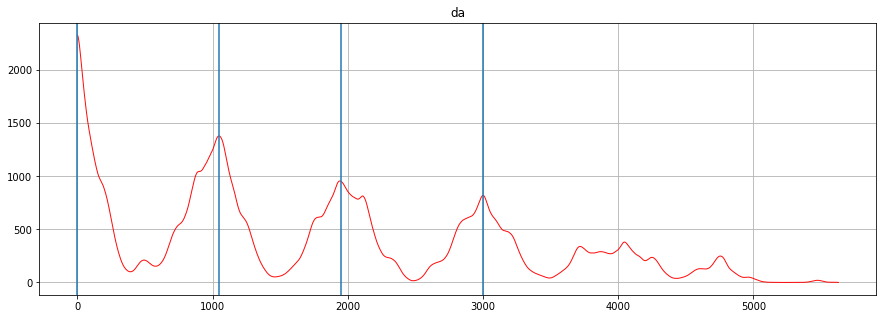

chunk number 19


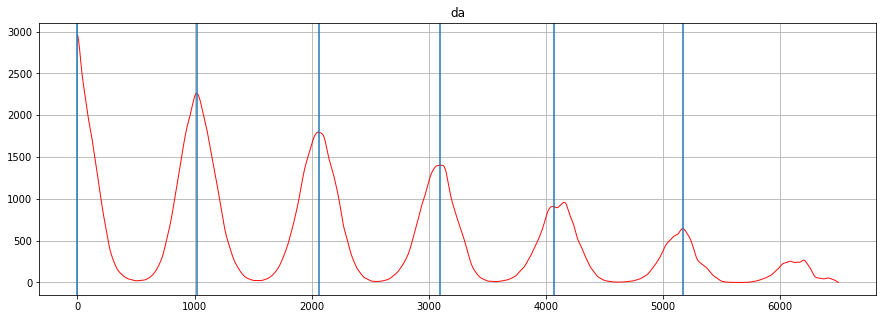

chunk number 20


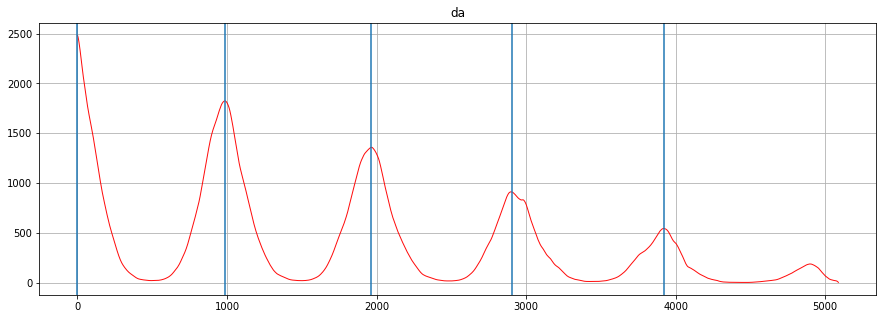

chunk number 21


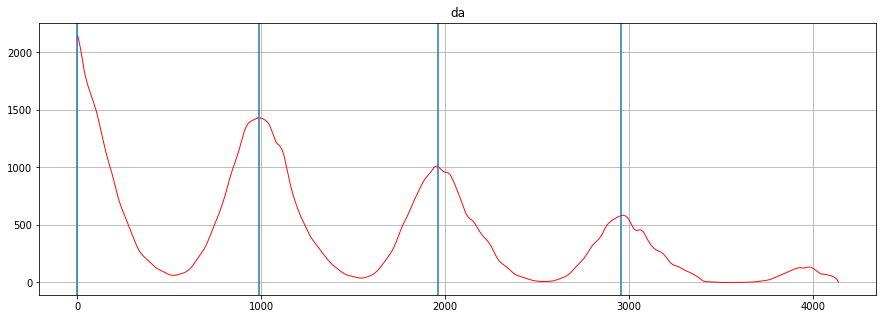

chunk number 22


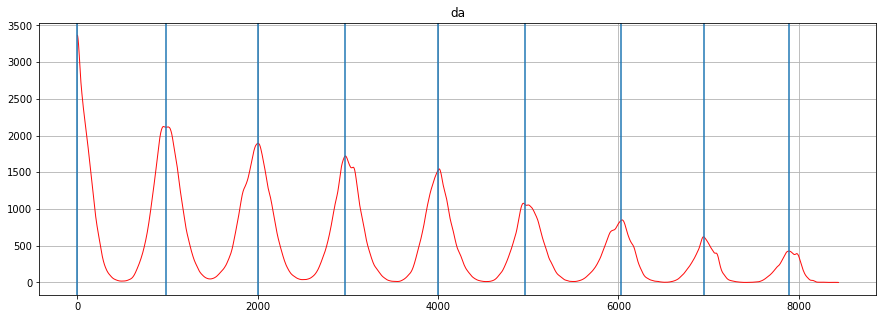

chunk number 23


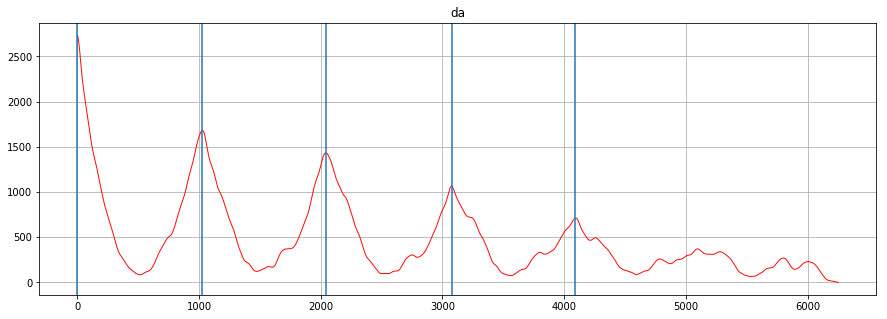

chunk number 24


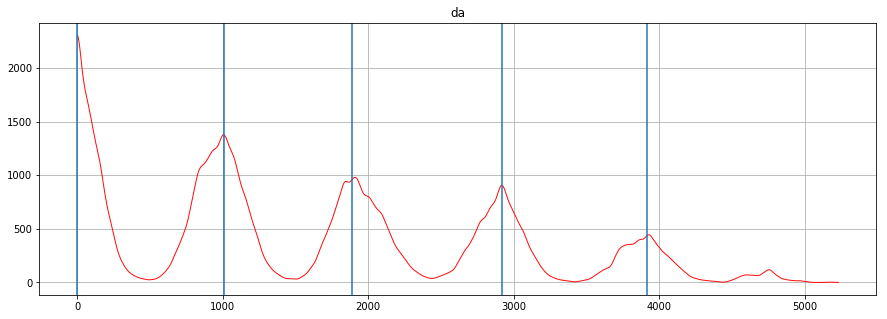

chunk number 25


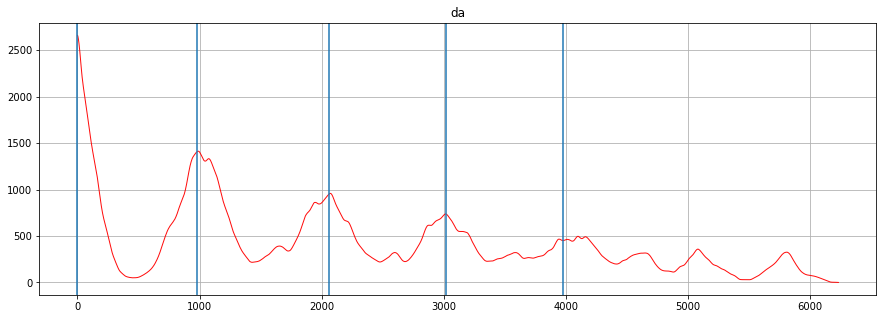

chunk number 26


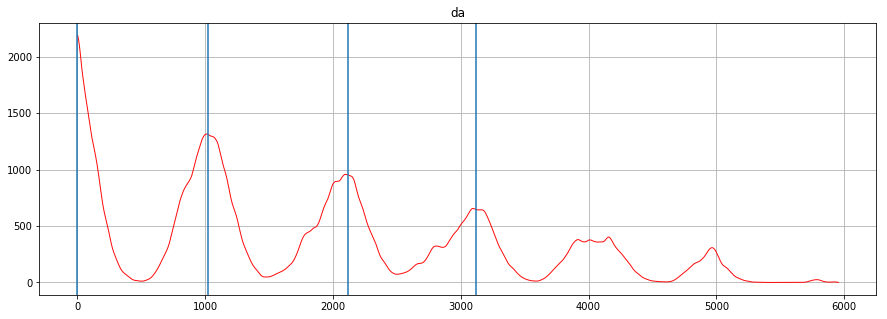

chunk number 27


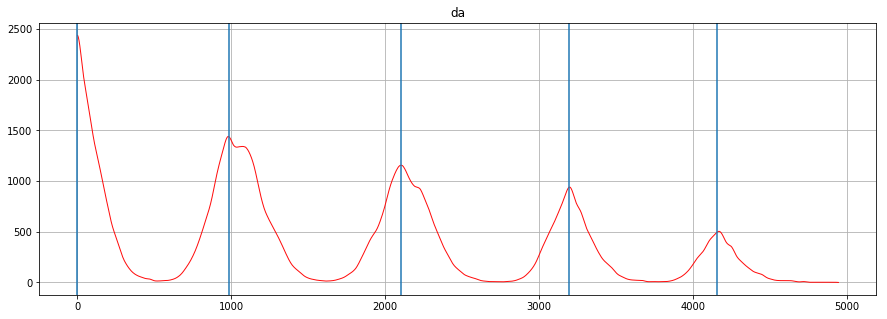

chunk number 28


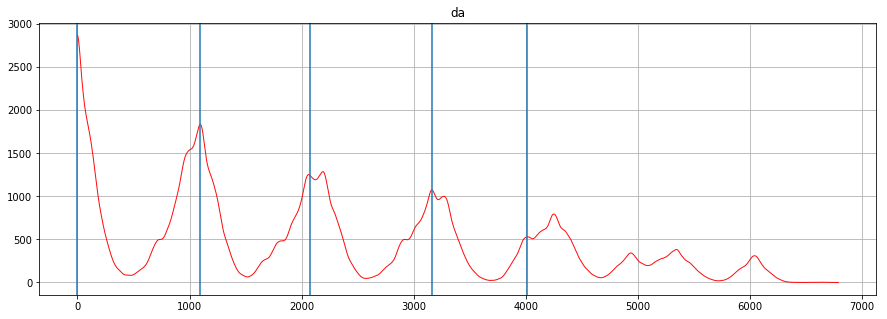

chunk number 29


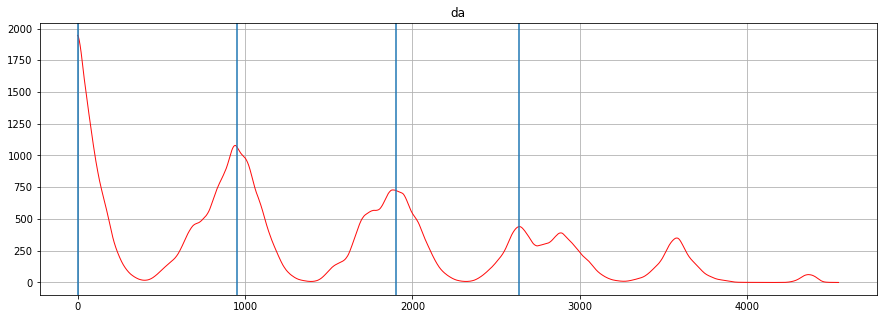

chunk number 30


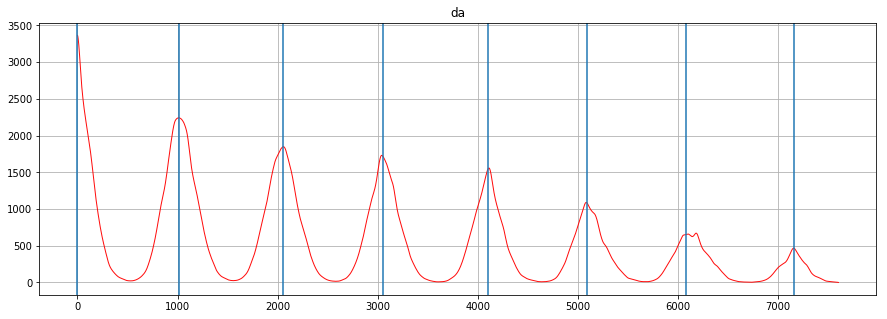

chunk number 31


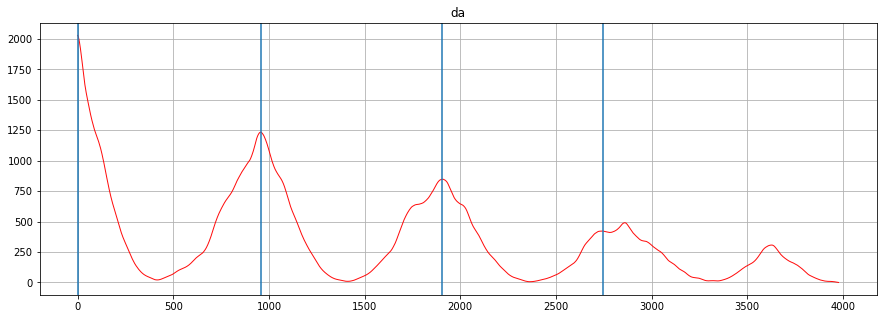

chunk number 32


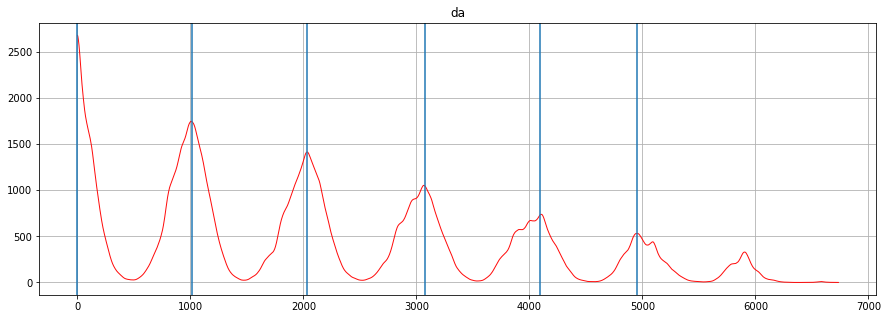

chunk number 33


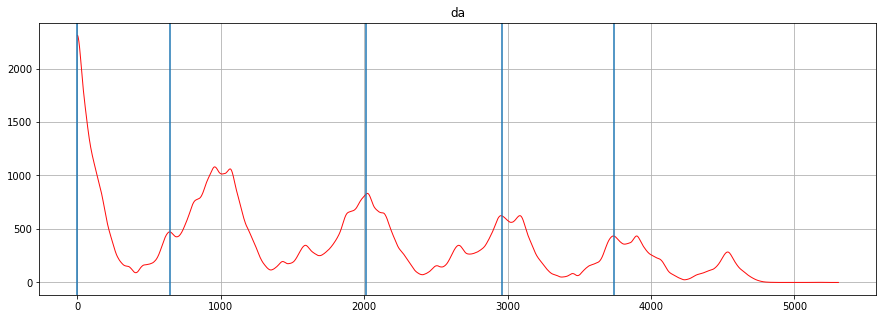

chunk number 34


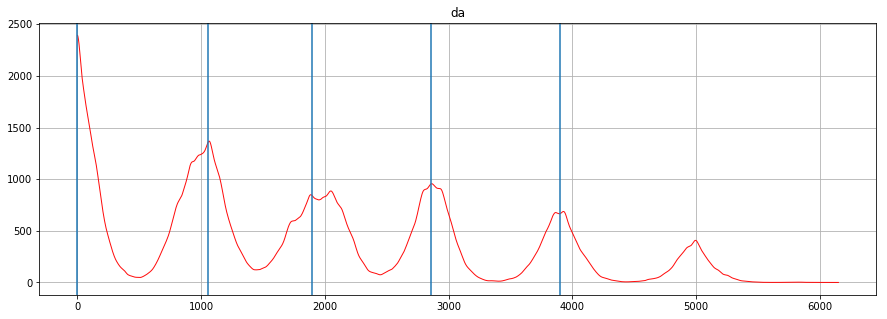

chunk number 35


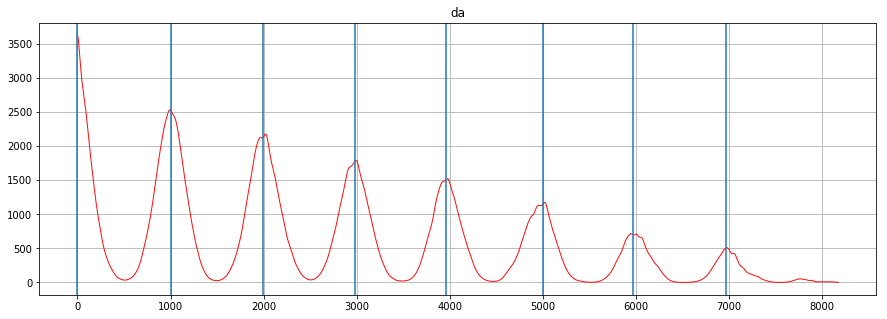

chunk number 36


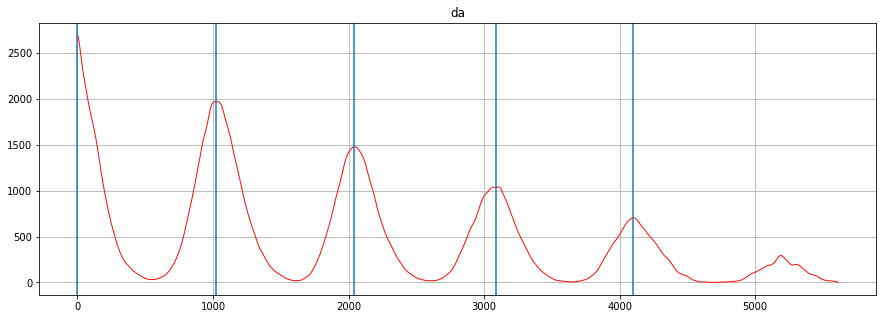

chunk number 37


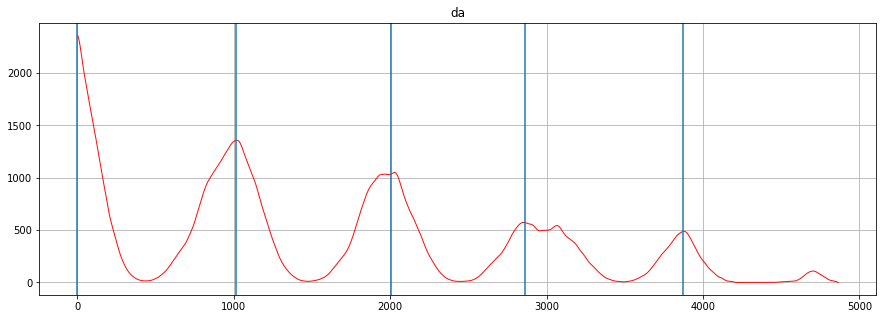

chunk number 38


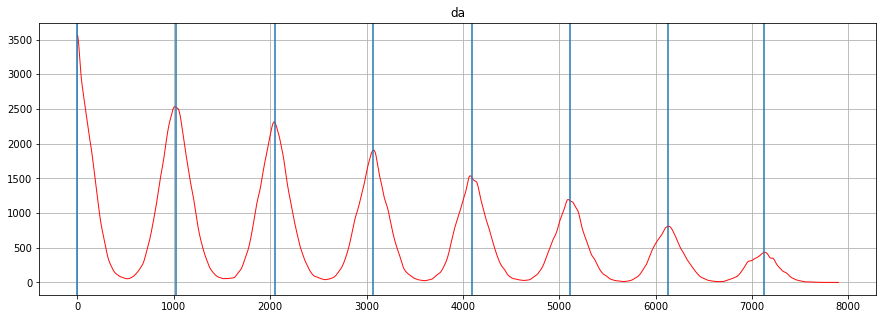

chunk number 39


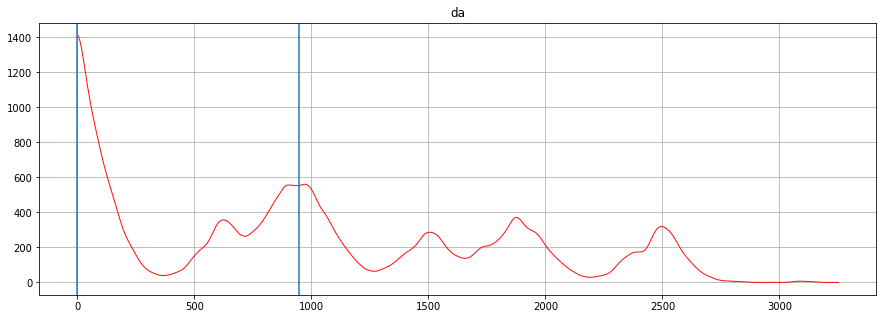

chunk number 40


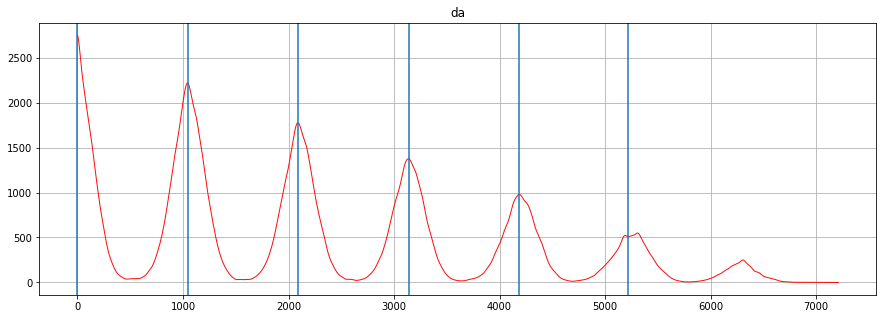

chunk number 41


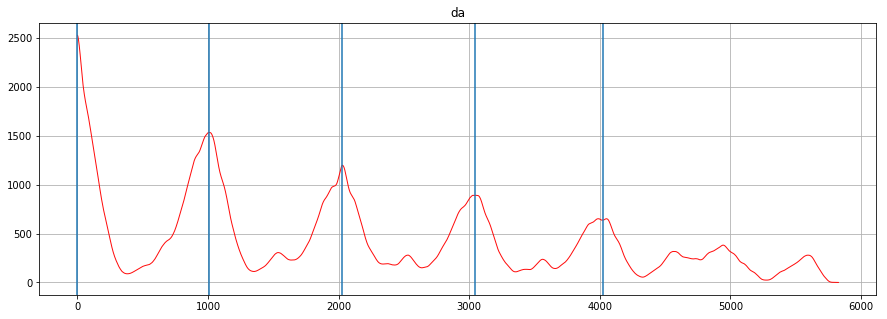

chunk number 42


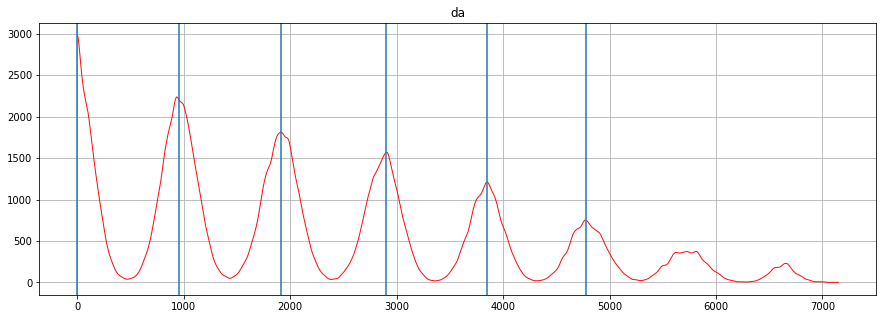

chunk number 43


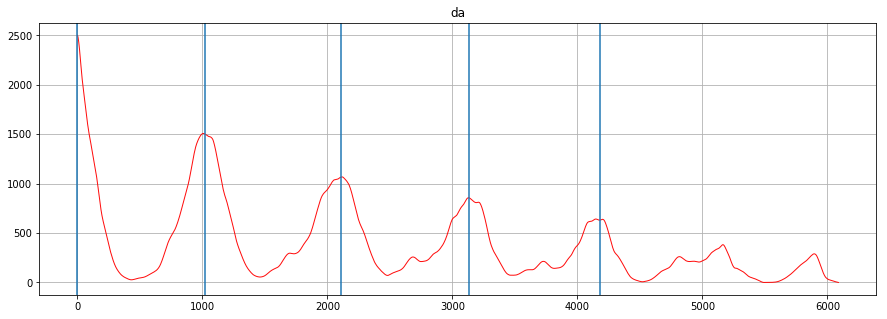

chunk number 44


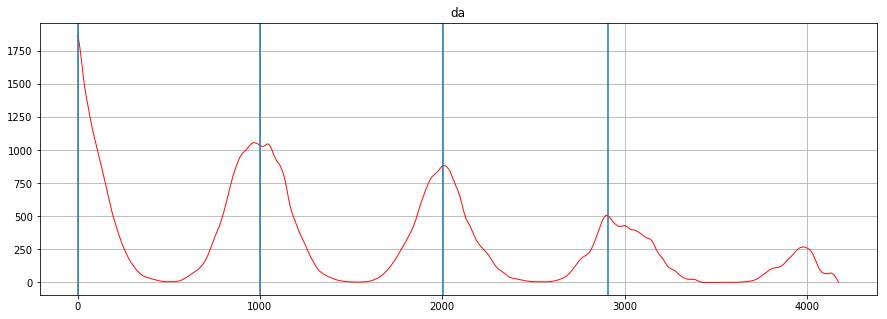

chunk number 45


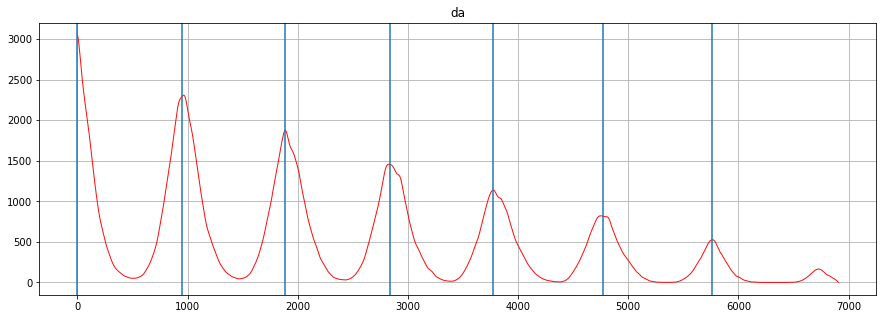

chunk number 46


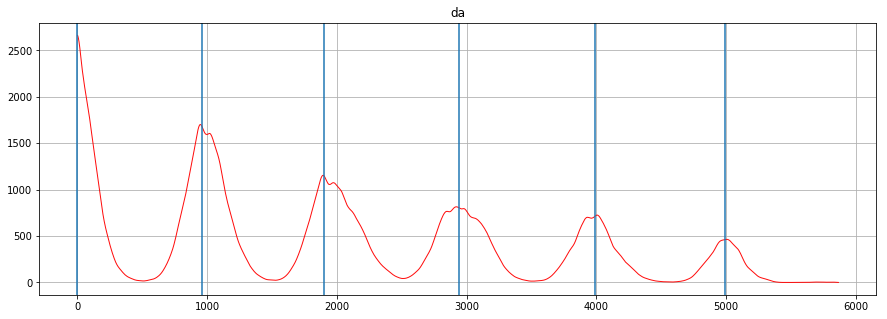

chunk number 47


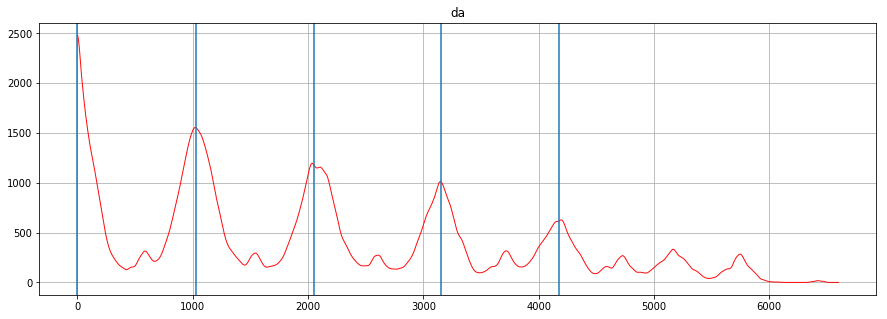

chunk number 48


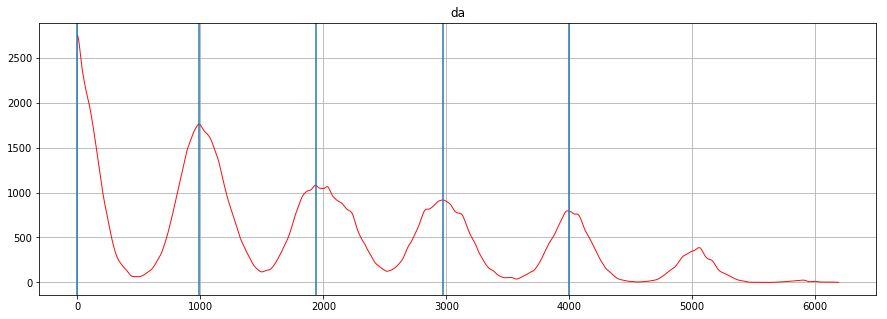

chunk number 49


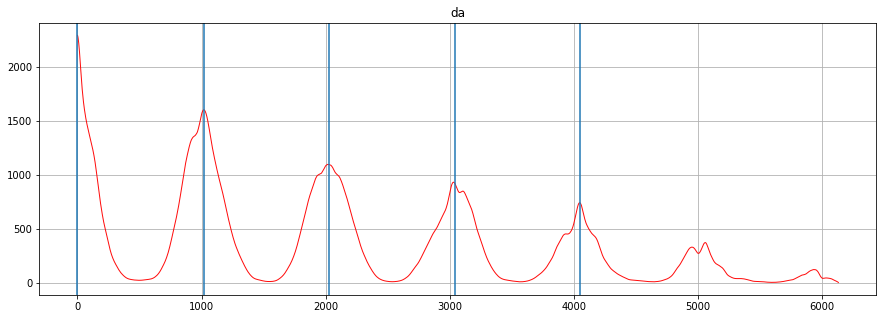

chunk number 50


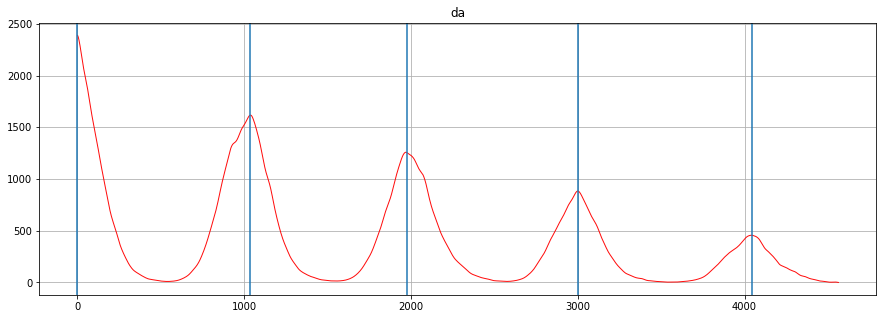

chunk number 51


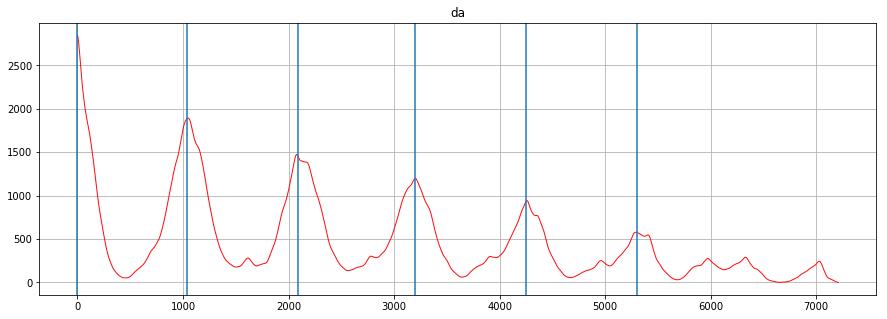

chunk number 52


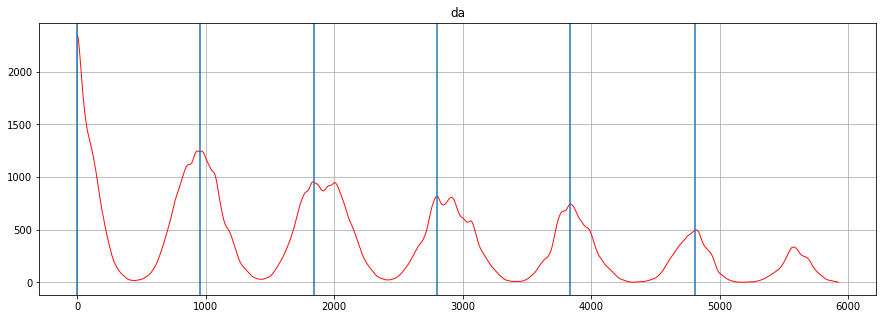

chunk number 53


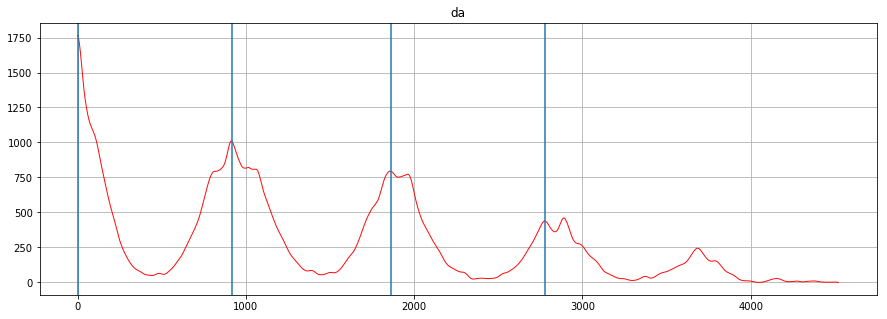

chunk number 54


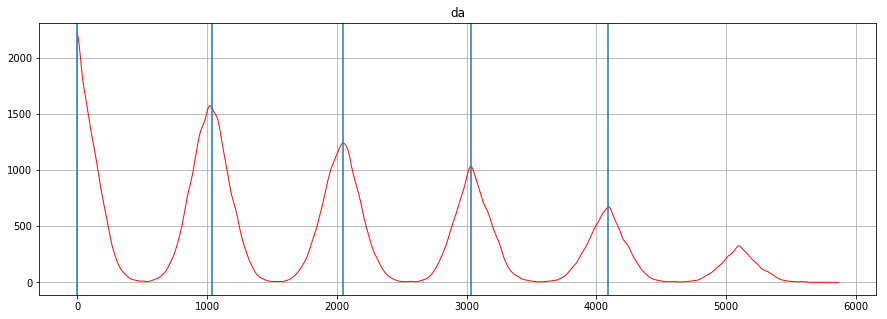

chunk number 55


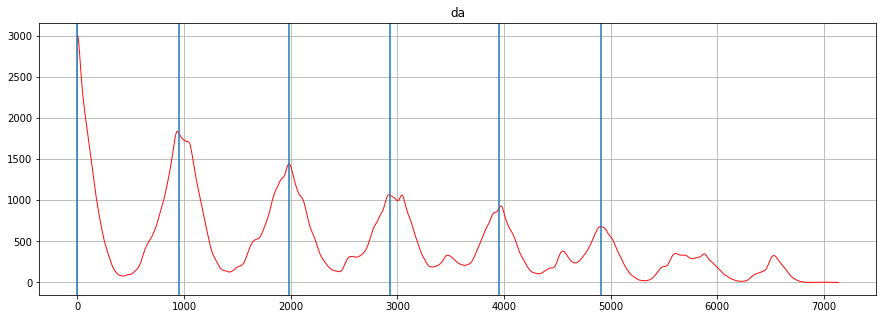

chunk number 56


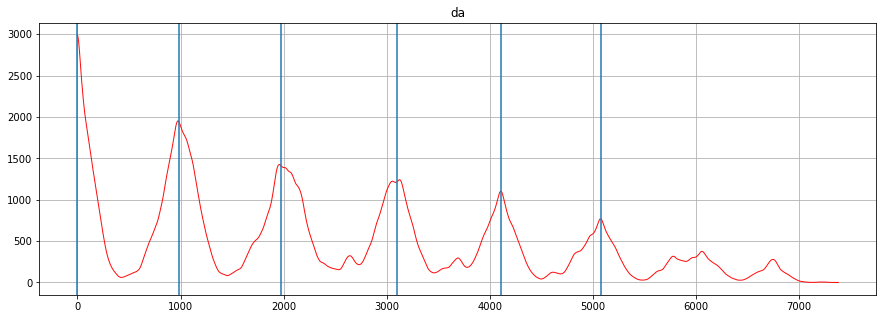

chunk number 57


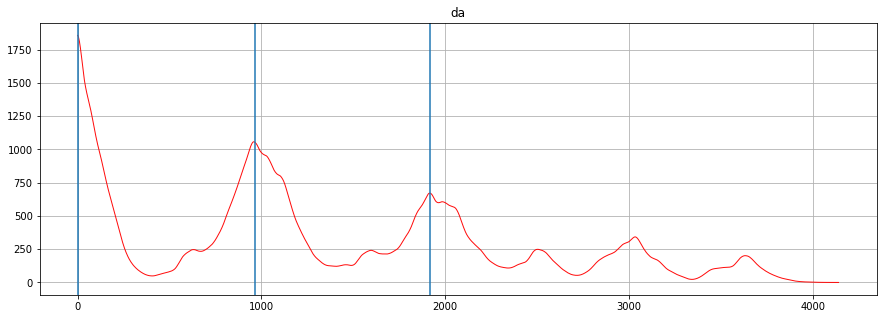

chunk number 58


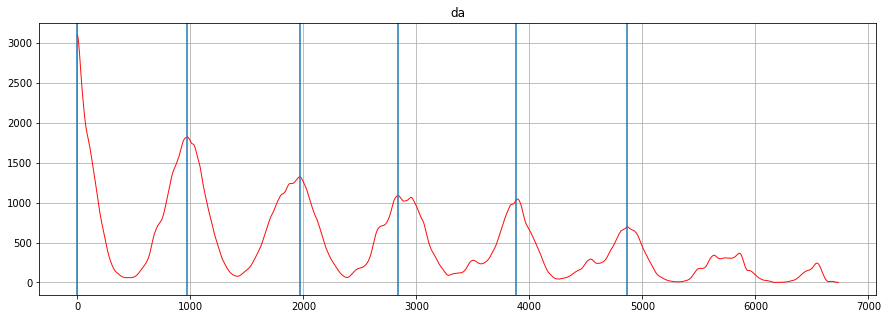

chunk number 59


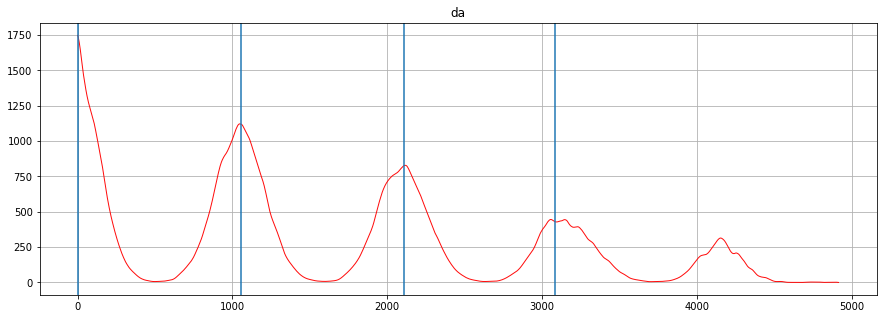

chunk number 60


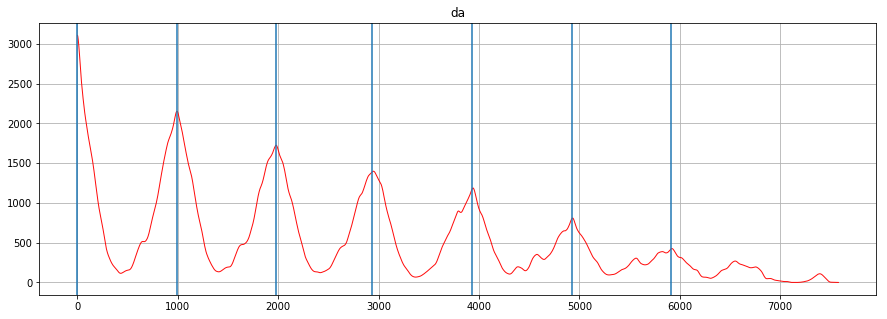

chunk number 61


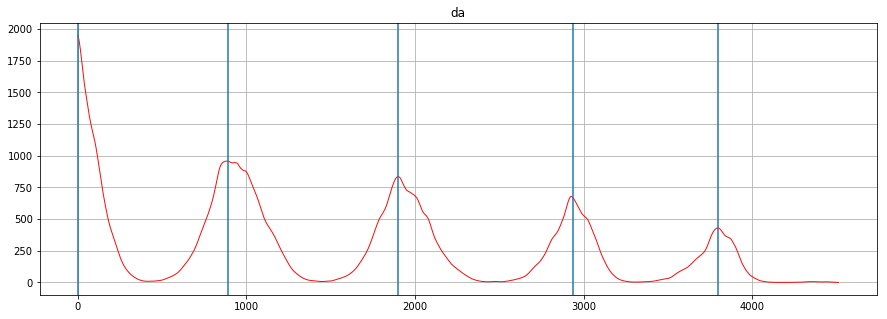

chunk number 62


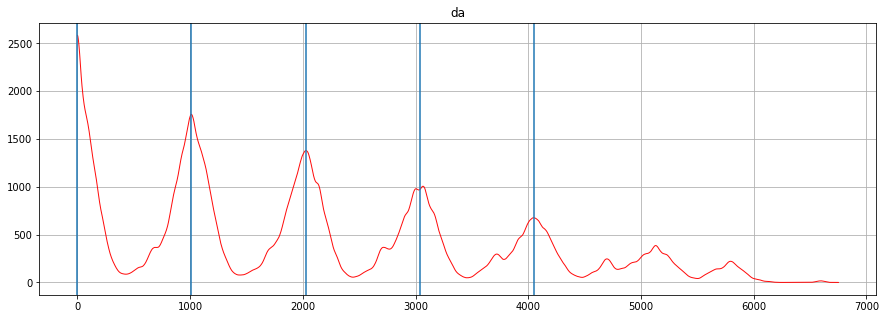

chunk number 63


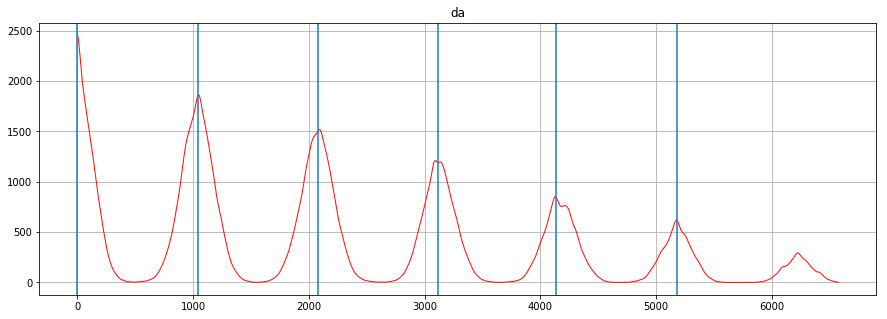

chunk number 64


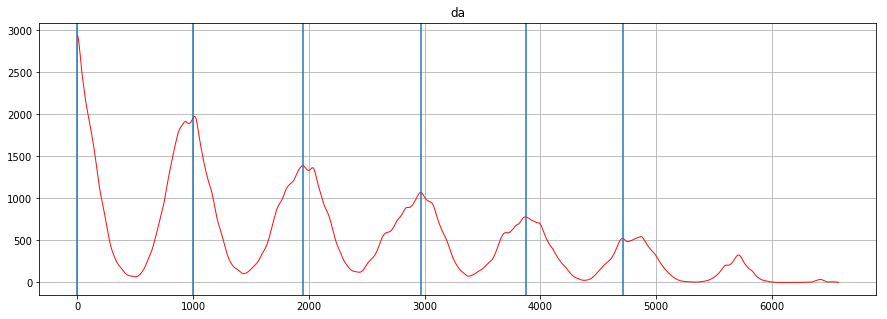

chunk number 65


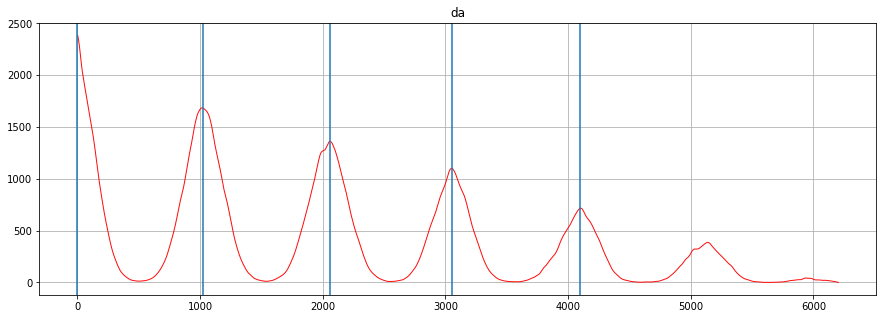

chunk number 66


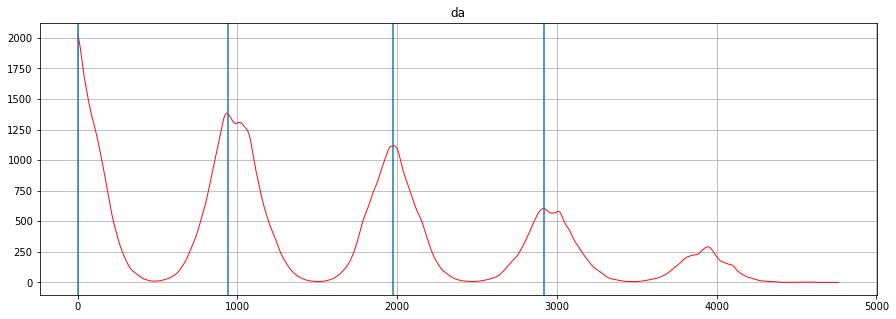

chunk number 67


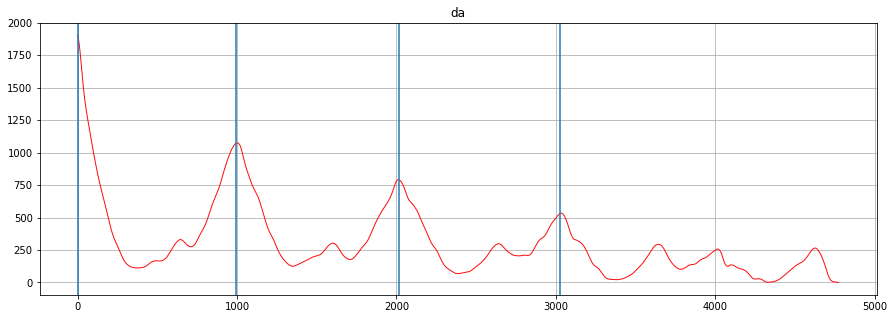

chunk number 68


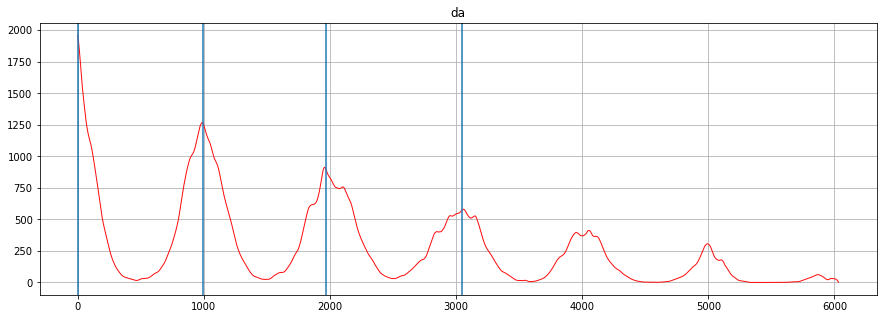

chunk number 69


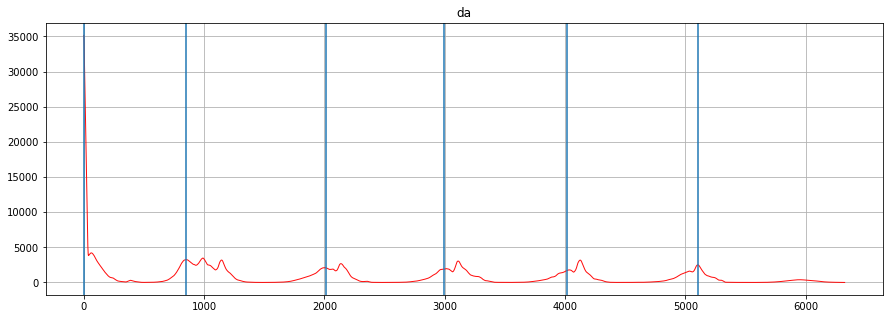

chunk number 70


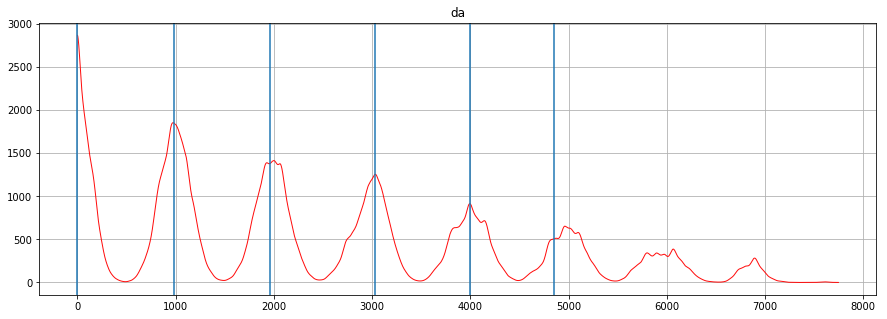

chunk number 71


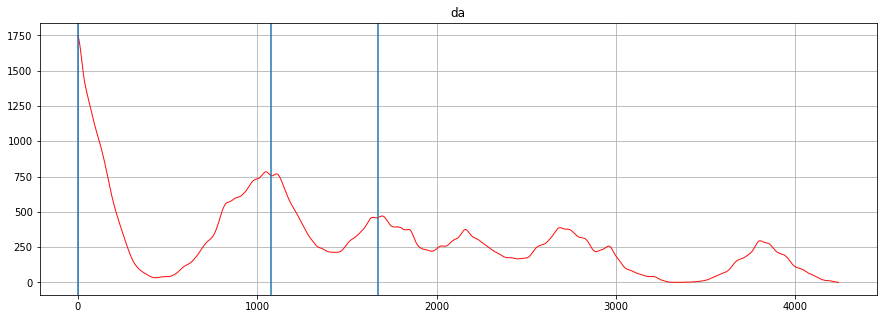

chunk number 72


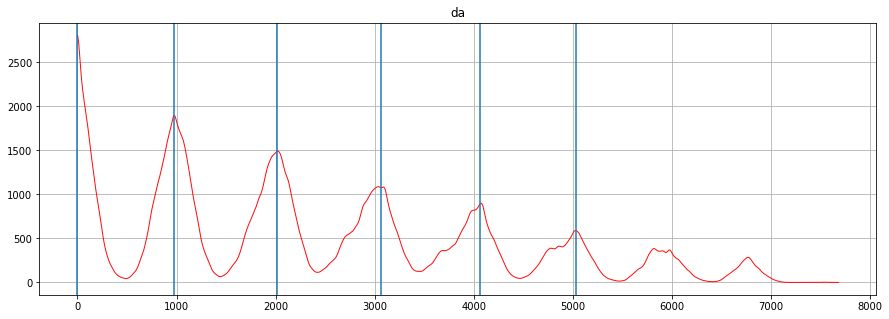

chunk number 73


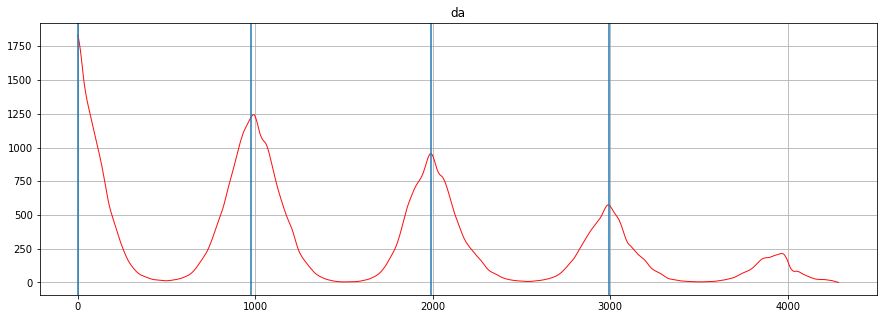

chunk number 74


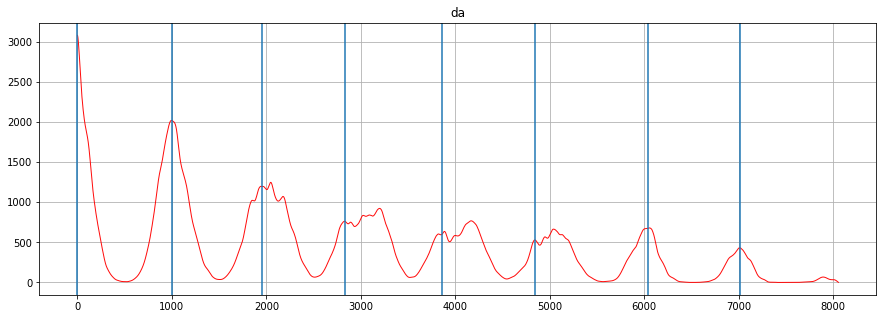

chunk number 75


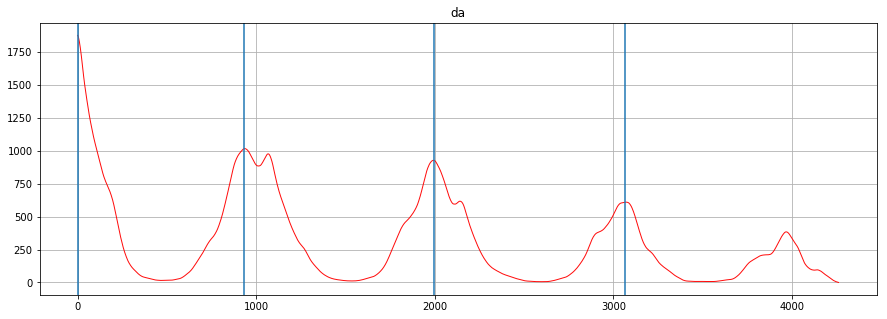

chunk number 76


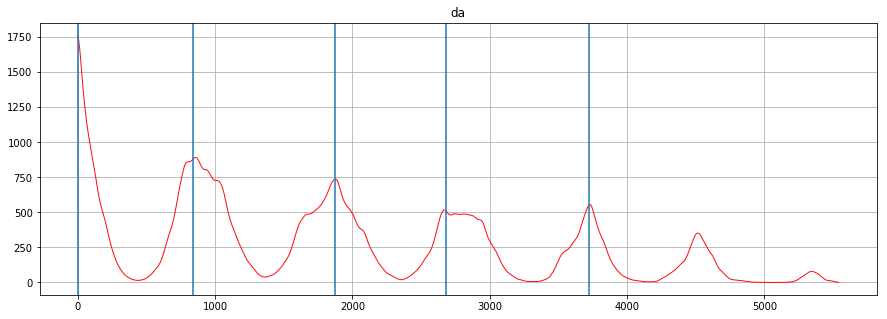

chunk number 77


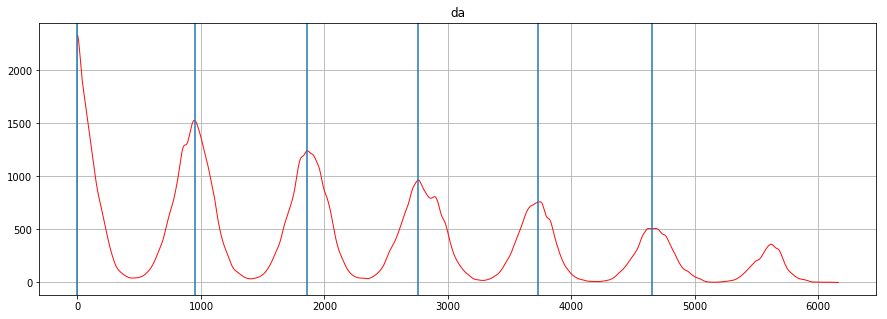

chunk number 78


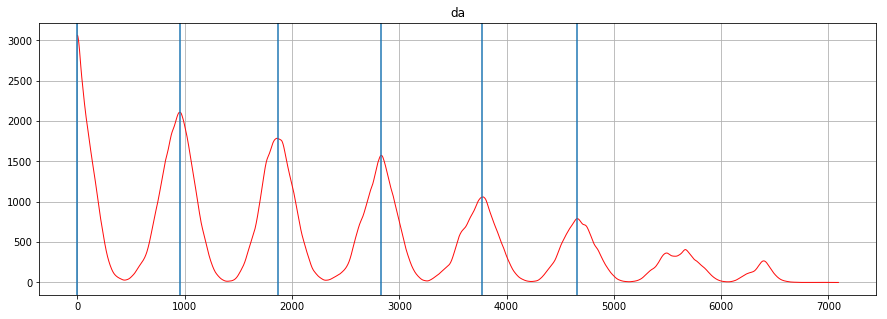

chunk number 79


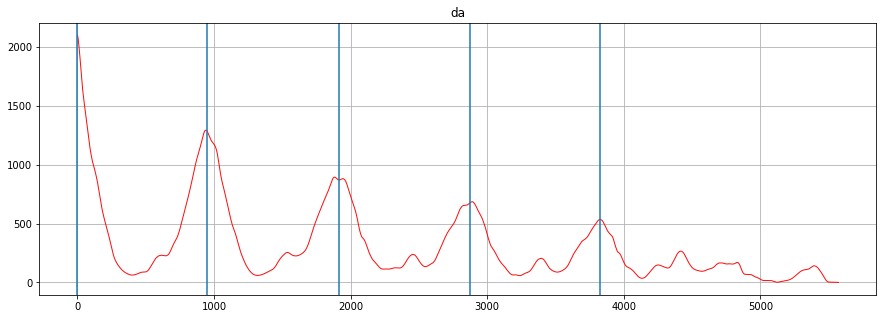

chunk number 80


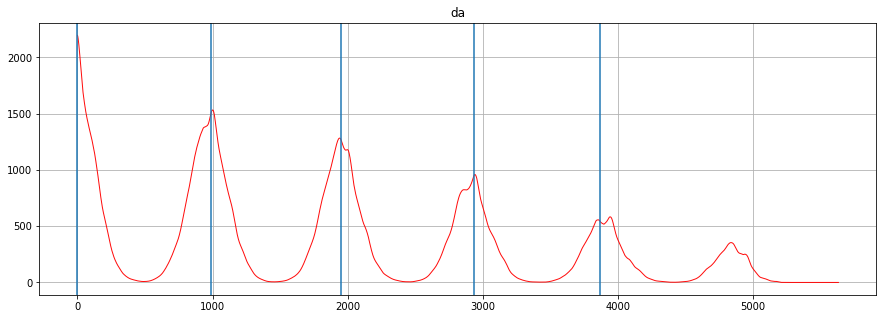

chunk number 81


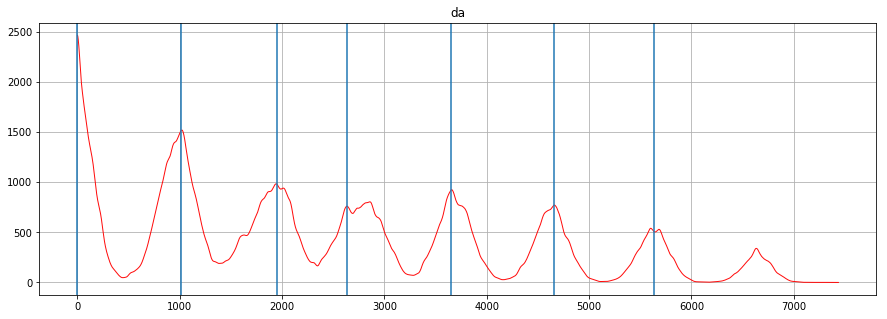

In [141]:
data = pickle.load(open(f'../../data/combined_data_prc_processed.pkl','rb+'))
# for recording in data
data_new = dict()
for rec in list(data.keys()):
    print(rec)
    data_new[rec] = dict()
    stims = data[rec]['stims_starts']
    # for span between the two stims
    for i in range(len(stims)-1):
        print(f'chunk number {i}')
        data_new[rec][i] = dict()
        start = stims[i]
        end = stims[i+1]
        chunk = data[rec]['VNA'][int(start):int(end)]
        # find period
        T, std_T = find_period(chunk)
        if (T is np.nan) or (T == np.nan) or (T is None) or (T == None) or (std_T is np.nan) or (std_T == np.nan) or (std_T is None) or (std_T == None):
            pass
        else:
            new_chunk_VNA = data[rec]['VNA'][int(start + int(1*T)):int(end + int(3*T))]
            new_chunk_PNA = data[rec]['PNA'][int(start + int(1*T)):int(end + int(3*T))]
            new_chunk_HNA = data[rec]['HNA'][int(start + int(1*T)):int(end + int(3*T))]

            data_new[rec][i] = dict()
            data_new[rec][i]['VNA'] = new_chunk_VNA
            data_new[rec][i]['PNA'] = new_chunk_PNA
            data_new[rec][i]['HNA'] = new_chunk_HNA
            data_new[rec][i]['T'] = T
            data_new[rec][i]['std_T'] = std_T
            data_new[rec][i]['stim'] = new_chunk_VNA.shape[-1] - int(3*T) 
            i_start, i_end = get_insp_phases(data_new[rec][i])
            data_new[rec][i]['i_starts'] = i_start
            data_new[rec][i]['i_ends'] = i_end
pickle.dump(data_new, open(f'../../data/prc_data_chunked.pkl','wb+'))

In [39]:
data_chunked = pickle.load(open(f'../../data/prc_data_chunked.pkl','rb+'))

In [40]:
data_chunked.keys()

dict_keys(['2019-08-22_16-18-36_p', '2019-09-05_12-26-14_p', '2019-09-04_17-49-02_p'])

In [41]:
chunk = data_chunked['2019-08-22_16-18-36_p'][2]
signal = chunk['PNA']
stim = chunk['stim']
T = chunk['T']
std_T = chunk['std_T']
i_starts = chunk['i_starts']
i_ends = chunk['i_ends']

In [42]:
#SUPERPLOT
def superplot(chunk):
    signal = chunk['PNA']
    i_starts = chunk['i_starts']
    i_ends = chunk['i_ends']
    stim = chunk['stim']
    fig = plt.figure(figsize = (15,5))
    plt.plot(signal, 'r', linewidth = 1, alpha = 0.95) # 46
    plt.axvline(stim + 47)
    plt.axvline(stim)
    for i in (i_starts):
        plt.axvline(i, color = 'g')
    for i in (i_ends):
        plt.axvline(i, color = 'k')
    plt.title(f'da')
    plt.grid(True)
    plt.show()

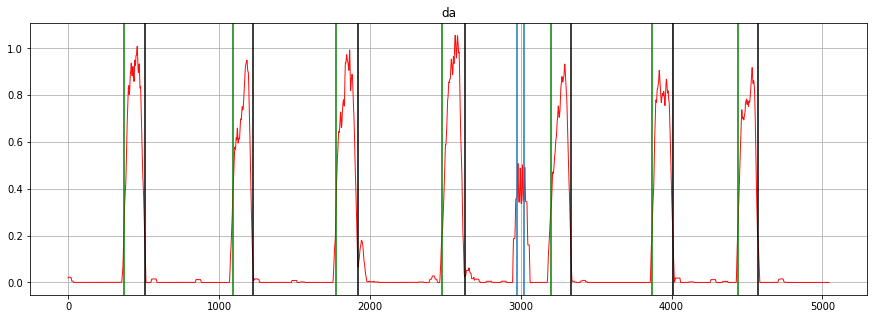

In [43]:
superplot(chunk)

In [29]:
def last_lesser_than(alist, element):
    #sorted list
    for i in range(len(alist)):
        if alist[i] >= element:
            if i - 1 < 0:
                raise ValueError("The index can't be negative.")
            else:
                return alist[i - 1], i-1

def first_greater_than(alist, element):
    for i in range(len(alist)):
        if alist[i] <= element:
            pass
        else:
            return alist[i], i
    return None    
    
def get_params(chunk):
    if not 'PNA' in list(chunk.keys()):
        print(chunk)
    signal = chunk['PNA']
    stim = chunk['stim']
    i_starts = chunk['i_starts']
    i_ends = chunk['i_ends']
    signal_filtered = savgol_filter(signal, 121, 1)
    threshold = 0.4
    signal_binary = binarise_signal(signal_filtered, threshold)
    signal_change = change(Psignal_binary)
    signal_begins = find_relevant_peaks(signal=signal_change, threshold=0.5)
    signal_ends = find_relevant_peaks(signal=-signal_change, threshold=0.5)

    ts2 = last_lesser_than(signal_begins, stim)[0]
    ts3 = first_greater_than(signal_begins, stim)[0]
    ts1 = last_lesser_than(signal_begins, ts2)[0]
    ts4 = first_greater_than(signal_begins, ts3)[0]

    te1 = first_greater_than(signal_ends, ts1)[0]
    te2 = first_greater_than(signal_ends, ts2)[0]
    te3 = first_greater_than(signal_ends, ts3)[0]
    te4 = first_greater_than(signal_ends, ts4)[0]
    Ti_0 = (te1 - ts1)
    T0 = (ts2 - ts1)
    Phi = (stim - ts2)
    Theta = (ts3 - stim)
    T1 = (ts3 - ts2)
    Ti_1 = (te3 - ts3)
    Ti_2 = (te4 - ts4)
    return Ti_0, T0, T1, Phi, Theta, Ti_1, Ti_2


get_params(chunk)

(50.0, 707.0, 723.0, 443.0, 280.0, 29.0)

In [248]:
# for all chunks in all recordings get an array of all these parameters:
parameters = []
data = pickle.load(open(f'../../data/prc_data_chunked.pkl','rb+'))
for rec in list(data.keys()):
    print(rec)
    for num in list(data[rec].keys()):
        print(num)
        if data[rec][num] != {}:
            chunk = data[rec][num]
#             superplot(chunk)
        res = get_params(chunk)
        if not res is None:
            parameters.append(res)
pickle.dump(parameters, open(f'../../data/parameters_prc.pkl','wb+'))
    

2019-08-22_prc
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
2019-09-04_prc
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
2019-09-03_prc
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
2019-09-05_prc
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56

In [2]:
parameters = pickle.load(open(f'../../data/parameters_prc.pkl','rb+'))

FileNotFoundError: [Errno 2] No such file or directory: '../../data/parameters_prc.pkl'

In [10]:
parameters_rec = []
parameters_rec.append(deepcopy(parameters[:88]))
parameters_rec.append(deepcopy(parameters[88:88+99]))
parameters_rec.append(deepcopy(parameters[88+99:88+99+80]))
parameters_rec.append(deepcopy(parameters[88+99+80:]))

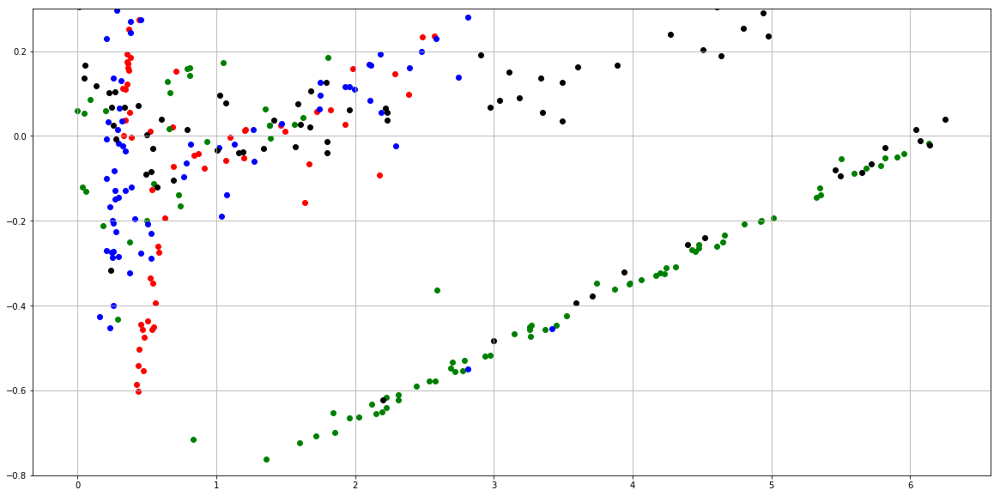

In [11]:

#plotting delta phase(phase)
fig = plt.figure(figsize=(20,10))
c = ['r','g','b','k']
for i in range(len(parameters_rec)):
    parameters = parameters_rec[i]
    data_full = np.array(parameters)
    data_const = (np.vstack([data_full[:,0]/data_full[:,1],data_full[:,-1]/data_full[:,1]])).T #T_i/T, T_i1/T
    #get rid of the outliers:
    cov = EE(contamination = 0.8).fit(data_const)
    mask = (cov.predict(data_const) + 1)//2
    mask = np.vstack([mask]*data_full.shape[1]).T
    data_filtered = ma.getdata(ma.masked_array(data_full, mask=mask))

    Ti_0s = data_filtered[:,0]
    T0s = data_filtered[:,1]
    T1s = data_filtered[:,2]
    Phis = (data_filtered[:,3]/T0s % 1.0) * 2*np.pi
    Thetas = data_filtered[:,4]
    Ti_1s = data_filtered[:,4]
    
    #further refine outliers
    #for all the phis > 2 fit the linear model
#     ransac = linear_model.RANSACRegressor()
    X = Phis.reshape(-1,1)
    y = (T1s - T0s) / T0s
#     ransac.fit(X, y)
#     new_y = ransac.predict(X)
    
#     if i == 1:
    plt.scatter(Phis, y, c=c[i])
plt.grid(True)
plt.ylim([-0.8, 0.3])
plt.show()

In [ ]:
#y = kx + b:
# k = 0.2, b = -1.25

#computational experiments:
# k = 0.158, b = -0.6241

88
99
80
85


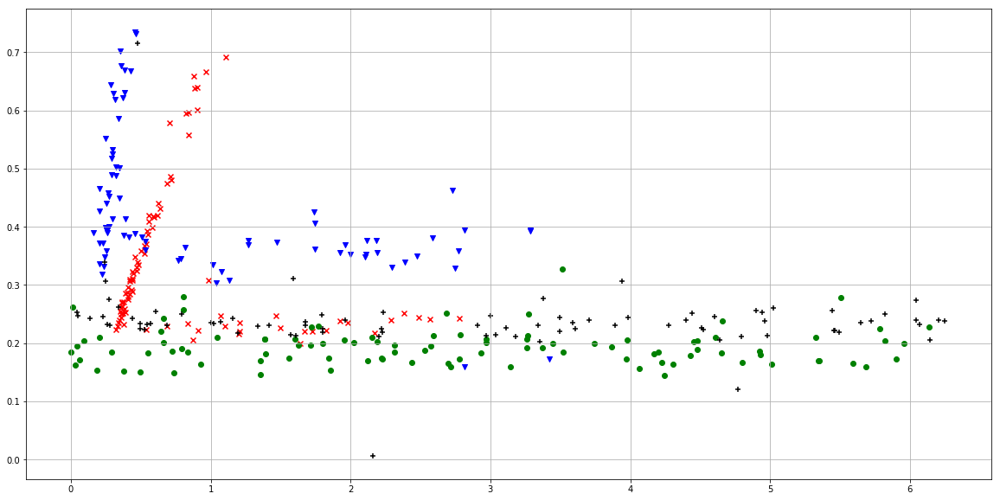

In [677]:
# whatever you want you plot here
fig = plt.figure(figsize=(20,10))
c = ['r','g','b','k']
m = ['x', 'o', 'v', '+']
for i in range(len(parameters_rec)):
    parameters = parameters_rec[i]
    print(len(parameters))
    data_full = np.array(parameters)
    data_const = (np.vstack([data_full[:,0]/data_full[:,1],data_full[:,-1]/data_full[:,1]])).T #T_i/T, T_i1/T
    #get rid of the outliers:
    cov = EE(contamination = 0.8).fit(data_const)
    mask = (cov.predict(data_const) + 1)//2
    mask = np.vstack([mask]*data_full.shape[1]).T
    data_filtered = ma.getdata(ma.masked_array(data_full, mask=mask))

    Ti_0s = data_filtered[:,0]
    T0s = data_filtered[:,1]
    T1s = data_filtered[:,2]
    Phis = (data_filtered[:,3]/T0s % 1.0) * 2*np.pi
    Thetas = data_filtered[:,4]
    Ti_1s = data_filtered[:,4]
    
    #further refine outliers
    #for all the phis > 2 fit the linear model
#     ransac = linear_model.RANSACRegressor()
    X = Phis.reshape(-1,1)
    y = Ti_0s/T0s
#     ransac.fit(X, y)
#     new_y = ransac.predict(X)
    plt.scatter(Phis, y, c=c[i], marker = m[i])
plt.grid(True)
plt.show()

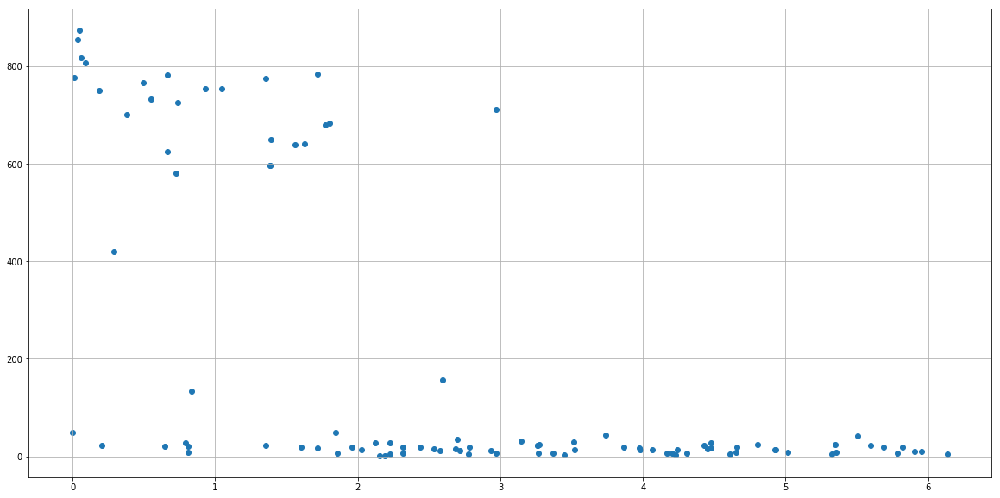

In [630]:
fig = plt.figure(figsize=(20,10))
plt.scatter(Phis, Thetas)
plt.grid(True)



# fig = plt.figure(figsize=(20,10))
# plt.plot(y_new)
# plt.grid(True)

In [616]:

def get_average_curve(x,y, bins = 100): 
    vals = list(zip(x,y))
    vals.sort(key=lambda x: x[0])
    x = np.array(list(zip(*vals))[0])
    y = np.array(list(zip(*vals))[1])
    
    new_x = np.linspace(np.min(x), np.max(x), bins)
    counts = np.zeros(bins)
    new_y = np.zeros(bins)
    for i, el in enumerate(x):
        ind = np.argmin(np.abs(new_x - el))
        counts[ind] += 1
        new_y[ind] += y[i]
    new_y = new_y/counts
    return new_x, new_y
  
x = Phis
print(np.max(x))
y = ((T1s - T0s) / T0s)

new_x, new_y = get_average_curve(x,y, bins = 50)

6.251484069504614


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


In [617]:
import pandas as pd
new_y = pd.Series(new_y).fillna(method = 'ffill').to_numpy()

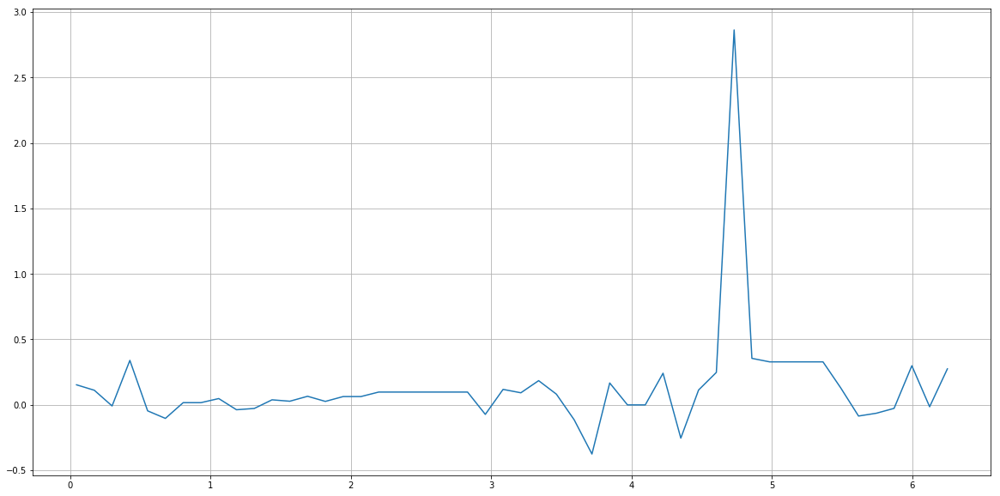

In [618]:
fig = plt.figure(figsize=(20,10))
plt.plot(new_x, new_y)
plt.grid(True)

In [619]:
x = Phis
y = T0s
new_x, new_y = get_average_curve(x,y, bins = 100)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


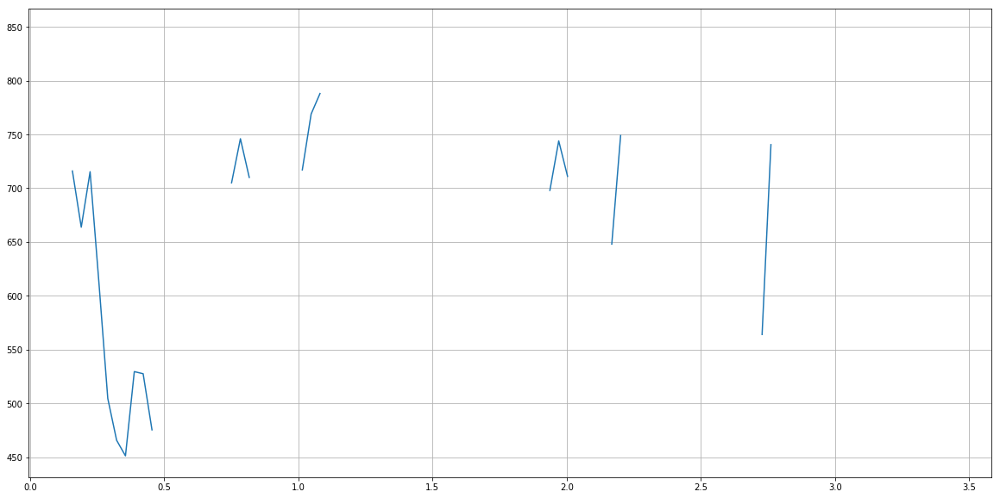

In [603]:
fig = plt.figure(figsize=(20,10))
plt.plot(new_x, new_y)
plt.grid(True)